## Blosum strategies
* This file compares using the original blosum rows as features vs. doing eigenvalue decomposition and then constructing features

In [1]:
import os, sys
import numpy as np
import json
import random
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import linalg as LA

## Preliminary

In [2]:
torch.manual_seed(12345)
k = 10000
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
na_list = ['A', 'C', 'G', 'T'] #nucleic acids
aa_list = ['R', 'L', 'S', 'A', 'G', 'P', 'T', 'V', 'N', 'D', 'C', 'Q', 'E', 'H', 'I', 'K', 'M', 'F', 'W', 'Y'] #amino acids

NNK_freq = [0.09375]*3 + [0.0625]*5 + [0.03125]*12 #freq of 21 NNK codons including the stop codon
sum_20 = 0.0625*5 + 0.09375*3 + 0.03125*12 #sum of freq without the stop codon
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*12 #normalize freq for 20 codons
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11 + \
        [1- sum([0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11)] 
        #adjust sum to 1 due to numerical issue

aa_dict = dict(zip(aa_list, pvals))
encoding_style = 'clipped'
lambda_val = 2

In [3]:
# New distribution (not NNK exactly)
#aa_list = ["A", "C", "D", "E", "F", "G", "H",  "I",  "K",  "L",  "M",  "N", "P", "Q", "R", "S", "T", "V",  "W", "Y"]
#pvals = [0.07593866356305902, 0.03631684619058439, 0.024513616151124667, 0.041131394815058675, 0.023547479168888497, 0.13123048459865624, 0.01854949620472682, 0.02172407877104557, 0.030274641454491498, 0.08833837978698246, 0.03053708795667314, 0.01740975503447508, 0.03779878792375141, 0.02613447832961611, 0.12025187445227044, 0.07884449349216138, 0.03949105780778344, 0.0859082921038843, 0.05098231963758271, 0.021076772557184122]
#aa_dict = dict(zip(aa_list, pvals))

In [4]:
# Original BLOSUM62 matrix
original_blosum62 = {}
with open('blosum62.txt', 'r') as f:
    for line in f:
        split_line = line.strip().split()
        aa = split_line[0]
        encoding = [int(x) for x in split_line[1:-3]]
        original_blosum62[aa] = encoding

In [5]:
blosum_matrix = np.zeros((20, 20))
for i, aa in enumerate(original_blosum62.keys()):
    sims = original_blosum62[aa]
    for j, s in enumerate(sims):
        blosum_matrix[i][j] = s   
u, V = LA.eig(blosum_matrix)
clipped_u = u
clipped_u[clipped_u < 0] = 0
lamb = np.diag(clipped_u)
T = V
clip_blosum62 = {}
for i, aa in enumerate(original_blosum62.keys()):
    clip_blosum62[aa] = np.dot(np.sqrt(lamb), V[i])

## Dataset

In [6]:
class BinaryDataset(Dataset):
    def __init__(self, filepath):
        def construct_binary_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((aptamer, peptide, 1))
                    ds.append((get_x(), get_y(), 0))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x

        # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y

        self.binary_ds=construct_binary_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [7]:
class EvalDataset(Dataset):
    def __init__(self, filepath):
        def construct_binary_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((aptamer, peptide, 1))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        self.binary_ds=construct_binary_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [8]:
class HalfDataset(Dataset):
    def __init__(self, filepath):
        def construct_half_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((aptamer, get_y(), 0))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x
        
         # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y

        self.binary_ds=construct_half_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [9]:
class GeneratedDataset(Dataset):
    def __init__(self, n):
        def construct_generated_dataset(k):
            S_new = []
            for _, i in enumerate(tqdm.tqdm(range(k))):
                pair = (get_x(), get_y())
                S_new.append(pair)
            np.random.shuffle(S_new)
            return S_new
        
        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x

        # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y
        self.gen_ds = construct_generated_dataset(n)
    def __len__(self):
        return len(self.gen_ds)
    
    def __getitem__(self, idx):
        return (self.gen_ds[idx])

In [10]:
binary_ds=BinaryDataset(filepath="../data/higher_quality_data.json")
n = len(binary_ds)
m = int(0.8*n) #length of train
binary_train = binary_ds[:m]
binary_val = binary_ds[m:]
#eval_ds = EvalDataset(filepath="../data/experimental_replicate_data.json")

In [11]:
#half_ds = HalfDataset(filepath="../data/higher_quality_data.json")

## NN Model

In [12]:
# Expects peptides to be encoding according to BLOSUM62 matrix
# Expects aptamers to be one hot encoded
class BlosumNet(nn.Module):
    def __init__(self):
        super(BlosumNet, self).__init__()
        self.name = "BlosumNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(4, 25, 3, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 50, 3, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(50, 25, 3, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(25, 10, 3) 
        
        # There are 20 channels
        self.cnn_pep_1 = nn.Conv1d(20, 40, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(40, 80, 3, padding=2)
        self.cnn_pep_3 = nn.Conv1d(80, 150, 3, padding=2)
        self.cnn_pep_4 = nn.Conv1d(150, 50, 3, padding=2)
        self.cnn_pep_5 = nn.Conv1d(50, 10, 3, padding=2)
        
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(790, 500)
        self.fc2 = nn.Linear(500, 200)
        self.fc3 = nn.Linear(200, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = torch.sigmoid(x)
        return x

In [13]:
# Expects peptides to be encoding according to BLOSUM62 matrix
# Expects aptamers to be one hot encoded
class BlosumLinearNet(nn.Module):
    def __init__(self):
        super(BlosumLinearNet, self).__init__()
        self.name = "BlosumLinearNet"
        self.single_alphabet = False
        
        self.fc_apt_1 = nn.Linear(160, 200) 
        self.fc_apt_2 = nn.Linear(200, 250)
        self.fc_apt_3 = nn.Linear(250, 300)
        
        self.fc_pep_1 = nn.Linear(160, 200)
        self.fc_pep_2 = nn.Linear(200, 250)
        
        self.relu = nn.ReLU()
        
        self.fc_apt = nn.Sequential(self.fc_apt_1, self.fc_apt_2, self.fc_apt_3)
        self.fc_pep = nn.Sequential(self.fc_pep_1, self.fc_pep_2)
        
        self.fc1 = nn.Linear(550, 600)
        self.fc2 = nn.Linear(600, 1)
        
    def forward(self, apt, pep):
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        
        apt = self.fc_apt(apt)
        pep = self.fc_pep(pep)
        x = torch.cat((apt, pep), 1)
        x = self.fc2(self.fc1(x))
        x = torch.sigmoid(x)
        return x

In [14]:
def weights_init(m):
    if isinstance(m, nn.Conv1d):
        nn.init.xavier_uniform_(m.weight.data, gain=nn.init.calculate_gain('relu'))
        nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight.data, nonlinearity='sigmoid')
        nn.init.zeros_(m.bias.data)

## Helper methods

In [15]:
## Takes a peptide and aptamer sequence and converts to one-hot matrix
def one_hot(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        apt = sequence[0]
        pep = sequence[1]
        one_hot = np.zeros((len(apt) + len(pep), 24))
        # Encode the aptamer first
        for i in range(len(apt)):
            char = apt[i]
            for _ in range(len(na_list)):
                idx = na_list.index(char)
                one_hot[i][idx] = 1
            
        # Encode the peptide second
        for i in range(len(pep)):
            char = pep[i]
            for _ in range(len(aa_list)):
                idx = aa_list.index(char) + len(na_list)
                one_hot[i+len(apt)][idx] = 1
        
        return one_hot       
    else:
        if seq_type == 'peptide':
            letters = aa_list
        else:
            letters = na_list
        one_hot = np.zeros((len(sequence), len(letters)))
        for i in range(len(sequence)):
            char = sequence[i]
            for _ in range(len(letters)):
                idx = letters.index(char)
                one_hot[i][idx] = 1
        return one_hot
    
## For aptamer sequence, translate
## For peptide sequence, translate and add additional biological properties
def extract_features(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        pass
    else:
        if seq_type == 'peptide':
            letters = aa_list
            encoding = np.zeros((4, len(sequence)))
            for i in range(len(sequence)):
                char = sequence[i]
                
                idx = letters.index(char)
                char_hydro = hydrophobicity[char]
                char_polar = polarity[char]
                char_vol = volume[char]
                char_charge = charge[char]
                
                # Put in the biological features of the amino acids
                encoding[0][i] = char_polar
                encoding[1][i] = char_vol
                encoding[2][i] = char_charge
                encoding[3][i] = char_hydro
        else:
            letters = na_list
            encoding = np.zeros(len(sequence))
            for i in range(len(sequence)):
                char = sequence[i]
                idx = letters.index(char)
                encoding[i] = idx
        return encoding 

def blosum62_encoding(sequence, seq_type='peptide', single_alphabet=False, style=encoding_style):
    if single_alphabet:
        pass
    else:
        if seq_type == 'peptide':
            encoding = []
            for i in range(len(sequence)):
                if style == "clipped":
                    encoding.append(clip_blosum62[sequence[i]])
                else:
                    encoding.append(original_blosum62[sequence[i]])
            encoding = np.asarray(encoding)
        else:
            #Translation
            letters = na_list
            encoding = np.zeros(len(sequence))
            for i in range(len(sequence)):
                char = sequence[i]
                idx = letters.index(char)
                encoding[i] = idx
        return encoding 

## Takes a peptide and aptamer sequence and converts to directly translated sequence
def translate(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        apt = sequence[0]
        pep = sequence[1]
        
        encoding = np.zeros(len(apt) + len(pep))
        
        # Encode the aptamer first
        for i in range(len(apt)):
            char = apt[i]
            idx = na_list.index(char)
            encoding[i] = idx
            
        # Encode the peptide second
        for i in range(len(pep)):
            char = pep[i]
            idx = aa_list.index(char)
            encoding[i+len(apt)] = idx
        return encoding     
    else:
        if seq_type == 'peptide':
            letters = aa_list
        else:
            letters = na_list
        
        encoding = np.zeros(len(sequence))
        for i in range(len(sequence)):
            char = sequence[i]
            idx = letters.index(char)
            encoding[i] = idx
        return encoding

# Convert a pair to one-hot tensor
def convert(apt, pep, label, single_alphabet=False): 
    if single_alphabet:
        pair = translate([apt, pep], single_alphabet=True) #(2, 40)
        pair = torch.FloatTensor(np.reshape(pair, (-1, pair.shape[0], pair.shape[1]))).to(device)
        label = torch.FloatTensor([[label]]).to(device)
        return pair, label
    else:
        apt = one_hot(apt, seq_type='aptamer') 
        pep = blosum62_encoding(pep, seq_type='peptide') 
        apt = torch.FloatTensor(np.reshape(apt, (-1, apt.shape[1], apt.shape[0]))).to(device) #(1, 1, 40)
        pep = torch.FloatTensor(np.reshape(pep, (-1, pep.shape[1], pep.shape[0]))).to(device) #(1, 1, 8)
        
        label = torch.FloatTensor([[label]]).to(device)
        return apt, pep, label

# Getting the output of the model for a pair (aptamer, peptide)
def update(x, y, p, single_alphabet=False):
    if single_alphabet:
        p.requires_grad=True
        p = p.to(device)
        out = model(p)
        return out
    else:
        x.requires_grad=True
        y.requires_grad=True
        x = x.to(device)
        y = y.to(device)
        out = model(x, y)
        return out

## Plotting functions
def plot_loss(iters, train_losses, val_losses, model_name, model_id):
    plt.title("Loss Curve")
    plt.plot(train_losses, label="Train")
    plt.plot(val_losses, label="Validation")
    plt.xlabel("%d Iterations" %iters)
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.savefig('plots/binary/%s/%s/loss.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_accuracy(iters, train_acc, val_acc, model_name, model_id):
    plt.title("Training Accuracy Curve")
    plt.plot(train_acc, label="Train")
    plt.plot(val_acc, label="Validation")
    plt.xlabel("%d Iterations" %iters)
    plt.ylabel("Accuracy")
    plt.legend(loc='best')
    plt.savefig('plots/binary/%s/%s/accuracy.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_histogram(train_gen_scores, train_scores, val_gen_scores, val_scores, model_name, model_id):
    fig, ax = plt.subplots()
    plt.xlim(0, 1.1)
    
    sns.distplot(train_gen_scores , color="skyblue", label='Generated Train Samples', ax=ax)
    sns.distplot(val_gen_scores, color='dodgerblue', label='Generated Validation Samples')
    sns.distplot(train_scores , color="lightcoral", label='Dataset Train Samples', ax=ax)
    sns.distplot(val_scores, color='red', label='Dataset Validation Samples', ax=ax)
    
    ax.set_title("Categorizing the output scores of the model")
    ax.figure.set_size_inches(7, 4)
    ax.legend()
    plt.savefig('plots/binary/%s/%s/histogram.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_ecdf_test(test_score, iters, epoch, gamma, model_name, model_id):
    test_idx = np.argsort(test_score)
    test_id = test_idx >= 10000
    test = np.sort(test_score)
    test_c = ""
    for m in test_id:
        if m:
            test_c += "y"
        else:
            test_c += "g"
    n = test_score.size
    y = np.arange(1, n+1) / n
    plt.scatter(y, test, c=test_c, label='Test CDF')
    plt.ylabel("CDF")
    plt.xlabel("Most recent 10,000 samples after training %d samples" %iters)
    plt.title('Test CDF at epoch %d' %epoch + ", Gamma:%.5f" %gamma)
    plt.legend()
    plt.savefig('plots/binary/%s/%s/test_cdf.png' %(model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_ecdf_train(train_score, iters, epoch, gamma, model_name, model_id):
    train_idx = np.argsort(train_score)
    train_id = train_idx >= 10000
    train = np.sort(train_score)
    train_c = "" #colors
    for l in train_id:
        if l:
            train_c += "r"
        else:
            train_c += "b"
    n = train_score.size
    y = np.arange(1, n+1) / n
    plt.scatter(y, train, c=train_c, label='Train CDF')
    plt.ylabel("CDF")
    plt.xlabel("Most recent 10,000 samples after training %d samples" % iters)
    plt.title('Train CDF at epoch %d' %epoch+ ", Gamma:%.5f" %gamma)
    plt.legend()
    plt.savefig('plots/binary/%s/%s/train_cdf.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def auc_cdf(train, new, model_name, model_id, val=False): 
    #train is the sorted list of outputs from the model with training pairs as inputs
    #new is the list of outputs from the model with generated pairs as inputs
    a = train + new
    n = len(a)
    m = len(train)
    train = np.asarray(train)
    new = np.asarray(new)
    y = np.arange(0, m+2)/m
    gamma = [0]
    for x in train:
        gamma.append(sum(a<=x)/n)
    gamma.append(1)
    plt.plot(gamma, y)
    if val:
        plt.title("Validation CDF")
    else:
        plt.title("Train CDF")
    plt.xlim([0,1])
    if val:
        plt.savefig('plots/binary/%s/%s/val_cdf.png' % (model_name, model_id), bbox_inches='tight')
    else:
        plt.savefig('plots/binary/%s/%s/train_cdf.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()
    plt.close()
    return np.trapz(y, gamma)

## Binary Classification

In [16]:
if device == torch.cuda:
    torch.cuda.empty_cache()

In [17]:
def classifier(model, 
               train, 
               val,
               lr,
               model_id,
               num_epochs=50,
               batch_size=16,
               single_alphabet=False,
               run_from_checkpoint=None, 
               save_checkpoints=None,
               cdf=False):
    
    if run_from_checkpoint is not None:
        checkpointed_model = run_from_checkpoint
        checkpoint = torch.load(checkpointed_model)
        optimizer = SGD(model.parameters(), lr=lr)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        init_epoch = checkpoint['epoch'] +1
        print("Reloading model: ", model.name, " at epoch: ", init_epoch)
    else:
        model.apply(weights_init)
        optimizer = SGD(model.parameters(), lr=lr)
        init_epoch = 0
    
    train_losses, val_losses, train_losses_avg, val_losses_avg, train_acc, val_acc = [], [], [], [], [], []
    
    iters, train_correct, val_correct = 0, 0, 0
    criterion = nn.BCELoss()
    scheduler = StepLR(optimizer, step_size=10, gamma=0.9) #Decays lr by gamma factor every step_size epochs. 
    
    # Keep track of the scores across four classes
    train_scores, train_gen_scores, val_scores, val_gen_scores = [], [], [], []
    
    # TP, TN, FP, FN
    train_stats = [0, 0, 0, 0]
    val_stats = [0, 0, 0, 0]
    
    for epoch in range(num_epochs):
        total_train_loss = 0
        total_val_loss = 0
        full_epoch = epoch + init_epoch
        print("Starting epoch: %d" % full_epoch, " with learning rate: ", scheduler.get_lr())
        for i, (apt, pep, label) in enumerate(tqdm.tqdm(train)):
            model_name = model.name
            model.train()
            if single_alphabet:
                p, l = convert(apt, pep, label, single_alphabet=True)
                train_score = update(None, None, p, single_alphabet=True)
            else:
                a, p, l = convert(apt, pep, label, single_alphabet=False)
                train_score = update(a, p, None, single_alphabet=False)
                
            lam = 1
            # The original label is non binding
            if label == 0.0:
                train_gen_scores.append(train_score.item())
                # Score is non binding
                if train_score.item() < 0.5:
                    train_stats[1] += 1
                    train_correct += 1
                # Score is binding
                else:
                    lam = lambda_val
                    train_stats[2] += 1
            # The original label is binding
            elif label == 1.0:
                train_scores.append(train_score.item())
                # The score is binding
                if train_score.item() >= 0.5:
                    train_correct += 1
                    train_stats[0] += 1
                # The score is nonbinding
                else:
                    train_stats[3] += 1
                    lam = lambda_val
                
            iters += 1
            train_loss = criterion(train_score, l)
            total_train_loss += lam * train_loss

            
            if iters % batch_size == 0:
                ave_train_loss = total_train_loss/batch_size
                train_losses.append(ave_train_loss.item())
                optimizer.zero_grad()
                ave_train_loss.backward()
                optimizer.step()
                total_train_loss = 0

            if iters % 5000 == 0:
                train_acc.append(100*train_correct/iters)
                train_losses_avg.append(np.average(train_losses[-5000:]))

            with torch.no_grad():
                model.eval()
            
            if single_alphabet:
                p_val, l_val = convert(val[iters%(n-m)][0], val[iters%(n-m)][1], val[iters%(n-m)][2], single_alphabet=True)
                val_score = model(p_val)
            else:
                a_val, p_val, l_val = convert(val[iters%(n-m)][0], val[iters%(n-m)][1], val[iters%(n-m)][2])
                val_score = model(a_val, p_val)
            
            lam = 1
            if l_val.item() == 0.0:
                val_gen_scores.append(val_score.item())
                if val_score.item() < 0.5:
                    val_stats[1] += 1
                    val_correct += 1
                else:
                    lam = lambda_val
                    val_stats[2] += 1
            if l_val.item() == 1.0:
                val_scores.append(val_score.item())
                if val_score.item() >= 0.5:
                    val_stats[0] += 1
                    val_correct += 1
                else:
                    val_stats[3] += 1
                    lam = lambda_val

            val_loss = criterion(val_score, l_val) 
            total_val_loss += lam * val_loss

            if iters % batch_size == 0:
                ave_val_loss = total_val_loss/batch_size
                val_losses.append(ave_val_loss.item())
                total_val_loss = 0
            if iters % 5000 == 0:
                val_acc.append(100*val_correct/iters)
                val_losses_avg.append(np.average(val_losses[-5000:]))
                
            if iters % 50000 == 0:
                plot_loss(iters, train_losses_avg, val_losses_avg, model_name, model_id)
                plot_accuracy(iters, train_acc, val_acc, model_name, model_id)
                plot_histogram(train_gen_scores, train_scores, val_gen_scores, val_scores, model_name, model_id)
                val_auc = auc_cdf(sorted(val_scores[-1000:]), sorted(val_gen_scores[-10000:]), model_name, model_id, val=True)
                train_auc = auc_cdf(sorted(train_scores[-1000:]), sorted(train_gen_scores[-10000:]), model_name, model_id)
                
                print("Training Accuracy at epoch %d: {}".format(train_acc[-1]) %full_epoch)
                print("Validation Accuracy epoch %d: {}".format(val_acc[-1]) %full_epoch)
                print("Training AUC at epoch %d: {}".format(train_auc) % full_epoch)
                print("Validation AUC epoch %d: {}".format(val_auc) % full_epoch)
                print("Train: Sensitivity: " + str(train_stats[0]/(train_stats[0] + train_stats[3])) + " Specificity: " + str(train_stats[1]/(train_stats[2] + train_stats[1])))
                print("Val: Sensitivity: " + str(val_stats[0]/(val_stats[0] + val_stats[3])) + " Specificity: " + str(val_stats[1]/(val_stats[2] + val_stats[1])))

        scheduler.step()
        if save_checkpoints is not None:
            print("Saving to: ", save_checkpoints)
            checkpoint_name = save_checkpoints
            torch.save({'epoch': full_epoch,
                        'model_state_dict': model.state_dict(), 
                        'optimizer_state_dict': optimizer.state_dict()}, checkpoint_name)
        
        # Clear unused gpu memory at the end of the epoch
        if device == torch.cuda:
            torch.cuda.empty_cache()

  0%|          | 0/491198 [00:00<?, ?it/s]

Starting epoch: 0  with learning rate:  [0.0007]


 10%|█         | 49996/491198 [03:13<28:15, 260.29it/s]

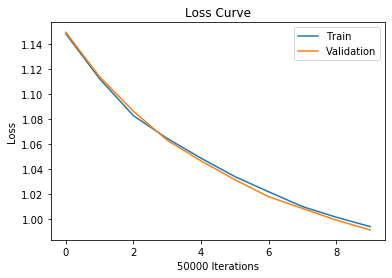

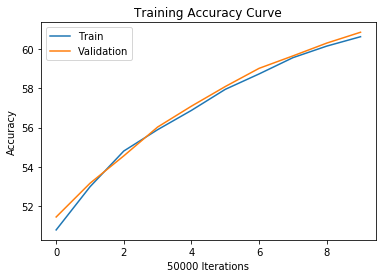

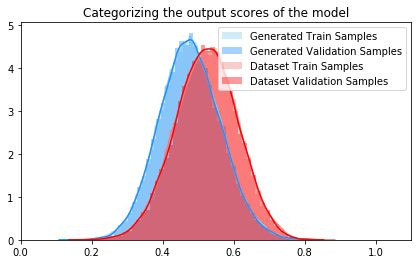

 10%|█         | 49996/491198 [03:30<28:15, 260.29it/s]

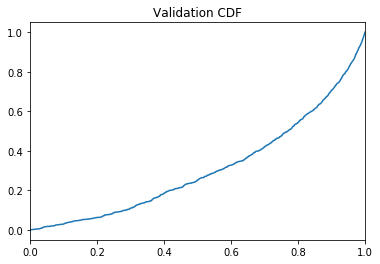

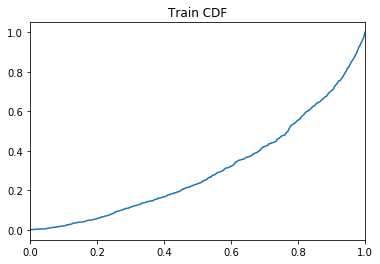

 10%|█         | 50033/491198 [04:09<358:30:41,  2.93s/it]

Training Accuracy at epoch 0: 60.64
Validation Accuracy epoch 0: 60.868
Training AUC at epoch 0: 0.3063797272727273
Validation AUC epoch 0: 0.3098042727272727
Train: Sensitivity: 0.6056969115058409 Specificity: 0.6071028635418333
Val: Sensitivity: 0.6055273367195937 Specificity: 0.6118334200104012


 20%|██        | 99970/491198 [07:20<27:22, 238.13it/s]   

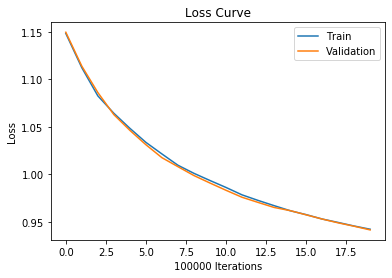

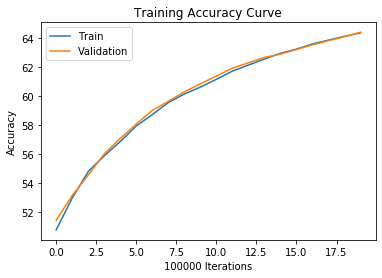

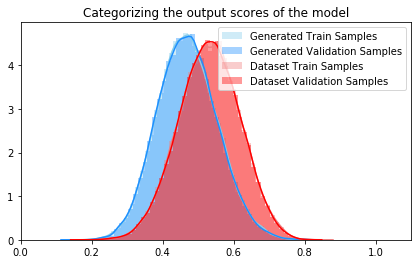

 20%|██        | 99970/491198 [07:40<27:22, 238.13it/s]

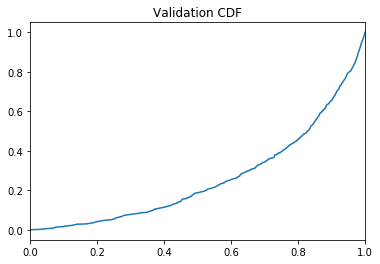

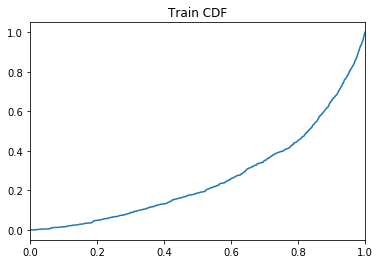

 20%|██        | 100032/491198 [08:16<42:56:17,  2.53it/s]

Training Accuracy at epoch 0: 64.381
Validation Accuracy epoch 0: 64.428
Training AUC at epoch 0: 0.26380745454545457
Validation AUC epoch 0: 0.2603774545454546
Train: Sensitivity: 0.6422344849648113 Specificity: 0.64538652368758
Val: Sensitivity: 0.6416378154455763 Specificity: 0.6469189102756291


 31%|███       | 149981/491198 [11:29<23:20, 243.67it/s]  

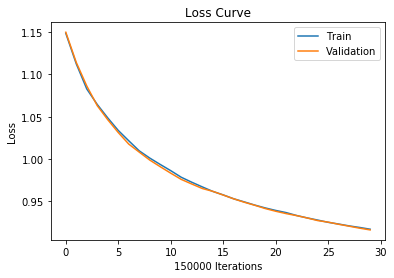

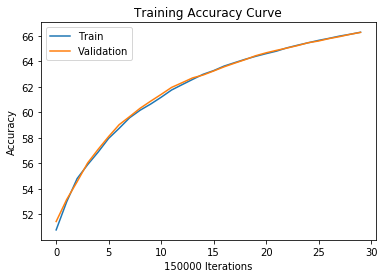

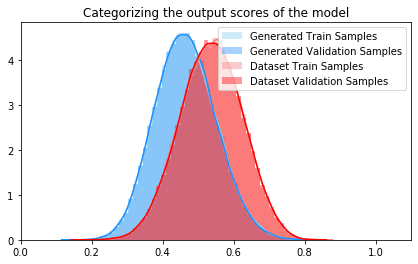

 31%|███       | 149981/491198 [11:40<23:20, 243.67it/s]

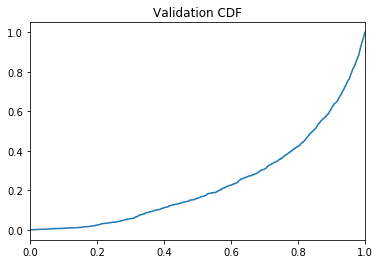

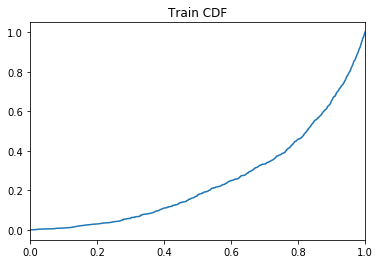

 31%|███       | 150016/491198 [12:25<58:43:44,  1.61it/s]

Training Accuracy at epoch 0: 66.27
Validation Accuracy epoch 0: 66.25866666666667
Training AUC at epoch 0: 0.2526909090909091
Validation AUC epoch 0: 0.23909109090909092
Train: Sensitivity: 0.6615398956002982 Specificity: 0.6638630780732672
Val: Sensitivity: 0.6595667966454783 Specificity: 0.6655972096490761


 41%|████      | 199992/491198 [15:31<18:39, 260.08it/s]  

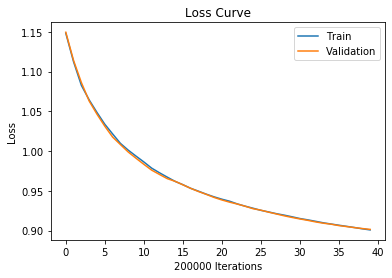

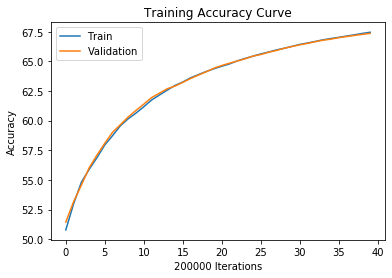

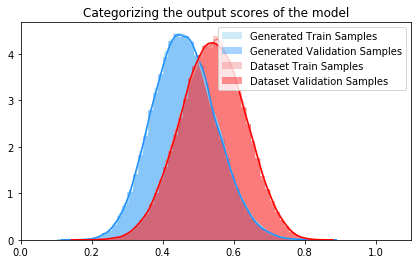

 41%|████      | 199992/491198 [15:50<18:39, 260.08it/s]

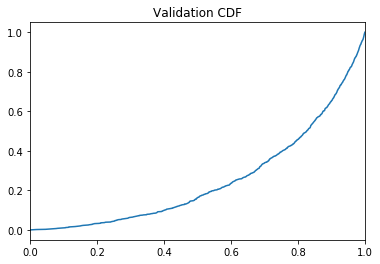

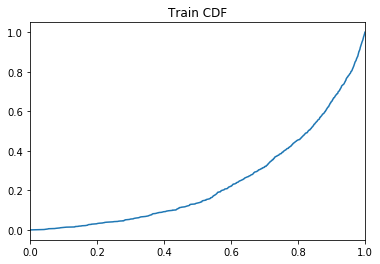

 41%|████      | 200034/491198 [16:29<124:53:04,  1.54s/it]

Training Accuracy at epoch 0: 67.4595
Validation Accuracy epoch 0: 67.3615
Training AUC at epoch 0: 0.24201790909090912
Validation AUC epoch 0: 0.2510554545454545
Train: Sensitivity: 0.6732375509551595 Specificity: 0.6759548402594283
Val: Sensitivity: 0.670780613984079 Specificity: 0.6764347982205908


 51%|█████     | 249993/491198 [19:52<18:16, 219.96it/s]   

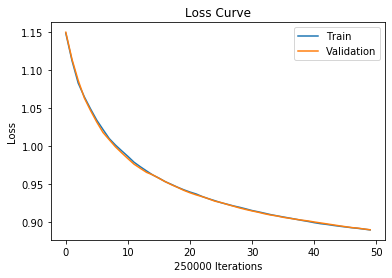

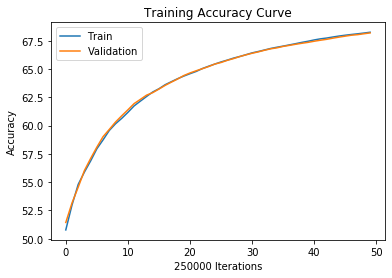

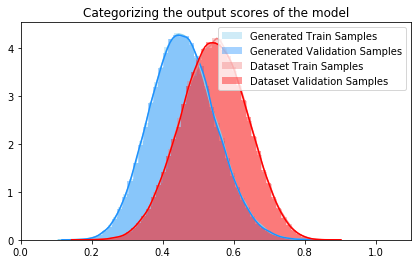

 51%|█████     | 249993/491198 [20:11<18:16, 219.96it/s]

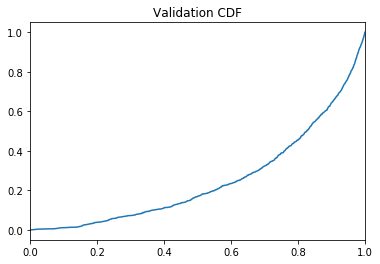

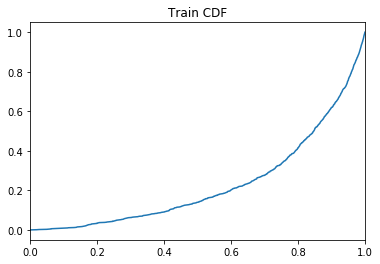

 51%|█████     | 250034/491198 [20:50<117:02:48,  1.75s/it]

Training Accuracy at epoch 0: 68.2564
Validation Accuracy epoch 0: 68.1972
Training AUC at epoch 0: 0.22971136363636363
Validation AUC epoch 0: 0.2510880909090909
Train: Sensitivity: 0.681611949836249 Specificity: 0.6835189488021793
Val: Sensitivity: 0.679190681940247 Specificity: 0.6847420820259794


 61%|██████    | 299994/491198 [24:10<13:43, 232.09it/s]   

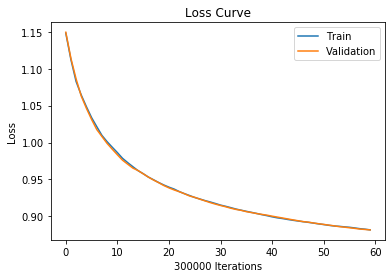

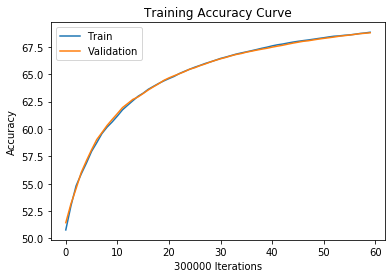

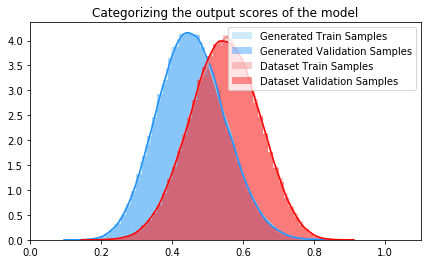

 61%|██████    | 299994/491198 [24:21<13:43, 232.09it/s]

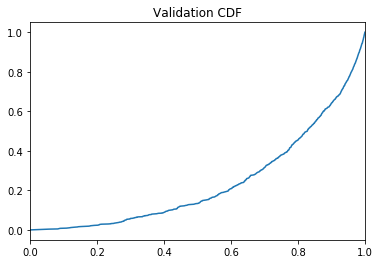

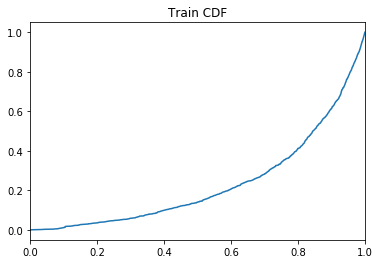

 61%|██████    | 300032/491198 [25:09<108:35:48,  2.05s/it]

Training Accuracy at epoch 0: 68.82333333333334
Validation Accuracy epoch 0: 68.77466666666666
Training AUC at epoch 0: 0.23235472727272727
Validation AUC epoch 0: 0.23847436363636365
Train: Sensitivity: 0.6869566955096821 Specificity: 0.6895120665612469
Val: Sensitivity: 0.6848722093815549 Specificity: 0.6906095727269098


 71%|███████   | 349974/491198 [28:28<10:06, 233.00it/s]   

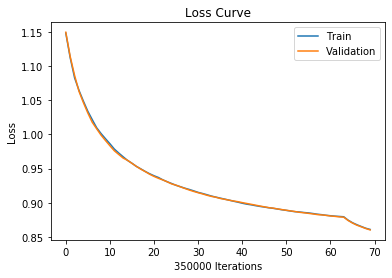

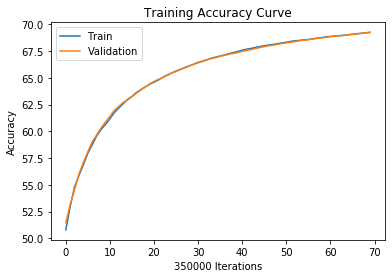

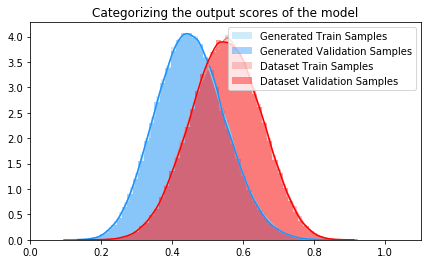

 71%|███████   | 349974/491198 [28:42<10:06, 233.00it/s]

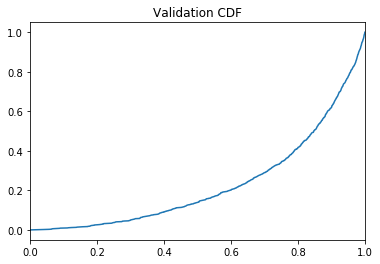

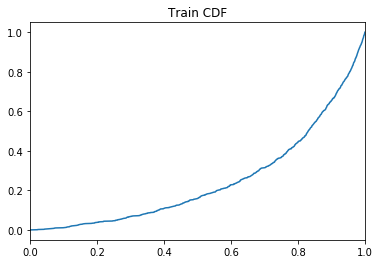

 71%|███████▏  | 350016/491198 [29:33<20:34:18,  1.91it/s]

Training Accuracy at epoch 0: 69.23571428571428
Validation Accuracy epoch 0: 69.25571428571429
Training AUC at epoch 0: 0.24791536363636363
Validation AUC epoch 0: 0.23017809090909092
Train: Sensitivity: 0.69140326244535 Specificity: 0.6933132716225957
Val: Sensitivity: 0.6901647231322596 Specificity: 0.6949385418804588


 81%|████████▏ | 399965/491198 [32:49<05:28, 277.94it/s]  

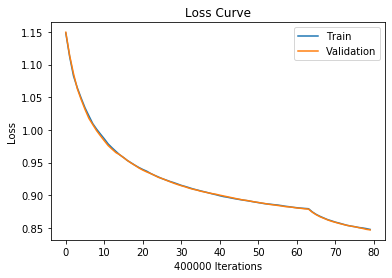

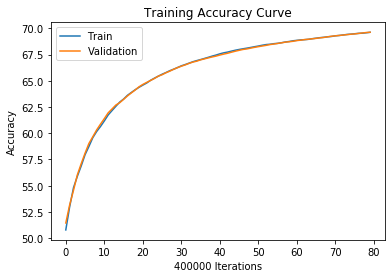

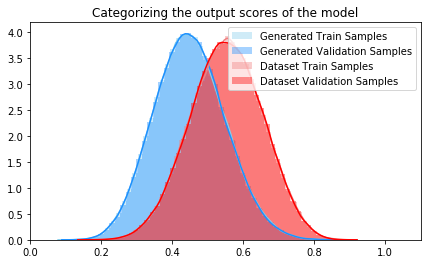

 81%|████████▏ | 399965/491198 [33:02<05:28, 277.94it/s]

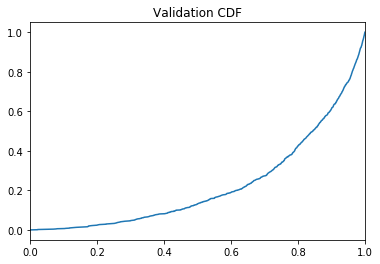

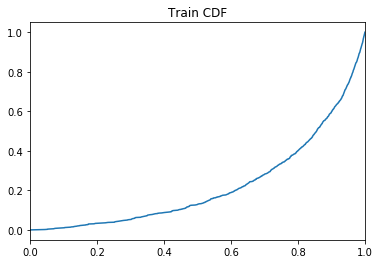

 81%|████████▏ | 400033/491198 [33:48<9:03:10,  2.80it/s] 

Training Accuracy at epoch 0: 69.6315
Validation Accuracy epoch 0: 69.63625
Training AUC at epoch 0: 0.222792
Validation AUC epoch 0: 0.22420372727272725
Train: Sensitivity: 0.6949933301024717 Specificity: 0.6976386936006045
Val: Sensitivity: 0.6938407430787267 Specificity: 0.6988742402618788


 92%|█████████▏| 449989/491198 [37:11<03:00, 228.15it/s] 

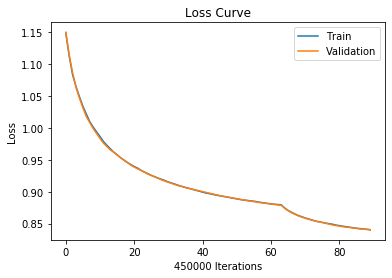

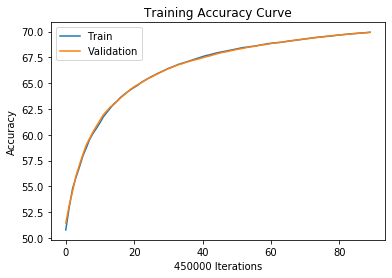

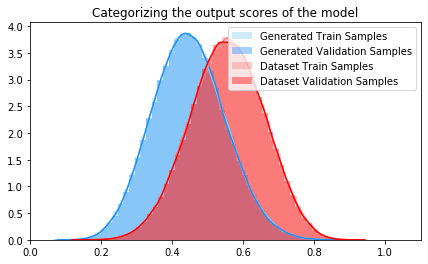

 92%|█████████▏| 449989/491198 [37:23<03:00, 228.15it/s]

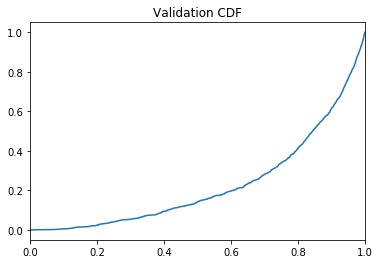

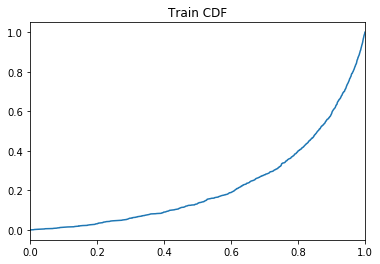

 92%|█████████▏| 450031/491198 [38:10<13:00:13,  1.14s/it]

Training Accuracy at epoch 0: 69.93511111111111
Validation Accuracy epoch 0: 69.92422222222223
Training AUC at epoch 0: 0.22324481818181816
Validation AUC epoch 0: 0.2273971818181818
Train: Sensitivity: 0.6977581265136534 Specificity: 0.7009445913808815
Val: Sensitivity: 0.6966086445267959 Specificity: 0.7018644007663379


  0%|          | 28/491198 [00:00<29:19, 279.19it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 1  with learning rate:  [0.0007]


  2%|▏         | 8793/491198 [00:35<34:39, 232.01it/s]

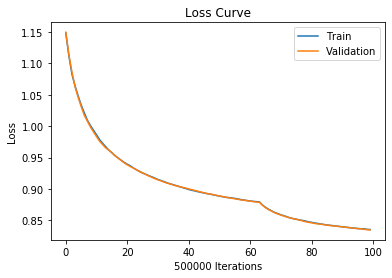

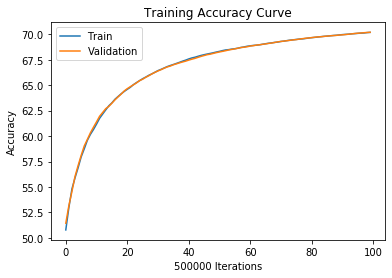

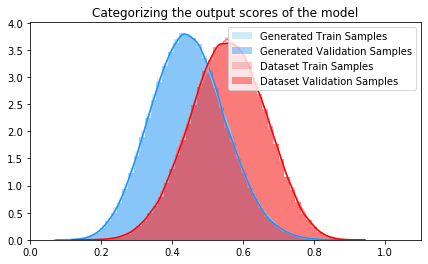

  2%|▏         | 8793/491198 [00:50<34:39, 232.01it/s]

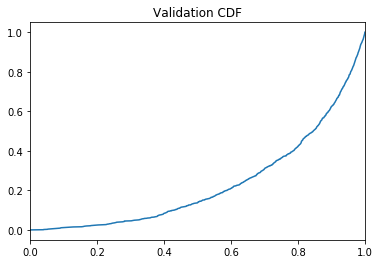

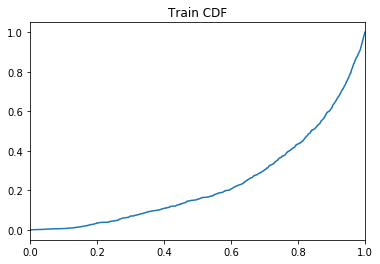

  2%|▏         | 8834/491198 [01:33<183:17:03,  1.37s/it]

Training Accuracy at epoch 1: 70.183
Validation Accuracy epoch 1: 70.199
Training AUC at epoch 1: 0.23893945454545454
Validation AUC epoch 1: 0.23219781818181817
Train: Sensitivity: 0.7006475855452511 Specificity: 0.7030139289145053
Val: Sensitivity: 0.6997519107680346 Specificity: 0.7042192795806669


 12%|█▏        | 58800/491198 [04:54<28:10, 255.84it/s]  

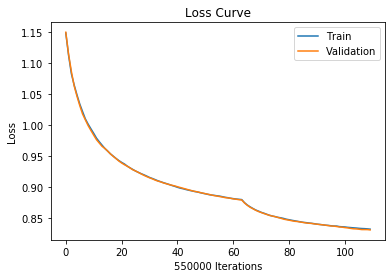

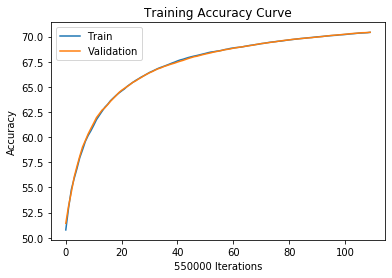

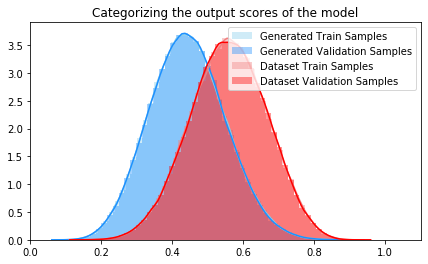

 12%|█▏        | 58800/491198 [05:10<28:10, 255.84it/s]

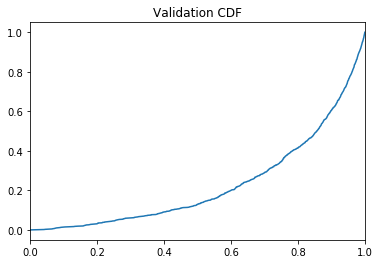

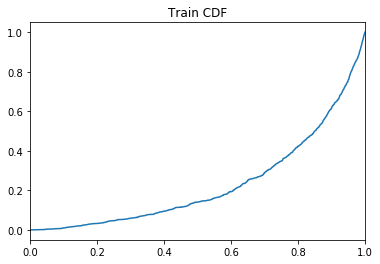

 12%|█▏        | 58818/491198 [05:53<745:10:00,  6.20s/it] 

Training Accuracy at epoch 1: 70.4129090909091
Validation Accuracy epoch 1: 70.42672727272728
Training AUC at epoch 1: 0.2302698181818182
Validation AUC epoch 1: 0.2281400909090909
Train: Sensitivity: 0.7028500601562244 Specificity: 0.7054092104640883
Val: Sensitivity: 0.7020160981777505 Specificity: 0.7065093137948679


 22%|██▏       | 108785/491198 [09:07<24:01, 265.25it/s]  

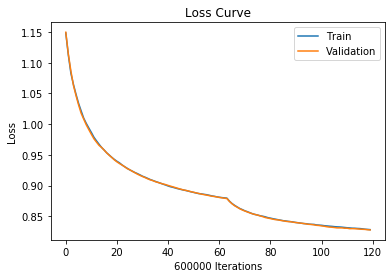

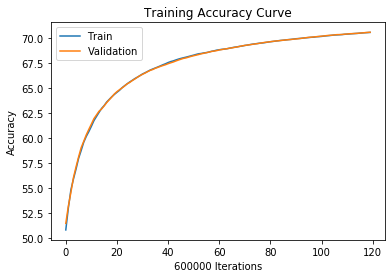

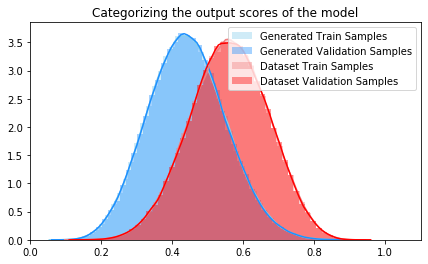

 22%|██▏       | 108785/491198 [09:20<24:01, 265.25it/s]

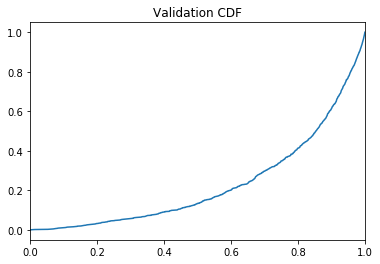

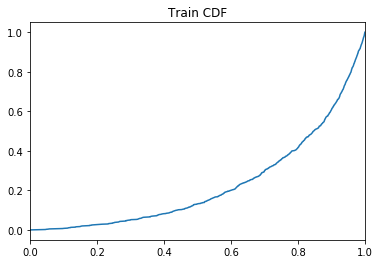

 22%|██▏       | 108836/491198 [10:06<77:51:22,  1.36it/s] 

Training Accuracy at epoch 1: 70.60166666666667
Validation Accuracy epoch 1: 70.62
Training AUC at epoch 1: 0.22807554545454545
Validation AUC epoch 1: 0.2293581818181818
Train: Sensitivity: 0.705060849460467 Specificity: 0.7069735486087255
Val: Sensitivity: 0.7042747091955022 Specificity: 0.7081168636789974


 32%|███▏      | 158773/491198 [13:13<21:25, 258.60it/s]  

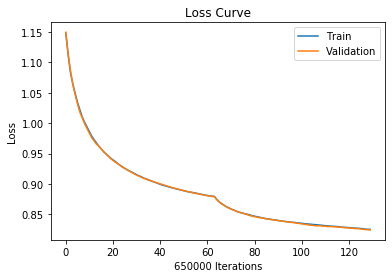

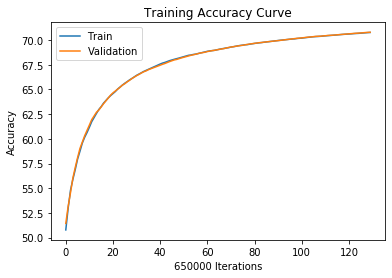

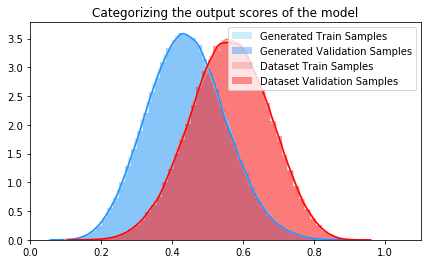

 32%|███▏      | 158773/491198 [13:31<21:25, 258.60it/s]

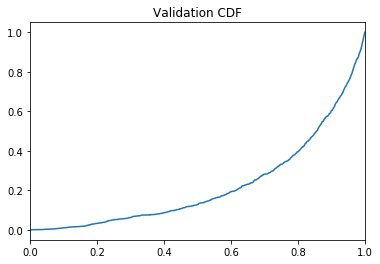

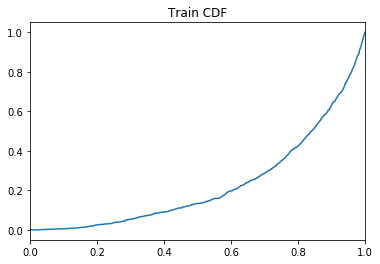

 32%|███▏      | 158837/491198 [14:14<40:59:18,  2.25it/s]

Training Accuracy at epoch 1: 70.77138461538462
Validation Accuracy epoch 1: 70.79707692307693
Training AUC at epoch 1: 0.22931272727272728
Validation AUC epoch 1: 0.22406572727272728
Train: Sensitivity: 0.7069356733057439 Specificity: 0.708493197928278
Val: Sensitivity: 0.7061186612075769 Specificity: 0.7098155063135656


 43%|████▎     | 208775/491198 [17:35<23:20, 201.64it/s]  

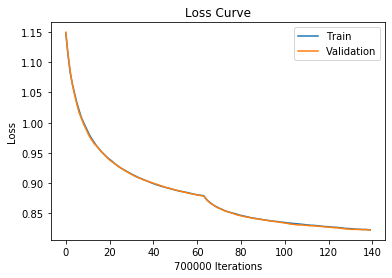

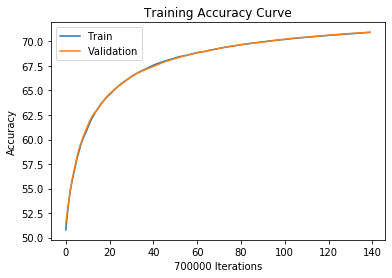

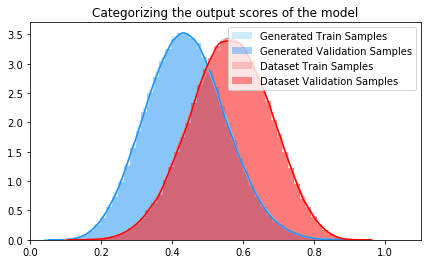

 43%|████▎     | 208775/491198 [17:51<23:20, 201.64it/s]

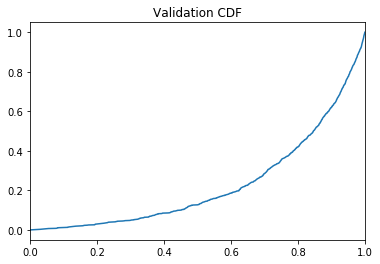

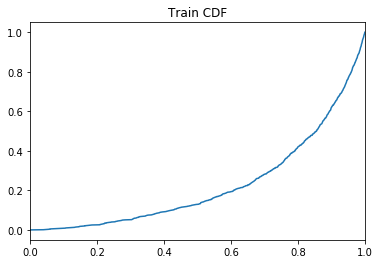

 43%|████▎     | 208834/491198 [18:34<36:43:31,  2.14it/s]

Training Accuracy at epoch 1: 70.92571428571429
Validation Accuracy epoch 1: 70.93857142857142
Training AUC at epoch 1: 0.22665945454545453
Validation AUC epoch 1: 0.2276191818181818
Train: Sensitivity: 0.7083859214291017 Specificity: 0.7101293904412311
Val: Sensitivity: 0.7075431713393854 Specificity: 0.7112197485818534


 53%|█████▎    | 258777/491198 [21:53<16:28, 235.08it/s]  

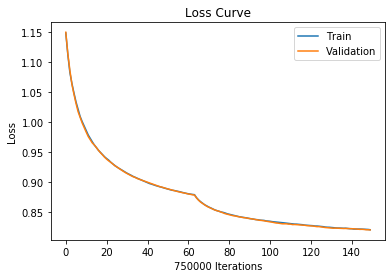

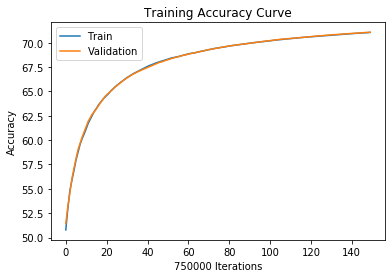

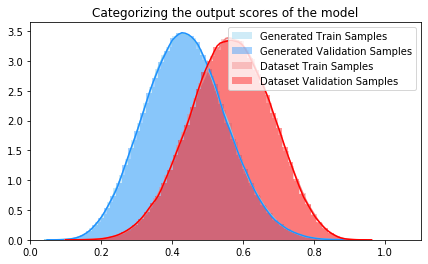

 53%|█████▎    | 258777/491198 [22:11<16:28, 235.08it/s]

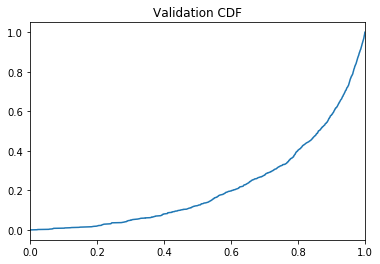

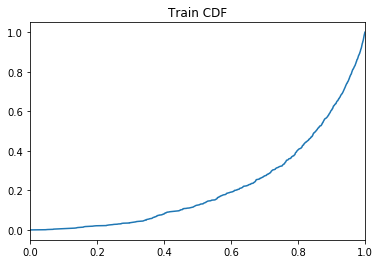

 53%|█████▎    | 258818/491198 [22:54<33:02:14,  1.95it/s]

Training Accuracy at epoch 1: 71.06533333333333
Validation Accuracy epoch 1: 71.08386666666667
Training AUC at epoch 1: 0.2180640909090909
Validation AUC epoch 1: 0.21754400000000002
Train: Sensitivity: 0.7099159350395012 Specificity: 0.7113919321047786
Val: Sensitivity: 0.7090276961229703 Specificity: 0.7126419653216106


 63%|██████▎   | 308801/491198 [26:12<11:40, 260.36it/s]  

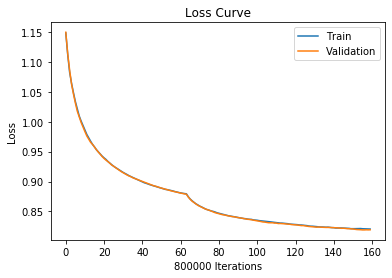

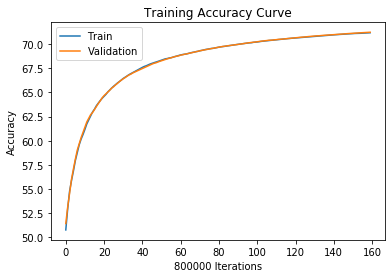

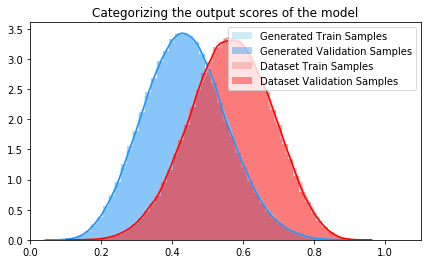

 63%|██████▎   | 308801/491198 [26:32<11:40, 260.36it/s]

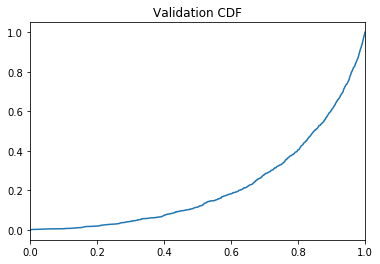

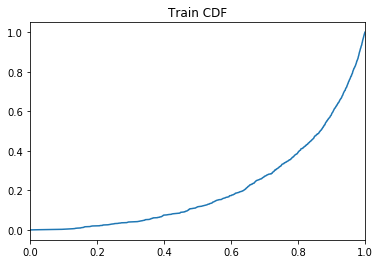

 63%|██████▎   | 308837/491198 [27:14<653:27:02, 12.90s/it]

Training Accuracy at epoch 1: 71.155625
Validation Accuracy epoch 1: 71.2085
Training AUC at epoch 1: 0.21111245454545452
Validation AUC epoch 1: 0.2183551818181818
Train: Sensitivity: 0.7108229974644333 Specificity: 0.7122906215989692
Val: Sensitivity: 0.7102718518592743 Specificity: 0.7138908016726047


 73%|███████▎  | 358780/491198 [30:34<08:36, 256.42it/s]   

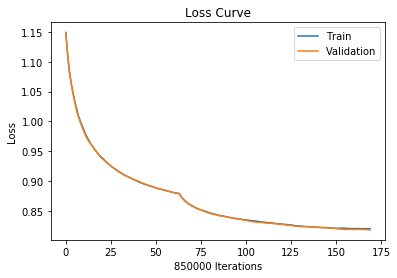

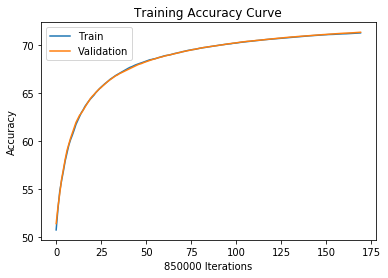

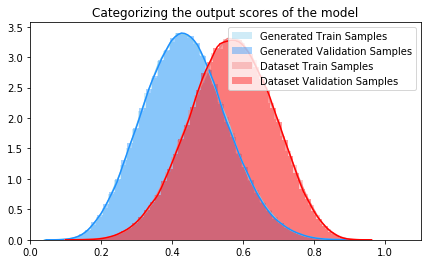

 73%|███████▎  | 358780/491198 [30:52<08:36, 256.42it/s]

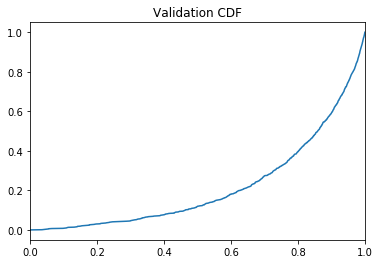

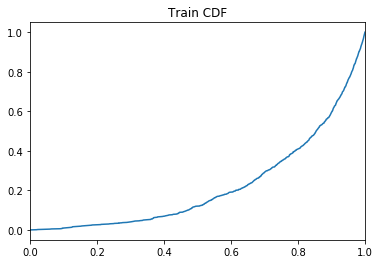

 73%|███████▎  | 358834/491198 [31:35<21:21:50,  1.72it/s]

Training Accuracy at epoch 1: 71.25282352941177
Validation Accuracy epoch 1: 71.32235294117648
Training AUC at epoch 1: 0.2200359090909091
Validation AUC epoch 1: 0.2163520909090909
Train: Sensitivity: 0.7119530594350113 Specificity: 0.7131044650279903
Val: Sensitivity: 0.7116168286010753 Specificity: 0.7148229880739976


 83%|████████▎ | 408798/491198 [34:43<06:01, 228.17it/s]  

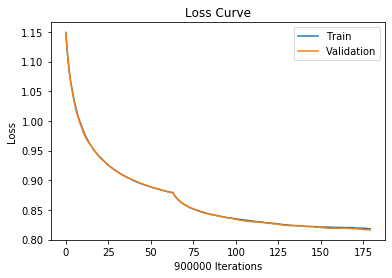

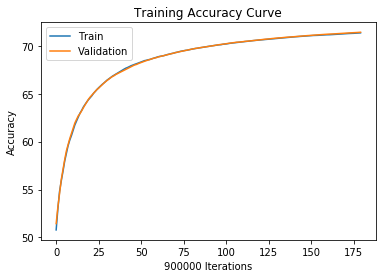

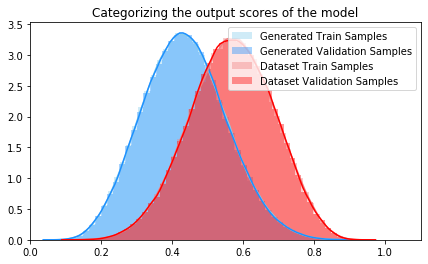

 83%|████████▎ | 408798/491198 [35:03<06:01, 228.17it/s]

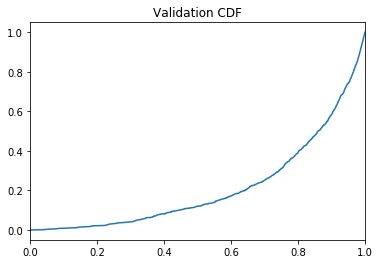

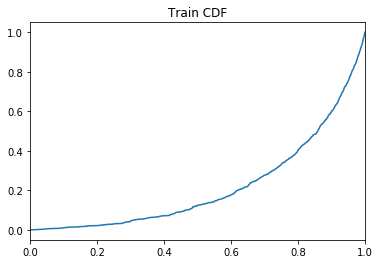

 83%|████████▎ | 408834/491198 [35:44<73:47:16,  3.23s/it] 

Training Accuracy at epoch 1: 71.35766666666666
Validation Accuracy epoch 1: 71.42322222222222
Training AUC at epoch 1: 0.21703590909090908
Validation AUC epoch 1: 0.21188554545454544
Train: Sensitivity: 0.7128672412682691 Specificity: 0.7142869849260758
Val: Sensitivity: 0.7126941534076359 Specificity: 0.715763912759045


 93%|█████████▎| 458780/491198 [39:05<02:19, 231.64it/s]  

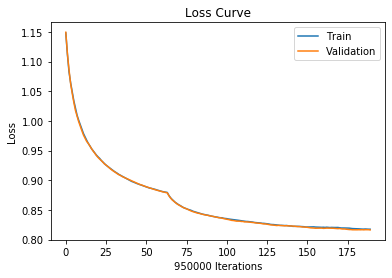

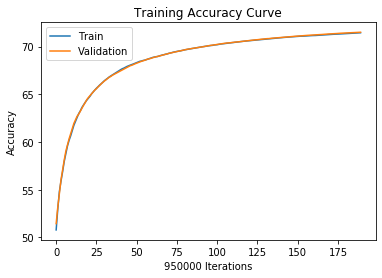

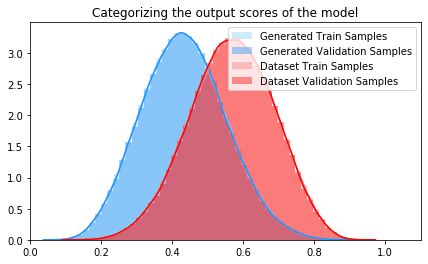

 93%|█████████▎| 458780/491198 [39:23<02:19, 231.64it/s]

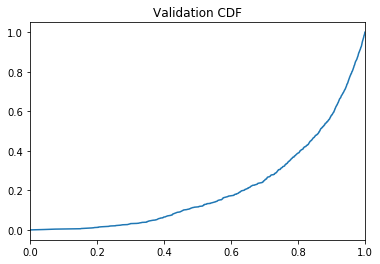

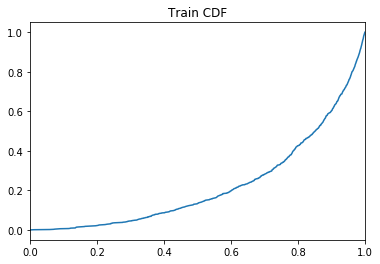

 93%|█████████▎| 458818/491198 [40:08<5:24:30,  1.66it/s]

Training Accuracy at epoch 1: 71.44926315789473
Validation Accuracy epoch 1: 71.50515789473684
Training AUC at epoch 1: 0.22449209090909092
Validation AUC epoch 1: 0.20757745454545454
Train: Sensitivity: 0.7136769403654086 Specificity: 0.7153089893556526
Val: Sensitivity: 0.7134673812136045 Specificity: 0.7166288547180909


  0%|          | 28/491198 [00:00<29:31, 277.20it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 2  with learning rate:  [0.0007]


  4%|▎         | 17584/491198 [01:06<31:11, 253.11it/s]

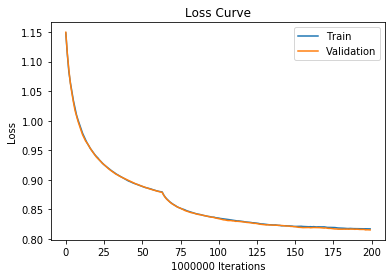

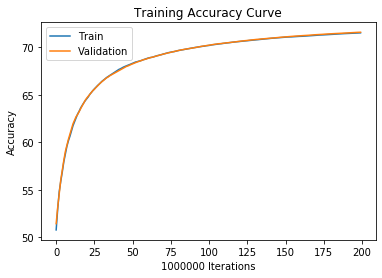

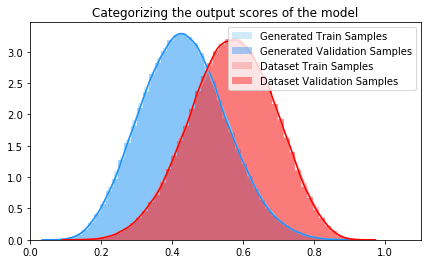

  4%|▎         | 17584/491198 [01:20<31:11, 253.11it/s]

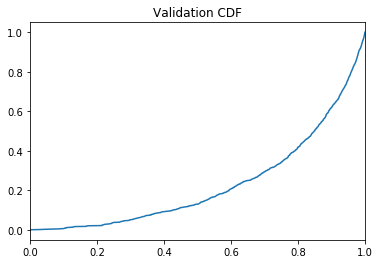

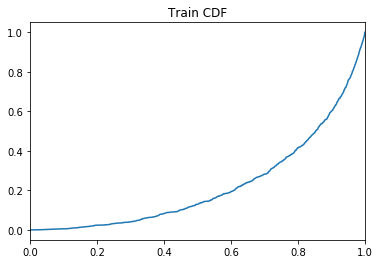

  4%|▎         | 17639/491198 [02:09<87:09:18,  1.51it/s] 

Training Accuracy at epoch 2: 71.5242
Validation Accuracy epoch 2: 71.5888
Training AUC at epoch 2: 0.22203518181818183
Validation AUC epoch 2: 0.22903909090909091
Train: Sensitivity: 0.7145461633032475 Specificity: 0.7159384910908126
Val: Sensitivity: 0.7144847159558967 Specificity: 0.7172852293341795


 14%|█▍        | 67581/491198 [05:17<24:24, 289.28it/s]  

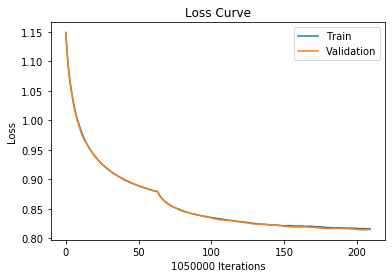

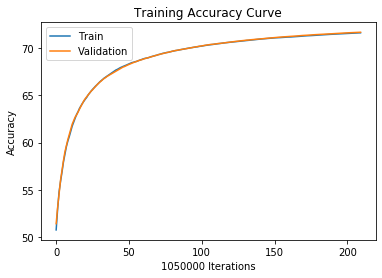

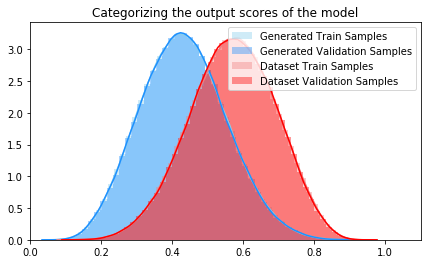

 14%|█▍        | 67581/491198 [05:30<24:24, 289.28it/s]

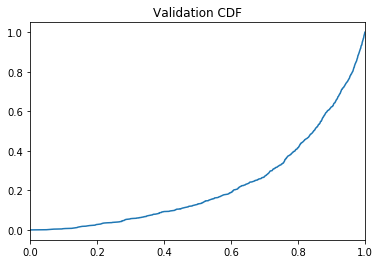

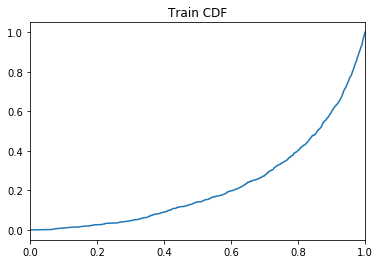

 14%|█▍        | 67635/491198 [06:18<65:41:13,  1.79it/s]

Training Accuracy at epoch 2: 71.60533333333333
Validation Accuracy epoch 2: 71.66666666666667
Training AUC at epoch 2: 0.22325254545454543
Validation AUC epoch 2: 0.22607454545454547
Train: Sensitivity: 0.7153315245847018 Specificity: 0.7167757610404459
Val: Sensitivity: 0.7154135560802698 Specificity: 0.7179144562901408


 24%|██▍       | 117600/491198 [09:23<25:25, 244.83it/s] 

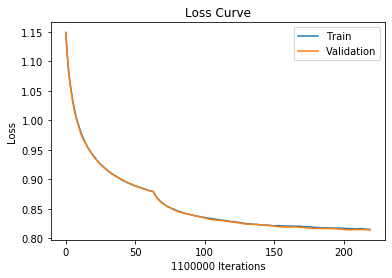

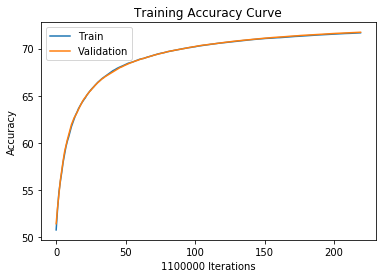

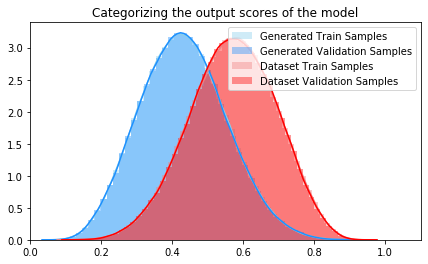

 24%|██▍       | 117600/491198 [09:40<25:25, 244.83it/s]

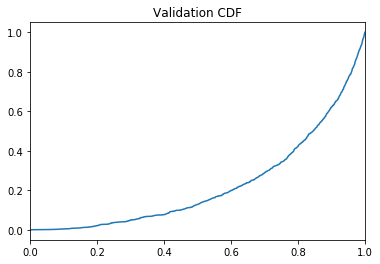

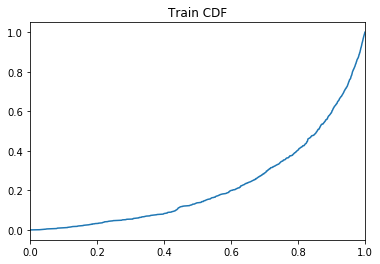

 24%|██▍       | 117634/491198 [10:26<342:54:20,  3.30s/it]

Training Accuracy at epoch 2: 71.67372727272728
Validation Accuracy epoch 2: 71.73518181818181
Training AUC at epoch 2: 0.225324
Validation AUC epoch 2: 0.22622081818181816
Train: Sensitivity: 0.7161732664361244 Specificity: 0.7173018884743216
Val: Sensitivity: 0.7161814733090509 Specificity: 0.7185171477246132


 34%|███▍      | 167600/491198 [13:29<20:28, 263.32it/s]   

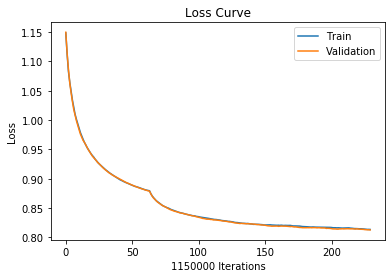

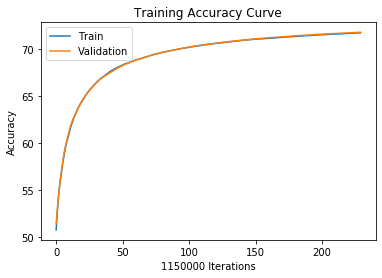

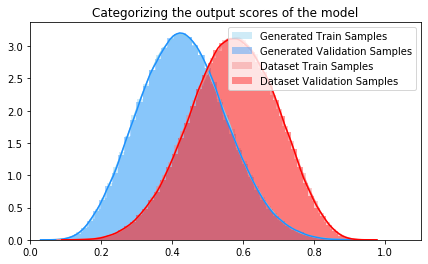

 34%|███▍      | 167600/491198 [13:41<20:28, 263.32it/s]

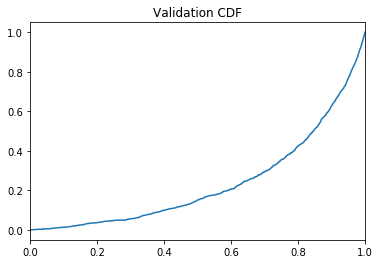

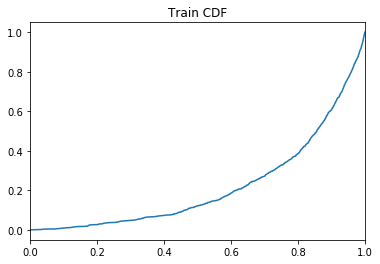

 34%|███▍      | 167620/491198 [14:31<293:53:46,  3.27s/it]

Training Accuracy at epoch 2: 71.74260869565218
Validation Accuracy epoch 2: 71.80582608695653
Training AUC at epoch 2: 0.2191409090909091
Validation AUC epoch 2: 0.2351571818181818
Train: Sensitivity: 0.7169592574567197 Specificity: 0.7178934363471845
Val: Sensitivity: 0.7170198341951214 Specificity: 0.7190923874465673


 44%|████▍     | 217593/491198 [17:46<17:05, 266.75it/s]   

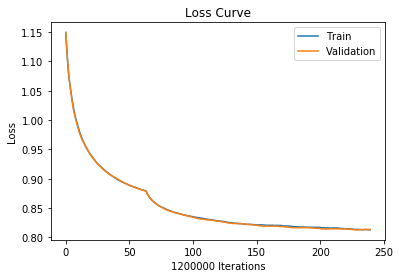

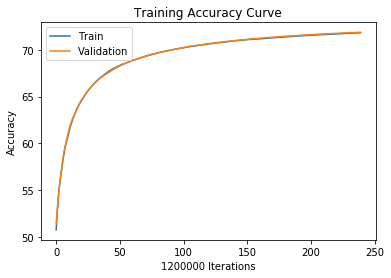

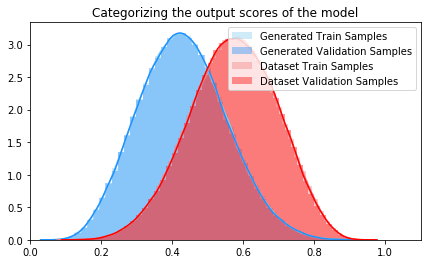

 44%|████▍     | 217593/491198 [18:01<17:05, 266.75it/s]

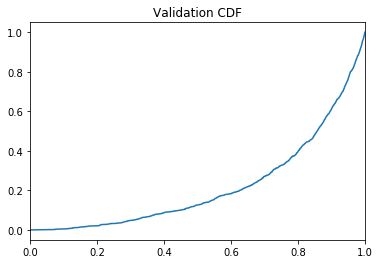

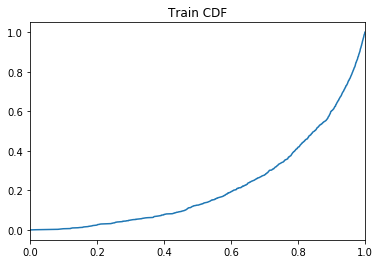

 44%|████▍     | 217637/491198 [18:49<90:46:15,  1.19s/it] 

Training Accuracy at epoch 2: 71.80558333333333
Validation Accuracy epoch 2: 71.85866666666666
Training AUC at epoch 2: 0.2211388181818182
Validation AUC epoch 2: 0.21925118181818182
Train: Sensitivity: 0.7176031646887362 Specificity: 0.7185090681676047
Val: Sensitivity: 0.7175790533803431 Specificity: 0.7195900601903672


 54%|█████▍    | 267585/491198 [22:02<13:36, 274.02it/s]  

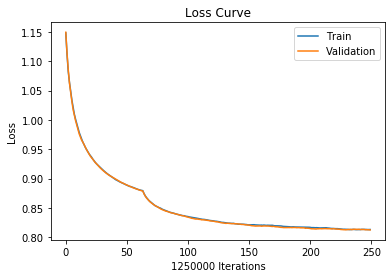

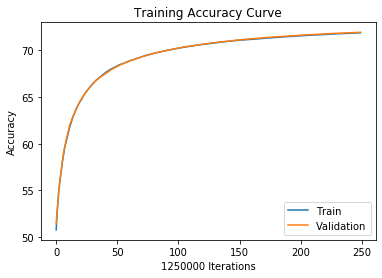

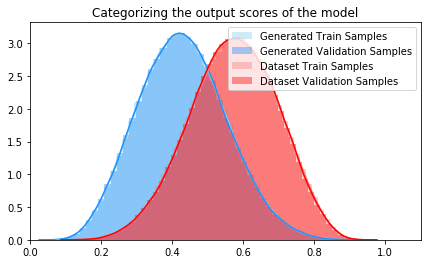

 54%|█████▍    | 267585/491198 [22:21<13:36, 274.02it/s]

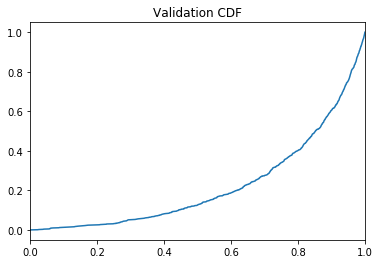

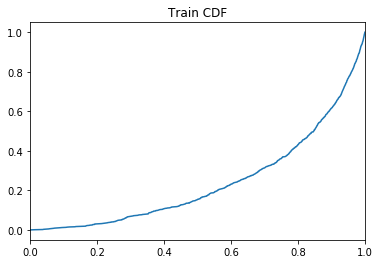

 54%|█████▍    | 267638/491198 [23:05<43:24:40,  1.43it/s]

Training Accuracy at epoch 2: 71.85904
Validation Accuracy epoch 2: 71.91784
Training AUC at epoch 2: 0.23981890909090908
Validation AUC epoch 2: 0.22219536363636366
Train: Sensitivity: 0.7181885042769206 Specificity: 0.7189928748699064
Val: Sensitivity: 0.7181104533706172 Specificity: 0.7202418587422323


 65%|██████▍   | 317592/491198 [26:18<11:51, 243.88it/s]  

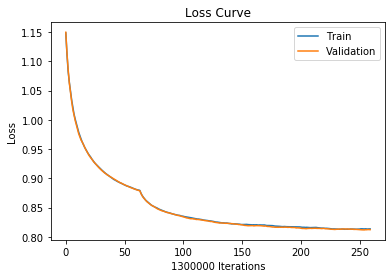

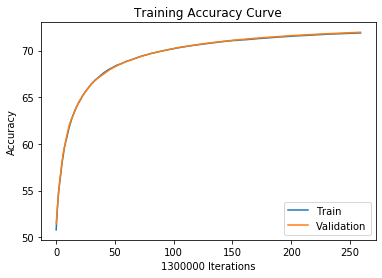

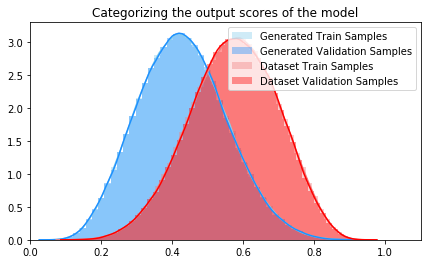

 65%|██████▍   | 317592/491198 [26:31<11:51, 243.88it/s]

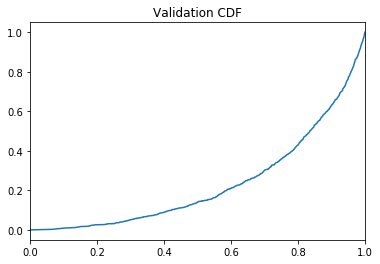

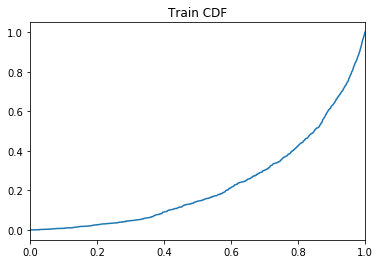

 65%|██████▍   | 317636/491198 [27:21<53:17:57,  1.11s/it]

Training Accuracy at epoch 2: 71.8876923076923
Validation Accuracy epoch 2: 71.96815384615384
Training AUC at epoch 2: 0.23131963636363637
Validation AUC epoch 2: 0.23269145454545453
Train: Sensitivity: 0.7185508703479085 Specificity: 0.7192034647497433
Val: Sensitivity: 0.7187320755647931 Specificity: 0.7206267921724661


 75%|███████▍  | 367587/491198 [30:40<08:56, 230.29it/s]  

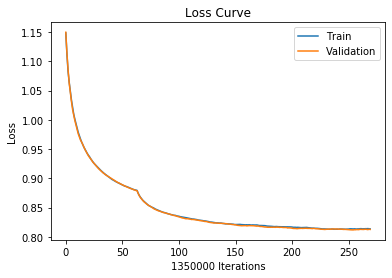

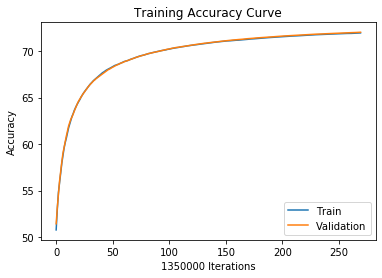

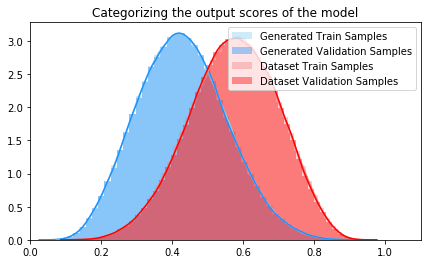

 75%|███████▍  | 367587/491198 [30:52<08:56, 230.29it/s]

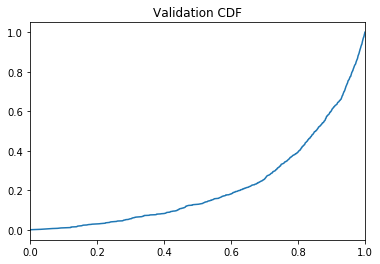

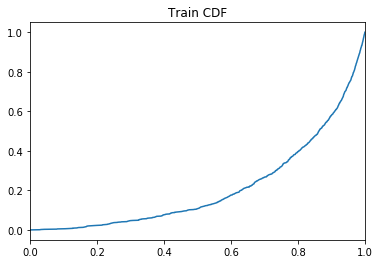

 75%|███████▍  | 367620/491198 [31:44<27:32:04,  1.25it/s]

Training Accuracy at epoch 2: 71.94244444444445
Validation Accuracy epoch 2: 72.01629629629629
Training AUC at epoch 2: 0.21127172727272725
Validation AUC epoch 2: 0.22079018181818183
Train: Sensitivity: 0.7191151956938181 Specificity: 0.7197341461751267
Val: Sensitivity: 0.7193316139646 Specificity: 0.7209906326266045


 85%|████████▌ | 417576/491198 [34:52<04:36, 266.09it/s]  

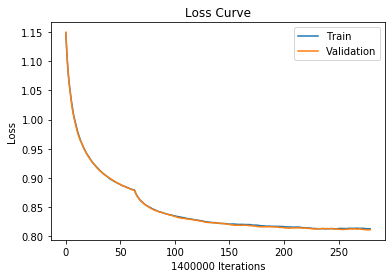

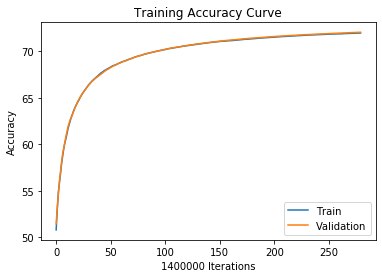

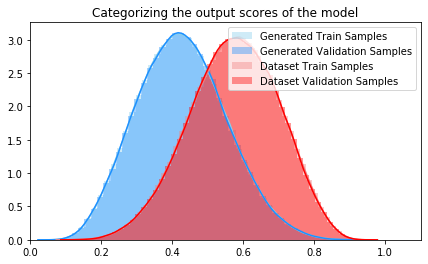

 85%|████████▌ | 417576/491198 [35:12<04:36, 266.09it/s]

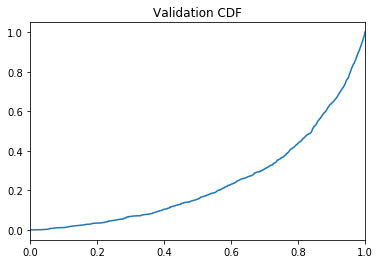

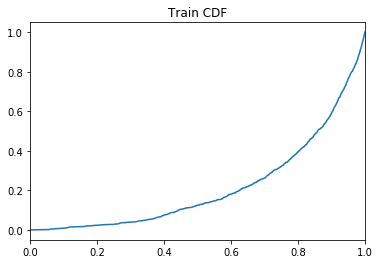

 85%|████████▌ | 417640/491198 [35:56<9:50:31,  2.08it/s] 

Training Accuracy at epoch 2: 71.98464285714286
Validation Accuracy epoch 2: 72.06278571428571
Training AUC at epoch 2: 0.21516945454545455
Validation AUC epoch 2: 0.24361836363636363
Train: Sensitivity: 0.719499694482991 Specificity: 0.7201936107315009
Val: Sensitivity: 0.7198358182031628 Specificity: 0.7214164953685357


 95%|█████████▌| 467580/491198 [39:07<01:24, 279.33it/s] 

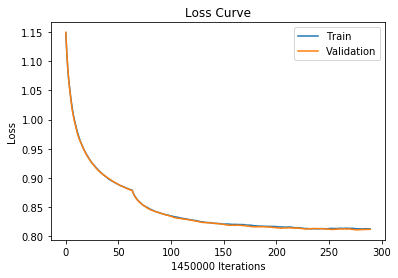

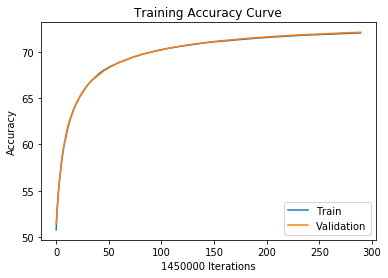

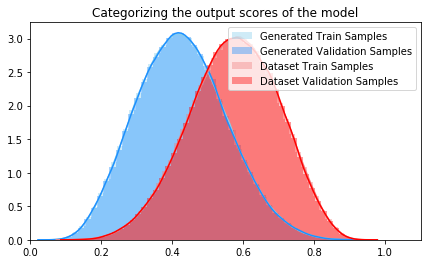

 95%|█████████▌| 467580/491198 [39:22<01:24, 279.33it/s]

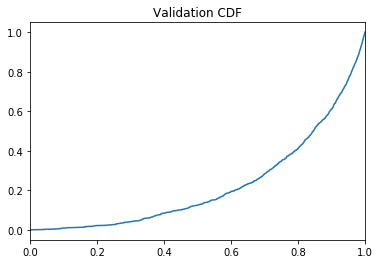

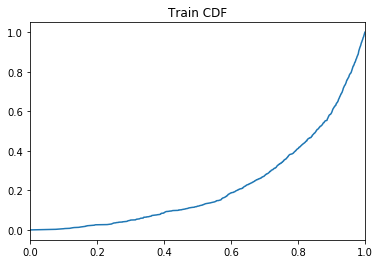

 95%|█████████▌| 467638/491198 [40:12<3:42:43,  1.76it/s]

Training Accuracy at epoch 2: 72.02579310344828
Validation Accuracy epoch 2: 72.10096551724138
Training AUC at epoch 2: 0.22087963636363636
Validation AUC epoch 2: 0.22314963636363636
Train: Sensitivity: 0.7197992568643536 Specificity: 0.7207169912859893
Val: Sensitivity: 0.7201904735576259 Specificity: 0.7218253640542847


  0%|          | 33/491198 [00:00<25:00, 327.29it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 3  with learning rate:  [0.0007]


  5%|▌         | 26393/491198 [01:39<31:10, 248.48it/s]

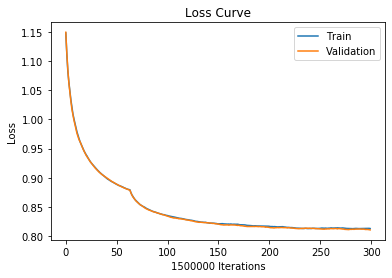

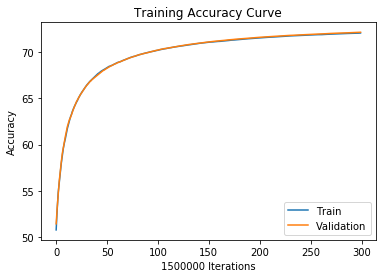

  5%|▌         | 26393/491198 [01:50<31:10, 248.48it/s]

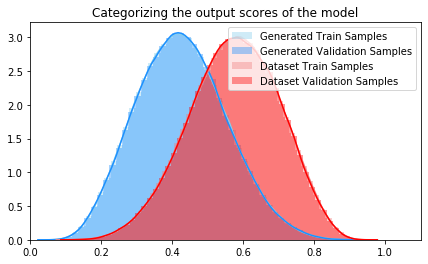

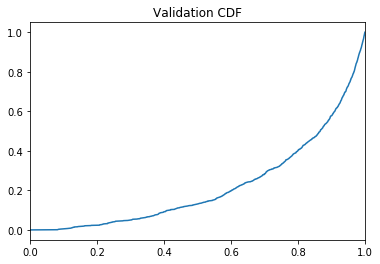

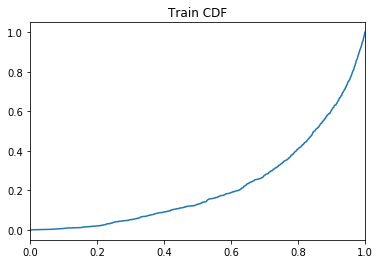

  5%|▌         | 26437/491198 [02:44<135:08:47,  1.05s/it]

Training Accuracy at epoch 3: 72.06666666666666
Validation Accuracy epoch 3: 72.14906666666667
Training AUC at epoch 3: 0.2229259090909091
Validation AUC epoch 3: 0.22003127272727274
Train: Sensitivity: 0.720235572578904 Specificity: 0.721098154091599
Val: Sensitivity: 0.7206665018673544 Specificity: 0.7223112896895352


 16%|█▌        | 76402/491198 [05:51<25:30, 271.07it/s]   

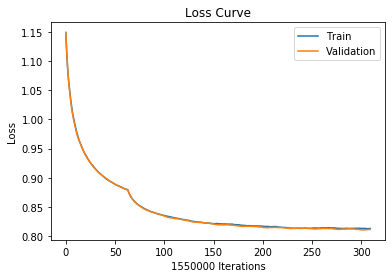

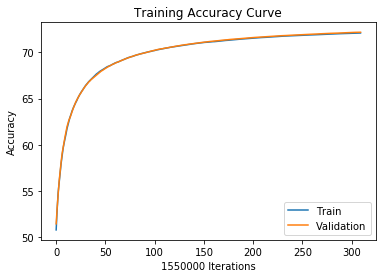

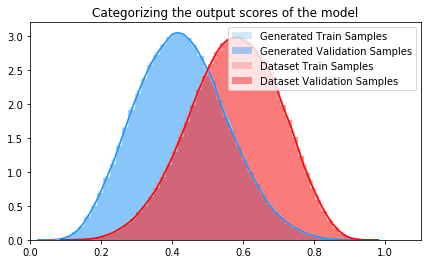

 16%|█▌        | 76402/491198 [06:10<25:30, 271.07it/s]

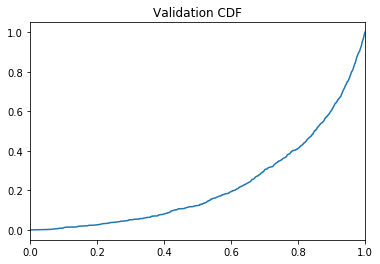

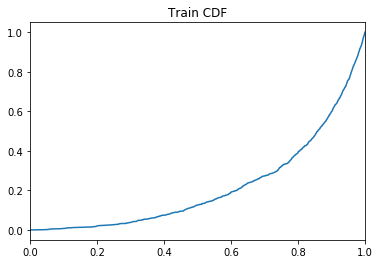

 16%|█▌        | 76422/491198 [06:55<388:28:49,  3.37s/it]

Training Accuracy at epoch 3: 72.09677419354838
Validation Accuracy epoch 3: 72.17935483870967
Training AUC at epoch 3: 0.21609063636363635
Validation AUC epoch 3: 0.225945
Train: Sensitivity: 0.7205726829066972 Specificity: 0.7213631763211434
Val: Sensitivity: 0.7211164653025118 Specificity: 0.7224675388208153


 26%|██▌       | 126384/491198 [09:55<20:56, 290.29it/s]  

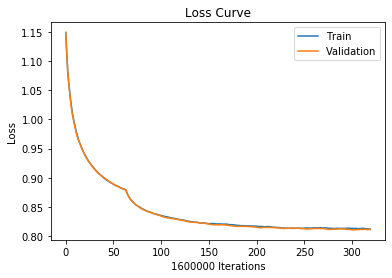

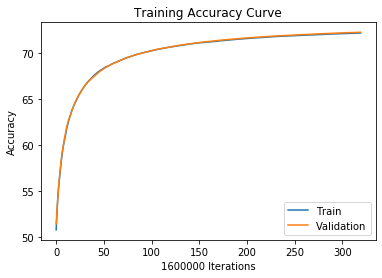

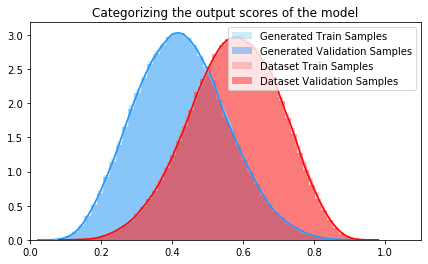

 26%|██▌       | 126384/491198 [10:10<20:56, 290.29it/s]

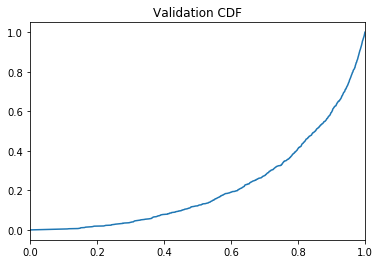

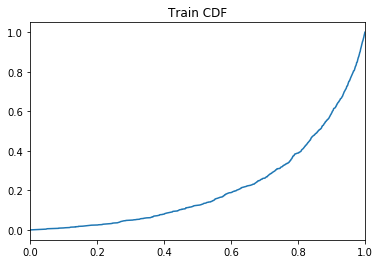

 26%|██▌       | 126438/491198 [10:59<62:44:29,  1.61it/s]

Training Accuracy at epoch 3: 72.1351875
Validation Accuracy epoch 3: 72.217875
Training AUC at epoch 3: 0.21623163636363635
Validation AUC epoch 3: 0.21797090909090908
Train: Sensitivity: 0.7210693725388291 Specificity: 0.7216346827286735
Val: Sensitivity: 0.7215631988073687 Specificity: 0.722791591052241


 36%|███▌      | 176390/491198 [13:45<16:19, 321.32it/s]  

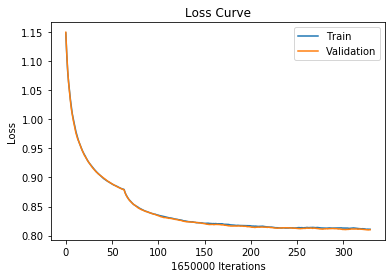

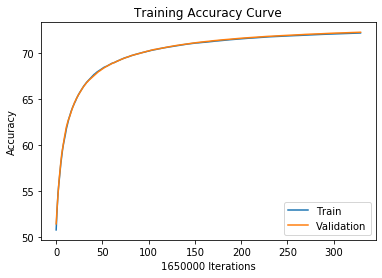

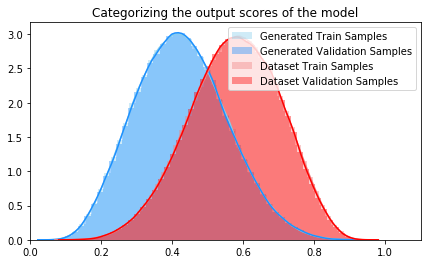

 36%|███▌      | 176390/491198 [14:00<16:19, 321.32it/s]

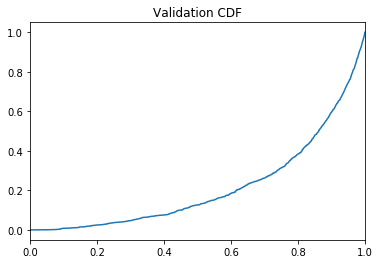

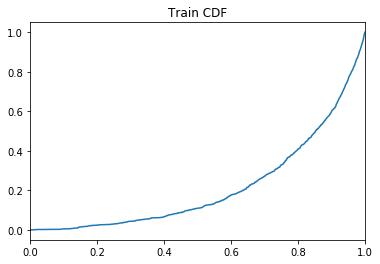

 36%|███▌      | 176440/491198 [14:53<77:55:39,  1.12it/s] 

Training Accuracy at epoch 3: 72.17115151515152
Validation Accuracy epoch 3: 72.25169696969697
Training AUC at epoch 3: 0.21474954545454544
Validation AUC epoch 3: 0.21555709090909092
Train: Sensitivity: 0.7214616186983686 Specificity: 0.7219616789095747
Val: Sensitivity: 0.7219328443603306 Specificity: 0.7230985826908796


 46%|████▌     | 226400/491198 [18:04<18:10, 242.88it/s]  

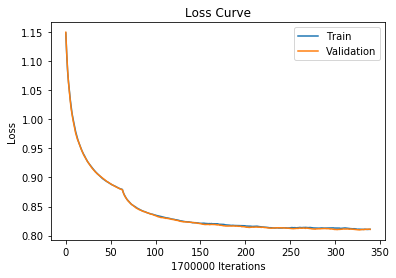

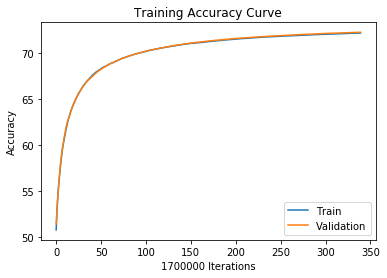

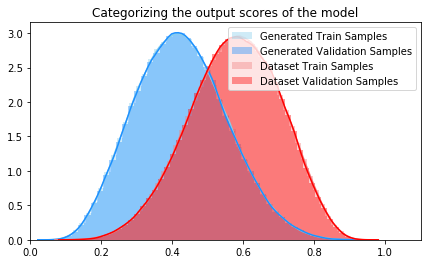

 46%|████▌     | 226400/491198 [18:21<18:10, 242.88it/s]

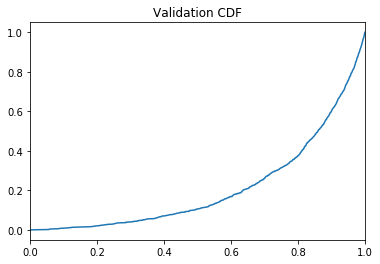

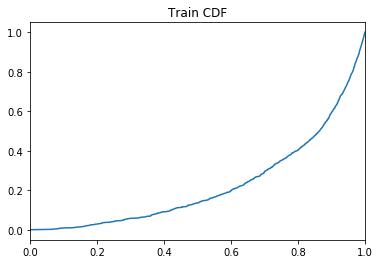

 46%|████▌     | 226438/491198 [19:10<169:45:14,  2.31s/it]

Training Accuracy at epoch 3: 72.20347058823529
Validation Accuracy epoch 3: 72.28476470588235
Training AUC at epoch 3: 0.22589654545454543
Validation AUC epoch 3: 0.21053536363636366
Train: Sensitivity: 0.7218212280650187 Specificity: 0.7222484475705583
Val: Sensitivity: 0.7223147161197212 Specificity: 0.7233782057903781


 56%|█████▋    | 276395/491198 [22:22<13:41, 261.63it/s]   

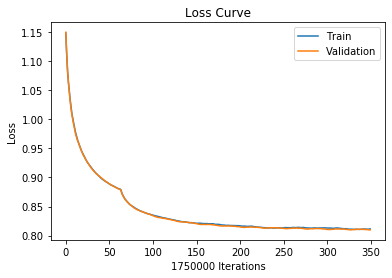

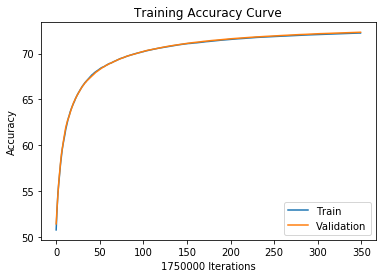

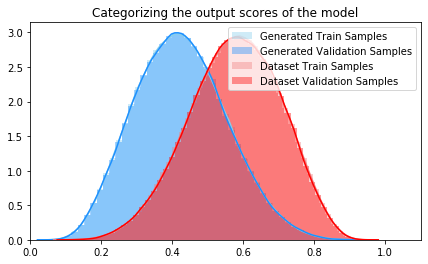

 56%|█████▋    | 276395/491198 [22:41<13:41, 261.63it/s]

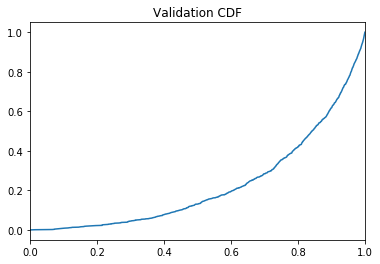

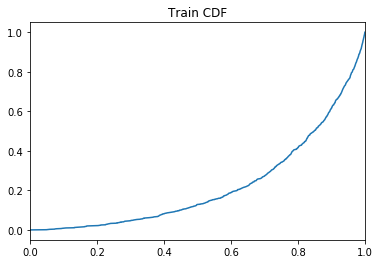

 56%|█████▋    | 276422/491198 [23:35<83:04:19,  1.39s/it] 

Training Accuracy at epoch 3: 72.22851428571428
Validation Accuracy epoch 3: 72.31662857142857
Training AUC at epoch 3: 0.22199336363636363
Validation AUC epoch 3: 0.22554054545454547
Train: Sensitivity: 0.7221403128493917 Specificity: 0.7224301812388563
Val: Sensitivity: 0.7226729156716478 Specificity: 0.7236575166409891


 66%|██████▋   | 326378/491198 [26:53<10:41, 256.98it/s]  

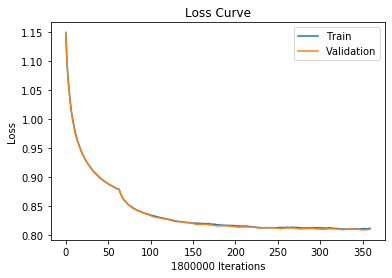

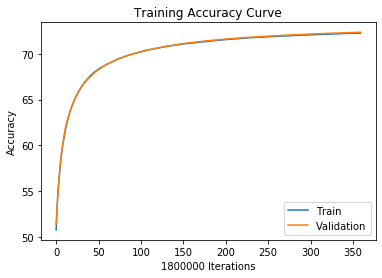

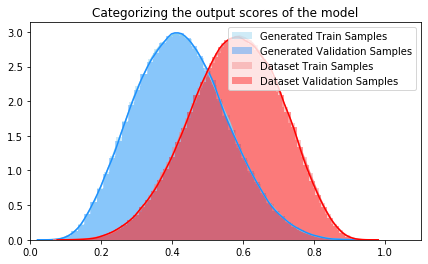

 66%|██████▋   | 326378/491198 [27:11<10:41, 256.98it/s]

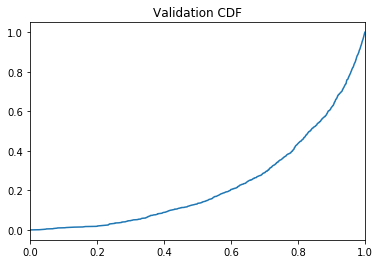

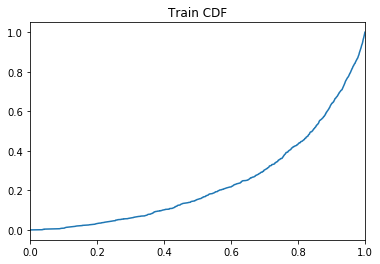

 66%|██████▋   | 326437/491198 [28:01<23:17:04,  1.97it/s]

Training Accuracy at epoch 3: 72.24572222222223
Validation Accuracy epoch 3: 72.34261111111111
Training AUC at epoch 3: 0.23955100000000001
Validation AUC epoch 3: 0.23040100000000002
Train: Sensitivity: 0.7223214771502078 Specificity: 0.7225931481063508
Val: Sensitivity: 0.7229886081446755 Specificity: 0.723861683610683


 77%|███████▋  | 376384/491198 [31:13<07:06, 269.25it/s]  

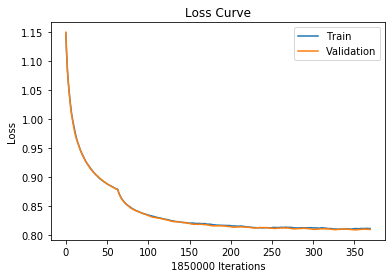

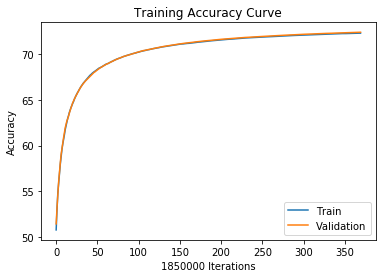

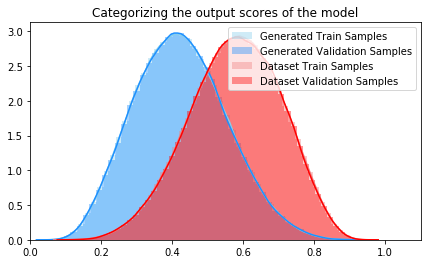

 77%|███████▋  | 376384/491198 [31:32<07:06, 269.25it/s]

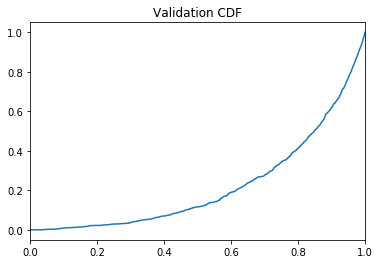

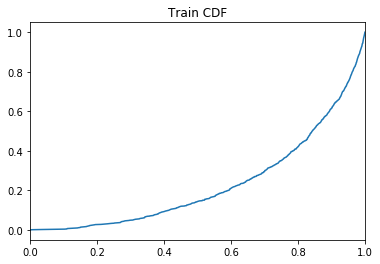

 77%|███████▋  | 376439/491198 [32:21<20:41:56,  1.54it/s]

Training Accuracy at epoch 3: 72.2765945945946
Validation Accuracy epoch 3: 72.37572972972973
Training AUC at epoch 3: 0.2296811818181818
Validation AUC epoch 3: 0.22037881818181818
Train: Sensitivity: 0.7226490292316285 Specificity: 0.7228830162063106
Val: Sensitivity: 0.7233765473964303 Specificity: 0.7241364059037884


 87%|████████▋ | 426396/491198 [35:21<04:30, 239.99it/s]  

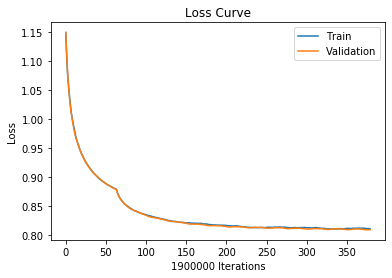

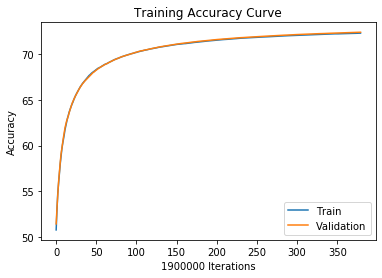

 87%|████████▋ | 426396/491198 [35:32<04:30, 239.99it/s]

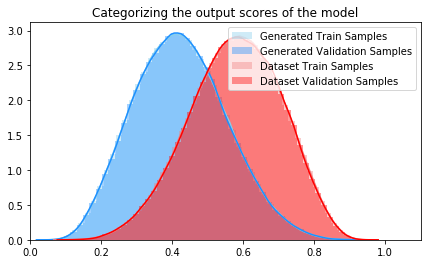

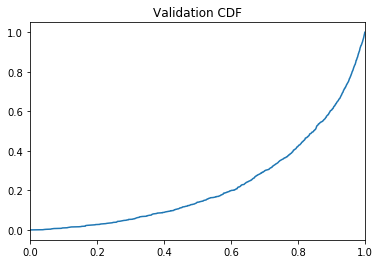

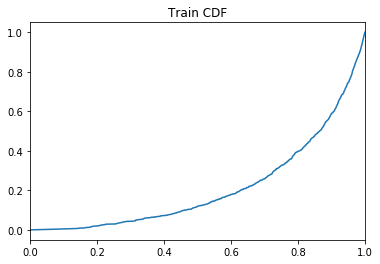

 87%|████████▋ | 426438/491198 [36:29<25:41:53,  1.43s/it]

Training Accuracy at epoch 3: 72.30778947368421
Validation Accuracy epoch 3: 72.40384210526315
Training AUC at epoch 3: 0.21268
Validation AUC epoch 3: 0.2289941818181818
Train: Sensitivity: 0.7229450664130633 Specificity: 0.7232108814304101
Val: Sensitivity: 0.7237012281445755 Specificity: 0.7243741505315808


 97%|█████████▋| 476374/491198 [39:41<00:59, 248.05it/s]  

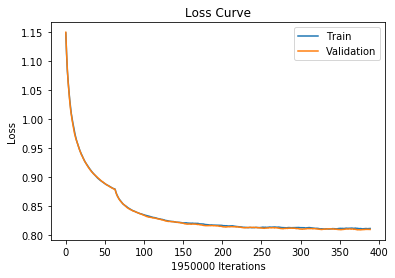

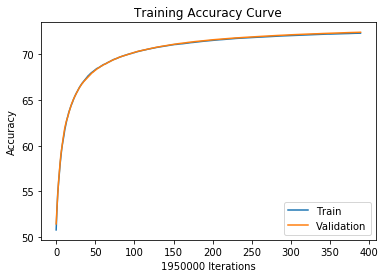

 97%|█████████▋| 476374/491198 [39:52<00:59, 248.05it/s]

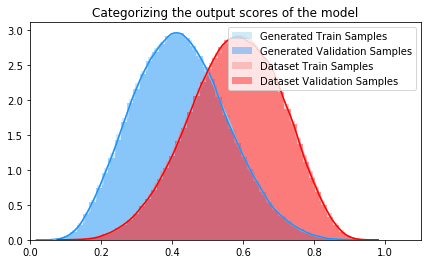

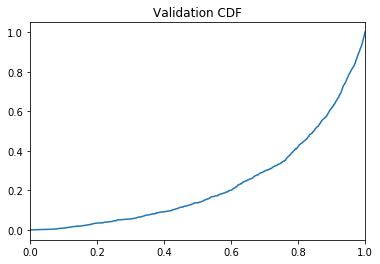

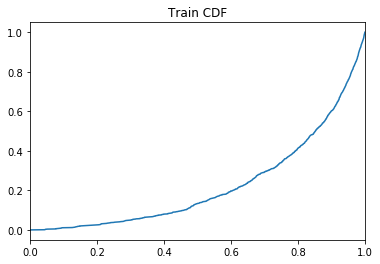

 97%|█████████▋| 476422/491198 [40:50<1:52:19,  2.19it/s]

Training Accuracy at epoch 3: 72.32758974358974
Validation Accuracy epoch 3: 72.42948717948718
Training AUC at epoch 3: 0.22442772727272725
Validation AUC epoch 3: 0.23173563636363637
Train: Sensitivity: 0.7230769073054816 Specificity: 0.7234750807314728
Val: Sensitivity: 0.7239373091278395 Specificity: 0.7246508514956052


  0%|          | 31/491198 [00:00<27:00, 303.08it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 4  with learning rate:  [0.0007]


  7%|▋         | 35173/491198 [02:16<31:43, 239.53it/s]

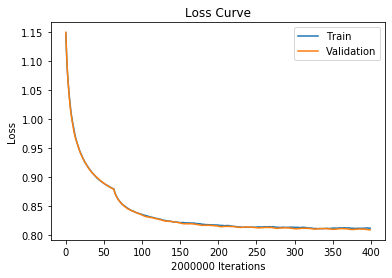

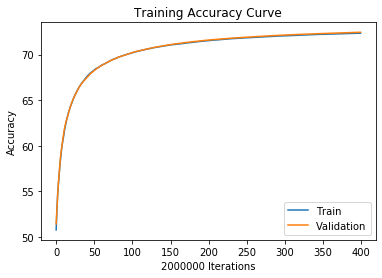

  7%|▋         | 35173/491198 [02:30<31:43, 239.53it/s]

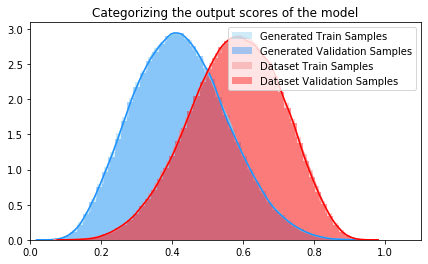

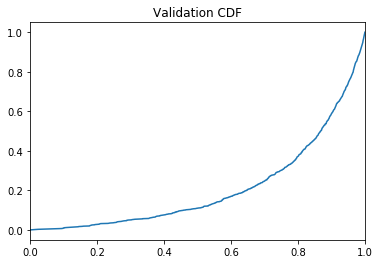

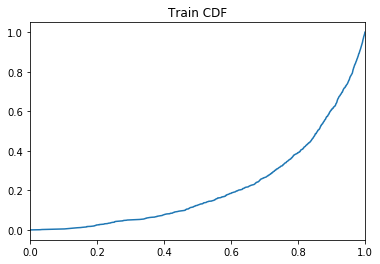

  7%|▋         | 35235/491198 [03:23<51:53:58,  2.44it/s]

Training Accuracy at epoch 4: 72.3534
Validation Accuracy epoch 4: 72.45635
Training AUC at epoch 4: 0.21670754545454546
Validation AUC epoch 4: 0.2090000909090909
Train: Sensitivity: 0.723337757717018 Specificity: 0.7237304449095734
Val: Sensitivity: 0.7242855925961187 Specificity: 0.7248402177329628


 17%|█▋        | 85196/491198 [06:36<25:33, 264.75it/s]  

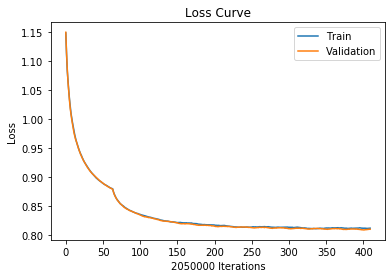

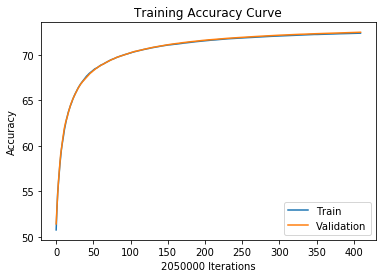

 17%|█▋        | 85196/491198 [06:50<25:33, 264.75it/s]

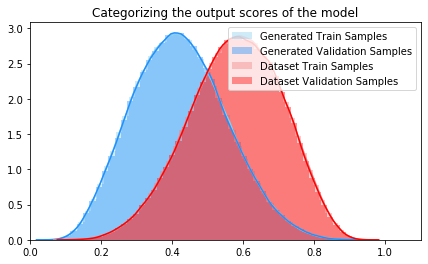

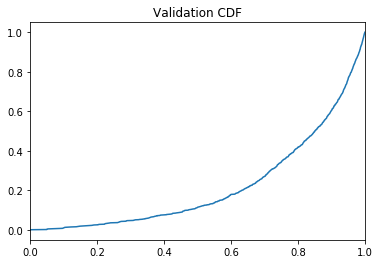

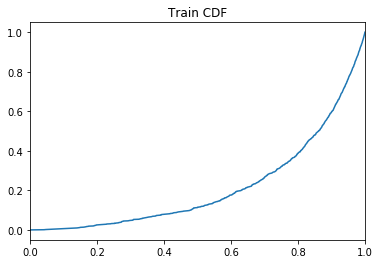

 17%|█▋        | 85242/491198 [07:46<137:41:30,  1.22s/it]

Training Accuracy at epoch 4: 72.37287804878049
Validation Accuracy epoch 4: 72.47468292682927
Training AUC at epoch 4: 0.2145700909090909
Validation AUC epoch 4: 0.21899654545454547
Train: Sensitivity: 0.7235609834108896 Specificity: 0.723896738727272
Val: Sensitivity: 0.7245342055215773 Specificity: 0.7249585071328793


 28%|██▊       | 135178/491198 [10:58<25:06, 236.39it/s]  

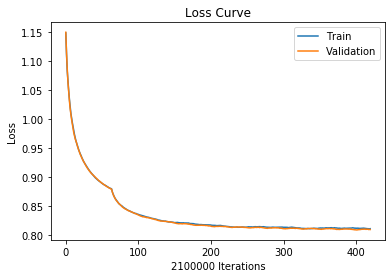

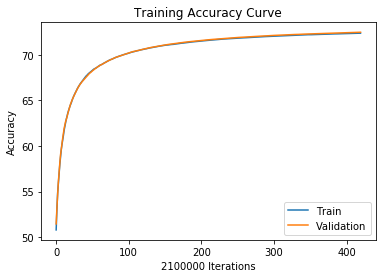

 28%|██▊       | 135178/491198 [11:10<25:06, 236.39it/s]

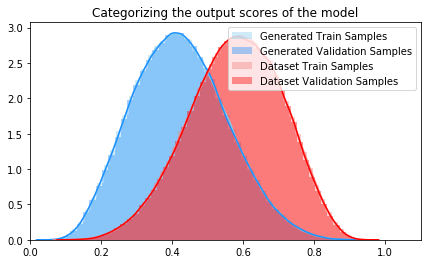

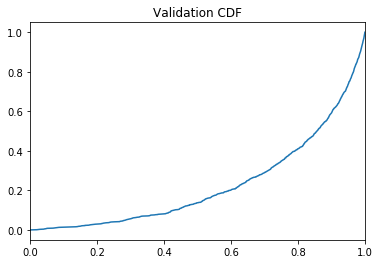

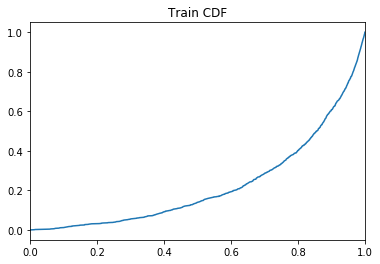

 28%|██▊       | 135240/491198 [12:16<54:09:22,  1.83it/s]

Training Accuracy at epoch 4: 72.39590476190476
Validation Accuracy epoch 4: 72.49928571428572
Training AUC at epoch 4: 0.22521027272727273
Validation AUC epoch 4: 0.22631045454545454
Train: Sensitivity: 0.7239011603503037 Specificity: 0.7240170045046118
Val: Sensitivity: 0.7248393380910703 Specificity: 0.7251457042315759


 38%|███▊      | 185179/491198 [15:25<21:41, 235.15it/s]  

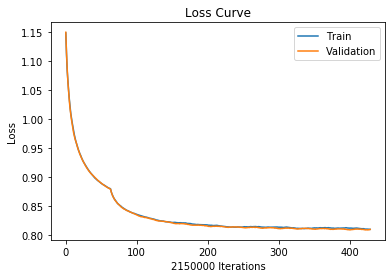

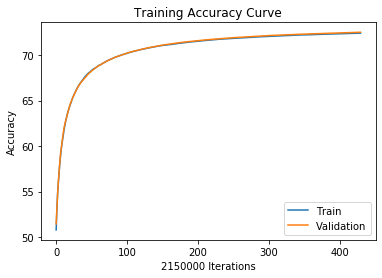

 38%|███▊      | 185179/491198 [15:40<21:41, 235.15it/s]

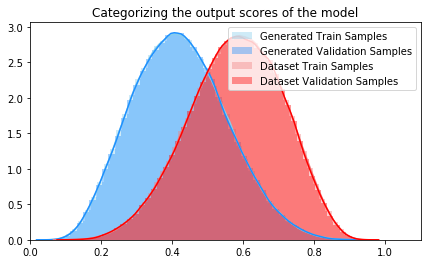

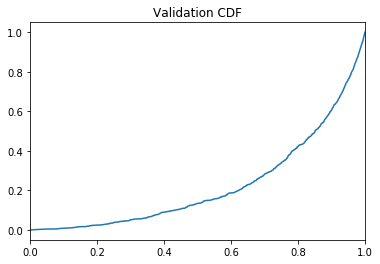

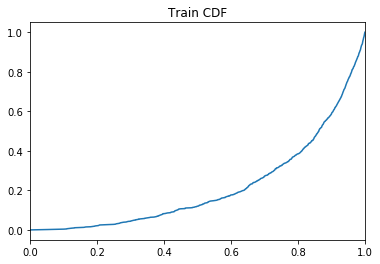

 38%|███▊      | 185224/491198 [16:35<42:52:04,  1.98it/s]

Training Accuracy at epoch 4: 72.42218604651163
Validation Accuracy epoch 4: 72.51990697674418
Training AUC at epoch 4: 0.21464981818181816
Validation AUC epoch 4: 0.22346409090909092
Train: Sensitivity: 0.7241832605245764 Specificity: 0.724260507040995
Val: Sensitivity: 0.7250806631297014 Specificity: 0.725316964455612


 48%|████▊     | 235196/491198 [19:46<15:52, 268.68it/s]  

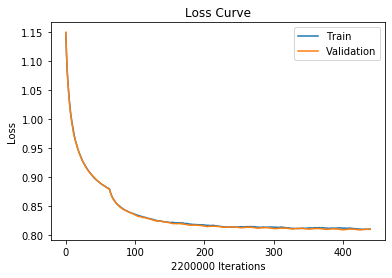

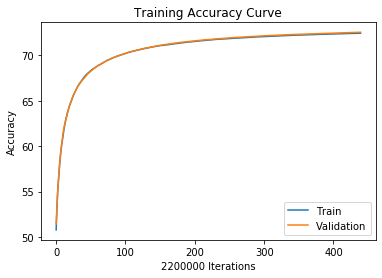

 48%|████▊     | 235196/491198 [20:00<15:52, 268.68it/s]

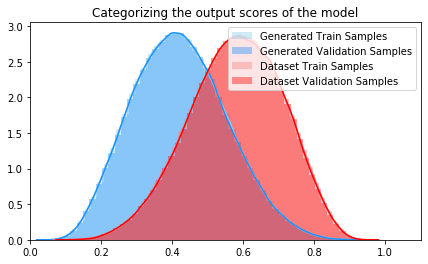

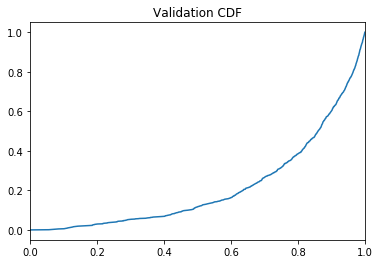

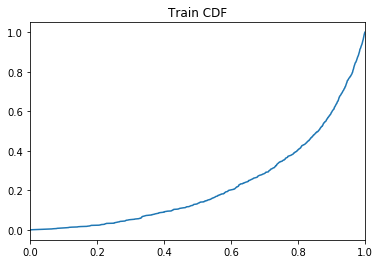

 48%|████▊     | 235241/491198 [20:56<86:43:06,  1.22s/it] 

Training Accuracy at epoch 4: 72.44045454545454
Validation Accuracy epoch 4: 72.54313636363636
Training AUC at epoch 4: 0.22528881818181817
Validation AUC epoch 4: 0.21368936363636365
Train: Sensitivity: 0.7243697662227221 Specificity: 0.7244393666364364
Val: Sensitivity: 0.7252936786986933 Specificity: 0.7255684348686615


 58%|█████▊    | 285192/491198 [24:10<15:00, 228.64it/s]  

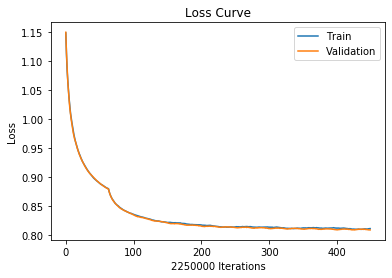

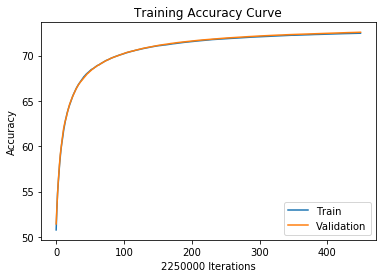

 58%|█████▊    | 285192/491198 [24:20<15:00, 228.64it/s]

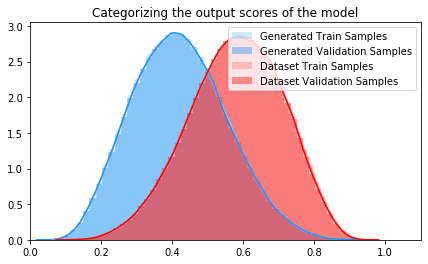

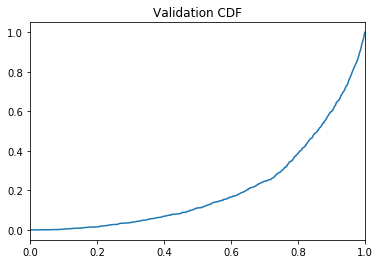

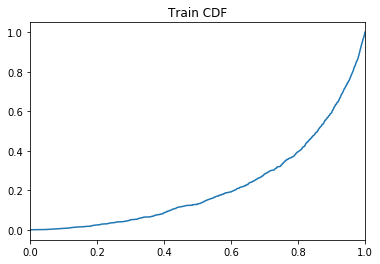

 58%|█████▊    | 285239/491198 [25:30<60:20:45,  1.05s/it]

Training Accuracy at epoch 4: 72.45528888888889
Validation Accuracy epoch 4: 72.56293333333333
Training AUC at epoch 4: 0.22186118181818182
Validation AUC epoch 4: 0.2075271818181818
Train: Sensitivity: 0.7245630787679599 Specificity: 0.7245426849607507
Val: Sensitivity: 0.7255559059382745 Specificity: 0.725702445765457


 68%|██████▊   | 335197/491198 [28:57<10:50, 239.69it/s]  

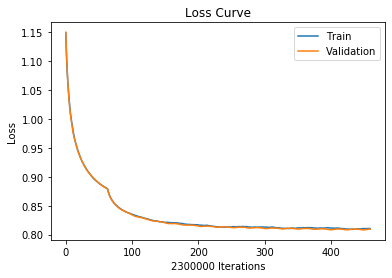

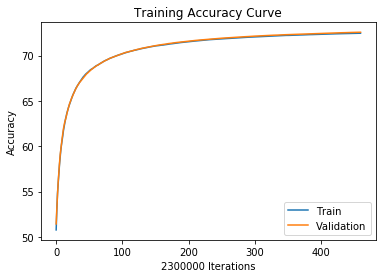

 68%|██████▊   | 335197/491198 [29:10<10:50, 239.69it/s]

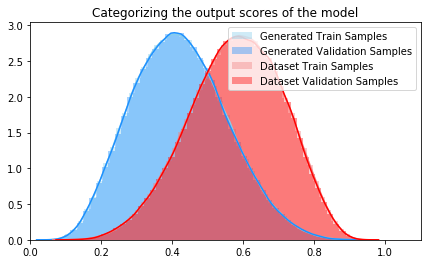

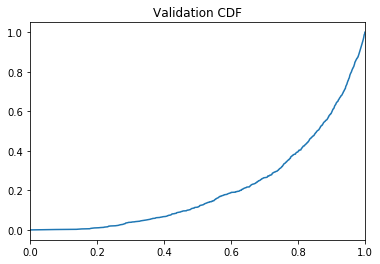

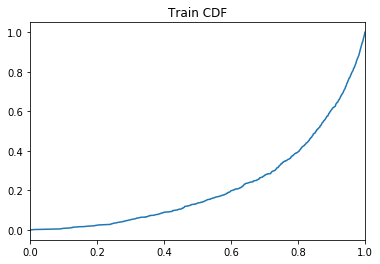

 68%|██████▊   | 335240/491198 [30:07<58:20:36,  1.35s/it]

Training Accuracy at epoch 4: 72.4698695652174
Validation Accuracy epoch 4: 72.57756521739131
Training AUC at epoch 4: 0.22208018181818182
Validation AUC epoch 4: 0.212487
Train: Sensitivity: 0.7247288207318864 Specificity: 0.7246685282628766
Val: Sensitivity: 0.7257114172744568 Specificity: 0.7258396042816847


 78%|███████▊  | 385160/491198 [33:09<06:02, 292.89it/s]  

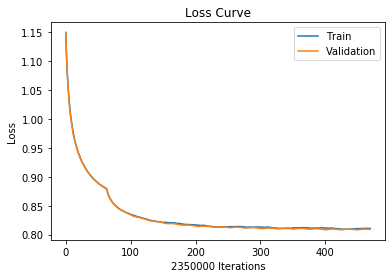

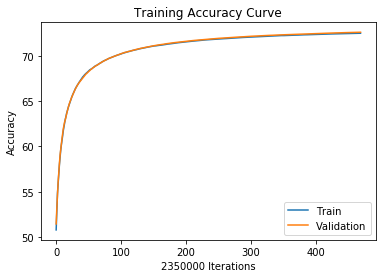

 78%|███████▊  | 385160/491198 [33:20<06:02, 292.89it/s]

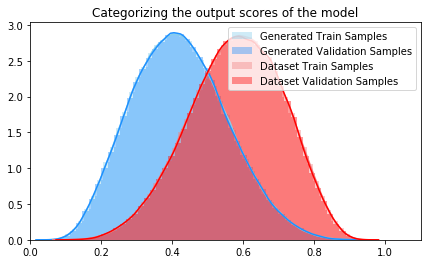

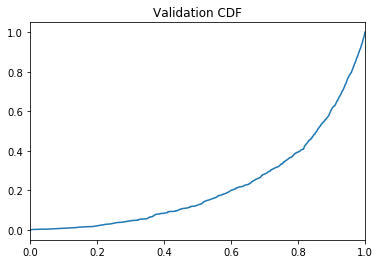

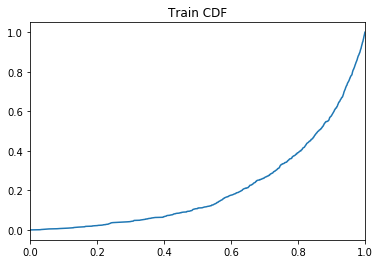

 78%|███████▊  | 385224/491198 [34:28<10:15:20,  2.87it/s]

Training Accuracy at epoch 4: 72.4884255319149
Validation Accuracy epoch 4: 72.598
Training AUC at epoch 4: 0.21112490909090909
Validation AUC epoch 4: 0.22173918181818184
Train: Sensitivity: 0.7249086283579131 Specificity: 0.7248598535136042
Val: Sensitivity: 0.7259322882504514 Specificity: 0.7260275019552662


 89%|████████▊ | 435184/491198 [38:00<03:56, 236.71it/s]  

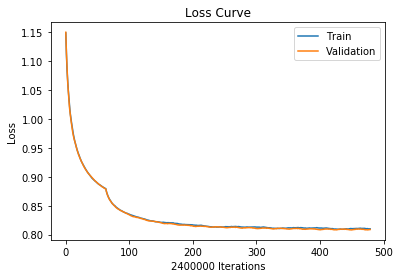

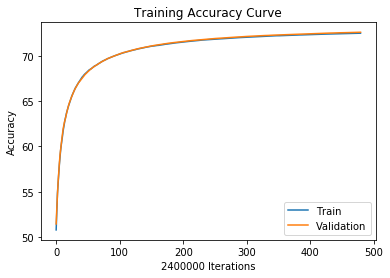

 89%|████████▊ | 435184/491198 [38:10<03:56, 236.71it/s]

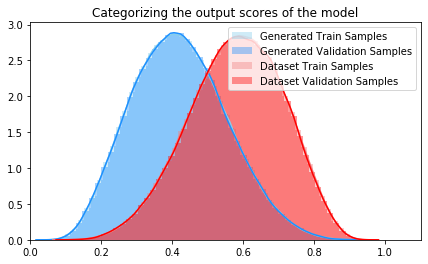

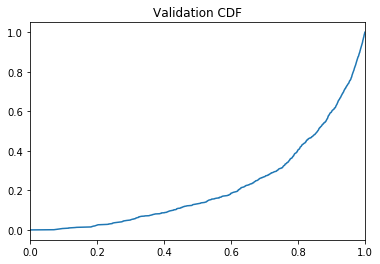

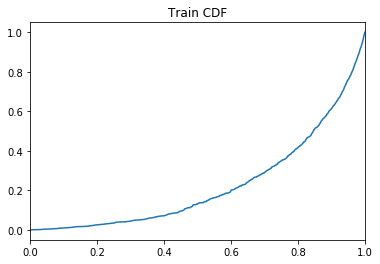

 89%|████████▊ | 435241/491198 [39:11<9:40:19,  1.61it/s] 

Training Accuracy at epoch 4: 72.51016666666666
Validation Accuracy epoch 4: 72.615625
Training AUC at epoch 4: 0.22512772727272728
Validation AUC epoch 4: 0.21920318181818182
Train: Sensitivity: 0.725081477175147 Specificity: 0.7251218778061912
Val: Sensitivity: 0.7261114846102131 Specificity: 0.7262008207115328


 99%|█████████▉| 485200/491198 [42:15<00:23, 252.15it/s] 

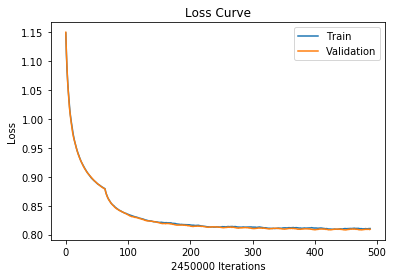

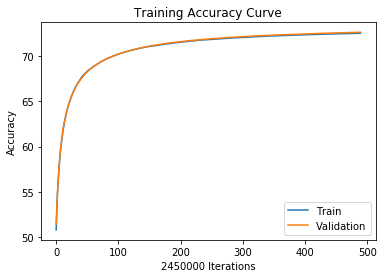

 99%|█████████▉| 485200/491198 [42:31<00:23, 252.15it/s]

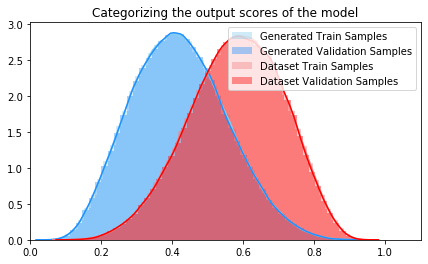

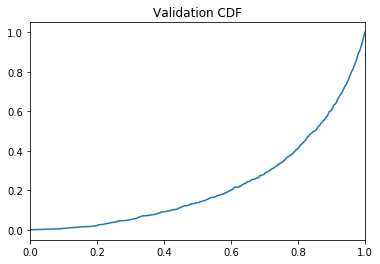

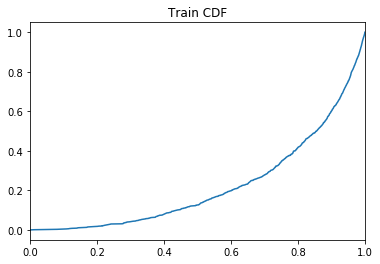

 99%|█████████▉| 485239/491198 [43:27<3:07:41,  1.89s/it]

Training Accuracy at epoch 4: 72.52297959183673
Validation Accuracy epoch 4: 72.63383673469387
Training AUC at epoch 4: 0.22171136363636362
Validation AUC epoch 4: 0.22758054545454545
Train: Sensitivity: 0.7252336890852082 Specificity: 0.7252258985096375
Val: Sensitivity: 0.7263025963571152 Specificity: 0.7263739826272816


  0%|          | 32/491198 [00:00<26:00, 314.76it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 5  with learning rate:  [0.0007]


  9%|▉         | 43988/491198 [02:49<30:39, 243.16it/s]

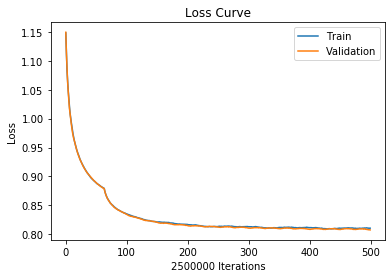

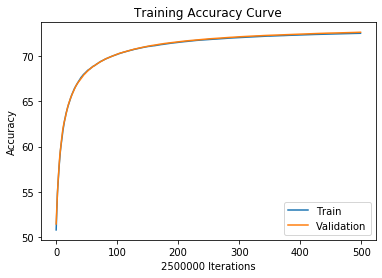

  9%|▉         | 43988/491198 [03:00<30:39, 243.16it/s]

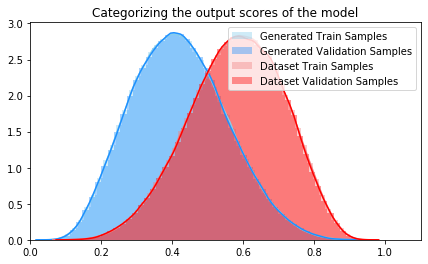

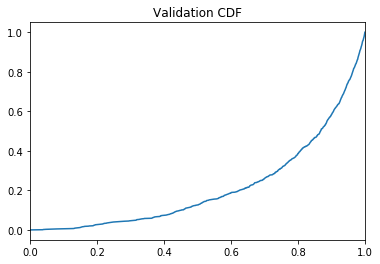

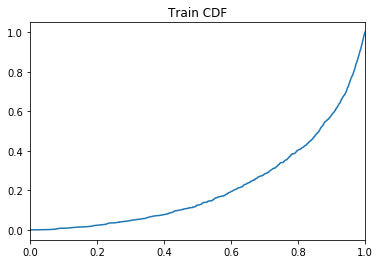

  9%|▉         | 44042/491198 [04:00<84:18:26,  1.47it/s] 

Training Accuracy at epoch 5: 72.5414
Validation Accuracy epoch 5: 72.655
Training AUC at epoch 5: 0.21796481818181818
Validation AUC epoch 5: 0.21370654545454545
Train: Sensitivity: 0.7253914555036449 Specificity: 0.7254365680631562
Val: Sensitivity: 0.7265582471148025 Specificity: 0.726541788238863


 19%|█▉        | 94006/491198 [07:08<25:09, 263.16it/s]  

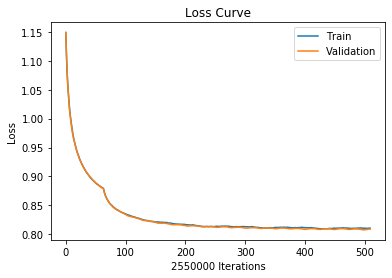

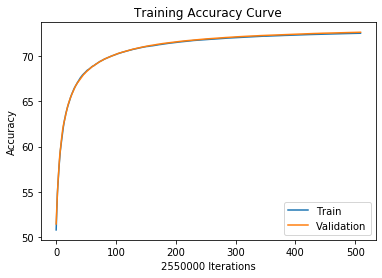

 19%|█▉        | 94006/491198 [07:20<25:09, 263.16it/s]

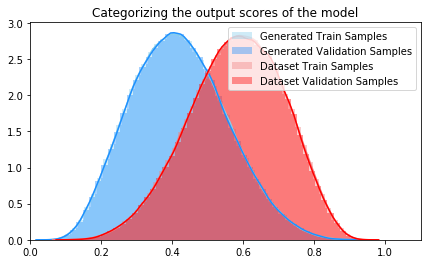

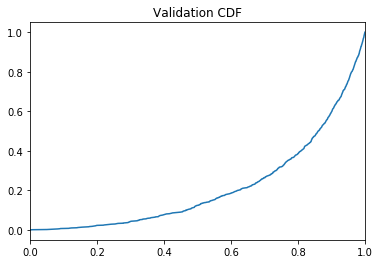

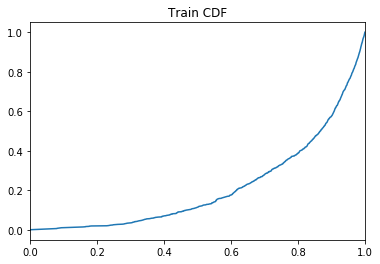

 19%|█▉        | 94026/491198 [08:21<418:44:08,  3.80s/it]

Training Accuracy at epoch 5: 72.55596078431373
Validation Accuracy epoch 5: 72.66494117647059
Training AUC at epoch 5: 0.2135519090909091
Validation AUC epoch 5: 0.21469754545454545
Train: Sensitivity: 0.7255634972023072 Specificity: 0.7255557142475983
Val: Sensitivity: 0.7267010101835811 Specificity: 0.7265980359317429


 29%|██▉       | 143982/491198 [11:21<22:36, 255.93it/s]  

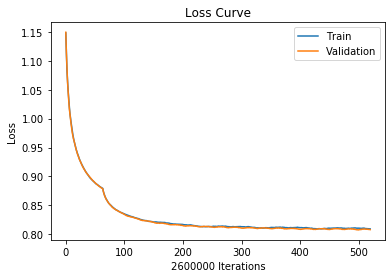

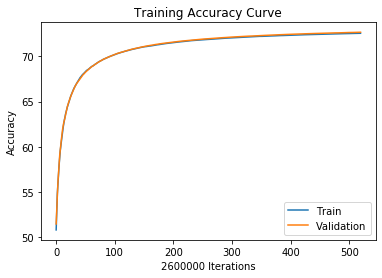

 29%|██▉       | 143982/491198 [11:40<22:36, 255.93it/s]

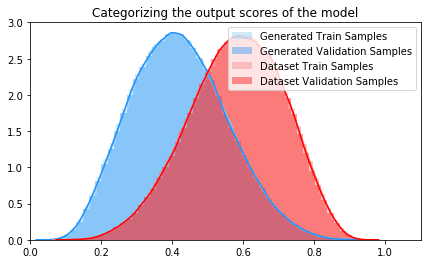

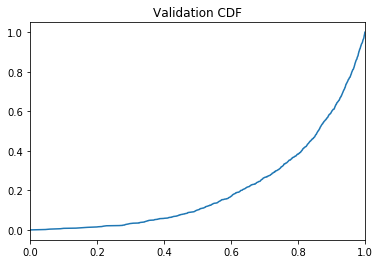

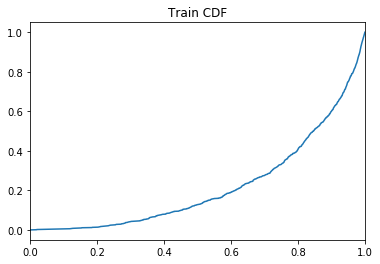

 29%|██▉       | 144038/491198 [12:43<59:42:50,  1.61it/s]

Training Accuracy at epoch 5: 72.57076923076923
Validation Accuracy epoch 5: 72.6845
Training AUC at epoch 5: 0.21956854545454546
Validation AUC epoch 5: 0.20789281818181818
Train: Sensitivity: 0.7257816271868187 Specificity: 0.7256336722975989
Val: Sensitivity: 0.72689029636048 Specificity: 0.7267998980653917


 36%|███▋      | 179058/491198 [15:06<19:07, 272.06it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 80%|████████  | 394000/491198 [33:59<07:34, 213.72it/s]

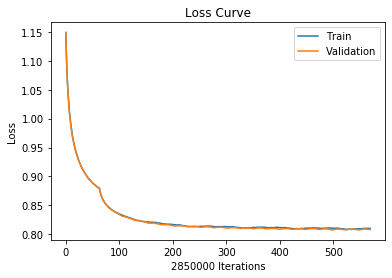

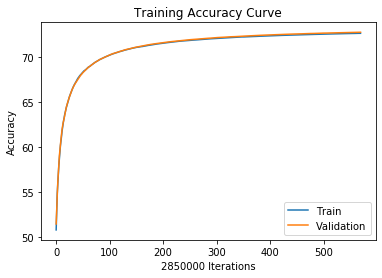

 80%|████████  | 394000/491198 [34:10<07:34, 213.72it/s]

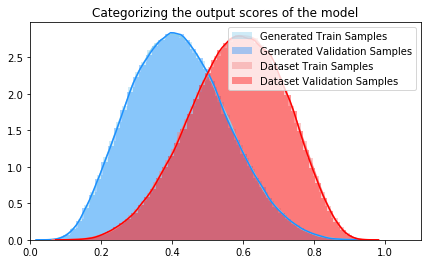

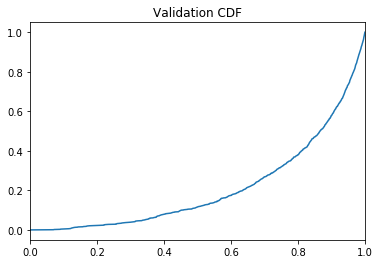

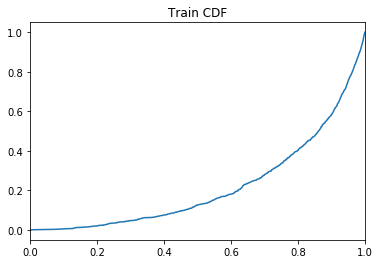

 80%|████████  | 394044/491198 [35:15<43:02:39,  1.59s/it]

Training Accuracy at epoch 5: 72.6359298245614
Validation Accuracy epoch 5: 72.75263157894737
Training AUC at epoch 5: 0.2176818181818182
Validation AUC epoch 5: 0.21023509090909093
Train: Sensitivity: 0.7264719043123679 Specificity: 0.7262465647236261
Val: Sensitivity: 0.7276557617664827 Specificity: 0.7273974319743491


 90%|█████████ | 444006/491198 [38:29<03:16, 240.43it/s]  

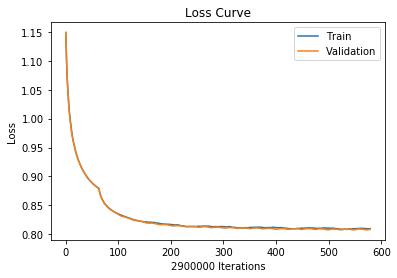

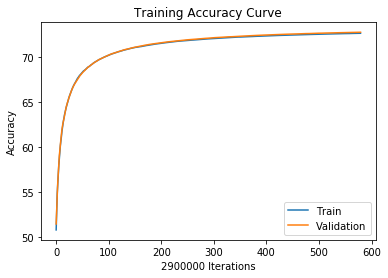

 90%|█████████ | 444006/491198 [38:40<03:16, 240.43it/s]

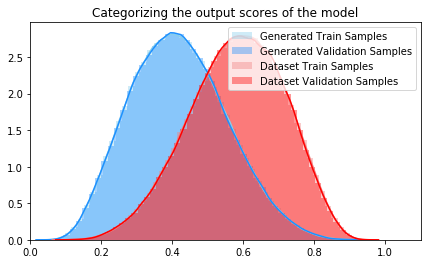

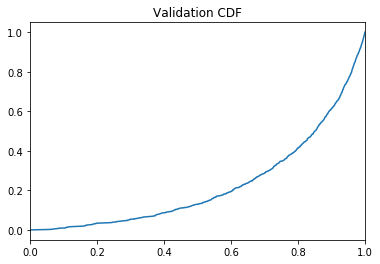

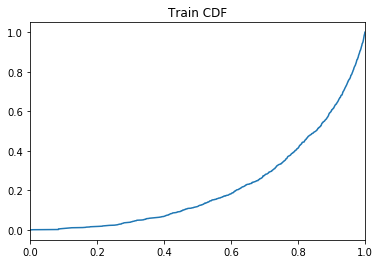

 90%|█████████ | 444039/491198 [39:46<53:30:31,  4.08s/it]

Training Accuracy at epoch 5: 72.64996551724138
Validation Accuracy epoch 5: 72.76268965517241
Training AUC at epoch 5: 0.21801354545454543
Validation AUC epoch 5: 0.22705836363636364
Train: Sensitivity: 0.7265856237515113 Specificity: 0.7264135971394781
Val: Sensitivity: 0.7277908799597442 Specificity: 0.7274636470481376


  0%|          | 29/491198 [00:00<28:18, 289.15it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 6  with learning rate:  [0.0007]


  1%|          | 2807/491198 [00:10<31:02, 262.27it/s]

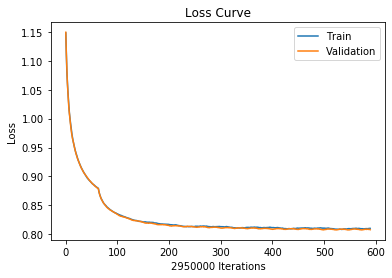

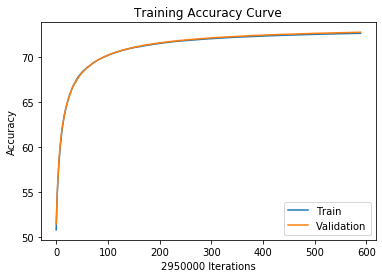

  1%|          | 2807/491198 [00:29<31:02, 262.27it/s]

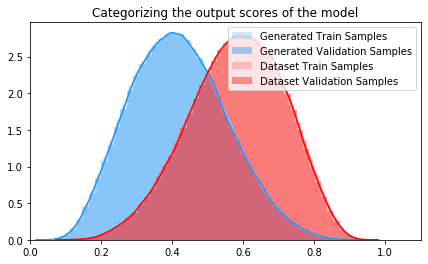

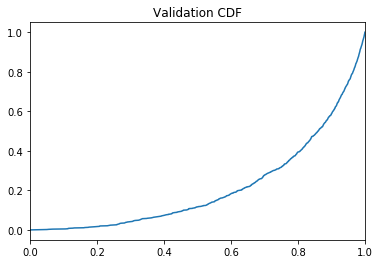

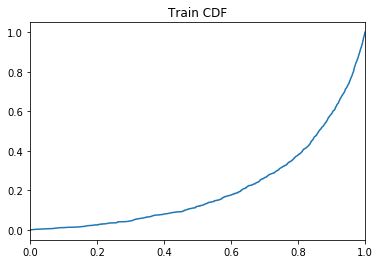

  1%|          | 2828/491198 [01:26<432:31:59,  3.19s/it]

Training Accuracy at epoch 6: 72.66071186440678
Validation Accuracy epoch 6: 72.7788813559322
Training AUC at epoch 6: 0.21316636363636363
Validation AUC epoch 6: 0.21320945454545454
Train: Sensitivity: 0.726714833488386 Specificity: 0.726499280605797
Val: Sensitivity: 0.7279943250614581 Specificity: 0.7275842101489177


 11%|█         | 52810/491198 [04:38<27:09, 269.00it/s]  

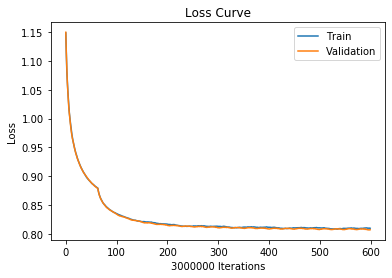

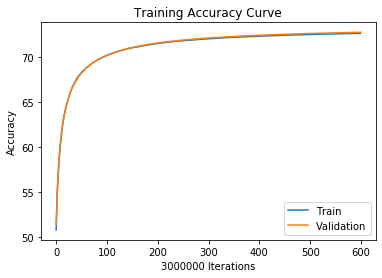

 11%|█         | 52810/491198 [04:50<27:09, 269.00it/s]

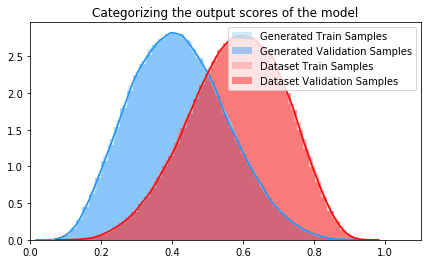

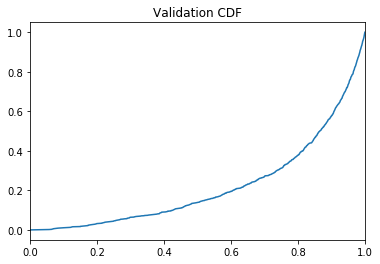

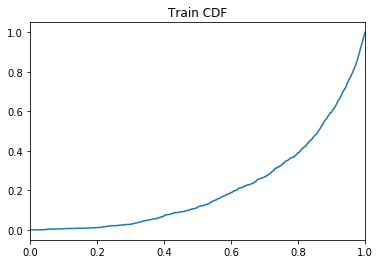

 11%|█         | 52846/491198 [05:54<962:08:30,  7.90s/it] 

Training Accuracy at epoch 6: 72.67473333333334
Validation Accuracy epoch 6: 72.79006666666666
Training AUC at epoch 6: 0.21261245454545455
Validation AUC epoch 6: 0.21935681818181818
Train: Sensitivity: 0.7268388371793958 Specificity: 0.7266557319532204
Val: Sensitivity: 0.7281369697722849 Specificity: 0.7276653887781297


 21%|██        | 102802/491198 [08:54<26:54, 240.62it/s]  

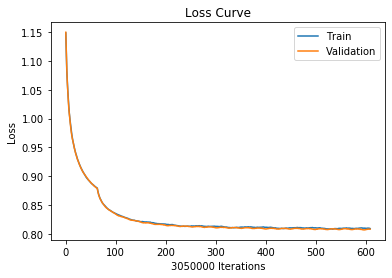

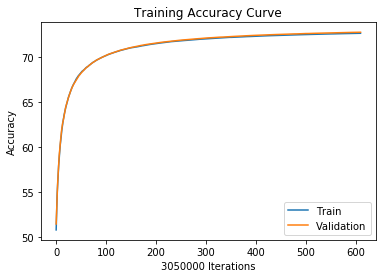

 21%|██        | 102802/491198 [09:10<26:54, 240.62it/s]

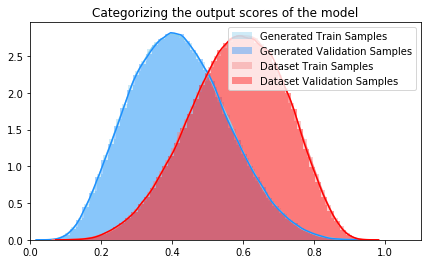

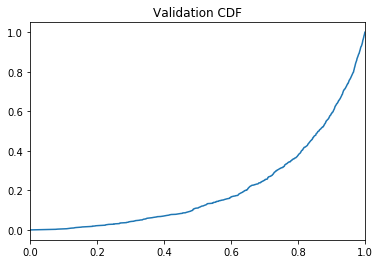

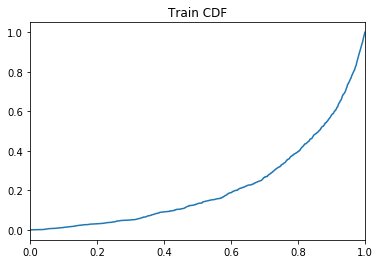

 21%|██        | 102846/491198 [10:11<174:42:58,  1.62s/it]

Training Accuracy at epoch 6: 72.68521311475409
Validation Accuracy epoch 6: 72.79931147540984
Training AUC at epoch 6: 0.21921809090909092
Validation AUC epoch 6: 0.20878536363636363
Train: Sensitivity: 0.7269756050565948 Specificity: 0.7267285196807928
Val: Sensitivity: 0.728281278238725 Specificity: 0.7277062239306453


 31%|███       | 152781/491198 [13:23<23:49, 236.71it/s]   

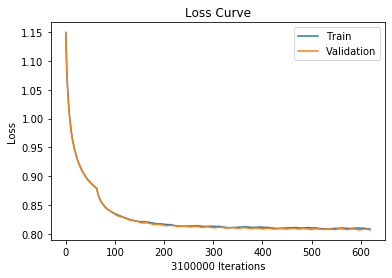

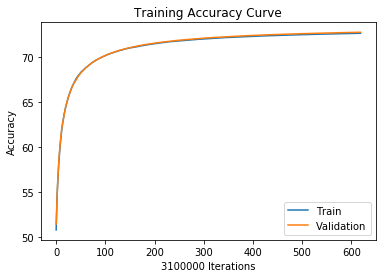

 31%|███       | 152781/491198 [13:40<23:49, 236.71it/s]

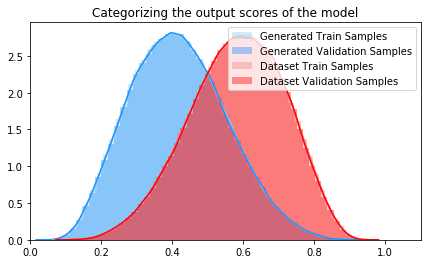

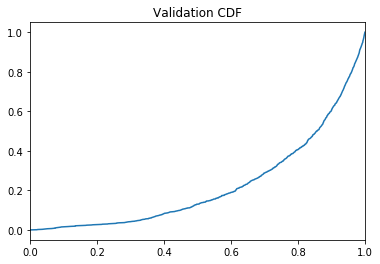

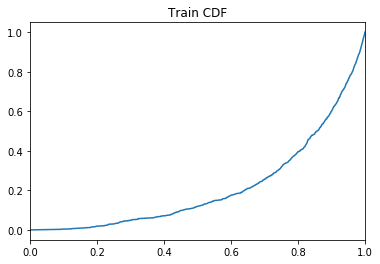

 31%|███       | 152844/491198 [14:40<49:19:40,  1.91it/s]

Training Accuracy at epoch 6: 72.70035483870967
Validation Accuracy epoch 6: 72.81261290322581
Training AUC at epoch 6: 0.2132389090909091
Validation AUC epoch 6: 0.2228509090909091
Train: Sensitivity: 0.7271716113989771 Specificity: 0.7268352953023773
Val: Sensitivity: 0.7283989491808822 Specificity: 0.7278545021008795


 41%|████▏     | 202800/491198 [17:52<18:37, 258.08it/s]  

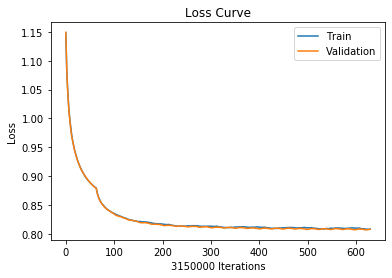

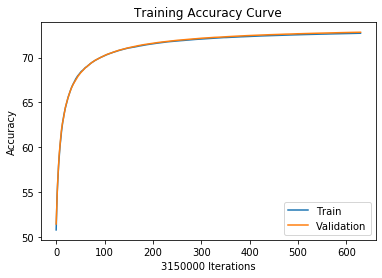

 41%|████▏     | 202800/491198 [18:10<18:37, 258.08it/s]

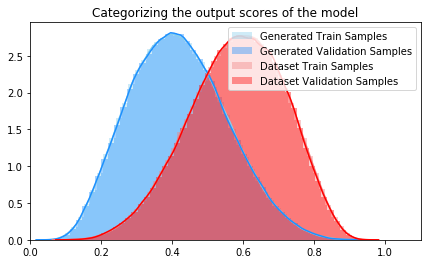

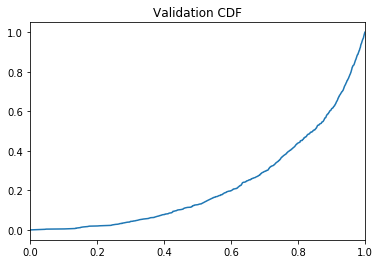

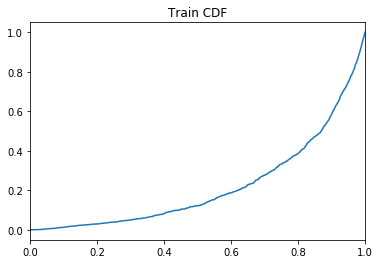

 41%|████▏     | 202828/491198 [19:10<110:00:46,  1.37s/it]

Training Accuracy at epoch 6: 72.71111111111111
Validation Accuracy epoch 6: 72.82101587301587
Training AUC at epoch 6: 0.21878645454545453
Validation AUC epoch 6: 0.22728081818181817
Train: Sensitivity: 0.72727451557717 Specificity: 0.726947520621255
Val: Sensitivity: 0.7284989958689361 Specificity: 0.7279225995443752


 51%|█████▏    | 252808/491198 [22:22<14:34, 272.68it/s]   

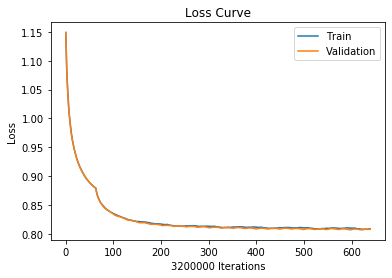

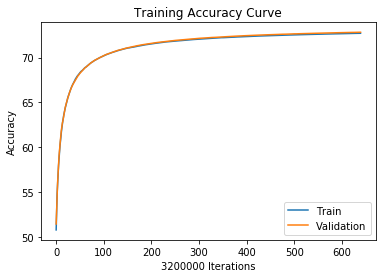

 51%|█████▏    | 252808/491198 [22:40<14:34, 272.68it/s]

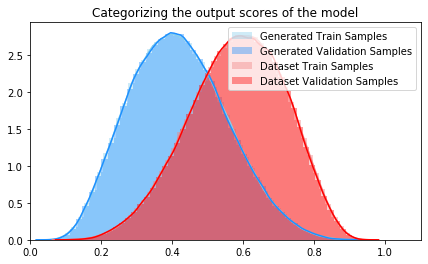

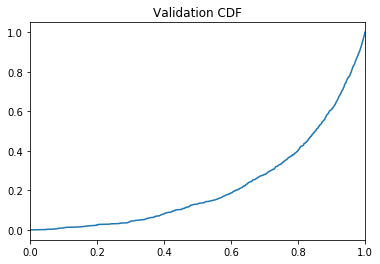

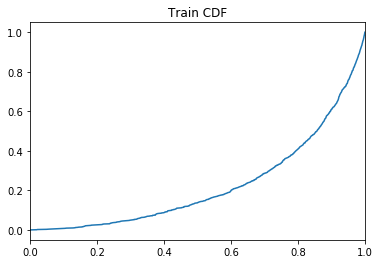

 51%|█████▏    | 252848/491198 [23:39<267:42:30,  4.04s/it]

Training Accuracy at epoch 6: 72.72128125
Validation Accuracy epoch 6: 72.83415625
Training AUC at epoch 6: 0.2253220909090909
Validation AUC epoch 6: 0.22227136363636363
Train: Sensitivity: 0.7273966869878074 Specificity: 0.7270287172303382
Val: Sensitivity: 0.7286300842162626 Specificity: 0.7280543056971716


 62%|██████▏   | 302796/491198 [26:49<10:34, 296.72it/s]   

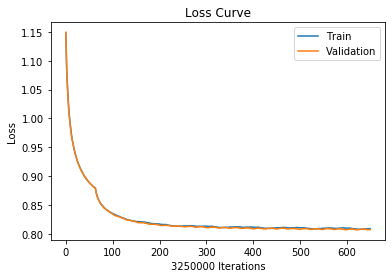

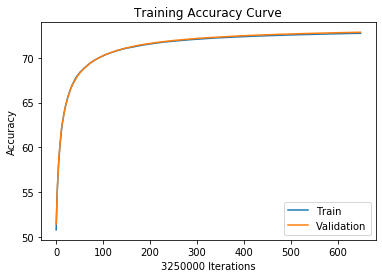

 62%|██████▏   | 302796/491198 [27:00<10:34, 296.72it/s]

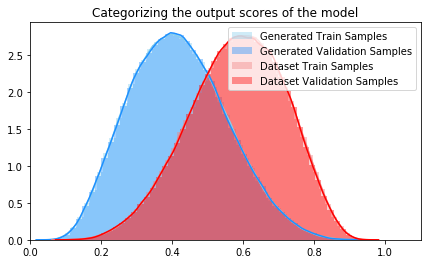

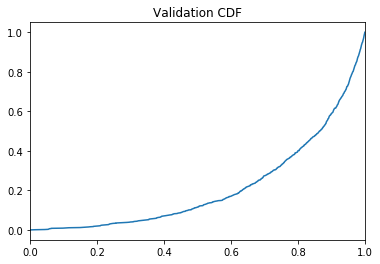

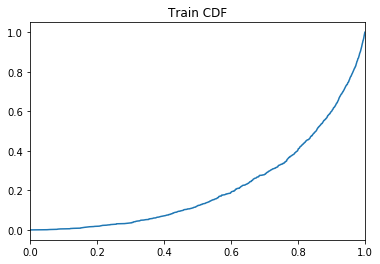

 62%|██████▏   | 302843/491198 [28:07<53:48:22,  1.03s/it]

Training Accuracy at epoch 6: 72.72781538461538
Validation Accuracy epoch 6: 72.84381538461538
Training AUC at epoch 6: 0.21809254545454546
Validation AUC epoch 6: 0.2123702727272727
Train: Sensitivity: 0.7274520934826717 Specificity: 0.7271040156446169
Val: Sensitivity: 0.7287161247469051 Specificity: 0.7281614026512782


 72%|███████▏  | 352801/491198 [31:19<09:33, 241.29it/s]  

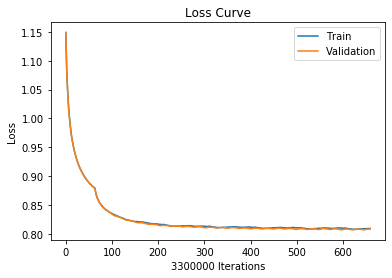

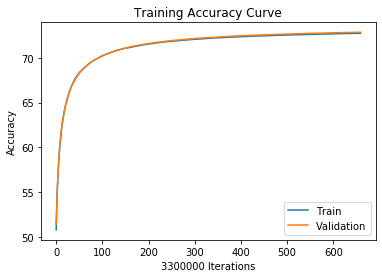

 72%|███████▏  | 352801/491198 [31:30<09:33, 241.29it/s]

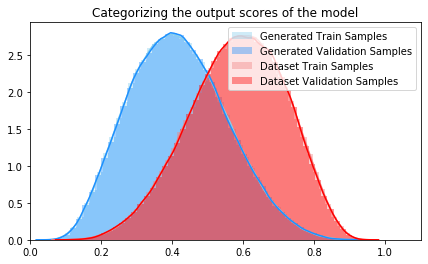

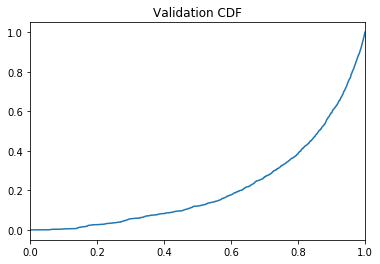

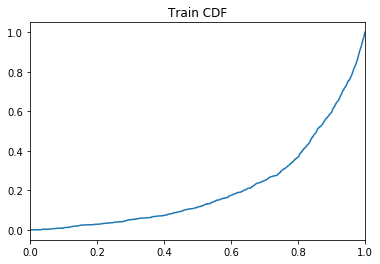

 72%|███████▏  | 352844/491198 [32:36<56:44:47,  1.48s/it]

Training Accuracy at epoch 6: 72.7369090909091
Validation Accuracy epoch 6: 72.85318181818182
Training AUC at epoch 6: 0.21258609090909092
Validation AUC epoch 6: 0.21525872727272727
Train: Sensitivity: 0.7275792541590226 Specificity: 0.7271586602634038
Val: Sensitivity: 0.7288618333097454 Specificity: 0.7282032706507982


 82%|████████▏ | 402787/491198 [35:48<06:04, 242.59it/s]  

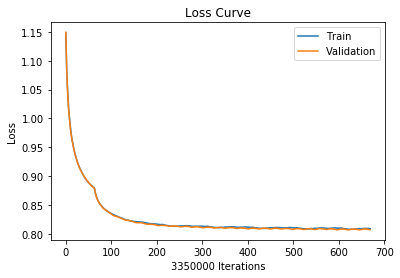

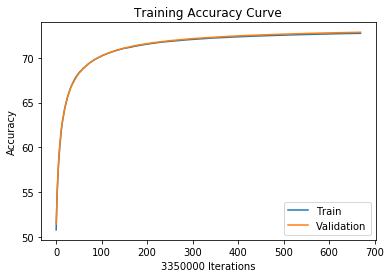

 82%|████████▏ | 402787/491198 [36:00<06:04, 242.59it/s]

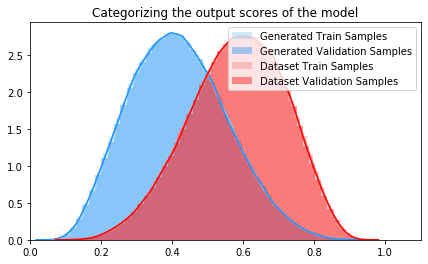

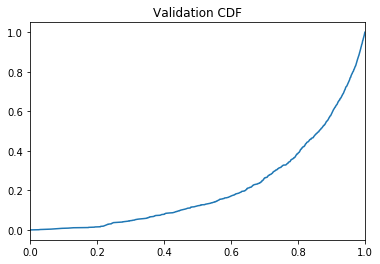

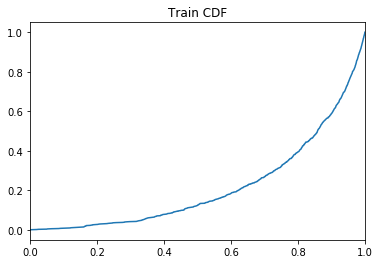

 82%|████████▏ | 402828/491198 [37:05<16:04:06,  1.53it/s]

Training Accuracy at epoch 6: 72.74689552238806
Validation Accuracy epoch 6: 72.86420895522389
Training AUC at epoch 6: 0.2167476363636364
Validation AUC epoch 6: 0.21236518181818181
Train: Sensitivity: 0.7276596404826103 Specificity: 0.727278049211753
Val: Sensitivity: 0.7289612209414336 Specificity: 0.7283243399097123


 92%|█████████▏| 452786/491198 [40:16<02:23, 267.35it/s]  

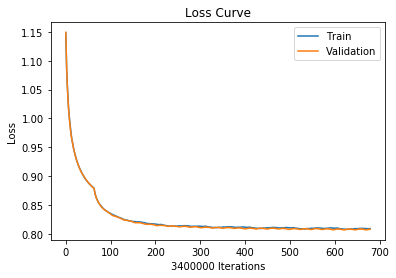

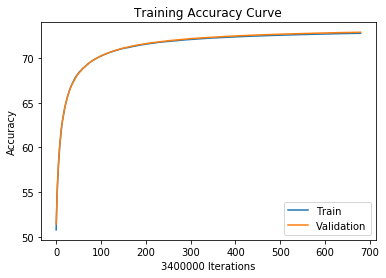

 92%|█████████▏| 452786/491198 [40:30<02:23, 267.35it/s]

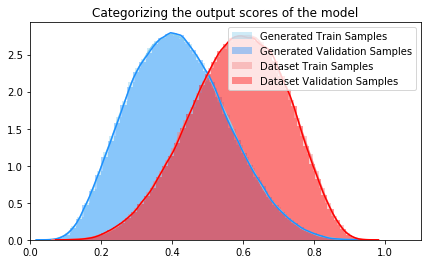

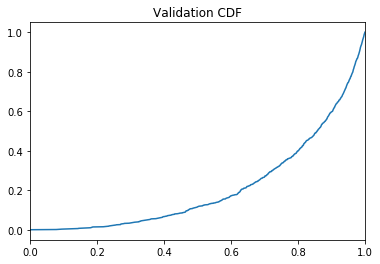

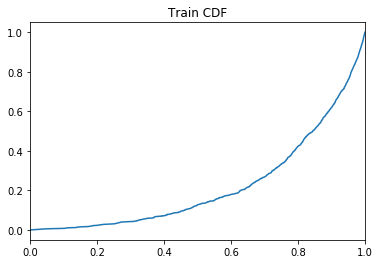

 92%|█████████▏| 452843/491198 [41:42<7:25:38,  1.43it/s] 

Training Accuracy at epoch 6: 72.75676470588235
Validation Accuracy epoch 6: 72.87091176470588
Training AUC at epoch 6: 0.22072463636363637
Validation AUC epoch 6: 0.21214954545454545
Train: Sensitivity: 0.7277141684608844 Specificity: 0.7274209818228472
Val: Sensitivity: 0.7290066795186974 Specificity: 0.7284128726295216


  0%|          | 25/491198 [00:00<33:08, 247.06it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 7  with learning rate:  [0.0007]


  2%|▏         | 11586/491198 [00:46<29:17, 272.86it/s]

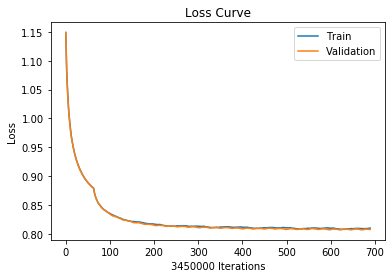

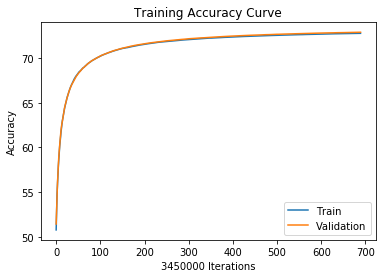

  2%|▏         | 11586/491198 [01:00<29:17, 272.86it/s]

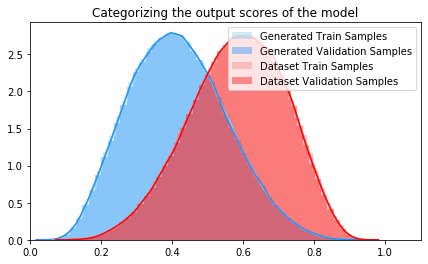

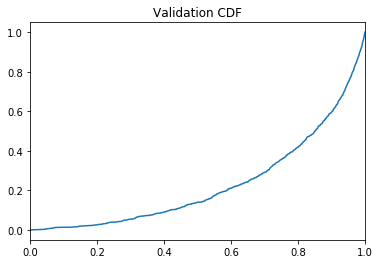

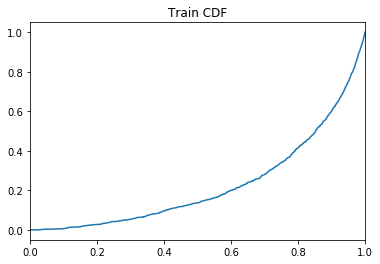

  2%|▏         | 11643/491198 [02:12<86:31:55,  1.54it/s] 

Training Accuracy at epoch 7: 72.76397101449275
Validation Accuracy epoch 7: 72.88402898550724
Training AUC at epoch 7: 0.22625745454545454
Validation AUC epoch 7: 0.22910136363636363
Train: Sensitivity: 0.7278356261529761 Specificity: 0.7274435741331947
Val: Sensitivity: 0.7291986934802994 Specificity: 0.7284834560205832


 13%|█▎        | 61582/491198 [05:19<31:51, 224.71it/s]  

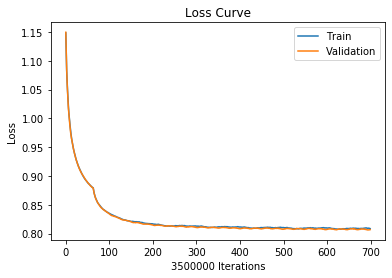

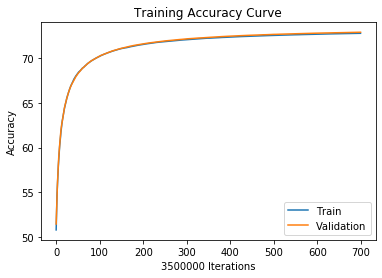

 13%|█▎        | 61582/491198 [05:30<31:51, 224.71it/s]

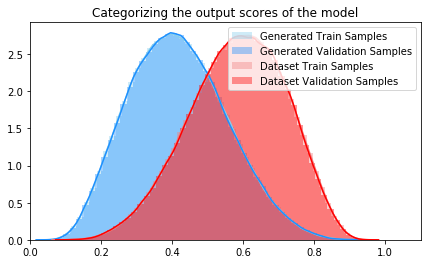

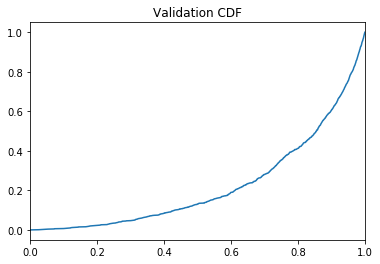

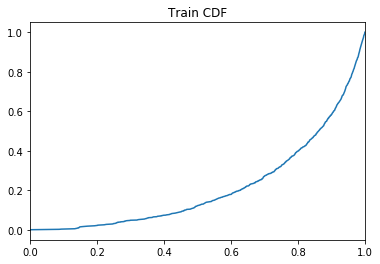

 13%|█▎        | 61646/491198 [06:43<65:46:59,  1.81it/s]

Training Accuracy at epoch 7: 72.77714285714286
Validation Accuracy epoch 7: 72.89445714285715
Training AUC at epoch 7: 0.21472836363636366
Validation AUC epoch 7: 0.22349918181818185
Train: Sensitivity: 0.7279408909083848 Specificity: 0.7276017856366934
Val: Sensitivity: 0.7293131894720626 Specificity: 0.7285775620970597


 23%|██▎       | 111585/491198 [09:55<25:59, 243.48it/s] 

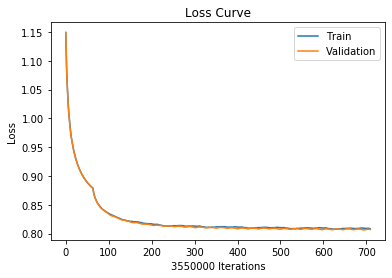

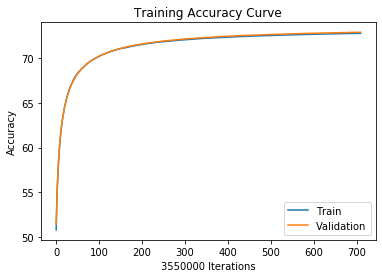

 23%|██▎       | 111585/491198 [10:10<25:59, 243.48it/s]

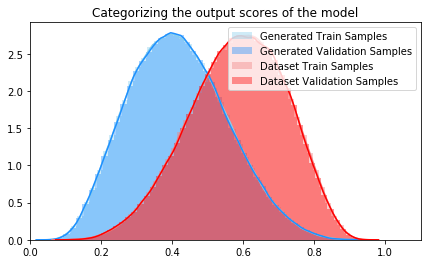

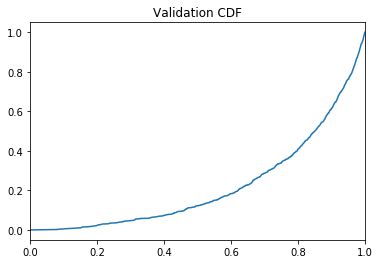

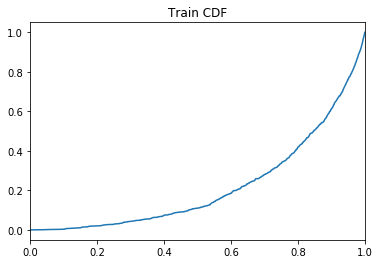

 23%|██▎       | 111630/491198 [11:14<60:08:34,  1.75it/s]

Training Accuracy at epoch 7: 72.78439436619718
Validation Accuracy epoch 7: 72.90357746478874
Training AUC at epoch 7: 0.2190461818181818
Validation AUC epoch 7: 0.2211647272727273
Train: Sensitivity: 0.728057762985044 Specificity: 0.7276298960628572
Val: Sensitivity: 0.7294572873060631 Specificity: 0.7286161262868662


 33%|███▎      | 161606/491198 [14:26<20:16, 270.92it/s]  

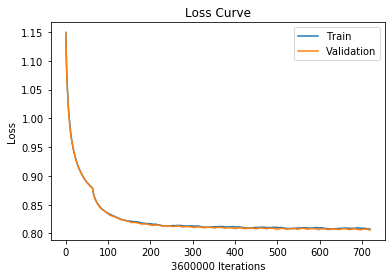

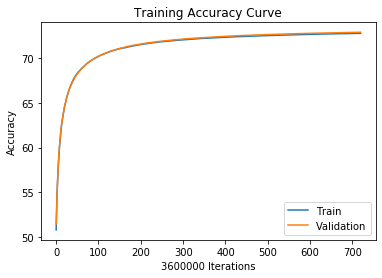

 33%|███▎      | 161606/491198 [14:40<20:16, 270.92it/s]

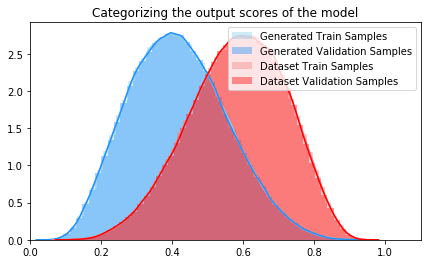

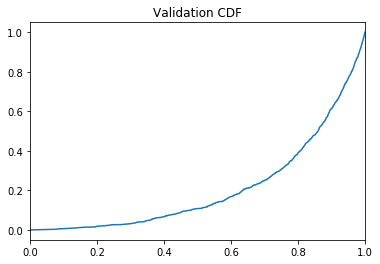

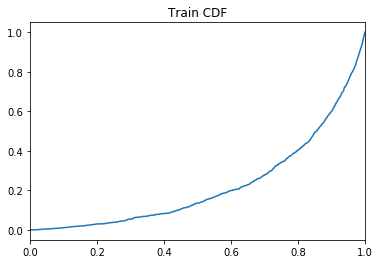

 33%|███▎      | 161642/491198 [15:54<210:43:19,  2.30s/it]

Training Accuracy at epoch 7: 72.79583333333333
Validation Accuracy epoch 7: 72.913
Training AUC at epoch 7: 0.22405318181818182
Validation AUC epoch 7: 0.20969263636363636
Train: Sensitivity: 0.7282024431453178 Specificity: 0.7277139415473709
Val: Sensitivity: 0.7295653195449476 Specificity: 0.7286965622798173


 43%|████▎     | 211605/491198 [19:07<19:41, 236.63it/s]   

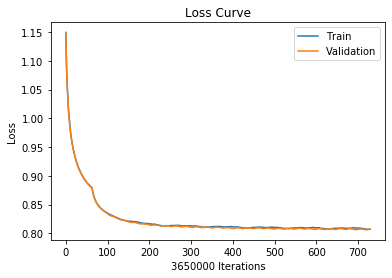

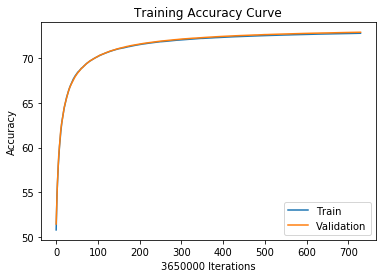

 43%|████▎     | 211605/491198 [19:20<19:41, 236.63it/s]

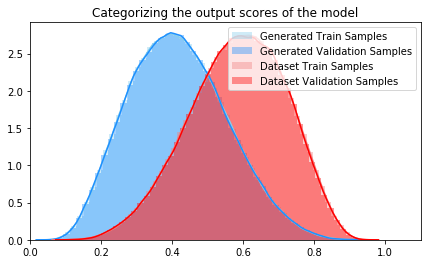

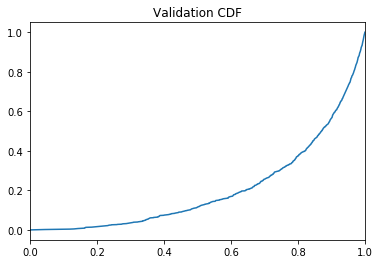

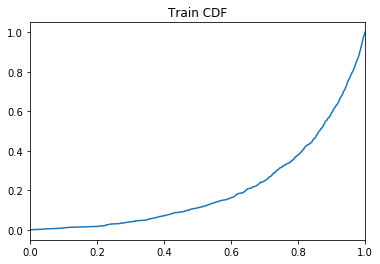

 43%|████▎     | 211648/491198 [20:27<145:19:45,  1.87s/it]

Training Accuracy at epoch 7: 72.80597260273973
Validation Accuracy epoch 7: 72.91838356164384
Training AUC at epoch 7: 0.2086699090909091
Validation AUC epoch 7: 0.20506154545454547
Train: Sensitivity: 0.7283003761656948 Specificity: 0.7278187969689842
Val: Sensitivity: 0.7296128642182902 Specificity: 0.7287566887241247


 53%|█████▎    | 261594/491198 [23:34<17:52, 214.02it/s]   

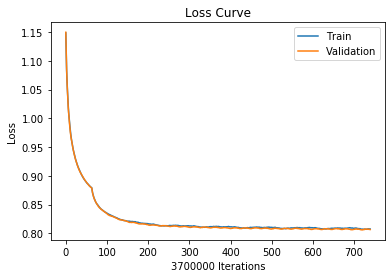

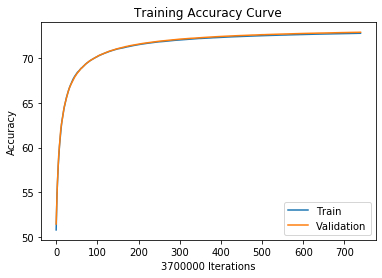

 53%|█████▎    | 261594/491198 [23:50<17:52, 214.02it/s]

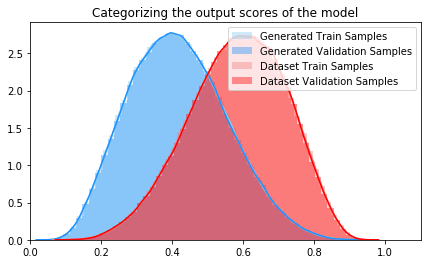

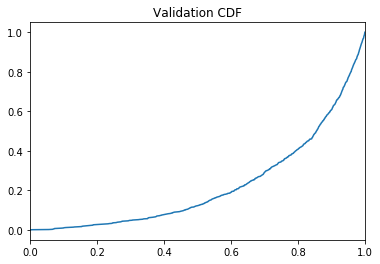

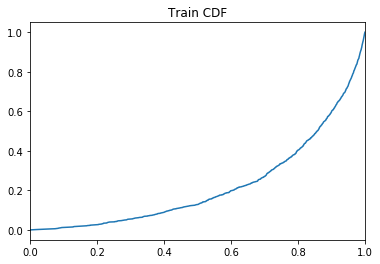

 53%|█████▎    | 261646/491198 [24:54<53:48:53,  1.18it/s]

Training Accuracy at epoch 7: 72.81454054054053
Validation Accuracy epoch 7: 72.92854054054054
Training AUC at epoch 7: 0.22229445454545455
Validation AUC epoch 7: 0.223559
Train: Sensitivity: 0.7283956352887092 Specificity: 0.7278948726283628
Val: Sensitivity: 0.7297057320996824 Specificity: 0.7288669363037641


 63%|██████▎   | 311602/491198 [28:17<11:47, 253.71it/s]  

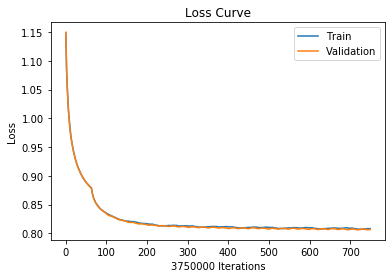

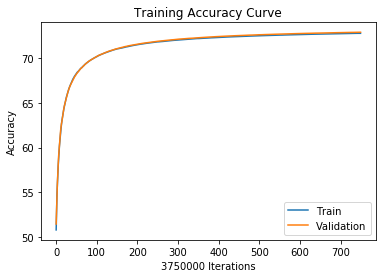

 63%|██████▎   | 311602/491198 [28:30<11:47, 253.71it/s]

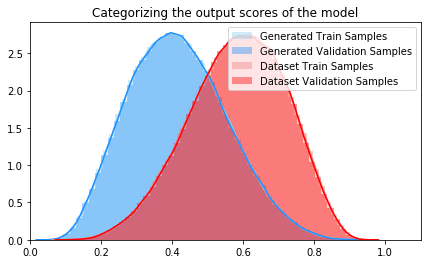

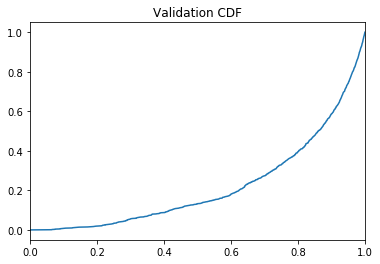

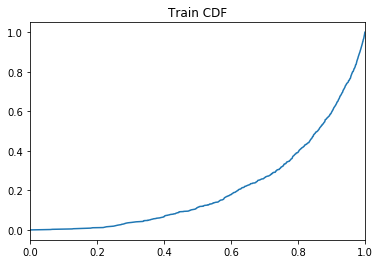

 63%|██████▎   | 311630/491198 [29:45<77:04:59,  1.55s/it] 

Training Accuracy at epoch 7: 72.81714666666667
Validation Accuracy epoch 7: 72.93570666666666
Training AUC at epoch 7: 0.21078854545454545
Validation AUC epoch 7: 0.21876718181818183
Train: Sensitivity: 0.7284359318077035 Specificity: 0.7279066726792914
Val: Sensitivity: 0.729792960053878 Specificity: 0.7289230777417973


 74%|███████▎  | 361607/491198 [33:05<08:21, 258.66it/s]  

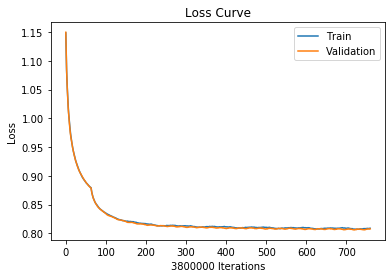

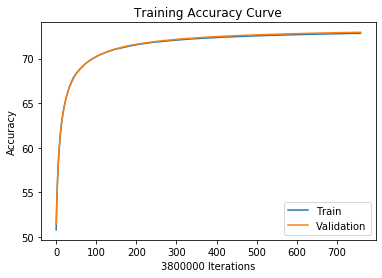

 74%|███████▎  | 361607/491198 [33:20<08:21, 258.66it/s]

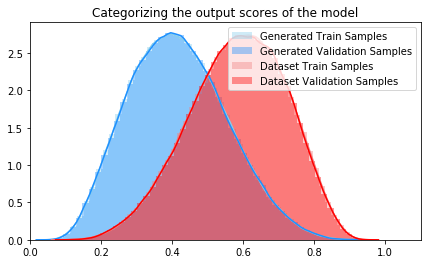

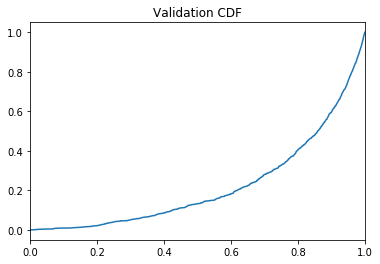

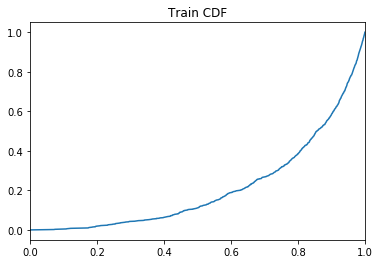

 74%|███████▎  | 361644/491198 [34:26<87:42:40,  2.44s/it] 

Training Accuracy at epoch 7: 72.8256052631579
Validation Accuracy epoch 7: 72.94442105263158
Training AUC at epoch 7: 0.21144981818181818
Validation AUC epoch 7: 0.2207451818181818
Train: Sensitivity: 0.728539103156845 Specificity: 0.7279726437462015
Val: Sensitivity: 0.7299145596695056 Specificity: 0.7289759234187632


 84%|████████▍ | 411598/491198 [37:25<05:18, 249.96it/s]  

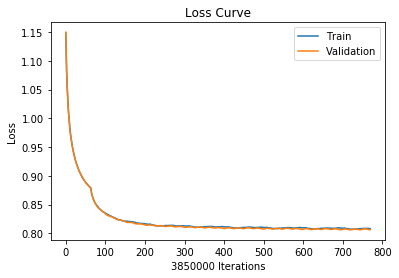

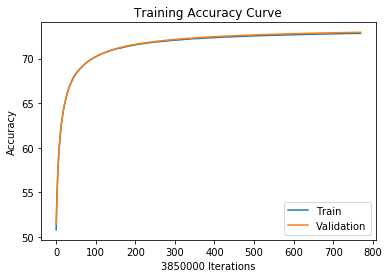

 84%|████████▍ | 411598/491198 [37:40<05:18, 249.96it/s]

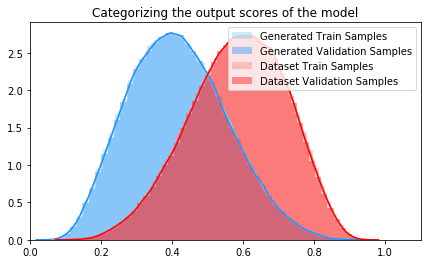

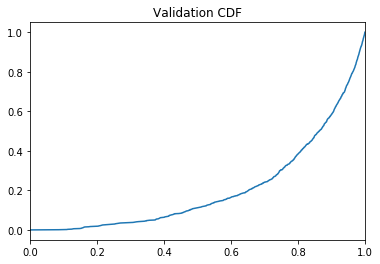

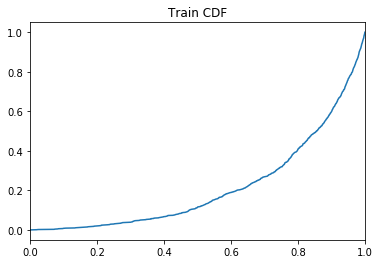

 84%|████████▍ | 411646/491198 [38:50<24:35:18,  1.11s/it]

Training Accuracy at epoch 7: 72.83374025974025
Validation Accuracy epoch 7: 72.95355844155844
Training AUC at epoch 7: 0.215478
Validation AUC epoch 7: 0.20536990909090908
Train: Sensitivity: 0.7286006803257922 Specificity: 0.7280738139494268
Val: Sensitivity: 0.7300081893003901 Specificity: 0.7290650378058067


 94%|█████████▍| 461600/491198 [42:05<02:04, 238.45it/s]  

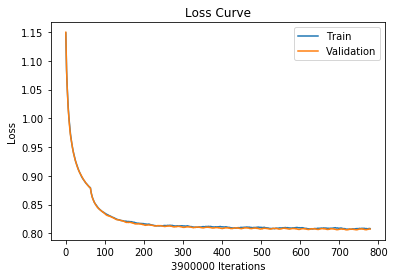

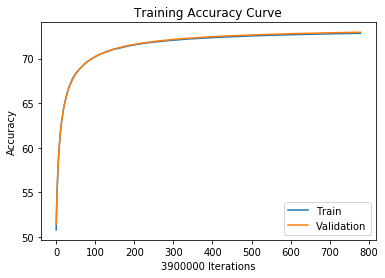

 94%|█████████▍| 461600/491198 [42:20<02:04, 238.45it/s]

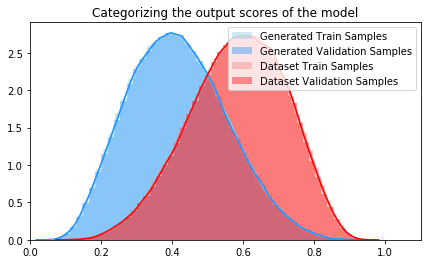

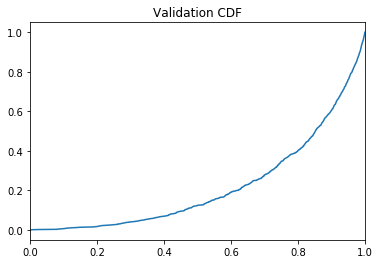

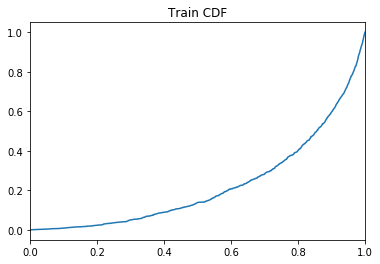

 94%|█████████▍| 461646/491198 [43:29<10:16:31,  1.25s/it]

Training Accuracy at epoch 7: 72.84146153846154
Validation Accuracy epoch 7: 72.9573076923077
Training AUC at epoch 7: 0.22363045454545458
Validation AUC epoch 7: 0.21836227272727274
Train: Sensitivity: 0.7286351104283818 Specificity: 0.7281938956607134
Val: Sensitivity: 0.7300126636145163 Specificity: 0.7291354102917307


  0%|          | 23/491198 [00:00<36:20, 225.21it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 8  with learning rate:  [0.0007]


  4%|▍         | 20407/491198 [01:36<37:57, 206.70it/s]

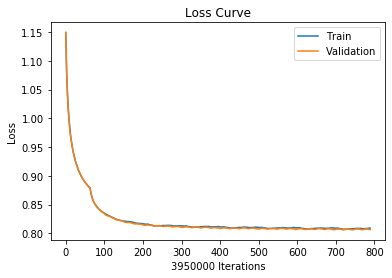

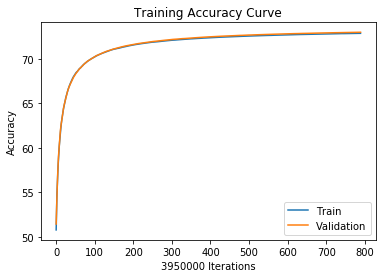

  4%|▍         | 20407/491198 [01:50<37:57, 206.70it/s]

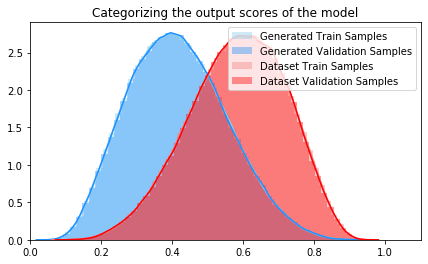

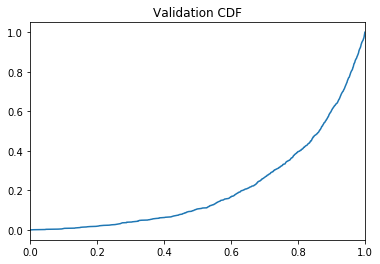

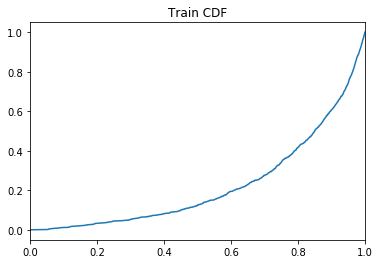

  4%|▍         | 20432/491198 [03:00<256:45:39,  1.96s/it]

Training Accuracy at epoch 8: 72.84810126582279
Validation Accuracy epoch 8: 72.96822784810126
Training AUC at epoch 8: 0.22363790909090908
Validation AUC epoch 8: 0.21033163636363633
Train: Sensitivity: 0.7287183597952679 Specificity: 0.728243413980265
Val: Sensitivity: 0.7301444414280241 Specificity: 0.7292221259482495


 14%|█▍        | 70389/491198 [06:58<33:04, 212.09it/s]   

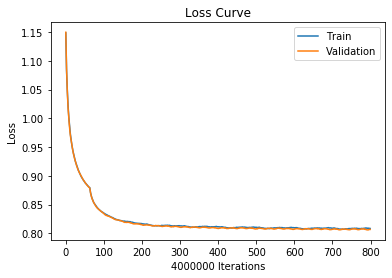

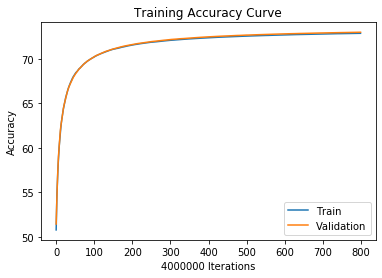

 14%|█▍        | 70389/491198 [07:10<33:04, 212.09it/s]

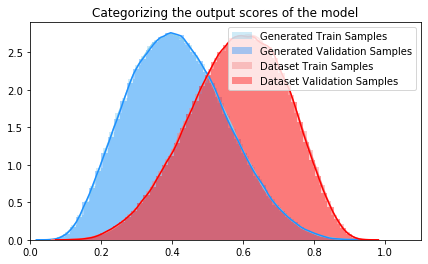

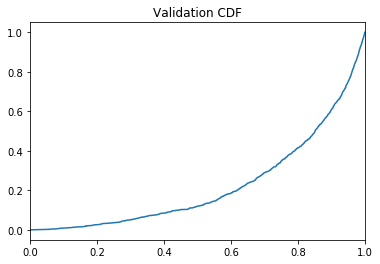

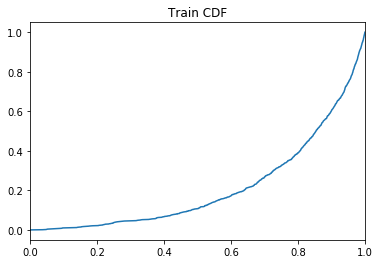

 14%|█▍        | 70445/491198 [08:26<80:04:52,  1.46it/s] 

Training Accuracy at epoch 8: 72.85585
Validation Accuracy epoch 8: 72.9742
Training AUC at epoch 8: 0.2133730909090909
Validation AUC epoch 8: 0.22324563636363637
Train: Sensitivity: 0.7287881059470265 Specificity: 0.728328664332166
Val: Sensitivity: 0.7302415081291952 Specificity: 0.7292446923416558


 25%|██▍       | 120399/491198 [12:10<28:57, 213.37it/s] 

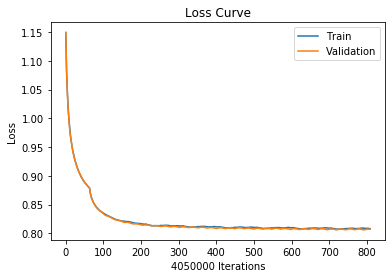

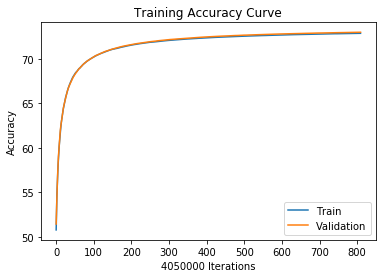

 25%|██▍       | 120399/491198 [12:30<28:57, 213.37it/s]

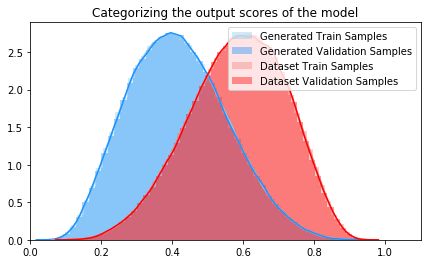

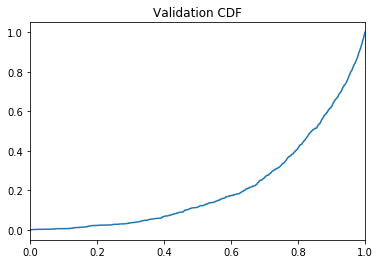

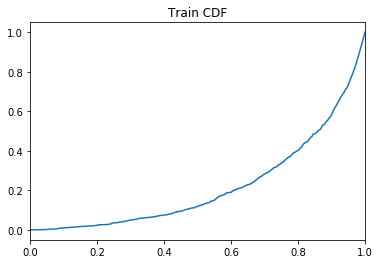

 25%|██▍       | 120442/491198 [13:36<109:44:18,  1.07s/it]

Training Accuracy at epoch 8: 72.86348148148149
Validation Accuracy epoch 8: 72.98251851851852
Training AUC at epoch 8: 0.21850654545454545
Validation AUC epoch 8: 0.21727827272727274
Train: Sensitivity: 0.7289108162239905 Specificity: 0.7283585172097233
Val: Sensitivity: 0.7303537614686164 Specificity: 0.7292989456443651


 35%|███▍      | 170395/491198 [17:35<28:04, 190.43it/s]   

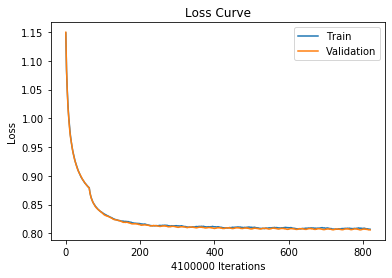

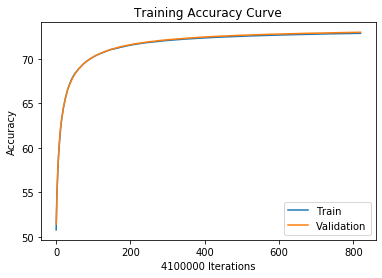

 35%|███▍      | 170395/491198 [17:50<28:04, 190.43it/s]

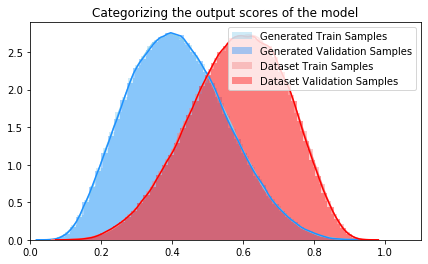

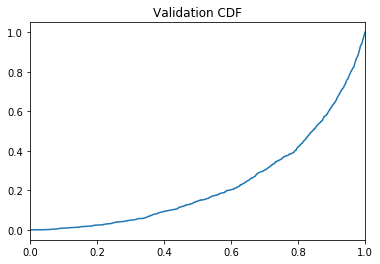

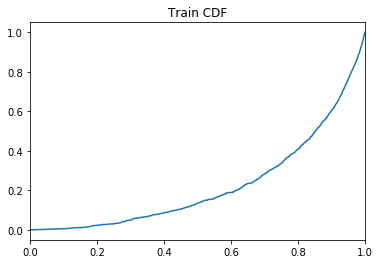

 35%|███▍      | 170448/491198 [19:00<75:32:06,  1.18it/s] 

Training Accuracy at epoch 8: 72.87168292682927
Validation Accuracy epoch 8: 72.99036585365853
Training AUC at epoch 8: 0.2232280909090909
Validation AUC epoch 8: 0.2317612727272727
Train: Sensitivity: 0.7290078178134987 Specificity: 0.7284255325379531
Val: Sensitivity: 0.7304294219391502 Specificity: 0.7293802013720087


 45%|████▍     | 220415/491198 [22:12<16:48, 268.40it/s]  

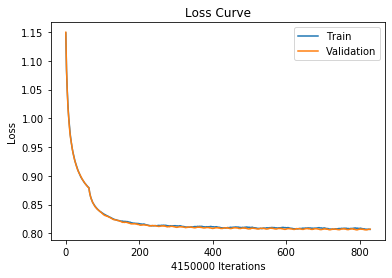

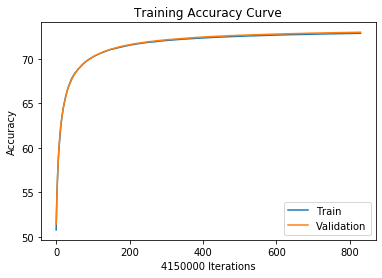

 45%|████▍     | 220415/491198 [22:30<16:48, 268.40it/s]

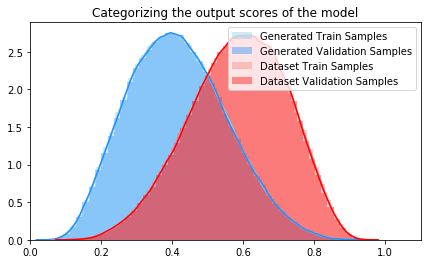

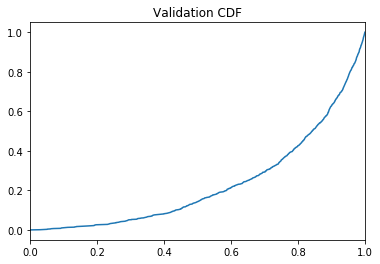

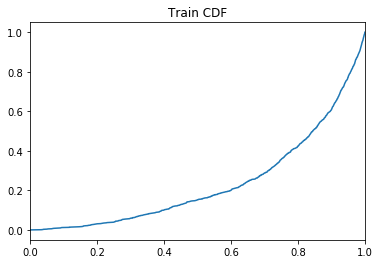

 45%|████▍     | 220432/491198 [23:36<1325:02:43, 17.62s/it]

Training Accuracy at epoch 8: 72.87966265060241
Validation Accuracy epoch 8: 72.99493975903614
Training AUC at epoch 8: 0.23425527272727273
Validation AUC epoch 8: 0.23186454545454546
Train: Sensitivity: 0.7290913276934666 Specificity: 0.7285015922246204
Val: Sensitivity: 0.7304862016037031 Specificity: 0.7294149384816464


 55%|█████▌    | 270388/491198 [26:48<14:02, 262.06it/s]    

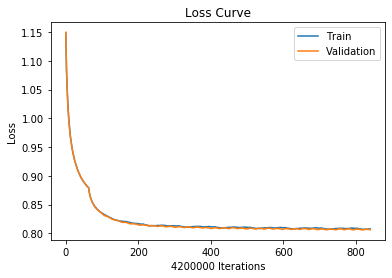

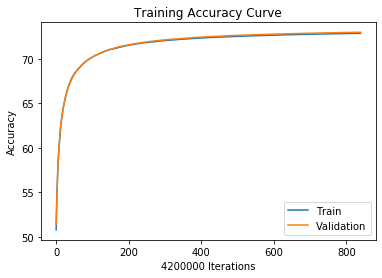

 55%|█████▌    | 270388/491198 [27:00<14:02, 262.06it/s]

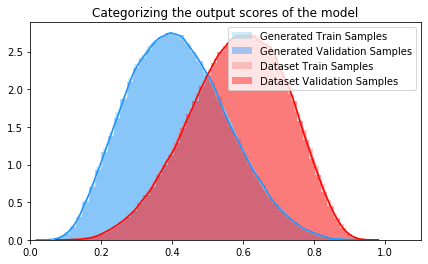

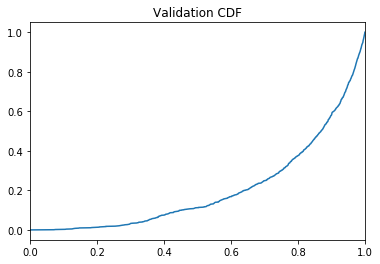

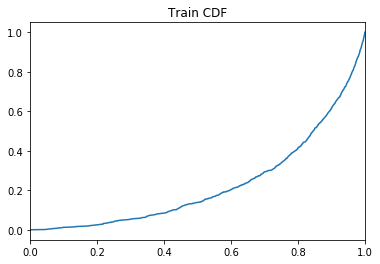

 55%|█████▌    | 270450/491198 [28:12<38:50:15,  1.58it/s]

Training Accuracy at epoch 8: 72.88533333333334
Validation Accuracy epoch 8: 73.00330952380952
Training AUC at epoch 8: 0.22864518181818183
Validation AUC epoch 8: 0.20450063636363638
Train: Sensitivity: 0.7291691453122428 Specificity: 0.7285371355274982
Val: Sensitivity: 0.7305736770018564 Specificity: 0.7294948611830445


 65%|██████▌   | 320408/491198 [31:23<11:42, 243.23it/s]  

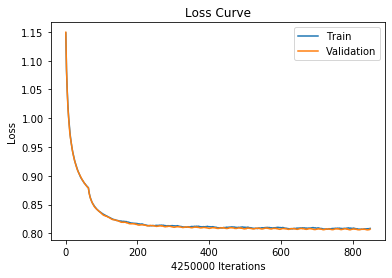

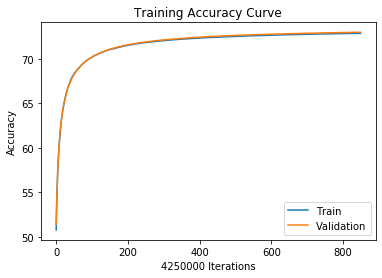

 65%|██████▌   | 320408/491198 [31:40<11:42, 243.23it/s]

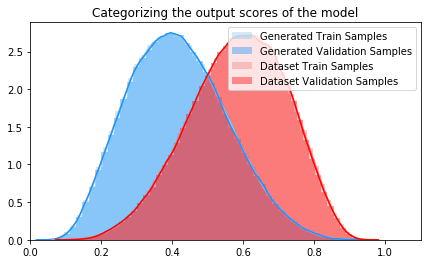

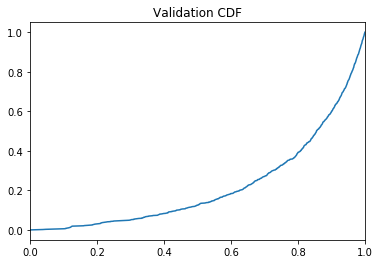

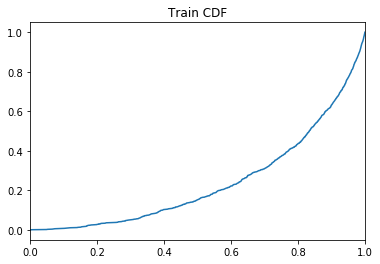

 65%|██████▌   | 320450/491198 [32:48<105:10:17,  2.22s/it]

Training Accuracy at epoch 8: 72.88724705882353
Validation Accuracy epoch 8: 73.00736470588235
Training AUC at epoch 8: 0.24008845454545452
Validation AUC epoch 8: 0.21965154545454546
Train: Sensitivity: 0.7291885551750312 Specificity: 0.7285559972387736
Val: Sensitivity: 0.7306347394634569 Specificity: 0.7295150627300728


 75%|███████▌  | 370410/491198 [35:46<08:14, 244.21it/s]   

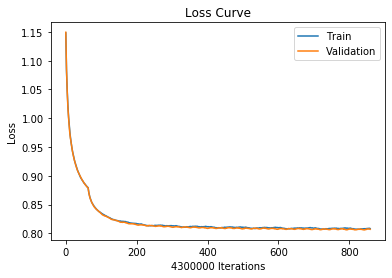

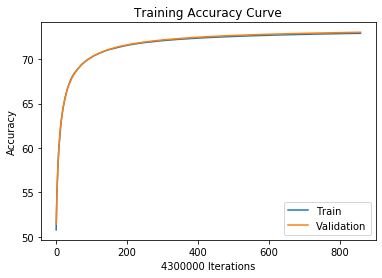

 75%|███████▌  | 370410/491198 [36:00<08:14, 244.21it/s]

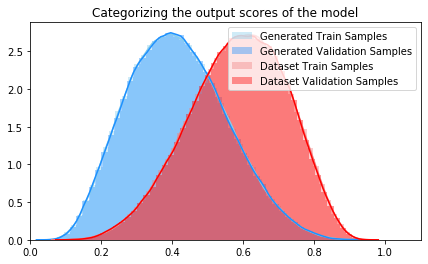

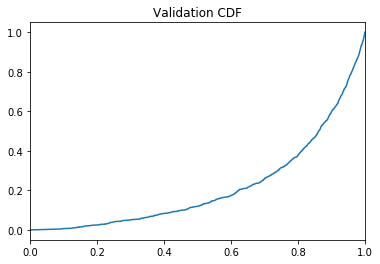

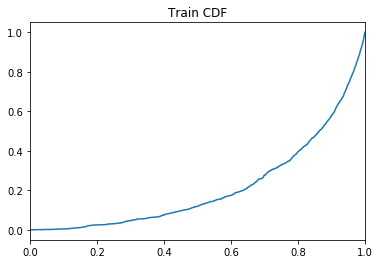

 75%|███████▌  | 370448/491198 [37:13<101:12:25,  3.02s/it]

Training Accuracy at epoch 8: 72.89686046511628
Validation Accuracy epoch 8: 73.01532558139535
Training AUC at epoch 8: 0.21335345454545457
Validation AUC epoch 8: 0.2145399090909091
Train: Sensitivity: 0.7293016324418949 Specificity: 0.7286351686125874
Val: Sensitivity: 0.7307347001942892 Specificity: 0.7295743717119064


 86%|████████▌ | 420382/491198 [40:25<04:54, 240.18it/s]   

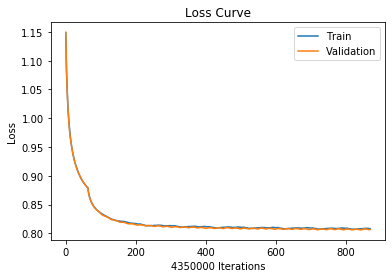

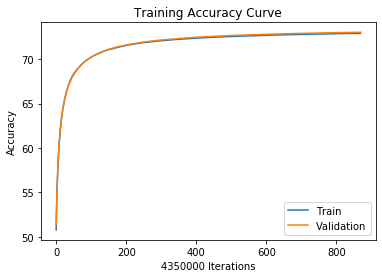

 86%|████████▌ | 420382/491198 [40:40<04:54, 240.18it/s]

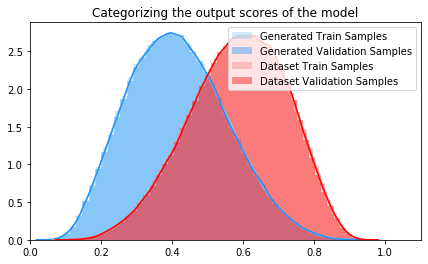

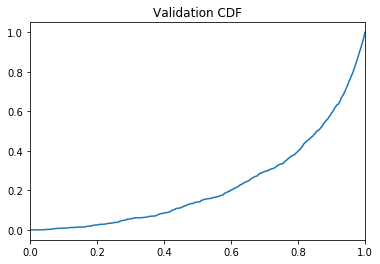

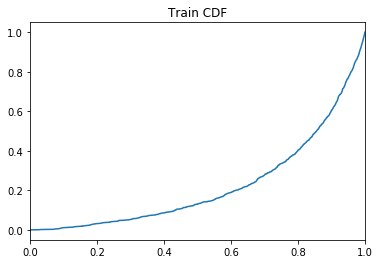

 86%|████████▌ | 420432/491198 [41:52<10:33:15,  1.86it/s]

Training Accuracy at epoch 8: 72.90268965517241
Validation Accuracy epoch 8: 73.02025287356322
Training AUC at epoch 8: 0.22331372727272727
Validation AUC epoch 8: 0.2239200909090909
Train: Sensitivity: 0.7293401094533307 Specificity: 0.7287133176613471
Val: Sensitivity: 0.7307747955304689 Specificity: 0.7296327560500058


 96%|█████████▌| 470395/491198 [45:04<01:17, 270.12it/s]  

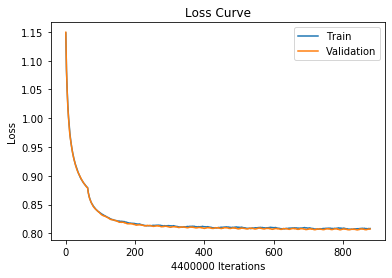

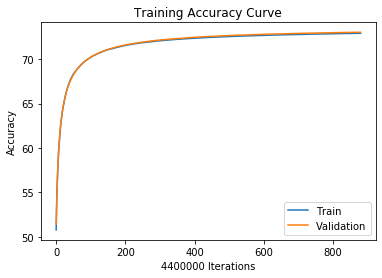

 96%|█████████▌| 470395/491198 [45:21<01:17, 270.12it/s]

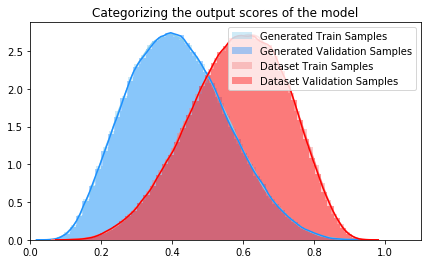

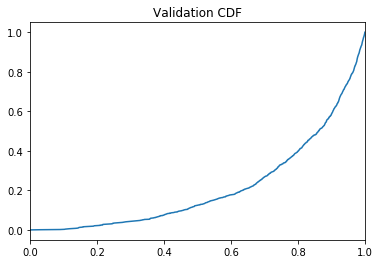

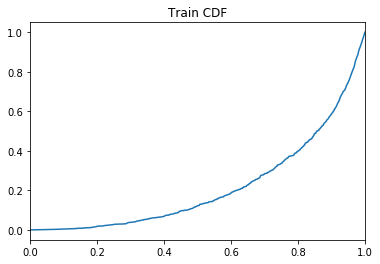

 96%|█████████▌| 470452/491198 [46:30<4:58:21,  1.16it/s]

Training Accuracy at epoch 8: 72.90781818181819
Validation Accuracy epoch 8: 73.02529545454546
Training AUC at epoch 8: 0.21597745454545456
Validation AUC epoch 8: 0.2146381818181818
Train: Sensitivity: 0.7293569645740371 Specificity: 0.7287991064403783
Val: Sensitivity: 0.7308119819312564 Specificity: 0.7296963754088754


  0%|          | 28/491198 [00:00<29:14, 279.92it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 9  with learning rate:  [0.0007]


  6%|▌         | 29194/491198 [01:52<28:12, 272.96it/s]

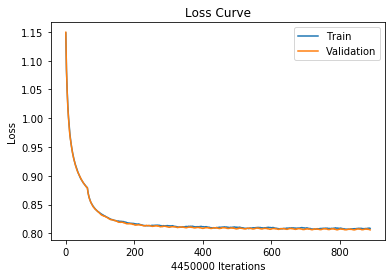

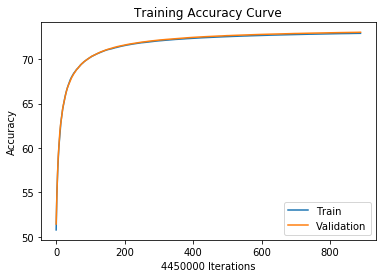

  6%|▌         | 29194/491198 [02:10<28:12, 272.96it/s]

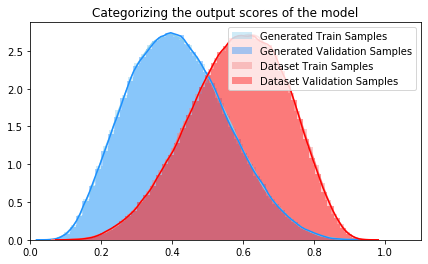

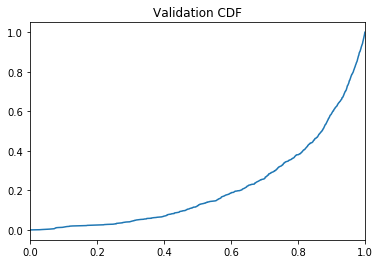

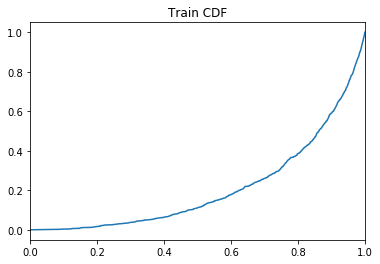

  6%|▌         | 29251/491198 [03:19<98:22:36,  1.30it/s] 

Training Accuracy at epoch 9: 72.91460674157304
Validation Accuracy epoch 9: 73.03483146067416
Training AUC at epoch 9: 0.20969436363636362
Validation AUC epoch 9: 0.2127017272727273
Train: Sensitivity: 0.7294284116406465 Specificity: 0.728863427367588
Val: Sensitivity: 0.7309175949998828 Specificity: 0.7297815320203849


 16%|█▌        | 79208/491198 [06:21<20:38, 332.57it/s]  

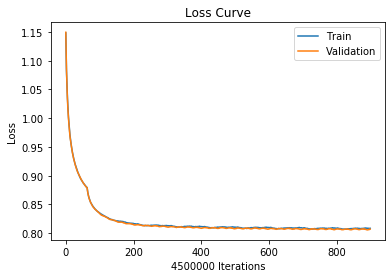

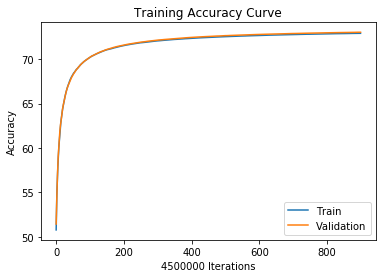

 16%|█▌        | 79208/491198 [06:40<20:38, 332.57it/s]

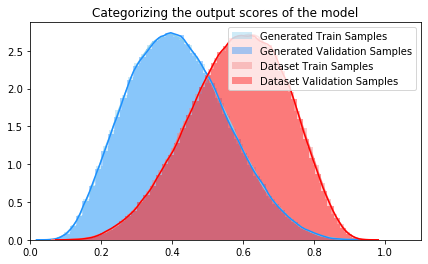

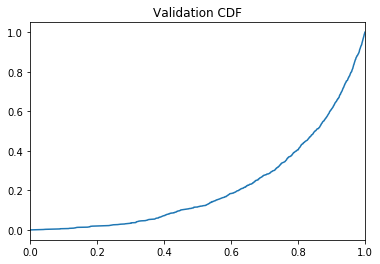

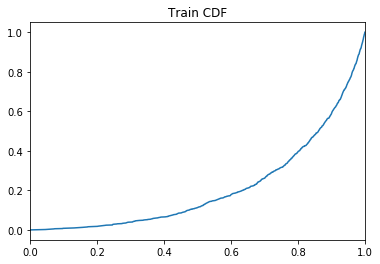

 16%|█▌        | 79250/491198 [07:48<209:19:25,  1.83s/it]

Training Accuracy at epoch 9: 72.91886666666667
Validation Accuracy epoch 9: 73.03748888888889
Training AUC at epoch 9: 0.211515
Validation AUC epoch 9: 0.21768636363636362
Train: Sensitivity: 0.7294913203336382 Specificity: 0.7288856951137463
Val: Sensitivity: 0.7309775903002659 Specificity: 0.7297748548774052


 26%|██▋       | 129180/491198 [11:12<25:59, 232.20it/s]  

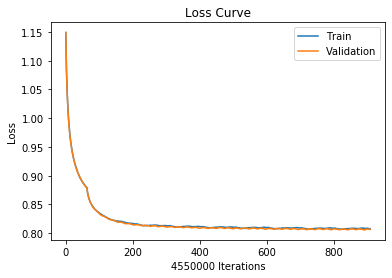

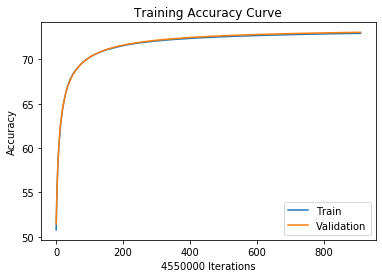

 26%|██▋       | 129180/491198 [11:30<25:59, 232.20it/s]

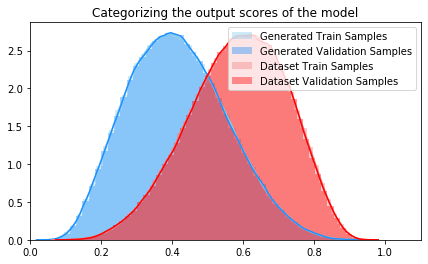

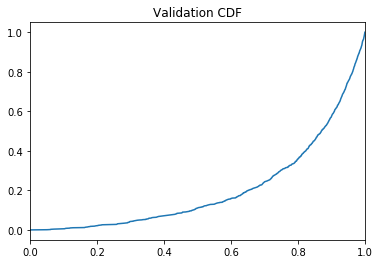

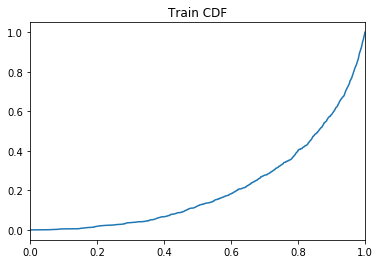

 26%|██▋       | 129234/491198 [12:40<49:20:47,  2.04it/s]

Training Accuracy at epoch 9: 72.92578021978022
Validation Accuracy epoch 9: 73.04621978021979
Training AUC at epoch 9: 0.21163554545454544
Validation AUC epoch 9: 0.203349
Train: Sensitivity: 0.7295970815694999 Specificity: 0.7289181372454159
Val: Sensitivity: 0.7310823491059353 Specificity: 0.7298447827440867


 36%|███▋      | 179198/491198 [15:56<19:34, 265.56it/s]  

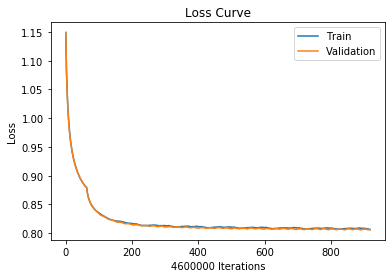

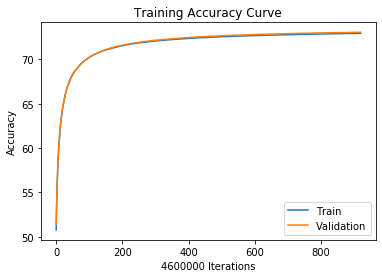

 36%|███▋      | 179198/491198 [16:10<19:34, 265.56it/s]

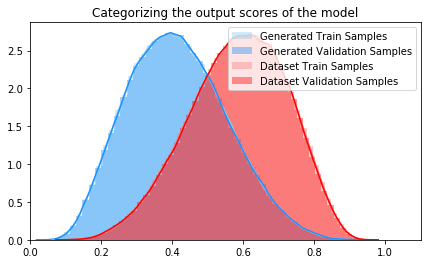

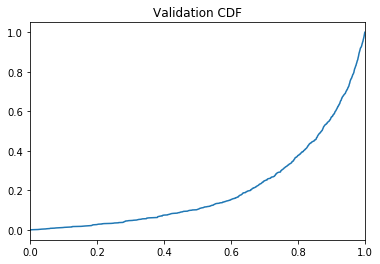

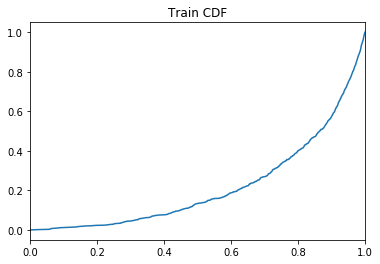

 36%|███▋      | 179251/491198 [17:25<81:12:24,  1.07it/s] 

Training Accuracy at epoch 9: 72.93341304347827
Validation Accuracy epoch 9: 73.0514347826087
Training AUC at epoch 9: 0.21681745454545454
Validation AUC epoch 9: 0.20485290909090909
Train: Sensitivity: 0.7296767389442425 Specificity: 0.7289911442520728
Val: Sensitivity: 0.7311291198280738 Specificity: 0.7299022759474583


 47%|████▋     | 229202/491198 [20:37<18:22, 237.64it/s]  

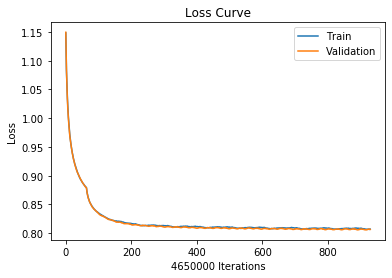

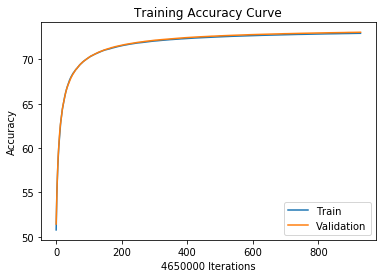

 47%|████▋     | 229202/491198 [20:50<18:22, 237.64it/s]

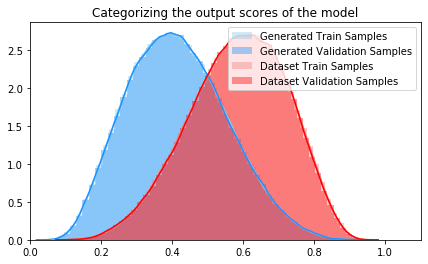

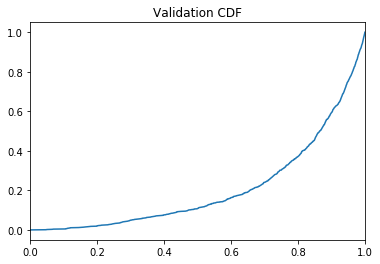

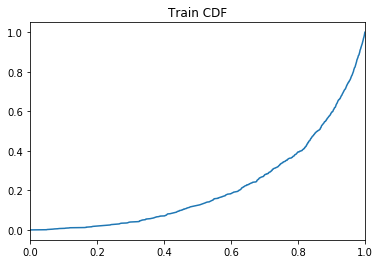

 47%|████▋     | 229246/491198 [22:06<84:24:06,  1.16s/it] 

Training Accuracy at epoch 9: 72.93886021505377
Validation Accuracy epoch 9: 73.05718279569892
Training AUC at epoch 9: 0.21568263636363635
Validation AUC epoch 9: 0.20706336363636366
Train: Sensitivity: 0.7297353875092795 Specificity: 0.7290414039835309
Val: Sensitivity: 0.731209234497632 Specificity: 0.7299372536936035


 57%|█████▋    | 279205/491198 [25:26<14:48, 238.67it/s]  

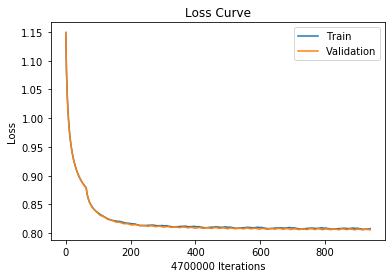

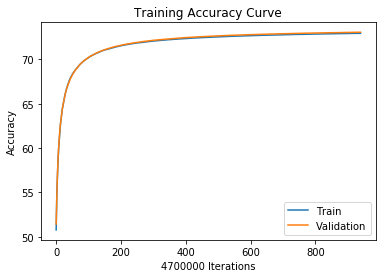

 57%|█████▋    | 279205/491198 [25:40<14:48, 238.67it/s]

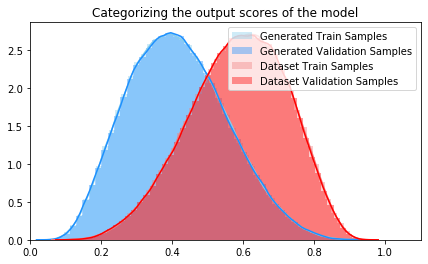

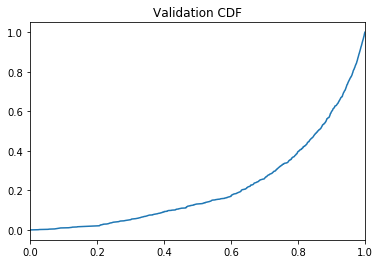

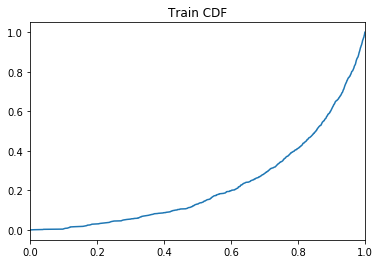

 57%|█████▋    | 279250/491198 [26:59<88:29:35,  1.50s/it] 

Training Accuracy at epoch 9: 72.94248936170213
Validation Accuracy epoch 9: 73.0619574468085
Training AUC at epoch 9: 0.2272211818181818
Validation AUC epoch 9: 0.21728972727272727
Train: Sensitivity: 0.7297851302933328 Specificity: 0.7290642197928531
Val: Sensitivity: 0.7312649983005303 Specificity: 0.7299769738755604


 67%|██████▋   | 329183/491198 [30:14<11:14, 240.15it/s]  

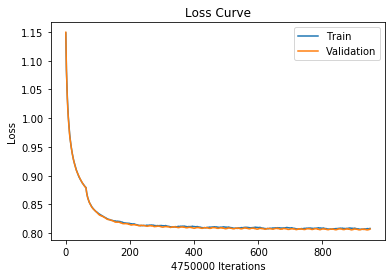

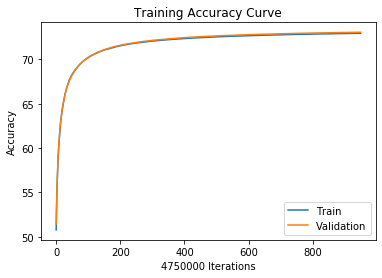

 67%|██████▋   | 329183/491198 [30:30<11:14, 240.15it/s]

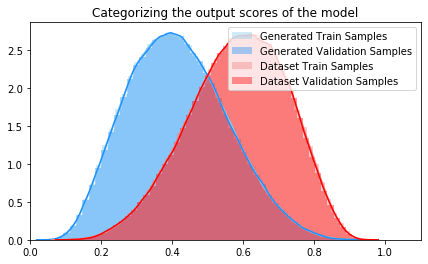

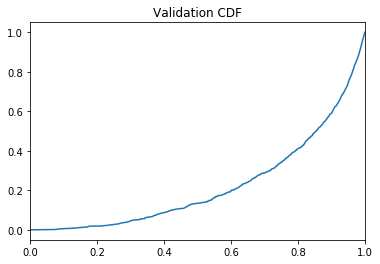

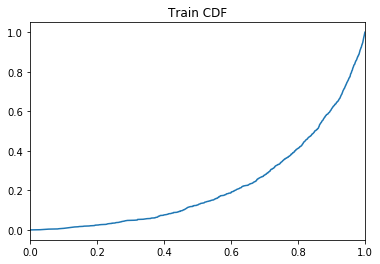

 67%|██████▋   | 329234/491198 [31:47<25:09:41,  1.79it/s]

Training Accuracy at epoch 9: 72.9458105263158
Validation Accuracy epoch 9: 73.06482105263157
Training AUC at epoch 9: 0.22200000000000003
Validation AUC epoch 9: 0.2226210909090909
Train: Sensitivity: 0.7298201112348738 Specificity: 0.729095668286016
Val: Sensitivity: 0.7312962101017535 Specificity: 0.7300030711021055


 77%|███████▋  | 379193/491198 [35:03<07:39, 243.52it/s]  

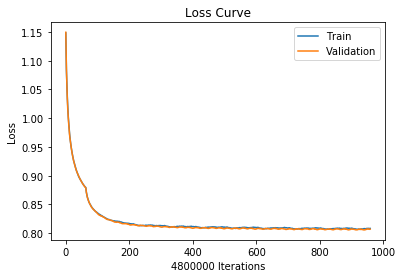

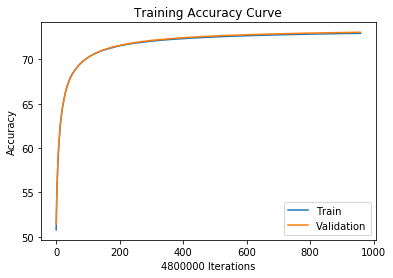

 77%|███████▋  | 379193/491198 [35:20<07:39, 243.52it/s]

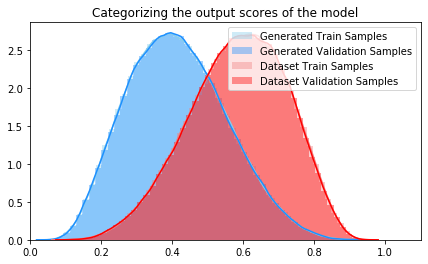

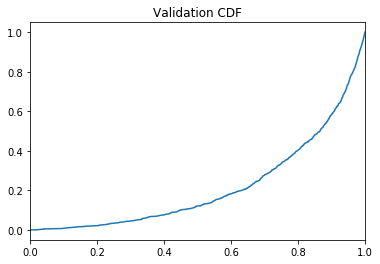

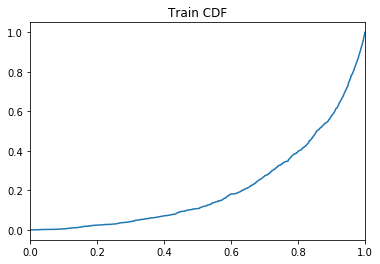

 77%|███████▋  | 379250/491198 [36:35<24:02:07,  1.29it/s]

Training Accuracy at epoch 9: 72.9525625
Validation Accuracy epoch 9: 73.071875
Training AUC at epoch 9: 0.21168554545454546
Validation AUC epoch 9: 0.21558845454545456
Train: Sensitivity: 0.7299033562144686 Specificity: 0.7291474541024696
Val: Sensitivity: 0.7313786285330109 Specificity: 0.730061760346573


 87%|████████▋ | 429202/491198 [39:53<04:30, 229.11it/s]  

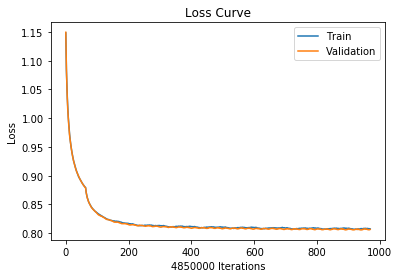

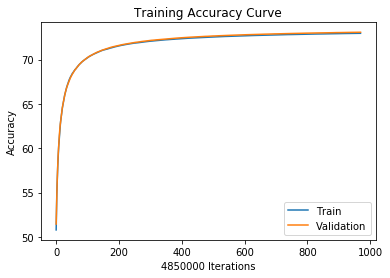

 87%|████████▋ | 429202/491198 [40:10<04:30, 229.11it/s]

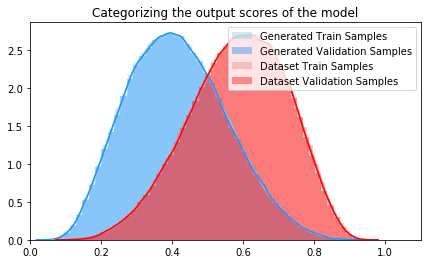

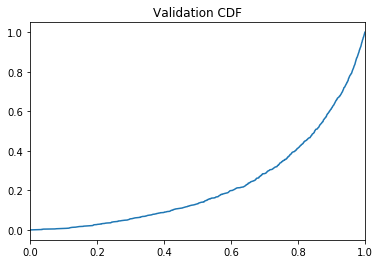

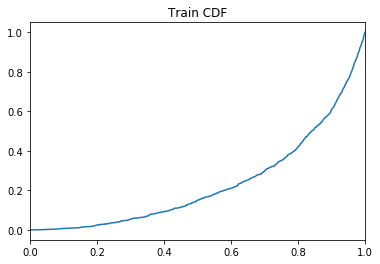

 87%|████████▋ | 429252/491198 [41:25<20:50:40,  1.21s/it]

Training Accuracy at epoch 9: 72.95898969072165
Validation Accuracy epoch 9: 73.07703092783505
Training AUC at epoch 9: 0.23209981818181818
Validation AUC epoch 9: 0.22685754545454545
Train: Sensitivity: 0.7299479059339428 Specificity: 0.7292314801825369
Val: Sensitivity: 0.7314248967940762 Specificity: 0.7301185891751837


 98%|█████████▊| 479188/491198 [44:29<00:51, 232.82it/s]  

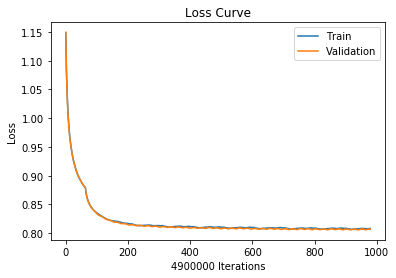

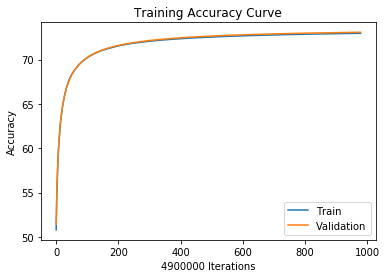

 98%|█████████▊| 479188/491198 [44:40<00:51, 232.82it/s]

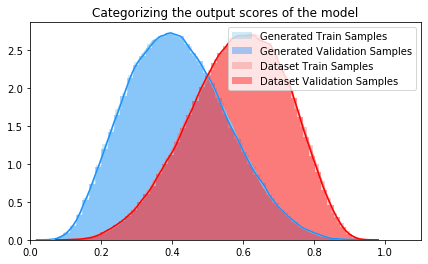

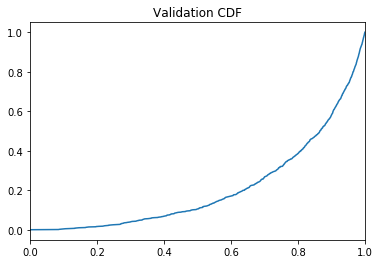

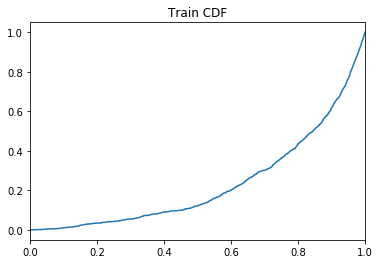

 98%|█████████▊| 479248/491198 [46:08<2:17:57,  1.44it/s]

Training Accuracy at epoch 9: 72.96189795918367
Validation Accuracy epoch 9: 73.08255102040816
Training AUC at epoch 9: 0.23181463636363636
Validation AUC epoch 9: 0.20952627272727276
Train: Sensitivity: 0.7299607148830626 Specificity: 0.729276878657568
Val: Sensitivity: 0.731464770341669 Specificity: 0.7301890680667847


  0%|          | 28/491198 [00:00<29:18, 279.26it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 10  with learning rate:  [0.000567]


  8%|▊         | 37996/491198 [02:29<30:44, 245.74it/s]

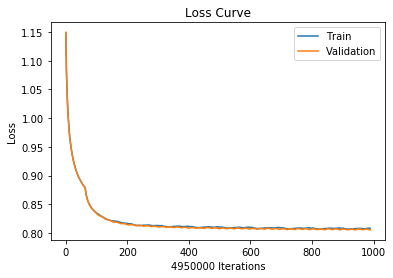

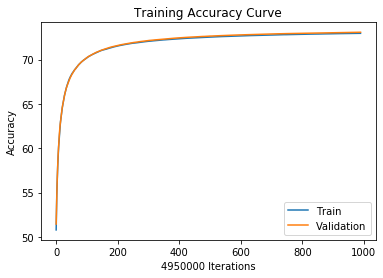

  8%|▊         | 37996/491198 [02:40<30:44, 245.74it/s]

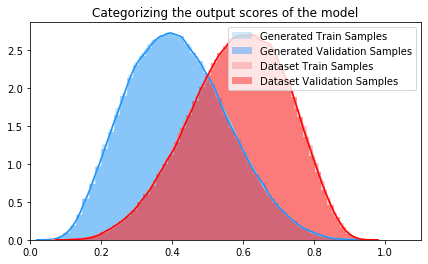

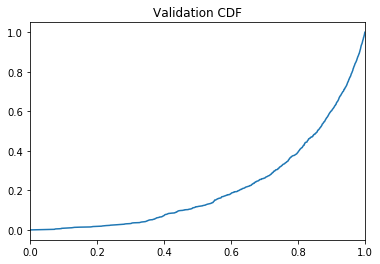

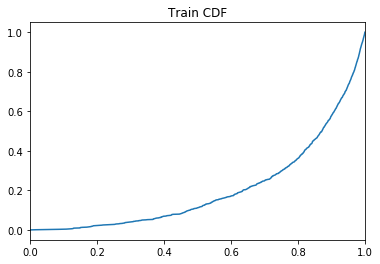

  8%|▊         | 38036/491198 [04:01<101:35:51,  1.24it/s]

Training Accuracy at epoch 10: 72.96886868686869
Validation Accuracy epoch 10: 73.08911111111111
Training AUC at epoch 10: 0.20492154545454544
Validation AUC epoch 10: 0.21398463636363638
Train: Sensitivity: 0.730030096848614 Specificity: 0.7293469072763001
Val: Sensitivity: 0.7315681913246785 Specificity: 0.7302169773628979


 18%|█▊        | 88001/491198 [07:13<24:53, 269.90it/s]   

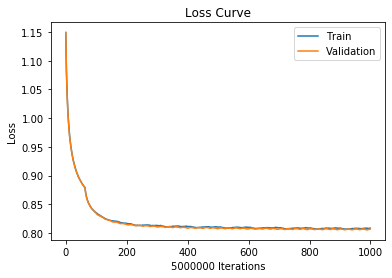

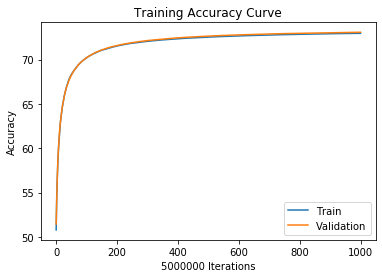

 18%|█▊        | 88001/491198 [07:30<24:53, 269.90it/s]

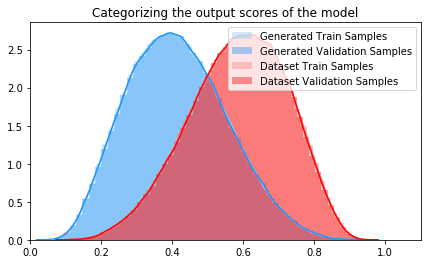

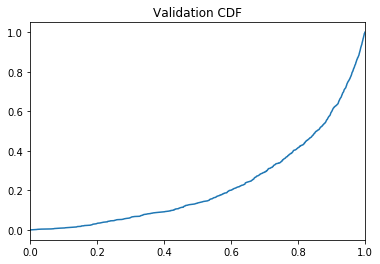

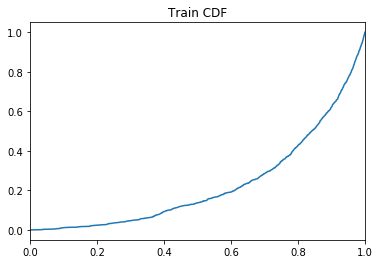

 18%|█▊        | 88055/491198 [08:48<117:35:02,  1.05s/it]

Training Accuracy at epoch 10: 72.97214
Validation Accuracy epoch 10: 73.09082
Training AUC at epoch 10: 0.22860018181818184
Validation AUC epoch 10: 0.22796145454545455
Train: Sensitivity: 0.7300655904701516 Specificity: 0.7293768574495282
Val: Sensitivity: 0.7315879504519402 Specificity: 0.7302314517509847


 28%|██▊       | 138018/491198 [12:05<25:02, 235.03it/s]  

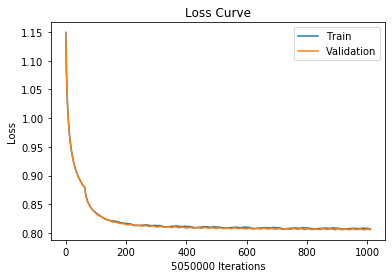

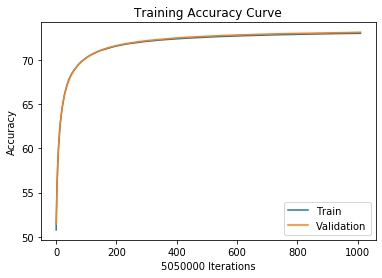

 28%|██▊       | 138018/491198 [12:20<25:02, 235.03it/s]

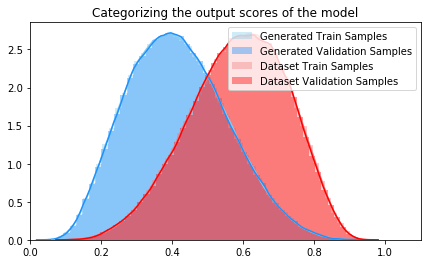

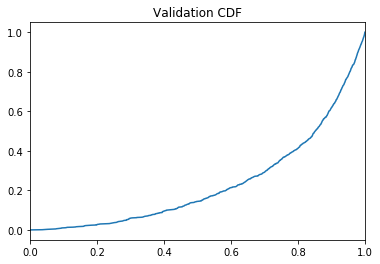

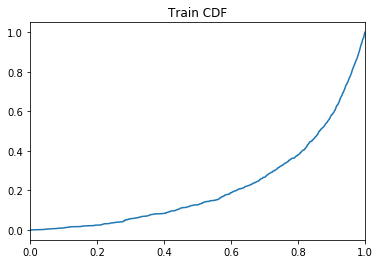

 28%|██▊       | 138053/491198 [13:41<985:35:23, 10.05s/it] 

Training Accuracy at epoch 10: 72.97835643564356
Validation Accuracy epoch 10: 73.09805940594059
Training AUC at epoch 10: 0.21777663636363637
Validation AUC epoch 10: 0.2326198181818182
Train: Sensitivity: 0.7301710130758406 Specificity: 0.7293956811440867
Val: Sensitivity: 0.7316713621955547 Specificity: 0.7302928733390185


 38%|███▊      | 188008/491198 [16:54<20:58, 240.98it/s]   

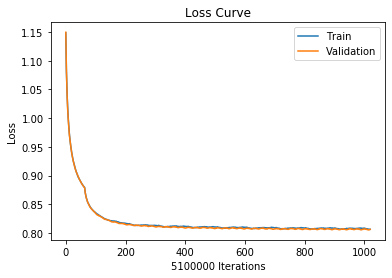

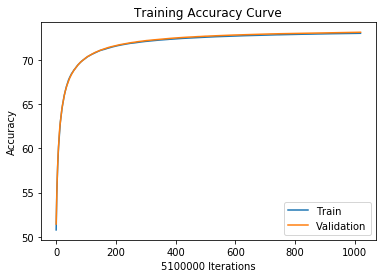

 38%|███▊      | 188008/491198 [17:10<20:58, 240.98it/s]

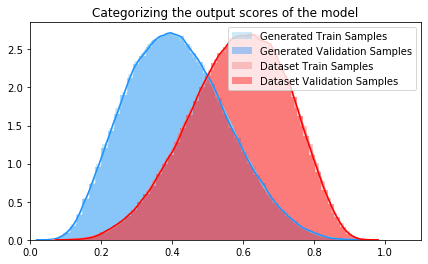

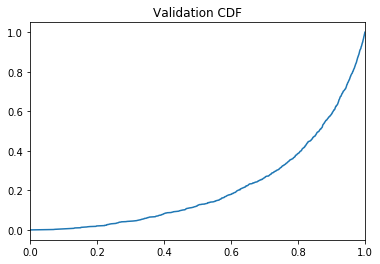

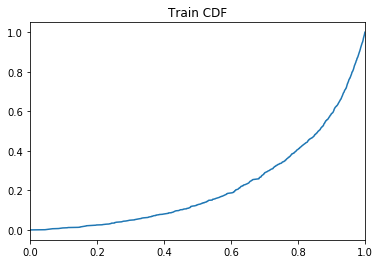

 38%|███▊      | 188052/491198 [18:29<140:09:37,  1.66s/it]

Training Accuracy at epoch 10: 72.9846862745098
Validation Accuracy epoch 10: 73.10172549019607
Training AUC at epoch 10: 0.2204387272727273
Validation AUC epoch 10: 0.21400627272727274
Train: Sensitivity: 0.730241813163685 Specificity: 0.729451455468769
Val: Sensitivity: 0.7317320582662478 Specificity: 0.7303055903265403


 48%|████▊     | 238016/491198 [21:27<15:57, 264.36it/s]   

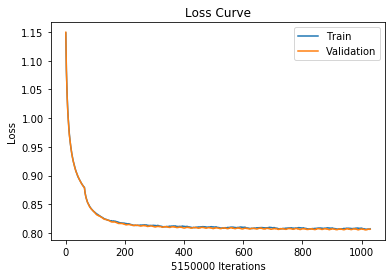

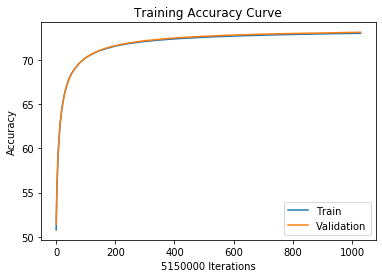

 48%|████▊     | 238016/491198 [21:40<15:57, 264.36it/s]

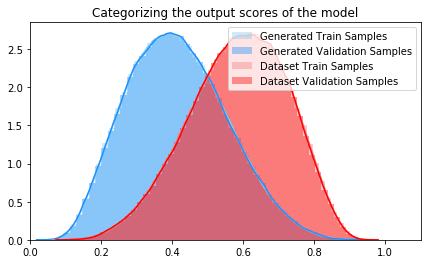

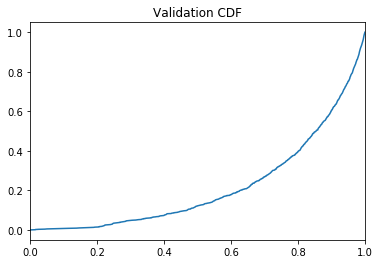

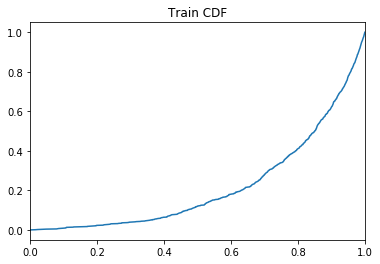

 48%|████▊     | 238036/491198 [23:08<369:51:07,  5.26s/it]

Training Accuracy at epoch 10: 72.98846601941747
Validation Accuracy epoch 10: 73.10823300970874
Training AUC at epoch 10: 0.21984681818181817
Validation AUC epoch 10: 0.21624954545454544
Train: Sensitivity: 0.7302740891994053 Specificity: 0.7294947781292658
Val: Sensitivity: 0.7317886039950353 Specificity: 0.7303791547979375


 59%|█████▊    | 288000/491198 [26:14<12:42, 266.39it/s]   

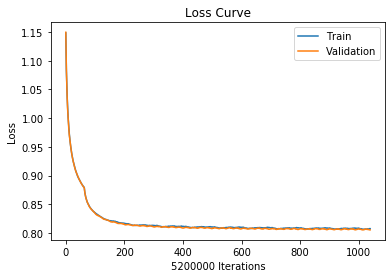

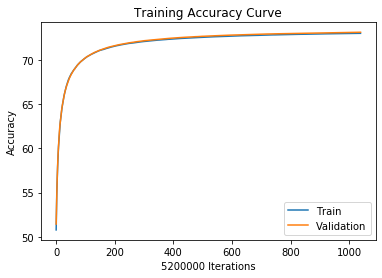

 59%|█████▊    | 288000/491198 [26:30<12:42, 266.39it/s]

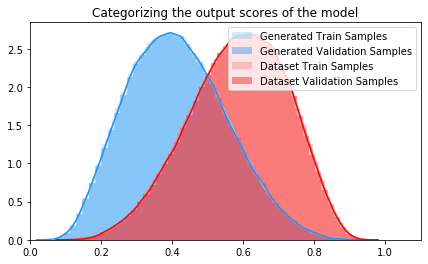

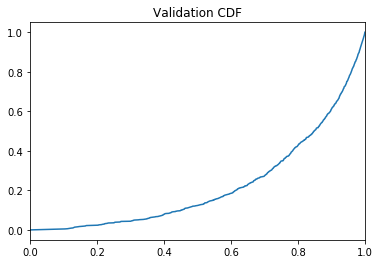

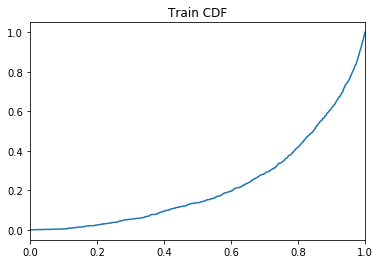

 59%|█████▊    | 288053/491198 [27:54<59:29:26,  1.05s/it]

Training Accuracy at epoch 10: 72.99171153846154
Validation Accuracy epoch 10: 73.11278846153846
Training AUC at epoch 10: 0.22776890909090908
Validation AUC epoch 10: 0.22326827272727273
Train: Sensitivity: 0.7303267651781044 Specificity: 0.7295069633048249
Val: Sensitivity: 0.7318545060956525 Specificity: 0.7304044376695327


 69%|██████▉   | 338015/491198 [31:07<10:47, 236.72it/s]  

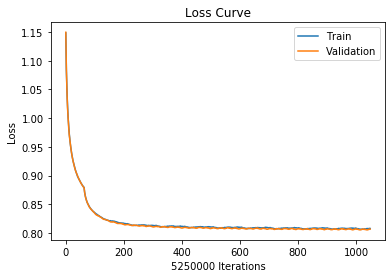

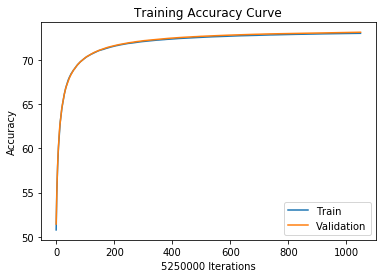

 69%|██████▉   | 338015/491198 [31:21<10:47, 236.72it/s]

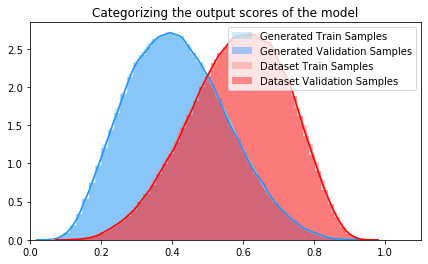

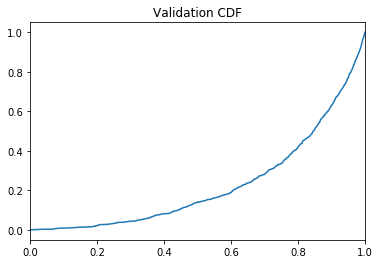

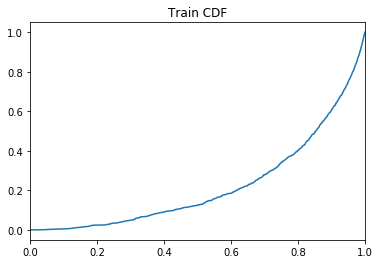

 69%|██████▉   | 338052/491198 [32:44<173:04:58,  4.07s/it]

Training Accuracy at epoch 10: 72.99491428571429
Validation Accuracy epoch 10: 73.11485714285715
Training AUC at epoch 10: 0.22155663636363637
Validation AUC epoch 10: 0.22662290909090907
Train: Sensitivity: 0.730357684706427 Specificity: 0.7295401067235696
Val: Sensitivity: 0.7318842073674975 Specificity: 0.7304161601601967


 79%|███████▉  | 387988/491198 [35:59<07:26, 231.24it/s]   

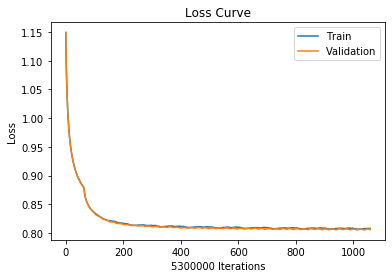

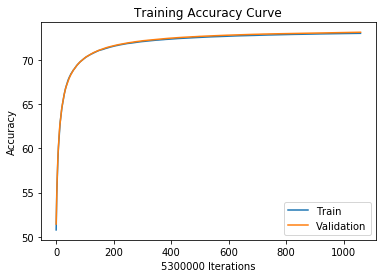

 79%|███████▉  | 387988/491198 [36:11<07:26, 231.24it/s]

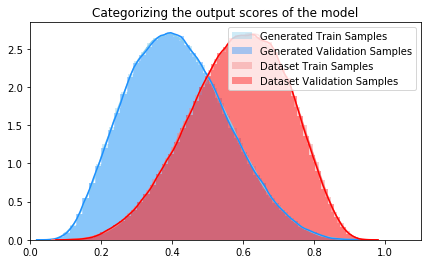

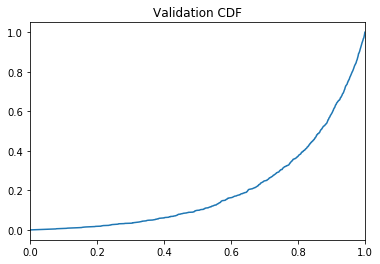

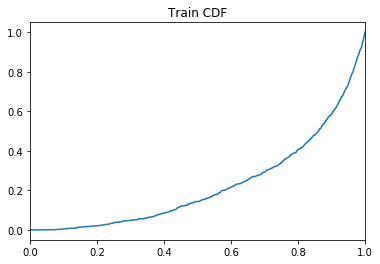

 79%|███████▉  | 388052/491198 [37:39<18:56:48,  1.51it/s]

Training Accuracy at epoch 10: 72.99949056603774
Validation Accuracy epoch 10: 73.12103773584906
Training AUC at epoch 10: 0.22485754545454545
Validation AUC epoch 10: 0.20355072727272727
Train: Sensitivity: 0.7304014856485117 Specificity: 0.7295878645179268
Val: Sensitivity: 0.7319252013395533 Specificity: 0.7304986943842521


 89%|████████▉ | 438019/491198 [40:45<02:48, 316.16it/s]  

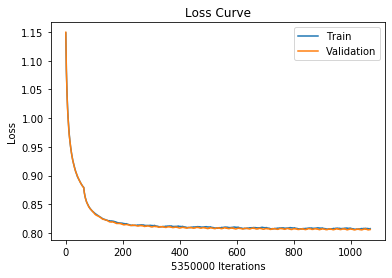

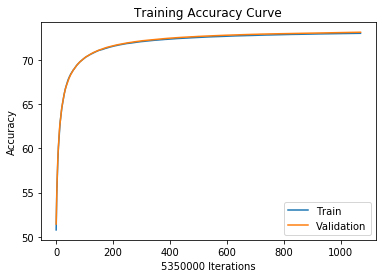

 89%|████████▉ | 438019/491198 [41:01<02:48, 316.16it/s]

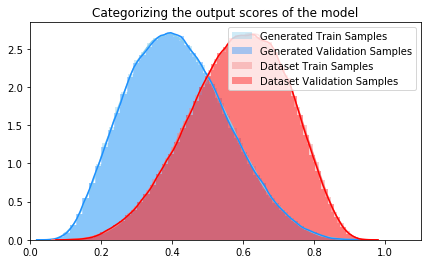

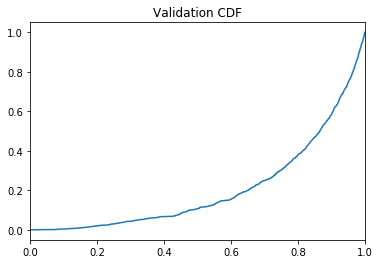

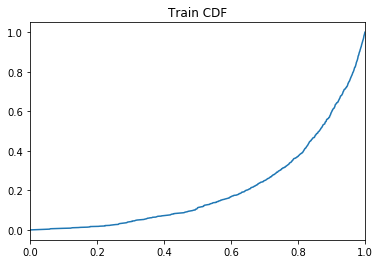

 89%|████████▉ | 438036/491198 [42:26<314:23:23, 21.29s/it]

Training Accuracy at epoch 10: 73.0054953271028
Validation Accuracy epoch 10: 73.12487850467289
Training AUC at epoch 10: 0.20780845454545455
Validation AUC epoch 10: 0.20615872727272727
Train: Sensitivity: 0.7304426385022378 Specificity: 0.7296668408435748
Val: Sensitivity: 0.7319710493740202 Specificity: 0.7305297019214414


 99%|█████████▉| 488001/491198 [45:43<00:12, 253.43it/s]   

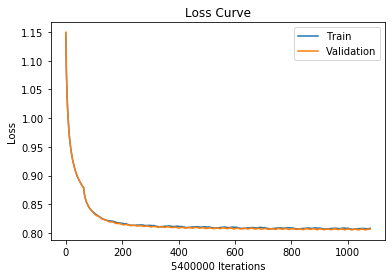

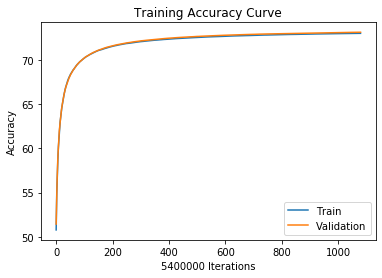

 99%|█████████▉| 488001/491198 [46:01<00:12, 253.43it/s]

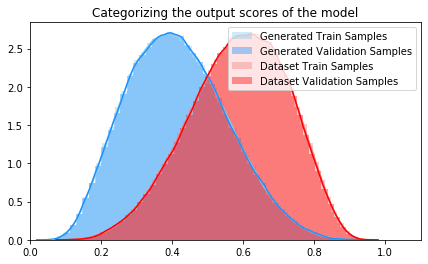

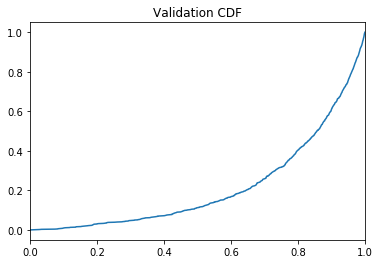

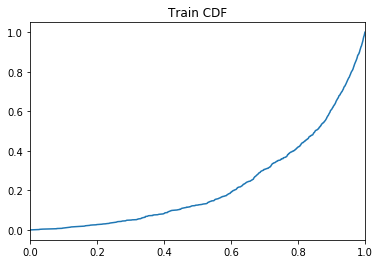

 99%|█████████▉| 488055/491198 [47:24<58:19,  1.11s/it]  

Training Accuracy at epoch 10: 73.00737037037037
Validation Accuracy epoch 10: 73.12935185185185
Training AUC at epoch 10: 0.22670236363636365
Validation AUC epoch 10: 0.21507281818181817
Train: Sensitivity: 0.730459442281631 Specificity: 0.7296875445844755
Val: Sensitivity: 0.7320165996050542 Specificity: 0.7305736226699582


  0%|          | 22/491198 [00:00<37:13, 219.88it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 11  with learning rate:  [0.00063]


 10%|▉         | 46806/491198 [03:02<30:14, 244.96it/s]

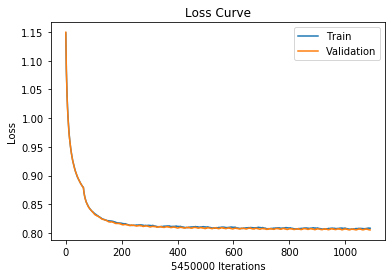

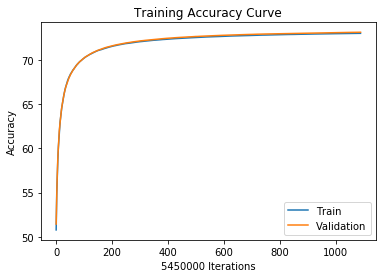

 10%|▉         | 46806/491198 [03:20<30:14, 244.96it/s]

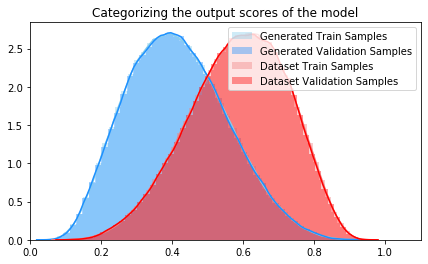

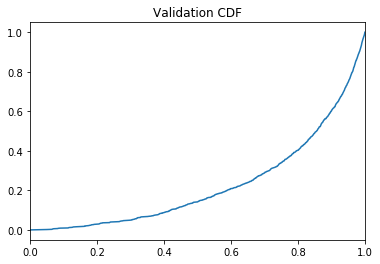

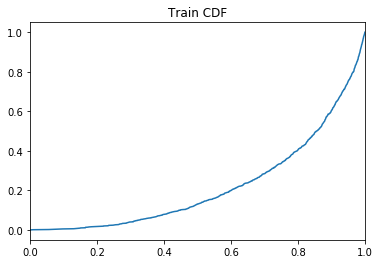

 10%|▉         | 46855/491198 [04:45<167:18:36,  1.36s/it]

Training Accuracy at epoch 11: 73.01299082568808
Validation Accuracy epoch 11: 73.13484403669725
Training AUC at epoch 11: 0.2202860909090909
Validation AUC epoch 11: 0.22699300000000003
Train: Sensitivity: 0.7305069160932445 Specificity: 0.7297524942785713
Val: Sensitivity: 0.7320891614049747 Specificity: 0.7306109610630046


 20%|█▉        | 96793/491198 [08:00<28:47, 228.36it/s]   

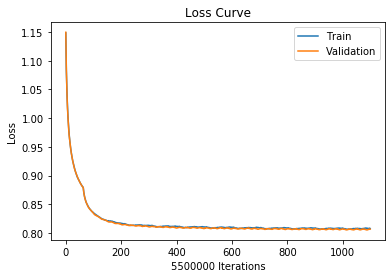

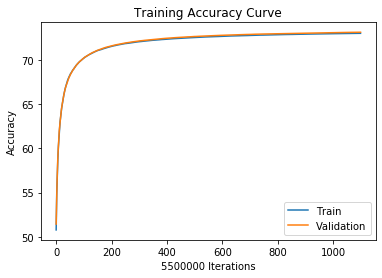

 20%|█▉        | 96793/491198 [08:20<28:47, 228.36it/s]

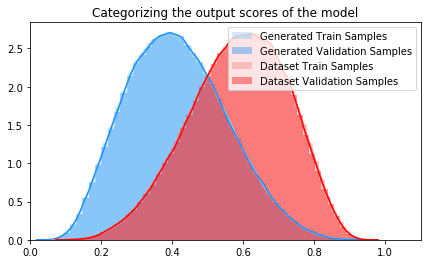

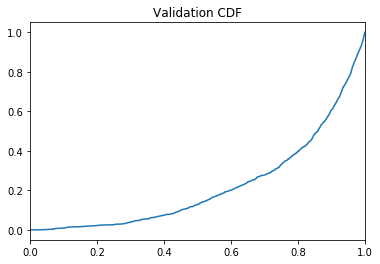

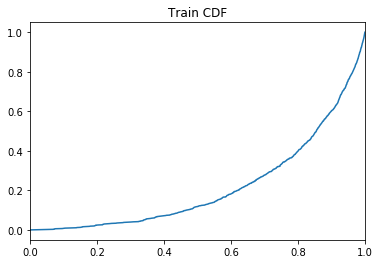

 20%|█▉        | 96854/491198 [09:41<80:07:45,  1.37it/s] 

Training Accuracy at epoch 11: 73.01670909090909
Validation Accuracy epoch 11: 73.13649090909091
Training AUC at epoch 11: 0.21640172727272727
Validation AUC epoch 11: 0.22113045454545455
Train: Sensitivity: 0.7305626022169726 Specificity: 0.7297711478988539
Val: Sensitivity: 0.7321257611709779 Specificity: 0.7306073902491149


 30%|██▉       | 146799/491198 [12:53<24:08, 237.74it/s] 

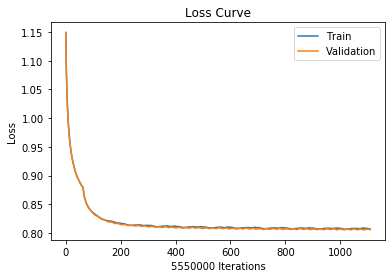

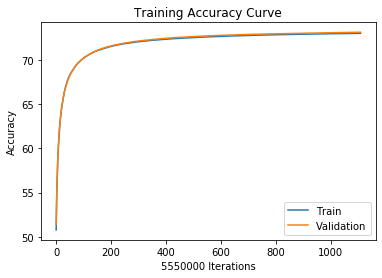

 30%|██▉       | 146799/491198 [13:10<24:08, 237.74it/s]

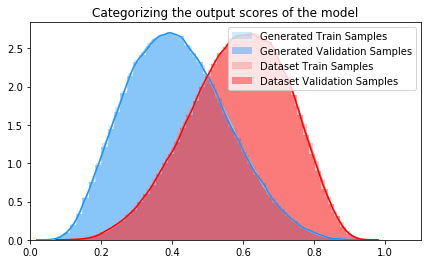

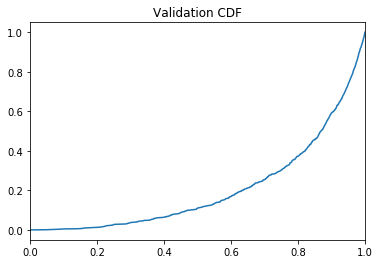

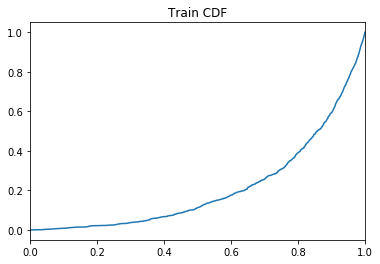

 30%|██▉       | 146838/491198 [14:33<87:12:15,  1.10it/s] 

Training Accuracy at epoch 11: 73.02142342342343
Validation Accuracy epoch 11: 73.14268468468468
Training AUC at epoch 11: 0.21126754545454546
Validation AUC epoch 11: 0.2049150909090909
Train: Sensitivity: 0.7306350861927386 Specificity: 0.7297929064062144
Val: Sensitivity: 0.7321841571142748 Specificity: 0.7306728369758294


 40%|████      | 196796/491198 [17:46<18:42, 262.25it/s]  

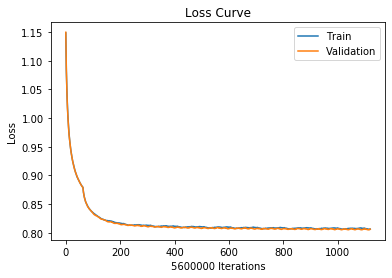

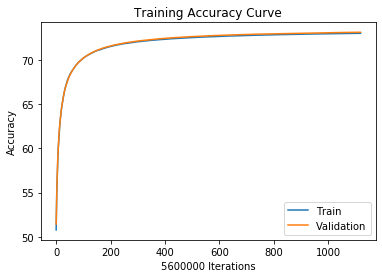

 40%|████      | 196796/491198 [18:00<18:42, 262.25it/s]

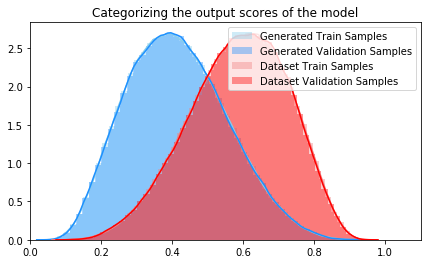

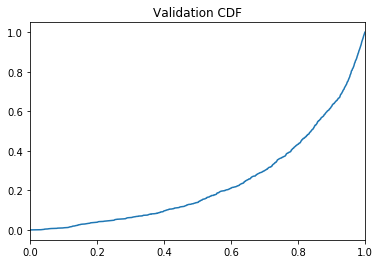

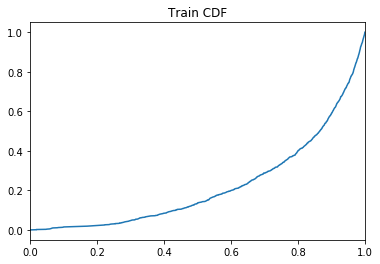

 40%|████      | 196859/491198 [19:25<65:19:31,  1.25it/s]

Training Accuracy at epoch 11: 73.02696428571429
Validation Accuracy epoch 11: 73.14501785714286
Training AUC at epoch 11: 0.22134127272727272
Validation AUC epoch 11: 0.2373732727272727
Train: Sensitivity: 0.7306958930317892 Specificity: 0.729842911357123
Val: Sensitivity: 0.7322277663633695 Specificity: 0.7306760599516795


 50%|█████     | 246796/491198 [22:48<16:35, 245.46it/s]  

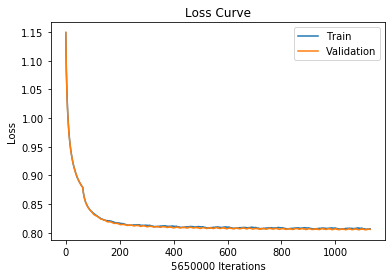

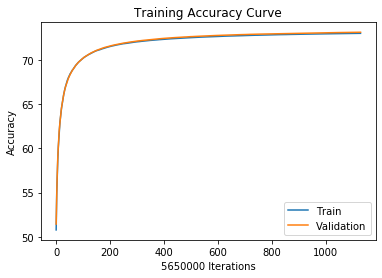

 50%|█████     | 246796/491198 [23:00<16:35, 245.46it/s]

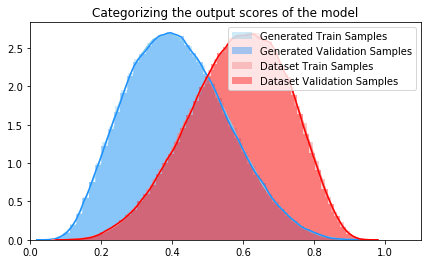

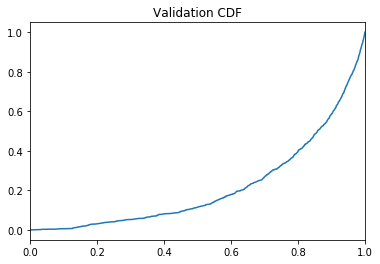

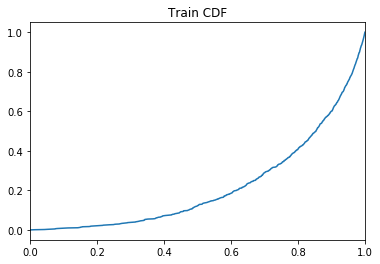

 50%|█████     | 246855/491198 [24:26<54:16:26,  1.25it/s]

Training Accuracy at epoch 11: 73.02957522123894
Validation Accuracy epoch 11: 73.15132743362832
Training AUC at epoch 11: 0.218605
Validation AUC epoch 11: 0.21567081818181816
Train: Sensitivity: 0.7307244371047422 Specificity: 0.7298665705165894
Val: Sensitivity: 0.7322858780857453 Specificity: 0.7307440718386907


 60%|██████    | 296818/491198 [27:41<13:44, 235.88it/s]  

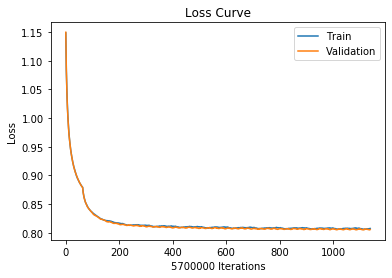

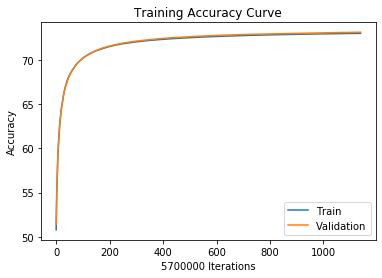

 60%|██████    | 296818/491198 [28:00<13:44, 235.88it/s]

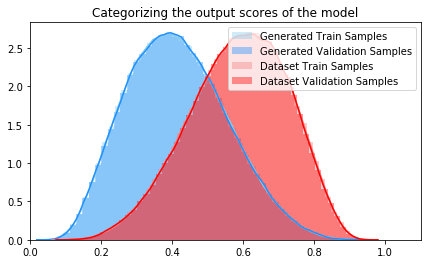

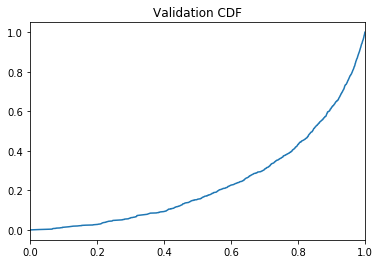

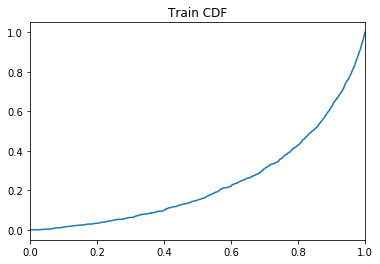

 60%|██████    | 296854/491198 [29:19<277:14:23,  5.14s/it]

Training Accuracy at epoch 11: 73.0321754385965
Validation Accuracy epoch 11: 73.15343859649123
Training AUC at epoch 11: 0.23952945454545455
Validation AUC epoch 11: 0.23858836363636365
Train: Sensitivity: 0.7307545833274888 Specificity: 0.7298884270246738
Val: Sensitivity: 0.7323001248697588 Specificity: 0.730771991259829


 71%|███████   | 346788/491198 [32:31<10:11, 236.08it/s]   

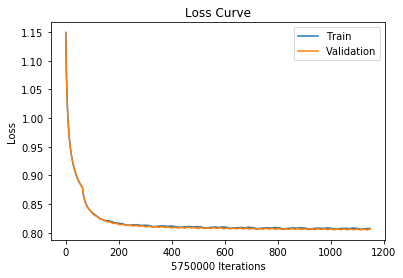

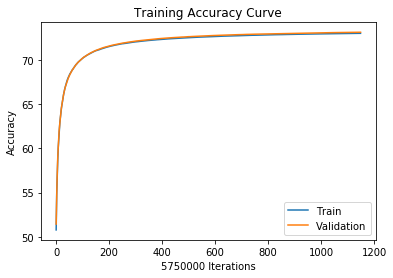

 71%|███████   | 346788/491198 [32:50<10:11, 236.08it/s]

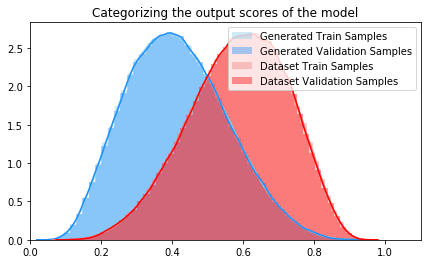

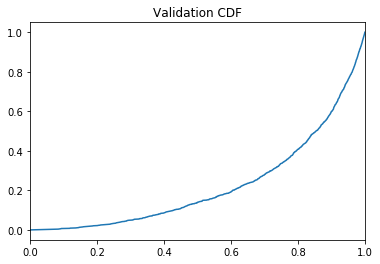

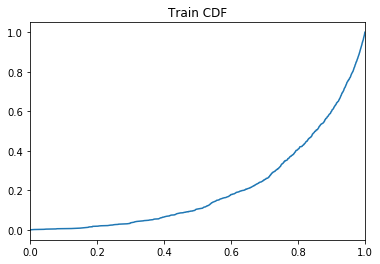

 71%|███████   | 346838/491198 [34:12<25:07:31,  1.60it/s]

Training Accuracy at epoch 11: 73.03610434782608
Validation Accuracy epoch 11: 73.15653913043478
Training AUC at epoch 11: 0.2117297272727273
Validation AUC epoch 11: 0.22335263636363636
Train: Sensitivity: 0.7308055435434015 Specificity: 0.7299160124791005
Val: Sensitivity: 0.7323585596263116 Specificity: 0.7307756915281297


 81%|████████  | 396796/491198 [37:26<06:04, 258.77it/s]  

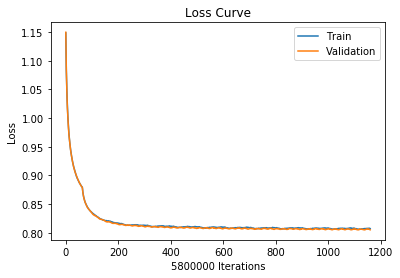

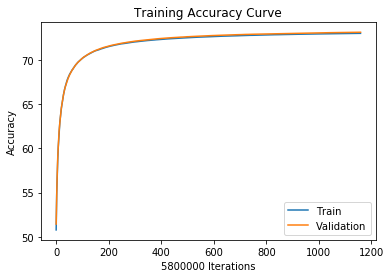

 81%|████████  | 396796/491198 [37:40<06:04, 258.77it/s]

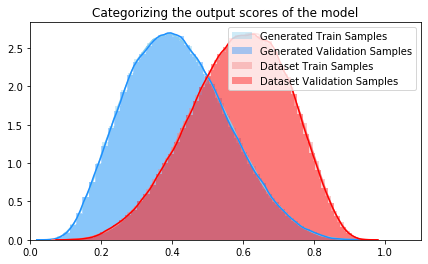

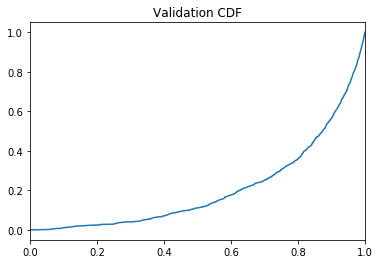

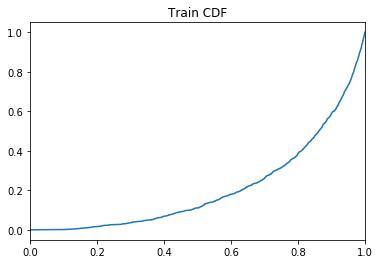

 81%|████████  | 396855/491198 [39:05<20:59:48,  1.25it/s]

Training Accuracy at epoch 11: 73.03927586206896
Validation Accuracy epoch 11: 73.1623275862069
Training AUC at epoch 11: 0.20915263636363637
Validation AUC epoch 11: 0.20631672727272726
Train: Sensitivity: 0.7308304553959044 Specificity: 0.7299545565424467
Val: Sensitivity: 0.7323888173137002 Specificity: 0.7308610975012249


 91%|█████████ | 446794/491198 [42:21<02:48, 264.26it/s]  

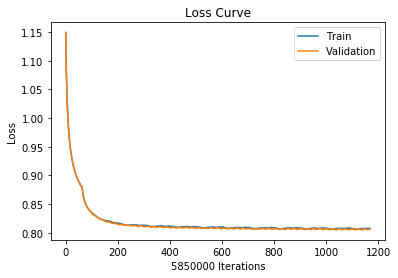

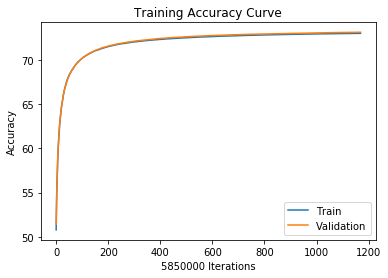

 91%|█████████ | 446794/491198 [42:40<02:48, 264.26it/s]

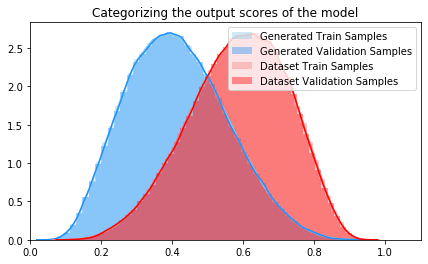

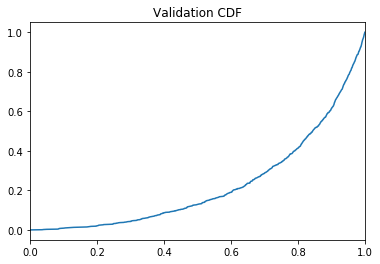

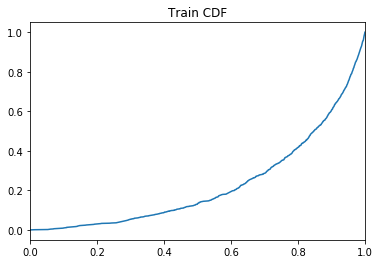

 91%|█████████ | 446854/491198 [44:00<9:09:53,  1.34it/s] 

Training Accuracy at epoch 11: 73.04324786324786
Validation Accuracy epoch 11: 73.16381196581196
Training AUC at epoch 11: 0.22693754545454545
Validation AUC epoch 11: 0.2259471818181818
Train: Sensitivity: 0.7308511859690174 Specificity: 0.7300133267292594
Val: Sensitivity: 0.7324003213974278 Specificity: 0.7308792953765911


  0%|          | 24/491198 [00:00<34:44, 235.63it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 12  with learning rate:  [0.00063]


  1%|          | 5616/491198 [00:22<36:21, 222.58it/s]

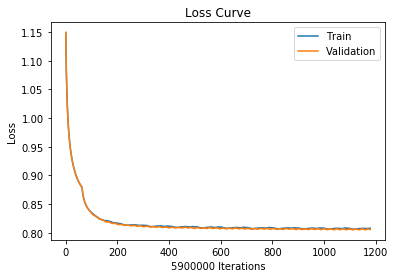

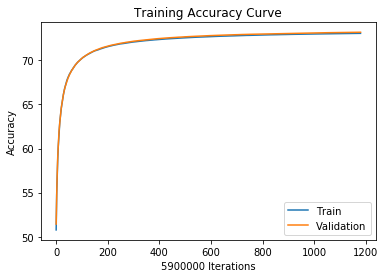

  1%|          | 5616/491198 [00:40<36:21, 222.58it/s]

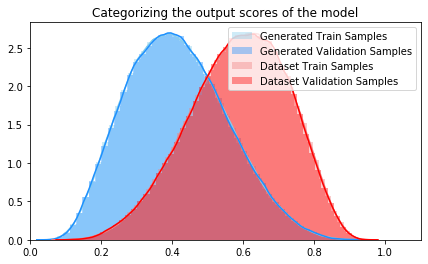

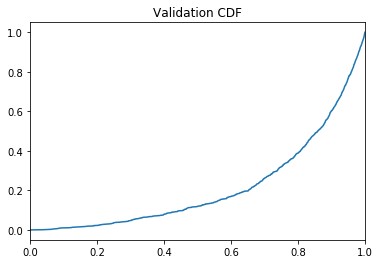

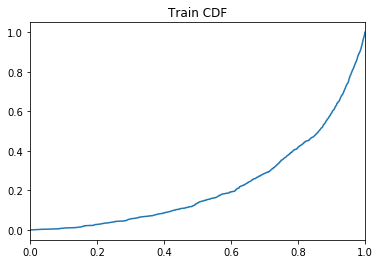

  1%|          | 5656/491198 [02:00<346:56:15,  2.57s/it]

Training Accuracy at epoch 12: 73.04605084745762
Validation Accuracy epoch 12: 73.16984745762711
Training AUC at epoch 12: 0.22424463636363637
Validation AUC epoch 12: 0.21472945454545456
Train: Sensitivity: 0.7308912606511629 Specificity: 0.7300292674455717
Val: Sensitivity: 0.732492219235958 Specificity: 0.7309082324067833


 11%|█▏        | 55611/491198 [05:13<27:27, 264.40it/s]  

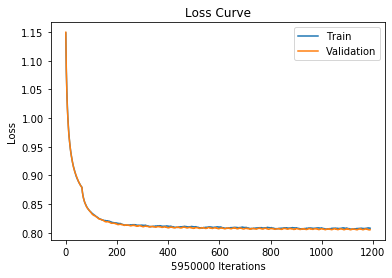

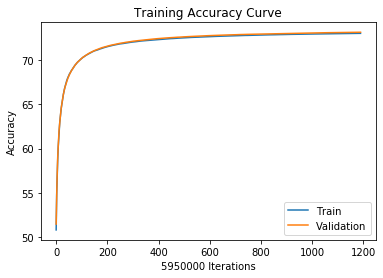

 11%|█▏        | 55611/491198 [05:30<27:27, 264.40it/s]

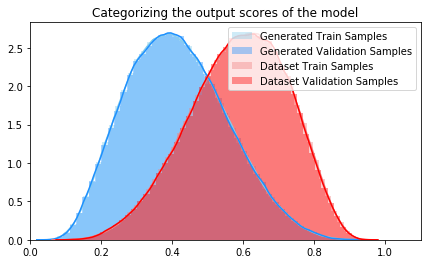

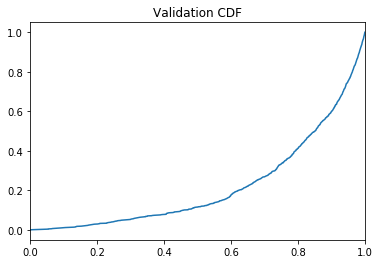

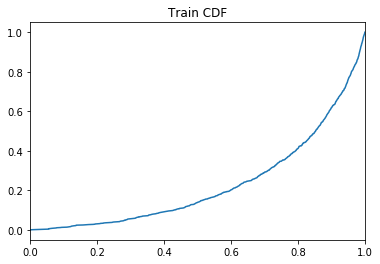

 11%|█▏        | 55640/491198 [07:00<209:18:32,  1.73s/it]

Training Accuracy at epoch 12: 73.0503025210084
Validation Accuracy epoch 12: 73.17334453781513
Training AUC at epoch 12: 0.22943863636363637
Validation AUC epoch 12: 0.2199240909090909
Train: Sensitivity: 0.7309246109029484 Specificity: 0.7300809940307974
Val: Sensitivity: 0.7325322821838998 Specificity: 0.7309381275014112


 22%|██▏       | 105622/491198 [09:59<22:44, 282.60it/s]  

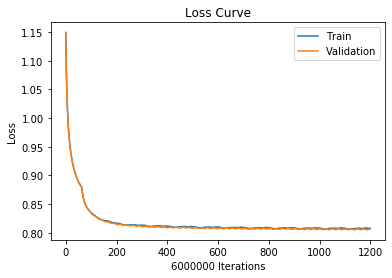

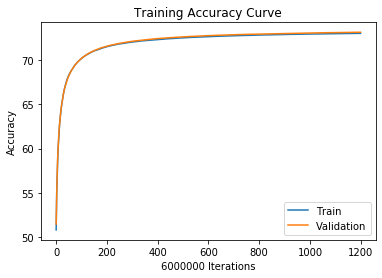

 22%|██▏       | 105622/491198 [10:10<22:44, 282.60it/s]

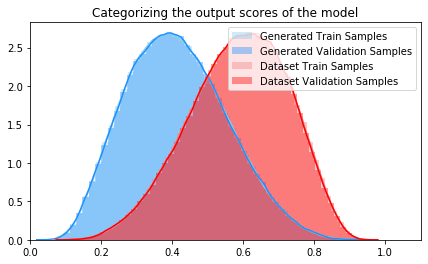

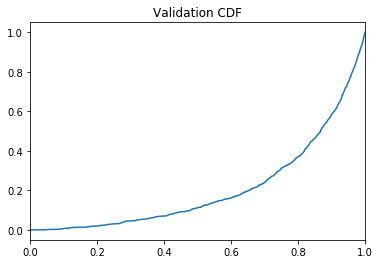

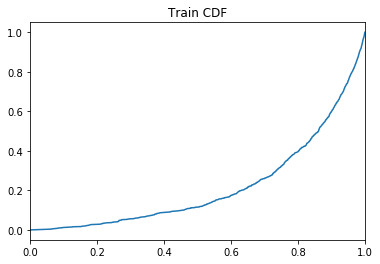

 22%|██▏       | 105658/491198 [11:39<1127:25:00, 10.53s/it]

Training Accuracy at epoch 12: 73.05346666666667
Validation Accuracy epoch 12: 73.17645
Training AUC at epoch 12: 0.217659
Validation AUC epoch 12: 0.20647545454545455
Train: Sensitivity: 0.7309768458968354 Specificity: 0.7300919945743112
Val: Sensitivity: 0.7325993436721288 Specificity: 0.7309333653509403


 32%|███▏      | 155608/491198 [14:48<22:30, 248.56it/s]    

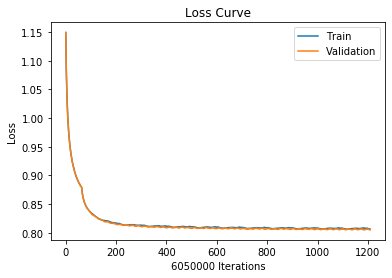

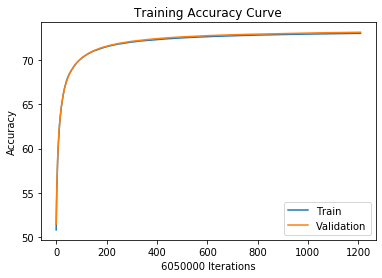

 32%|███▏      | 155608/491198 [15:00<22:30, 248.56it/s]

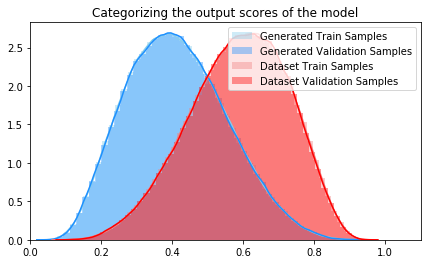

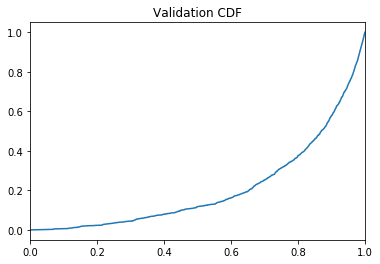

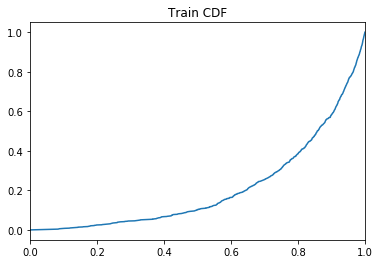

 32%|███▏      | 155657/491198 [16:28<122:54:28,  1.32s/it]

Training Accuracy at epoch 12: 73.05864462809917
Validation Accuracy epoch 12: 73.18041322314049
Training AUC at epoch 12: 0.2086569090909091
Validation AUC epoch 12: 0.20780845454545455
Train: Sensitivity: 0.7310456659052268 Specificity: 0.7301267035317295
Val: Sensitivity: 0.7326258839665977 Specificity: 0.7309859828574916


 42%|████▏     | 205606/491198 [19:38<18:57, 251.07it/s]   

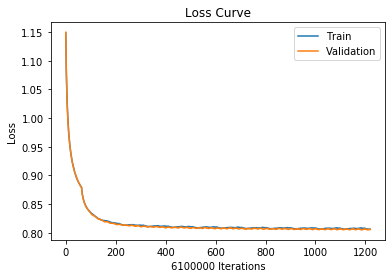

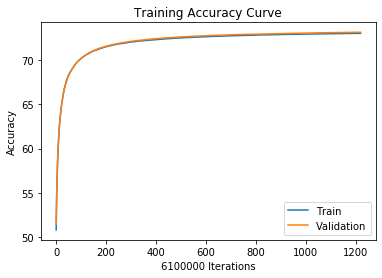

 42%|████▏     | 205606/491198 [19:50<18:57, 251.07it/s]

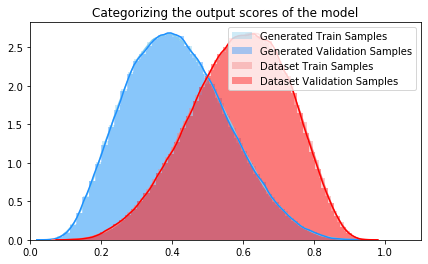

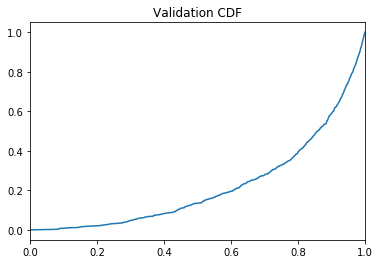

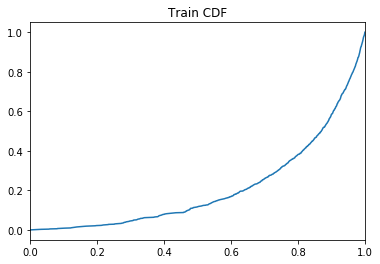

 42%|████▏     | 205656/491198 [21:17<91:31:52,  1.15s/it] 

Training Accuracy at epoch 12: 73.06296721311476
Validation Accuracy epoch 12: 73.18195081967212
Training AUC at epoch 12: 0.21017236363636363
Validation AUC epoch 12: 0.2201220909090909
Train: Sensitivity: 0.731086706626698 Specificity: 0.7301721230698976
Val: Sensitivity: 0.7326424053232564 Specificity: 0.7310002453586325


 52%|█████▏    | 255598/491198 [24:28<16:13, 242.01it/s]  

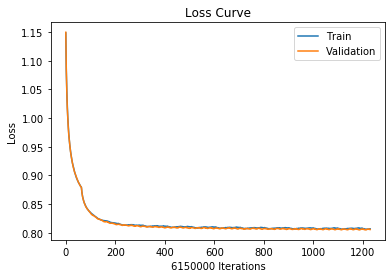

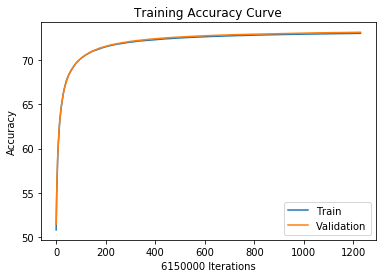

 52%|█████▏    | 255598/491198 [24:40<16:13, 242.01it/s]

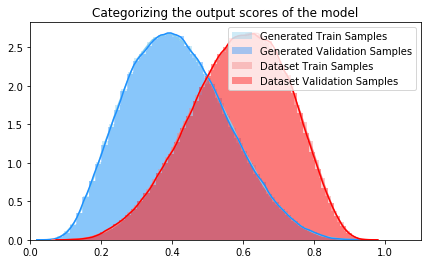

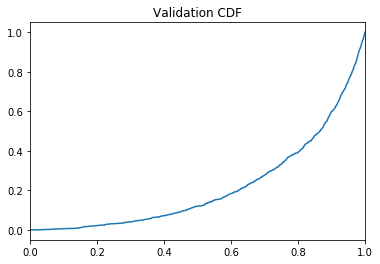

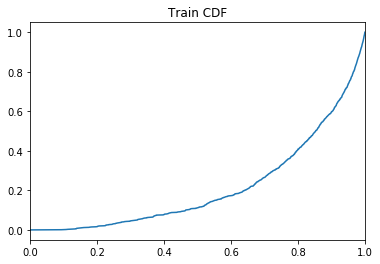

 52%|█████▏    | 255640/491198 [26:15<57:00:21,  1.15it/s]

Training Accuracy at epoch 12: 73.06583739837399
Validation Accuracy epoch 12: 73.18814634146341
Training AUC at epoch 12: 0.2141290909090909
Validation AUC epoch 12: 0.215569
Train: Sensitivity: 0.7311255966453305 Specificity: 0.7301906082687375
Val: Sensitivity: 0.7327023096613631 Specificity: 0.7310642172422364


 62%|██████▏   | 305617/491198 [29:33<11:18, 273.48it/s]  

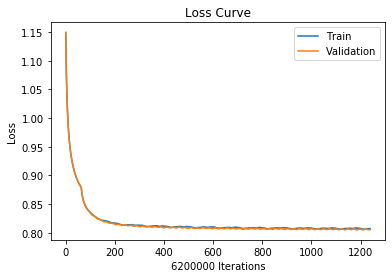

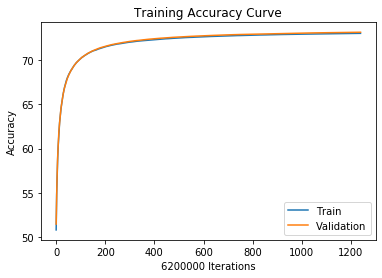

 62%|██████▏   | 305617/491198 [29:50<11:18, 273.48it/s]

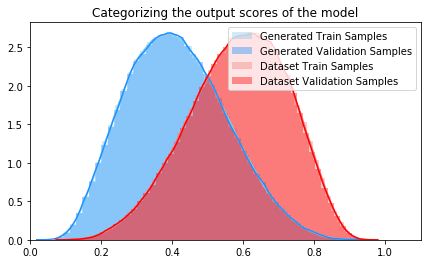

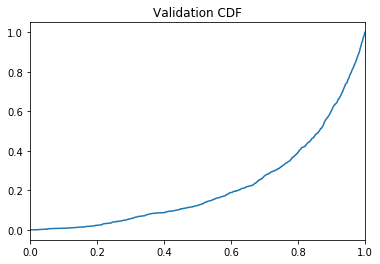

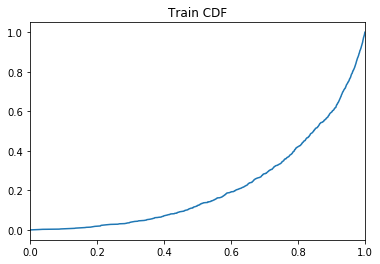

 62%|██████▏   | 305656/491198 [31:14<155:48:20,  3.02s/it]

Training Accuracy at epoch 12: 73.06708064516128
Validation Accuracy epoch 12: 73.19064516129032
Training AUC at epoch 12: 0.21905081818181818
Validation AUC epoch 12: 0.21988863636363637
Train: Sensitivity: 0.7311350804839613 Specificity: 0.7302060121409925
Val: Sensitivity: 0.7327114508683433 Specificity: 0.731104981925196


 72%|███████▏  | 355603/491198 [34:17<08:25, 268.49it/s]   

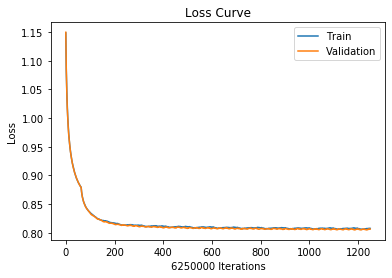

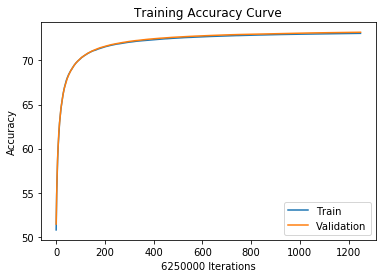

 72%|███████▏  | 355603/491198 [34:30<08:25, 268.49it/s]

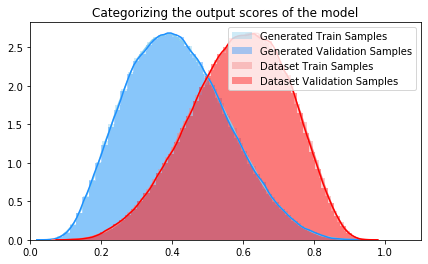

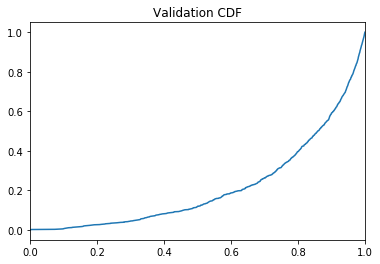

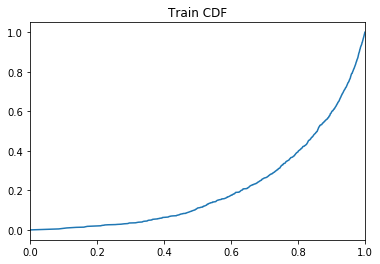

 72%|███████▏  | 355658/491198 [36:00<38:34:25,  1.02s/it]

Training Accuracy at epoch 12: 73.070032
Validation Accuracy epoch 12: 73.194032
Training AUC at epoch 12: 0.21061245454545452
Validation AUC epoch 12: 0.21469545454545455
Train: Sensitivity: 0.73118648209042 Specificity: 0.7302135744763419
Val: Sensitivity: 0.7327750847074406 Specificity: 0.7311092414704742


 83%|████████▎ | 405592/491198 [39:11<06:06, 233.34it/s]  

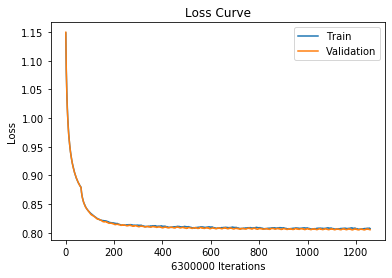

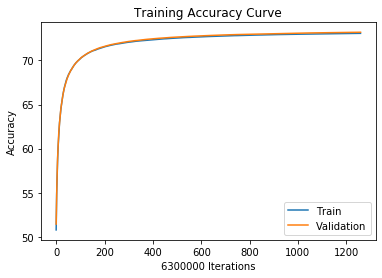

 83%|████████▎ | 405592/491198 [39:30<06:06, 233.34it/s]

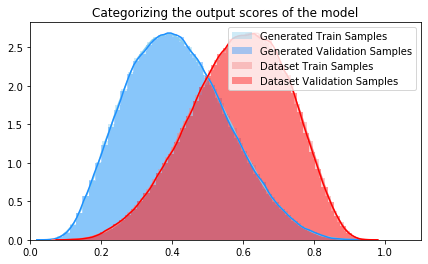

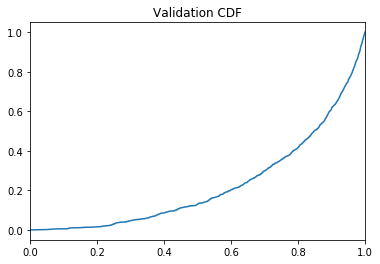

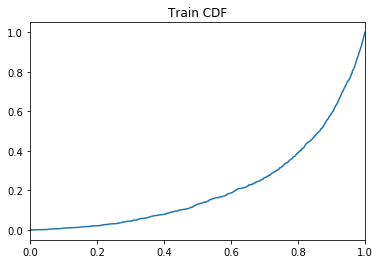

 83%|████████▎ | 405656/491198 [40:53<16:00:55,  1.48it/s]

Training Accuracy at epoch 12: 73.07376190476191
Validation Accuracy epoch 12: 73.19723809523809
Training AUC at epoch 12: 0.2162338181818182
Validation AUC epoch 12: 0.22576718181818184
Train: Sensitivity: 0.7312090686734102 Specificity: 0.7302656384053627
Val: Sensitivity: 0.7327880968508489 Specificity: 0.7311602303399634


 93%|█████████▎| 455592/491198 [44:05<02:24, 246.94it/s]  

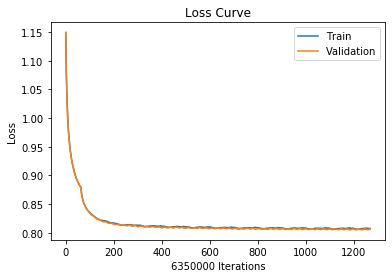

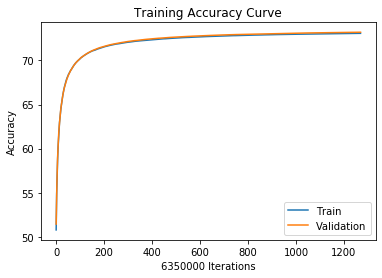

 93%|█████████▎| 455592/491198 [44:21<02:24, 246.94it/s]

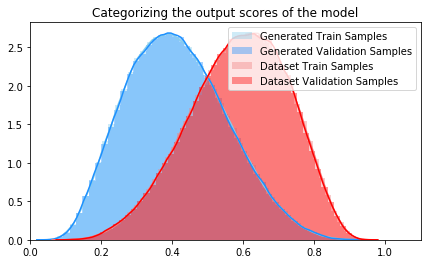

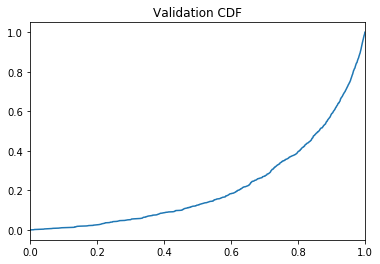

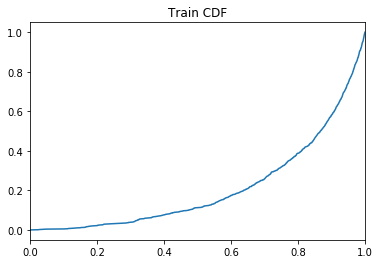

 93%|█████████▎| 455640/491198 [45:48<6:42:23,  1.47it/s]

Training Accuracy at epoch 12: 73.07664566929134
Validation Accuracy epoch 12: 73.19902362204725
Training AUC at epoch 12: 0.20990345454545453
Validation AUC epoch 12: 0.2185129090909091
Train: Sensitivity: 0.7312165531309417 Specificity: 0.7303158836801835
Val: Sensitivity: 0.7327881023524963 Specificity: 0.7311959035161654


  0%|          | 33/491198 [00:00<24:48, 329.98it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 13  with learning rate:  [0.00063]


  3%|▎         | 14416/491198 [00:53<29:33, 268.82it/s]

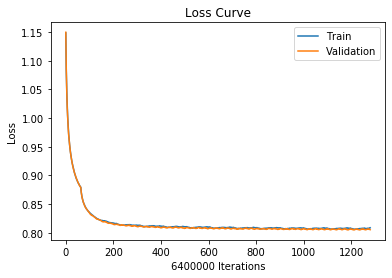

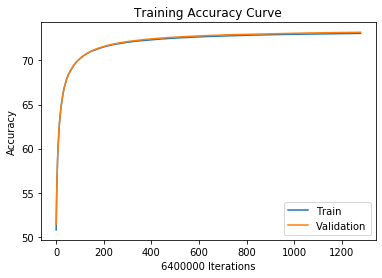

  3%|▎         | 14416/491198 [01:10<29:33, 268.82it/s]

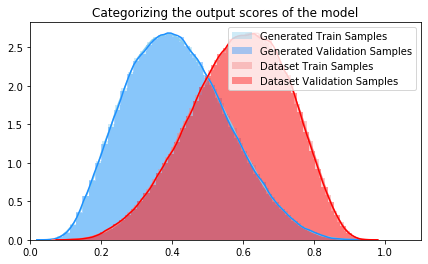

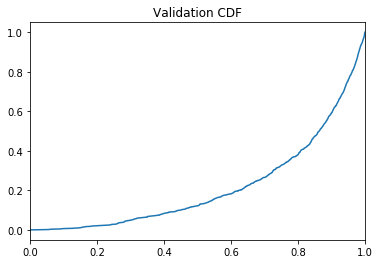

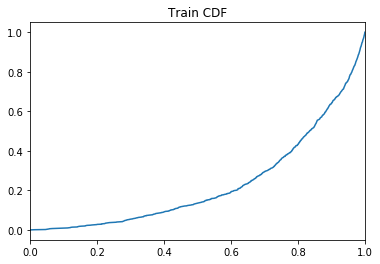

  3%|▎         | 14458/491198 [02:36<286:47:09,  2.17s/it]

Training Accuracy at epoch 13: 73.07809375
Validation Accuracy epoch 13: 73.204609375
Training AUC at epoch 13: 0.23193245454545455
Validation AUC epoch 13: 0.2162658181818182
Train: Sensitivity: 0.7312494456194882 Specificity: 0.7303119102202845
Val: Sensitivity: 0.7328709997986178 Specificity: 0.7312248231795594


 13%|█▎        | 64410/491198 [05:47<29:31, 240.94it/s]   

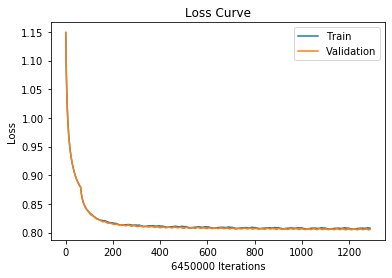

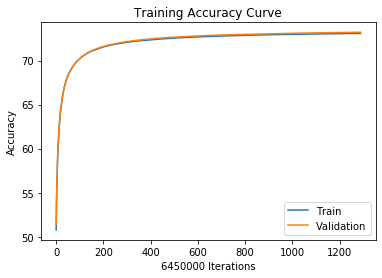

 13%|█▎        | 64410/491198 [06:00<29:31, 240.94it/s]

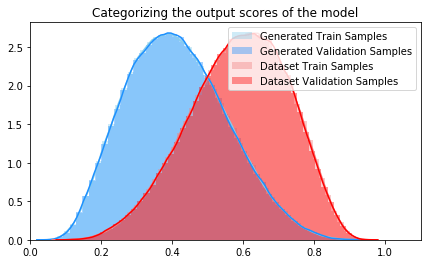

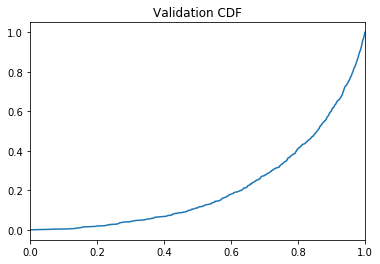

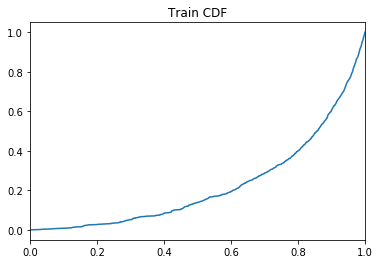

 13%|█▎        | 64457/491198 [07:31<161:44:26,  1.36s/it]

Training Accuracy at epoch 13: 73.0826511627907
Validation Accuracy epoch 13: 73.20666666666666
Training AUC at epoch 13: 0.22443754545454547
Validation AUC epoch 13: 0.21483863636363637
Train: Sensitivity: 0.7312864221191119 Specificity: 0.7303661023090965
Val: Sensitivity: 0.7329052299098111 Specificity: 0.7312317803424785


 23%|██▎       | 114400/491198 [10:44<26:32, 236.65it/s]  

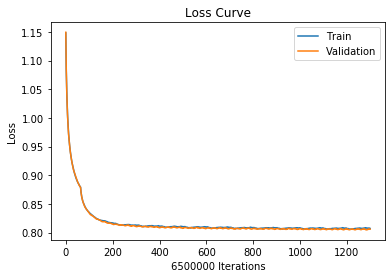

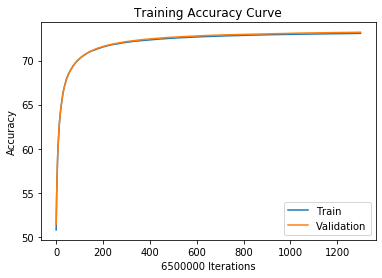

 23%|██▎       | 114400/491198 [11:00<26:32, 236.65it/s]

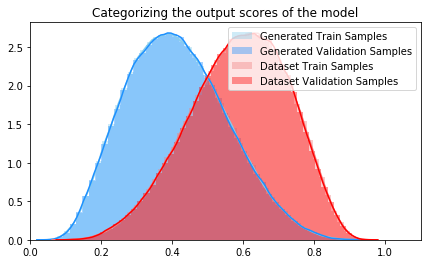

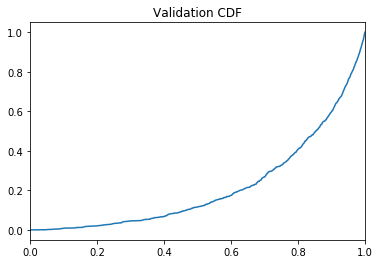

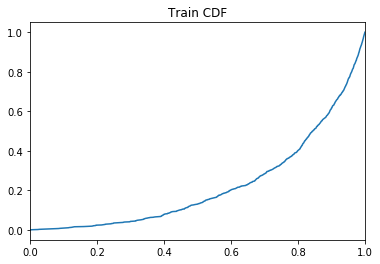

 23%|██▎       | 114458/491198 [12:28<88:06:55,  1.19it/s] 

Training Accuracy at epoch 13: 73.08484615384616
Validation Accuracy epoch 13: 73.21063076923078
Training AUC at epoch 13: 0.22393063636363636
Validation AUC epoch 13: 0.21572609090909092
Train: Sensitivity: 0.7313246165039975 Specificity: 0.7303717806075107
Val: Sensitivity: 0.7329670502493643 Specificity: 0.7312493456708973


 33%|███▎      | 164399/491198 [15:38<20:08, 270.38it/s]  

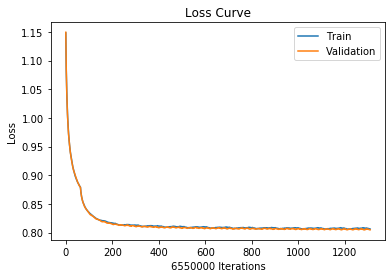

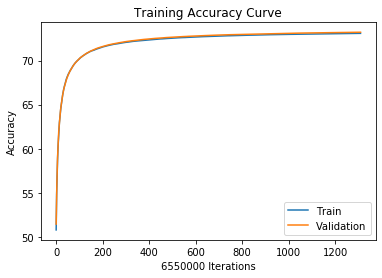

 33%|███▎      | 164399/491198 [15:50<20:08, 270.38it/s]

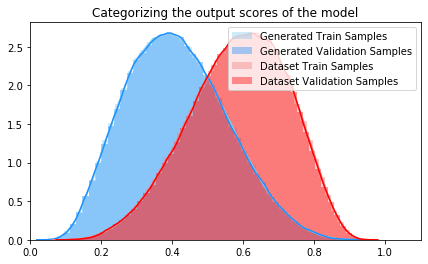

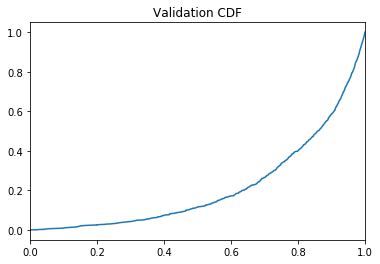

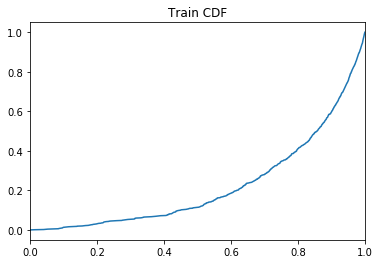

 33%|███▎      | 164442/491198 [17:20<72:52:24,  1.25it/s] 

Training Accuracy at epoch 13: 73.08931297709924
Validation Accuracy epoch 13: 73.21396946564886
Training AUC at epoch 13: 0.22201145454545457
Validation AUC epoch 13: 0.21413481818181818
Train: Sensitivity: 0.7313844680572513 Specificity: 0.7304012369724239
Val: Sensitivity: 0.7330033670878561 Specificity: 0.7312798066901043


 44%|████▎     | 214411/491198 [20:10<13:40, 337.38it/s]  

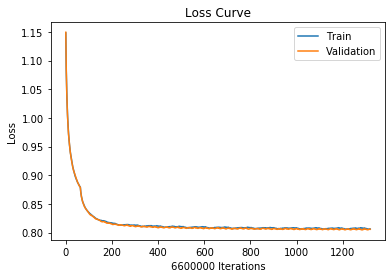

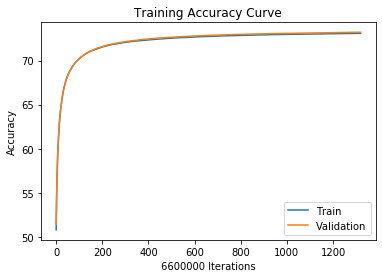

 44%|████▎     | 214411/491198 [20:30<13:40, 337.38it/s]

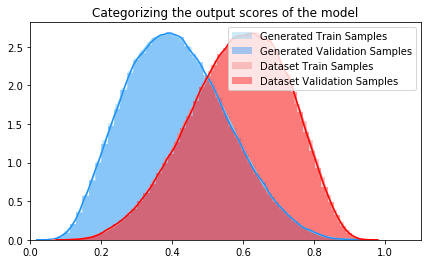

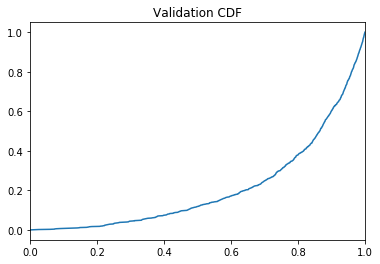

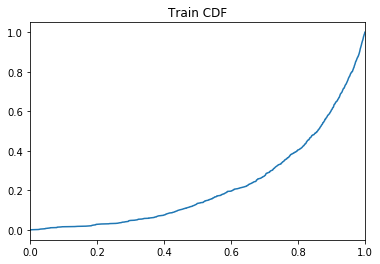

 44%|████▎     | 214460/491198 [21:54<111:17:58,  1.45s/it]

Training Accuracy at epoch 13: 73.09331818181818
Validation Accuracy epoch 13: 73.21546969696969
Training AUC at epoch 13: 0.2225288181818182
Validation AUC epoch 13: 0.20996754545454546
Train: Sensitivity: 0.7314285679673178 Specificity: 0.7304372372193911
Val: Sensitivity: 0.7330149733851367 Specificity: 0.7312982135530257


 54%|█████▍    | 264415/491198 [25:05<15:55, 237.45it/s]   

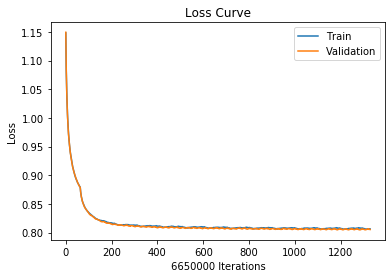

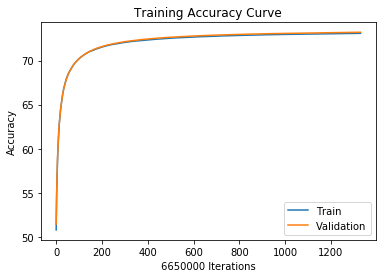

 54%|█████▍    | 264415/491198 [25:20<15:55, 237.45it/s]

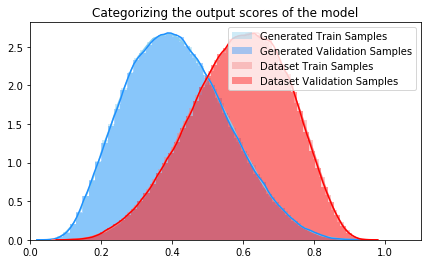

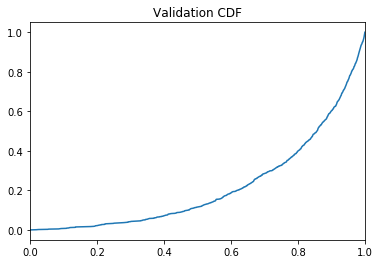

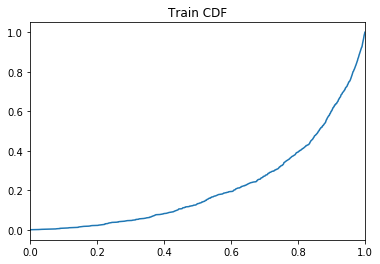

 54%|█████▍    | 264458/491198 [26:49<125:14:21,  1.99s/it]

Training Accuracy at epoch 13: 73.09664661654135
Validation Accuracy epoch 13: 73.21941353383458
Training AUC at epoch 13: 0.21950090909090908
Validation AUC epoch 13: 0.21728281818181816
Train: Sensitivity: 0.7314661159315132 Specificity: 0.7304662309027271
Val: Sensitivity: 0.7330386094869852 Specificity: 0.7313533702365741


 63%|██████▎   | 309338/491198 [29:40<12:43, 238.08it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 84%|████████▍ | 414384/491198 [39:47<04:09, 307.42it/s]

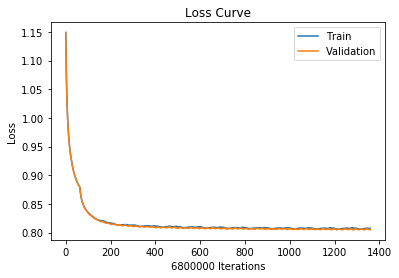

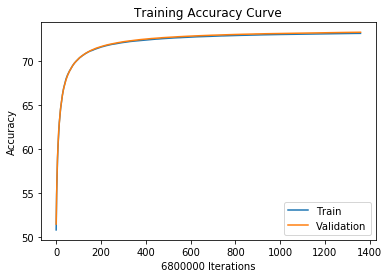

 84%|████████▍ | 414384/491198 [40:00<04:09, 307.42it/s]

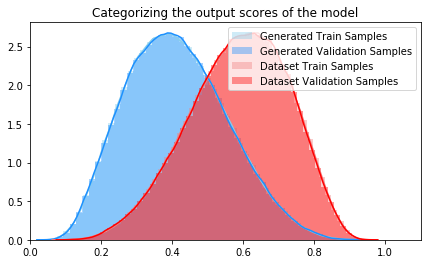

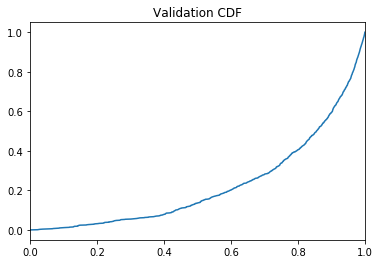

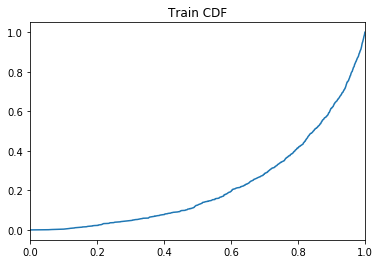

 84%|████████▍ | 414457/491198 [41:34<11:24:47,  1.87it/s]

Training Accuracy at epoch 13: 73.10263235294117
Validation Accuracy epoch 13: 73.22866176470588
Training AUC at epoch 13: 0.22300645454545454
Validation AUC epoch 13: 0.2249741818181818
Train: Sensitivity: 0.731527808193206 Specificity: 0.7305242588731429
Val: Sensitivity: 0.733144527358198 Specificity: 0.731432460383888


 95%|█████████▍| 464411/491198 [44:46<01:52, 237.56it/s]  

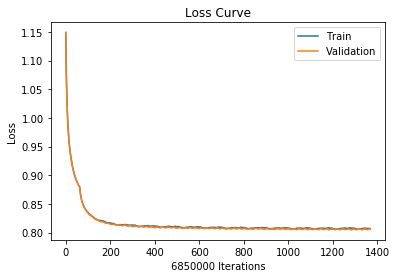

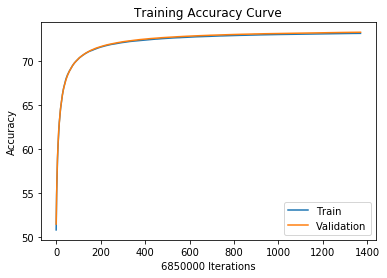

 95%|█████████▍| 464411/491198 [45:00<01:52, 237.56it/s]

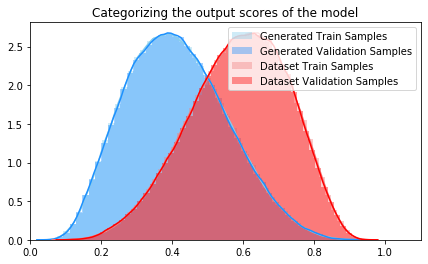

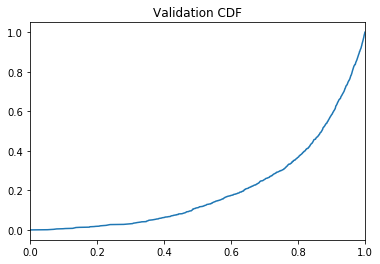

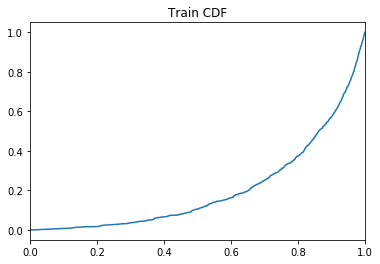

 95%|█████████▍| 464461/491198 [46:33<11:09:33,  1.50s/it]

Training Accuracy at epoch 13: 73.10486131386861
Validation Accuracy epoch 13: 73.23040875912409
Training AUC at epoch 13: 0.2046041818181818
Validation AUC epoch 13: 0.20535327272727272
Train: Sensitivity: 0.731537858380775 Specificity: 0.7305588428012338
Val: Sensitivity: 0.7331428223636391 Specificity: 0.7314690297868274


  0%|          | 28/491198 [00:00<32:05, 255.13it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 14  with learning rate:  [0.00063]


  5%|▍         | 23198/491198 [01:29<32:51, 237.36it/s]

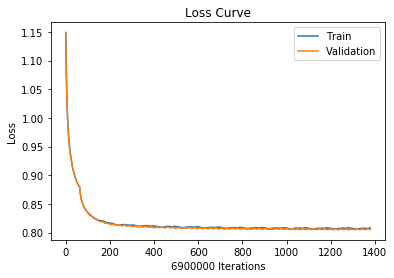

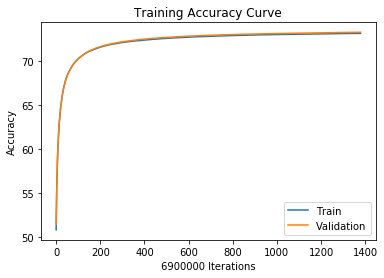

  5%|▍         | 23198/491198 [01:40<32:51, 237.36it/s]

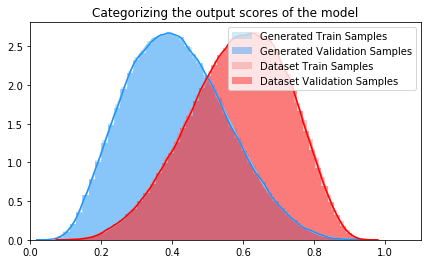

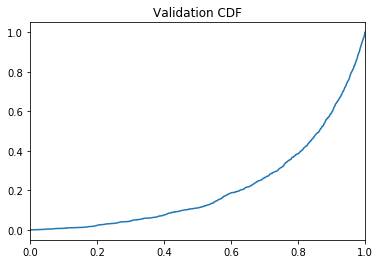

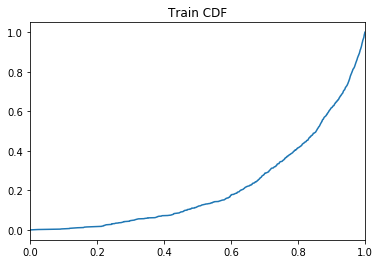

  5%|▍         | 23260/491198 [03:14<96:37:55,  1.35it/s] 

Training Accuracy at epoch 14: 73.10692753623188
Validation Accuracy epoch 14: 73.23485507246377
Training AUC at epoch 14: 0.2179368181818182
Validation AUC epoch 14: 0.21413790909090907
Train: Sensitivity: 0.7315549632805597 Specificity: 0.7305830662819193
Val: Sensitivity: 0.733191303077248 Specificity: 0.731509474508039


 15%|█▍        | 73222/491198 [06:26<25:58, 268.20it/s]  

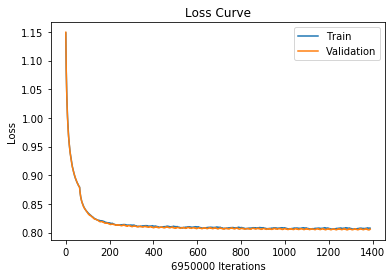

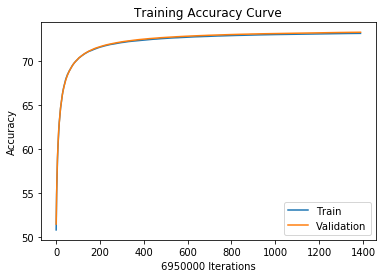

 15%|█▍        | 73222/491198 [06:40<25:58, 268.20it/s]

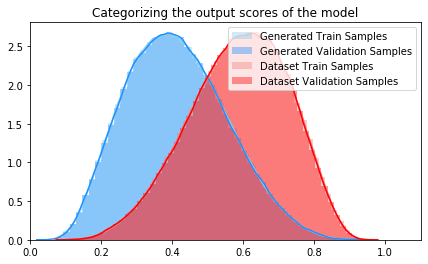

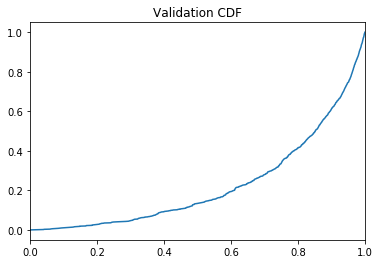

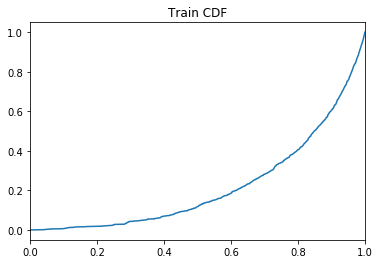

 15%|█▍        | 73244/491198 [08:12<433:35:23,  3.73s/it]

Training Accuracy at epoch 14: 73.10969784172661
Validation Accuracy epoch 14: 73.23602877697842
Training AUC at epoch 14: 0.21873927272727273
Validation AUC epoch 14: 0.22489790909090912
Train: Sensitivity: 0.7315799161880219 Specificity: 0.7306135317303789
Val: Sensitivity: 0.7332180654315985 Specificity: 0.731506310450324


 25%|██▌       | 123185/491198 [11:23<20:06, 305.09it/s]  

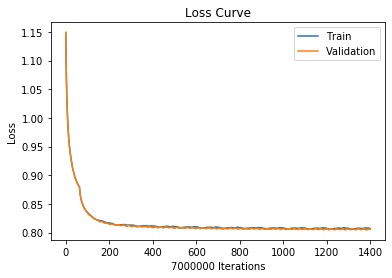

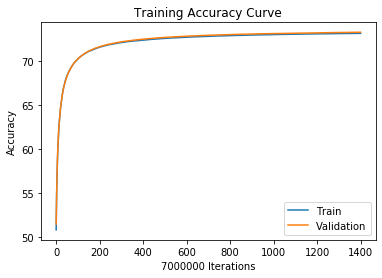

 25%|██▌       | 123185/491198 [11:40<20:06, 305.09it/s]

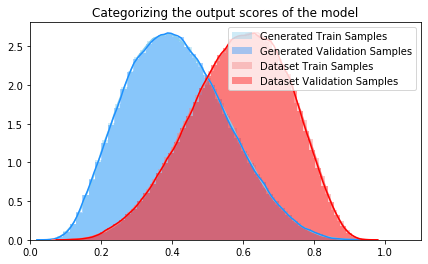

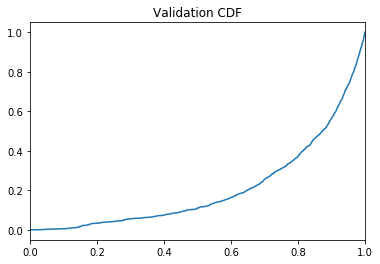

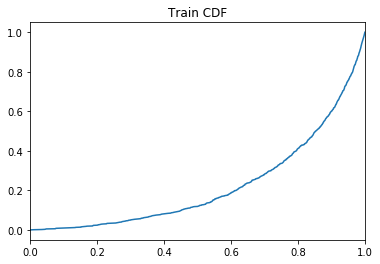

 25%|██▌       | 123259/491198 [13:10<53:39:08,  1.90it/s]

Training Accuracy at epoch 14: 73.1129
Validation Accuracy epoch 14: 73.23992857142858
Training AUC at epoch 14: 0.2212129090909091
Validation AUC epoch 14: 0.20812309090909092
Train: Sensitivity: 0.7316327302788919 Specificity: 0.7306247239576856
Val: Sensitivity: 0.733272532296375 Specificity: 0.7315298903708518


 35%|███▌      | 173216/491198 [16:22<21:43, 243.95it/s]  

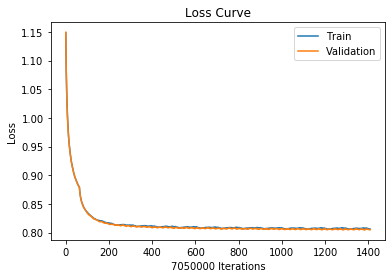

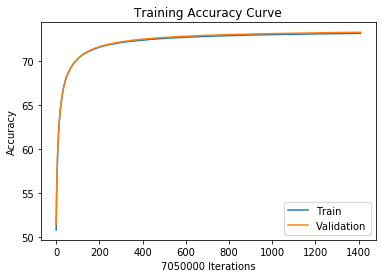

 35%|███▌      | 173216/491198 [16:40<21:43, 243.95it/s]

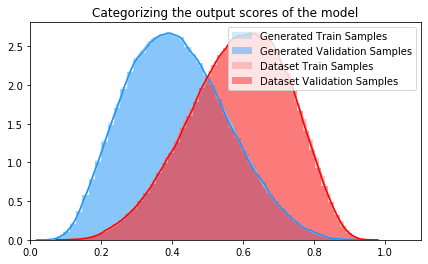

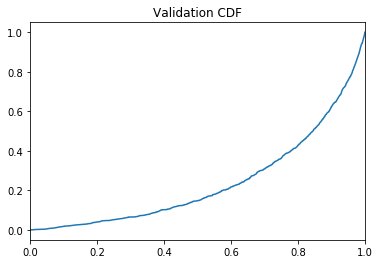

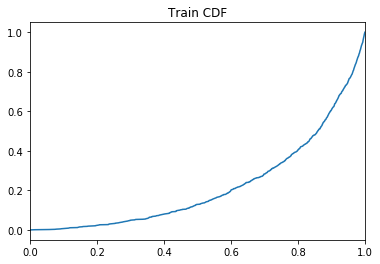

 35%|███▌      | 173259/491198 [18:09<165:58:34,  1.88s/it]

Training Accuracy at epoch 14: 73.11662411347518
Validation Accuracy epoch 14: 73.24198581560283
Training AUC at epoch 14: 0.22156172727272727
Validation AUC epoch 14: 0.2388854545454545
Train: Sensitivity: 0.7316753191887516 Specificity: 0.7306566110999151
Val: Sensitivity: 0.7332814558597 Specificity: 0.7315620348862554


 45%|████▌     | 223201/491198 [21:21<18:37, 239.81it/s]   

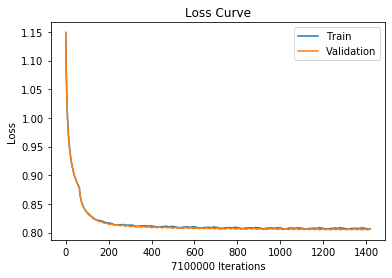

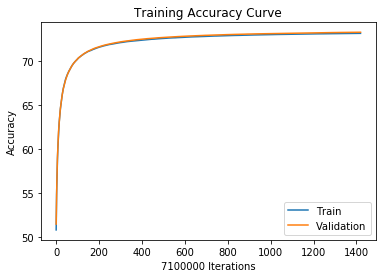

 45%|████▌     | 223201/491198 [21:40<18:37, 239.81it/s]

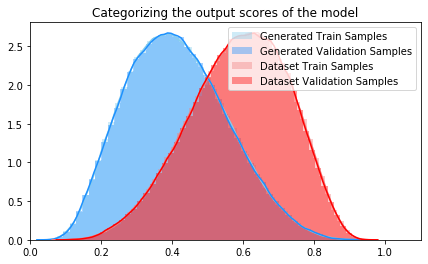

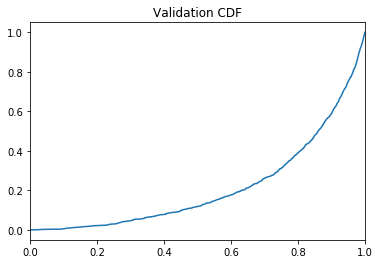

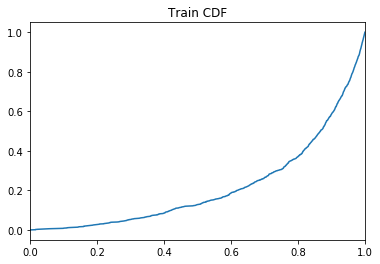

 45%|████▌     | 223260/491198 [23:09<62:30:50,  1.19it/s]

Training Accuracy at epoch 14: 73.11929577464788
Validation Accuracy epoch 14: 73.24397183098591
Training AUC at epoch 14: 0.21604227272727272
Validation AUC epoch 14: 0.2134270909090909
Train: Sensitivity: 0.7317143416183254 Specificity: 0.7306709845983436
Val: Sensitivity: 0.7333120847924061 Specificity: 0.7315711749633762


 56%|█████▌    | 273208/491198 [26:22<15:07, 240.10it/s]  

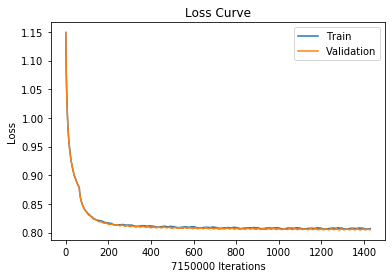

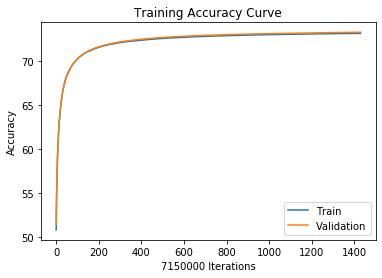

 56%|█████▌    | 273208/491198 [26:40<15:07, 240.10it/s]

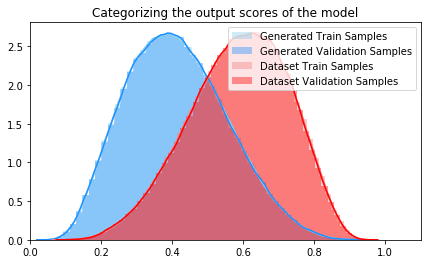

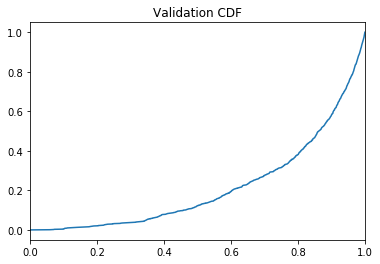

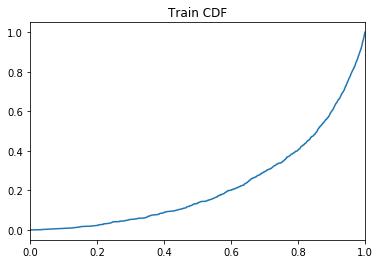

 56%|█████▌    | 273244/491198 [28:11<69:28:40,  1.15s/it]

Training Accuracy at epoch 14: 73.12127272727272
Validation Accuracy epoch 14: 73.24762237762238
Training AUC at epoch 14: 0.22476818181818184
Validation AUC epoch 14: 0.2140465454545455
Train: Sensitivity: 0.7317428341714387 Specificity: 0.7306819924744268
Val: Sensitivity: 0.7333448458758373 Specificity: 0.7316114205459525


 66%|██████▌   | 323204/491198 [31:20<10:13, 273.66it/s]  

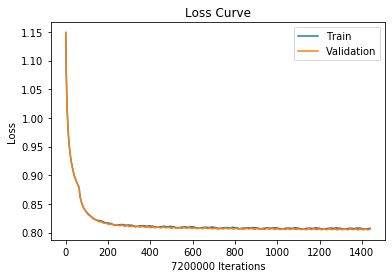

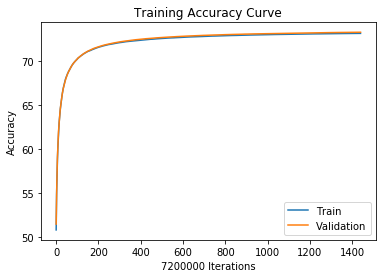

 66%|██████▌   | 323204/491198 [31:30<10:13, 273.66it/s]

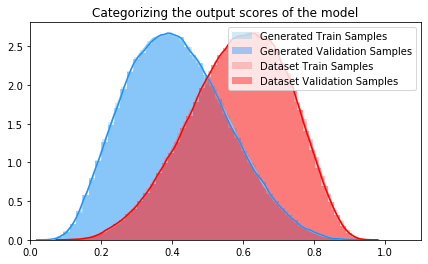

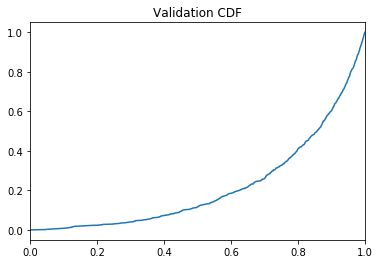

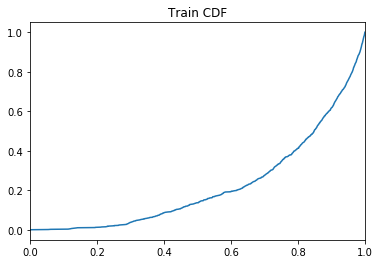

 66%|██████▌   | 323262/491198 [33:08<44:09:55,  1.06it/s]

Training Accuracy at epoch 14: 73.121125
Validation Accuracy epoch 14: 73.24918055555555
Training AUC at epoch 14: 0.223294
Validation AUC epoch 14: 0.21748009090909093
Train: Sensitivity: 0.7317470496622831 Specificity: 0.7306748159327602
Val: Sensitivity: 0.7333712881003454 Specificity: 0.7316162255872706


 76%|███████▌  | 373221/491198 [36:19<07:59, 245.88it/s]  

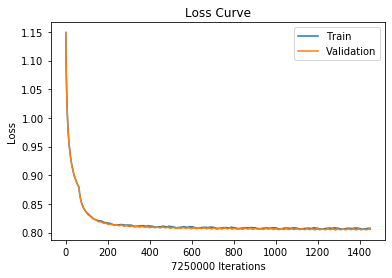

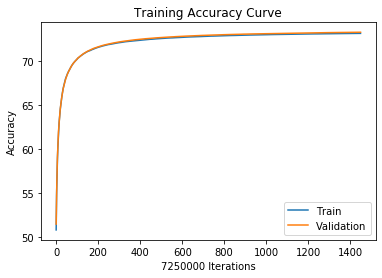

 76%|███████▌  | 373221/491198 [36:30<07:59, 245.88it/s]

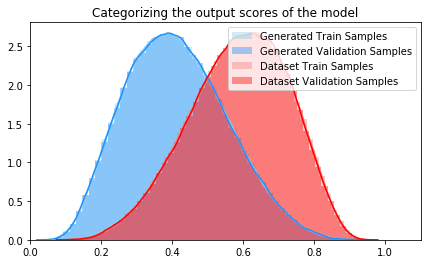

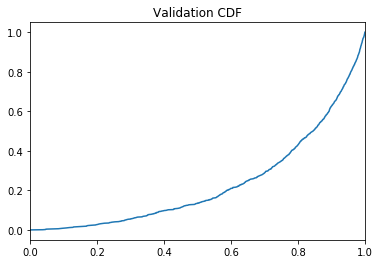

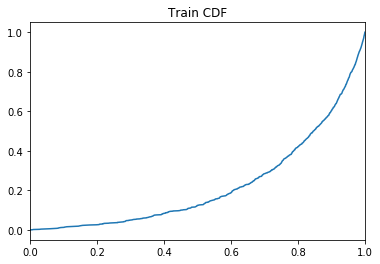

 76%|███████▌  | 373260/491198 [38:09<107:53:22,  3.29s/it]

Training Accuracy at epoch 14: 73.12532413793103
Validation Accuracy epoch 14: 73.25291034482758
Training AUC at epoch 14: 0.22404145454545454
Validation AUC epoch 14: 0.2317599090909091
Train: Sensitivity: 0.7317949701993492 Specificity: 0.7307108839387695
Val: Sensitivity: 0.7334063037480602 Specificity: 0.7316557707399018


 86%|████████▌ | 423214/491198 [41:20<04:34, 247.42it/s]   

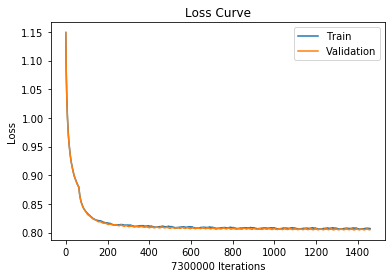

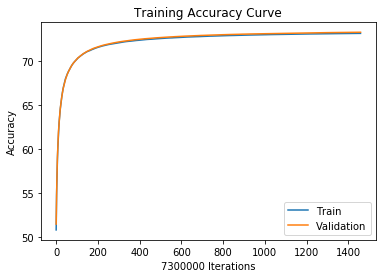

 86%|████████▌ | 423214/491198 [41:30<04:34, 247.42it/s]

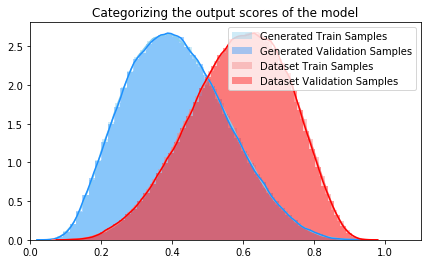

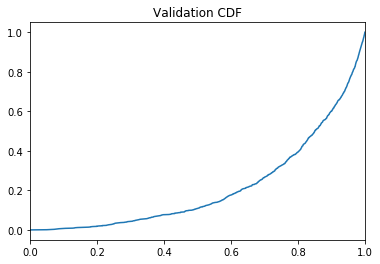

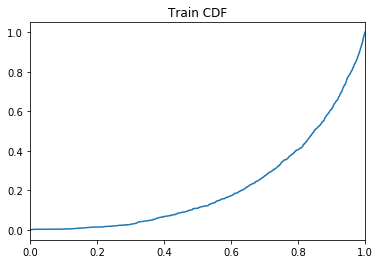

 86%|████████▌ | 423260/491198 [43:11<31:15:41,  1.66s/it]

Training Accuracy at epoch 14: 73.12720547945206
Validation Accuracy epoch 14: 73.25457534246576
Training AUC at epoch 14: 0.2144830909090909
Validation AUC epoch 14: 0.21399054545454543
Train: Sensitivity: 0.7318090898760571 Specificity: 0.730734405818118
Val: Sensitivity: 0.7334249512964949 Specificity: 0.7316704323187259


 96%|█████████▋| 473202/491198 [46:22<01:14, 241.76it/s]  

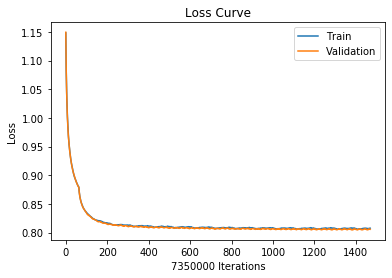

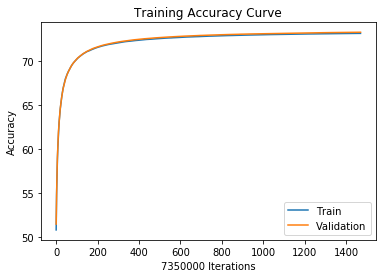

 96%|█████████▋| 473202/491198 [46:40<01:14, 241.76it/s]

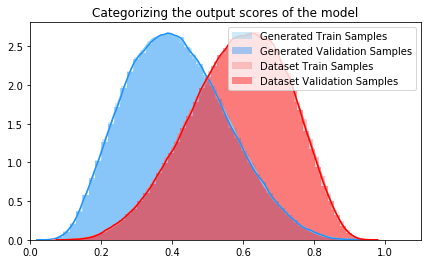

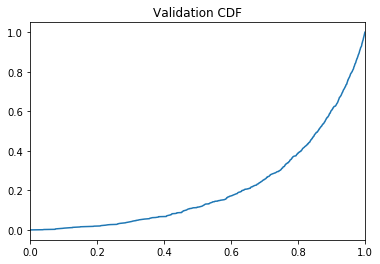

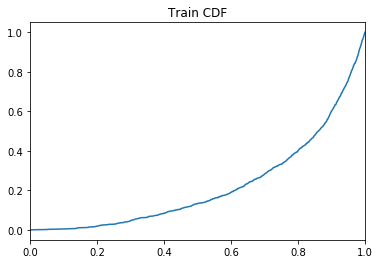

 96%|█████████▋| 473244/491198 [48:12<4:26:49,  1.12it/s]

Training Accuracy at epoch 14: 73.12880272108843
Validation Accuracy epoch 14: 73.25731972789116
Training AUC at epoch 14: 0.22077527272727274
Validation AUC epoch 14: 0.21157881818181817
Train: Sensitivity: 0.7318015623759166 Specificity: 0.7307739428636147
Val: Sensitivity: 0.7334398558319158 Specificity: 0.73171038309673


  0%|          | 30/491198 [00:00<31:23, 260.75it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 15  with learning rate:  [0.00063]


  7%|▋         | 32013/491198 [02:03<28:33, 267.95it/s]

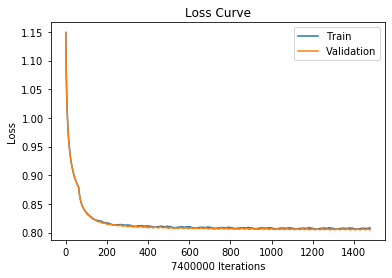

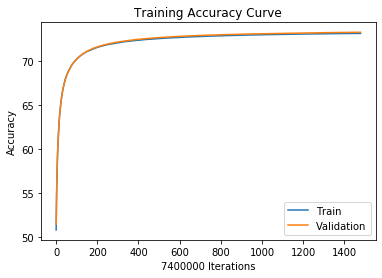

  7%|▋         | 32013/491198 [02:20<28:33, 267.95it/s]

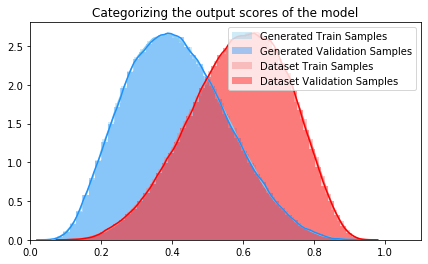

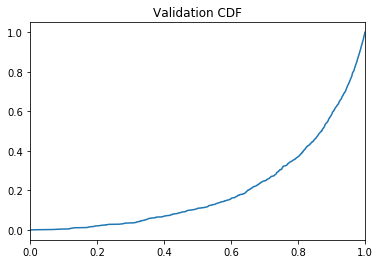

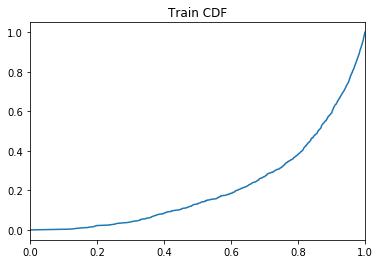

  7%|▋         | 32064/491198 [03:53<174:03:59,  1.36s/it]

Training Accuracy at epoch 15: 73.13136486486486
Validation Accuracy epoch 15: 73.26054054054055
Training AUC at epoch 15: 0.21631372727272727
Validation AUC epoch 15: 0.20406381818181818
Train: Sensitivity: 0.7318261652221314 Specificity: 0.7308005782582053
Val: Sensitivity: 0.733477380433864 Specificity: 0.7317372642761139


 17%|█▋        | 82004/491198 [07:05<24:58, 272.99it/s]   

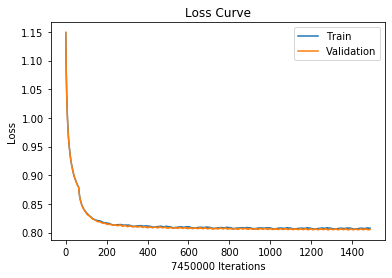

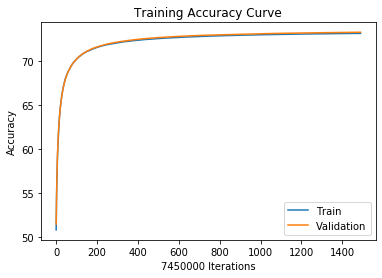

 17%|█▋        | 82004/491198 [07:20<24:58, 272.99it/s]

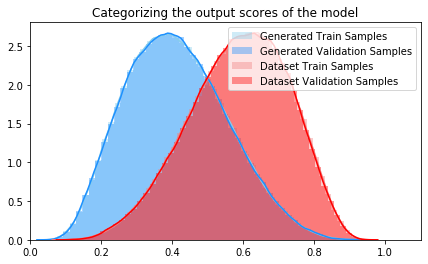

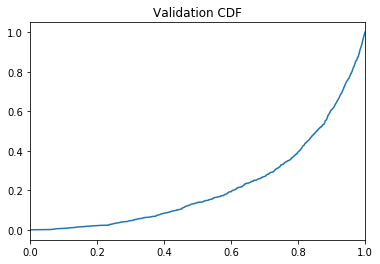

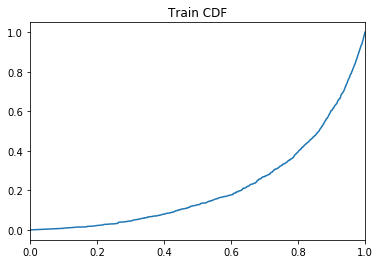

 17%|█▋        | 82063/491198 [08:57<103:06:30,  1.10it/s]

Training Accuracy at epoch 15: 73.13339597315436
Validation Accuracy epoch 15: 73.26139597315436
Training AUC at epoch 15: 0.21740636363636362
Validation AUC epoch 15: 0.22113054545454547
Train: Sensitivity: 0.7318525915976524 Specificity: 0.7308147689735734
Val: Sensitivity: 0.7334977593436017 Specificity: 0.7317340577815683


 27%|██▋       | 132027/491198 [12:09<24:23, 245.46it/s]  

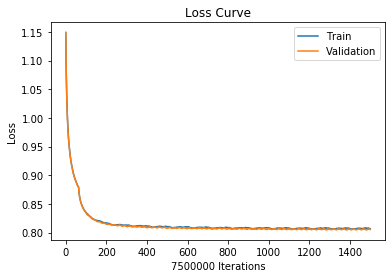

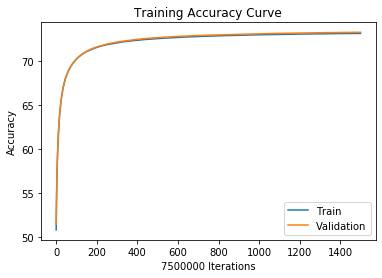

 27%|██▋       | 132027/491198 [12:20<24:23, 245.46it/s]

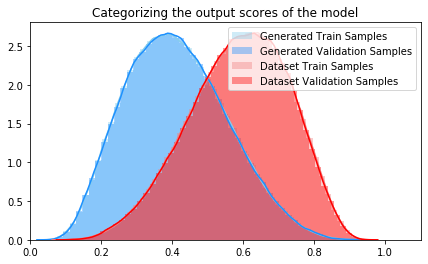

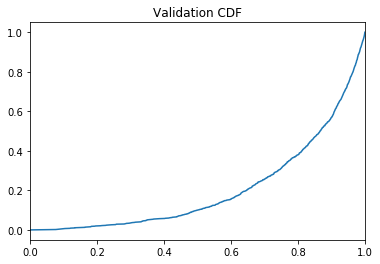

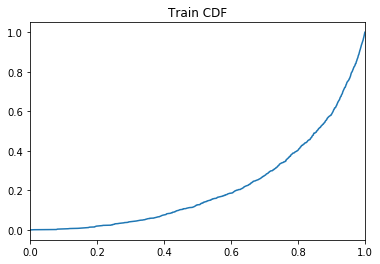

 27%|██▋       | 132062/491198 [14:01<780:21:00,  7.82s/it] 

Training Accuracy at epoch 15: 73.13648
Validation Accuracy epoch 15: 73.26532
Training AUC at epoch 15: 0.21767936363636362
Validation AUC epoch 15: 0.20414172727272728
Train: Sensitivity: 0.7319087512706157 Specificity: 0.730820233934793
Val: Sensitivity: 0.7335519115752306 Specificity: 0.7317584307347875


 37%|███▋      | 182002/491198 [17:13<22:40, 227.24it/s]   

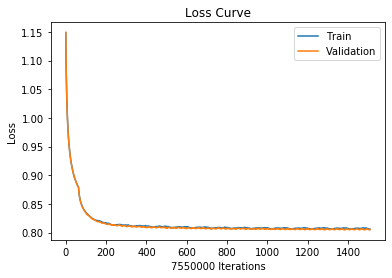

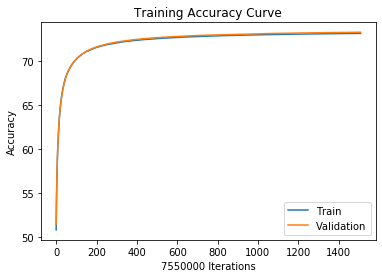

 37%|███▋      | 182002/491198 [17:30<22:40, 227.24it/s]

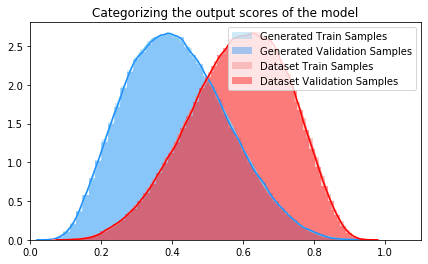

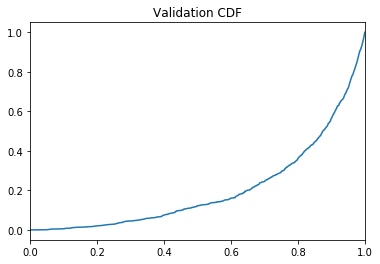

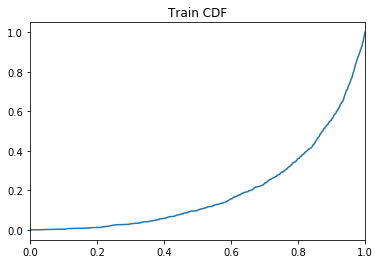

 37%|███▋      | 182046/491198 [19:04<72:01:35,  1.19it/s] 

Training Accuracy at epoch 15: 73.14029139072848
Validation Accuracy epoch 15: 73.26728476821192
Training AUC at epoch 15: 0.19582781818181816
Validation AUC epoch 15: 0.2038660909090909
Train: Sensitivity: 0.731951158813282 Specificity: 0.7308540470624407
Val: Sensitivity: 0.7335702697299726 Specificity: 0.7317793665700404


 47%|████▋     | 232002/491198 [22:17<16:16, 265.40it/s]  

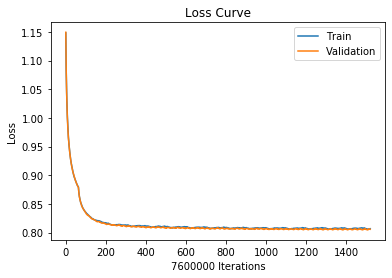

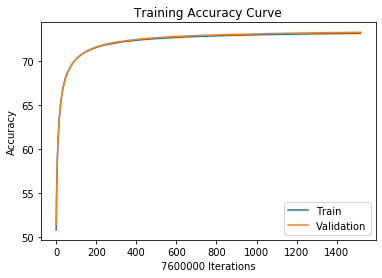

 47%|████▋     | 232002/491198 [22:30<16:16, 265.40it/s]

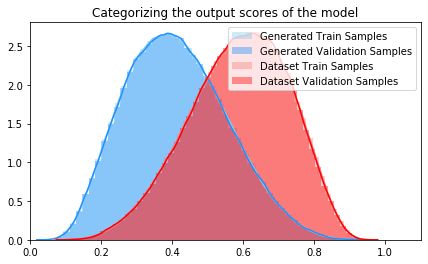

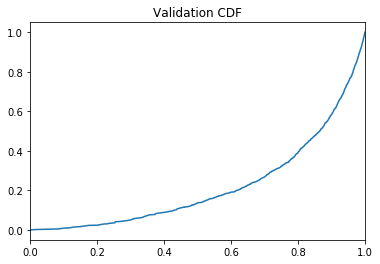

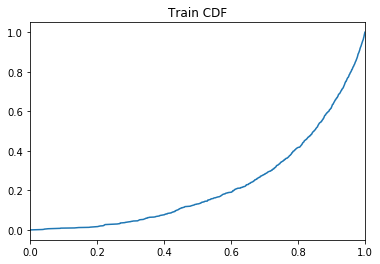

 47%|████▋     | 232060/491198 [24:15<64:20:20,  1.12it/s]

Training Accuracy at epoch 15: 73.14163157894737
Validation Accuracy epoch 15: 73.26982894736842
Training AUC at epoch 15: 0.22442581818181817
Validation AUC epoch 15: 0.2192817272727273
Train: Sensitivity: 0.7319667263344104 Specificity: 0.7308652774186549
Val: Sensitivity: 0.7335961947512992 Specificity: 0.7318043427743183


 57%|█████▋    | 282019/491198 [27:32<14:27, 241.14it/s]  

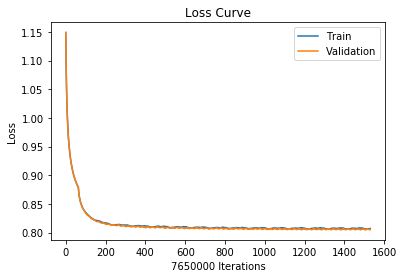

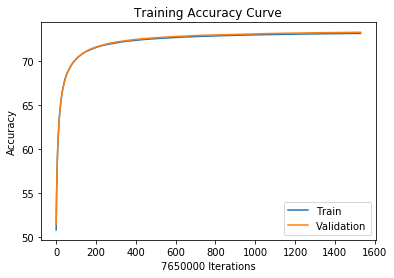

 57%|█████▋    | 282019/491198 [27:50<14:27, 241.14it/s]

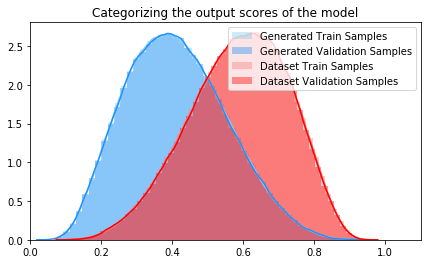

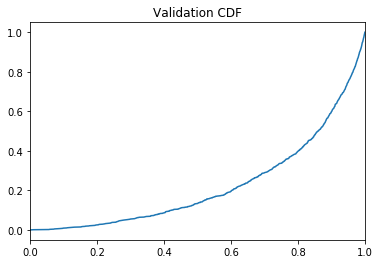

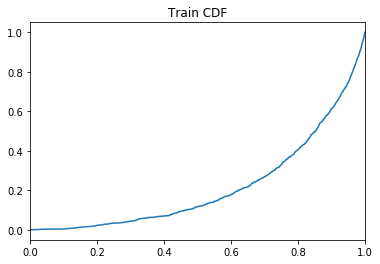

 57%|█████▋    | 282063/491198 [29:26<126:01:54,  2.17s/it]

Training Accuracy at epoch 15: 73.14296732026143
Validation Accuracy epoch 15: 73.27159477124184
Training AUC at epoch 15: 0.21727045454545452
Validation AUC epoch 15: 0.22362436363636362
Train: Sensitivity: 0.7319866285820591 Specificity: 0.7308720569477536
Val: Sensitivity: 0.7336097917312965 Specificity: 0.7318260172713879


 68%|██████▊   | 332014/491198 [32:38<11:03, 239.74it/s]   

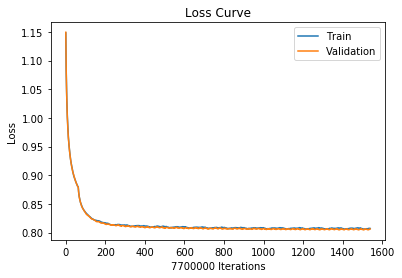

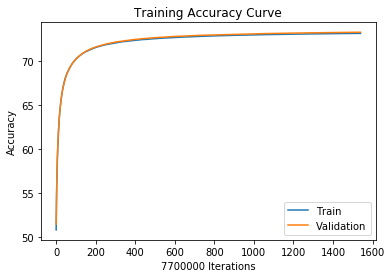

 68%|██████▊   | 332014/491198 [32:50<11:03, 239.74it/s]

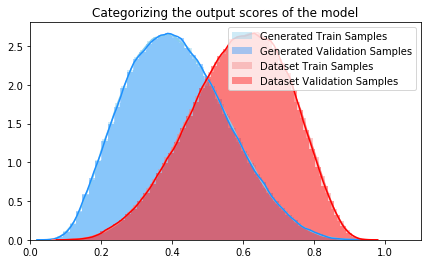

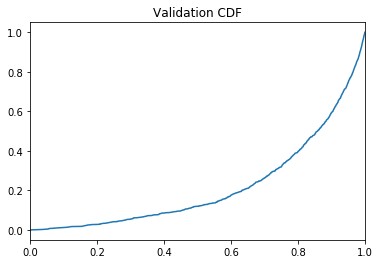

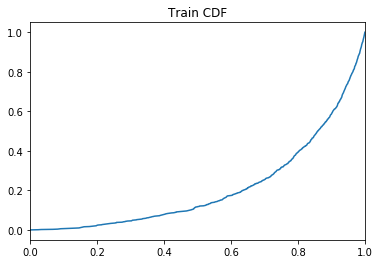

 68%|██████▊   | 332062/491198 [34:30<65:18:35,  1.48s/it]

Training Accuracy at epoch 15: 73.14411688311688
Validation Accuracy epoch 15: 73.27272727272727
Training AUC at epoch 15: 0.2117659090909091
Validation AUC epoch 15: 0.21690672727272728
Train: Sensitivity: 0.7320029218968863 Specificity: 0.7308787465161077
Val: Sensitivity: 0.7336225307411083 Specificity: 0.7318359887253393


 78%|███████▊  | 381991/491198 [37:42<07:18, 248.82it/s]  

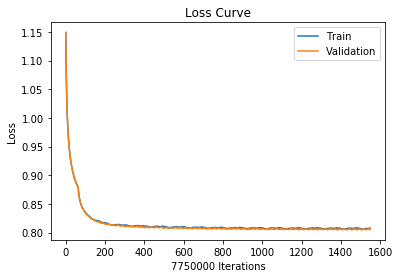

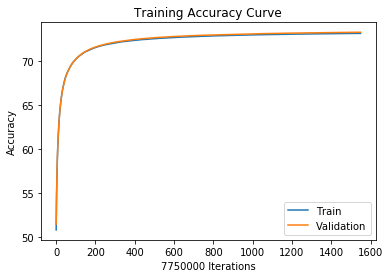

 88%|████████▊ | 432005/491198 [42:46<03:44, 264.10it/s]

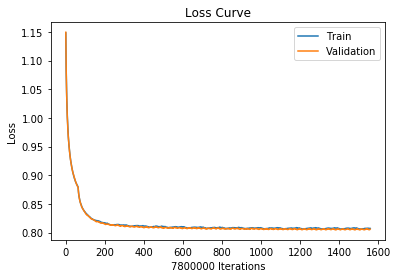

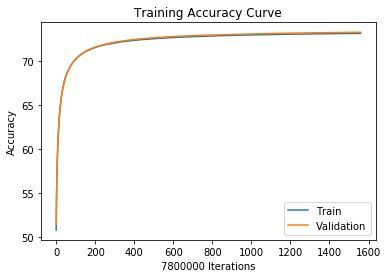

 88%|████████▊ | 432005/491198 [43:00<03:44, 264.10it/s]

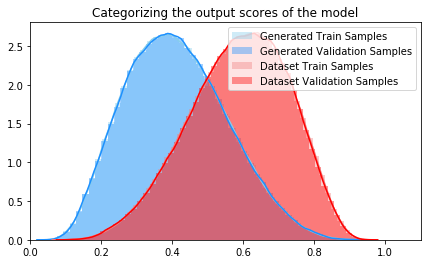

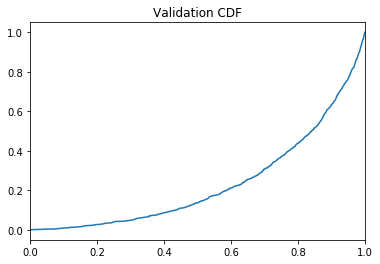

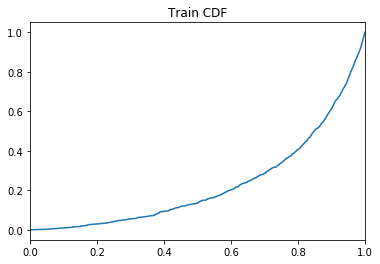

 88%|████████▊ | 432061/491198 [44:39<15:37:51,  1.05it/s]

Training Accuracy at epoch 15: 73.14896153846153
Validation Accuracy epoch 15: 73.27770512820513
Training AUC at epoch 15: 0.2289968181818182
Validation AUC epoch 15: 0.23439218181818183
Train: Sensitivity: 0.732042124664158 Specificity: 0.7309365016978512
Val: Sensitivity: 0.7336641978176616 Specificity: 0.7318937987165665


 98%|█████████▊| 482025/491198 [47:50<00:38, 240.80it/s]  

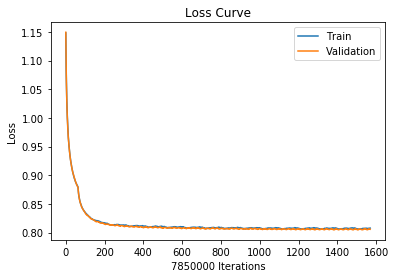

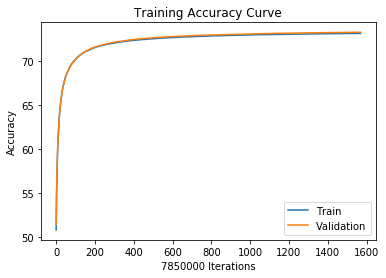

 98%|█████████▊| 482025/491198 [48:00<00:38, 240.80it/s]

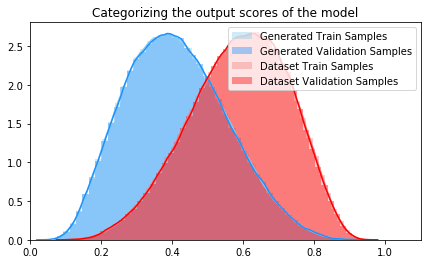

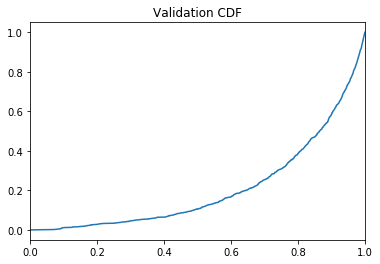

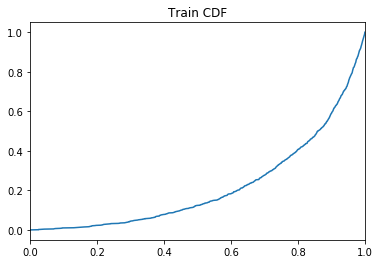

 98%|█████████▊| 482063/491198 [49:43<12:04:44,  4.76s/it]

Training Accuracy at epoch 15: 73.15011464968153
Validation Accuracy epoch 15: 73.28112101910828
Training AUC at epoch 15: 0.21768545454545454
Validation AUC epoch 15: 0.2086502727272727
Train: Sensitivity: 0.7320529936567828 Specificity: 0.7309486840183307
Val: Sensitivity: 0.7336917665227214 Specificity: 0.7319345470519328


 99%|█████████▉| 488414/491198 [50:08<00:11, 232.26it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 49%|████▉     | 240814/491198 [23:06<17:02, 244.96it/s]

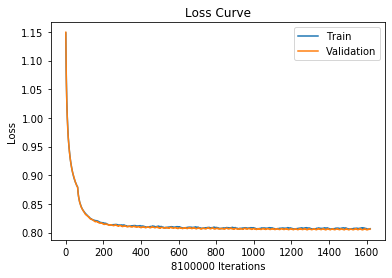

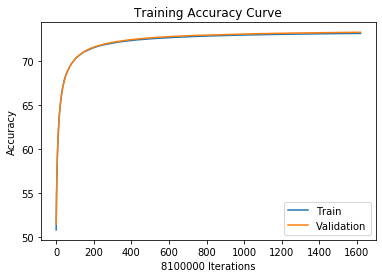

 49%|████▉     | 240814/491198 [23:20<17:02, 244.96it/s]

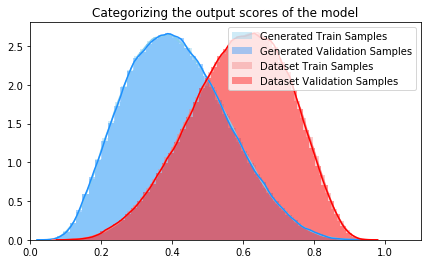

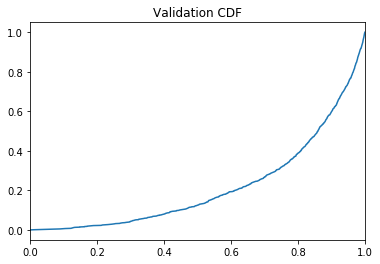

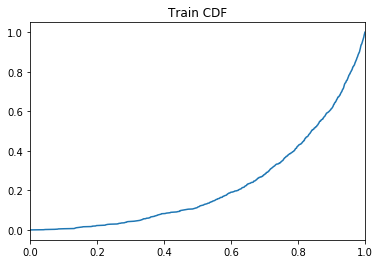

 49%|████▉     | 240864/491198 [25:02<94:54:33,  1.36s/it] 

Training Accuracy at epoch 16: 73.16148148148149
Validation Accuracy epoch 16: 73.29192592592592
Training AUC at epoch 16: 0.22296545454545455
Validation AUC epoch 16: 0.21676763636363636
Train: Sensitivity: 0.7321884086618058 Specificity: 0.7310405637203129
Val: Sensitivity: 0.7338240800108289 Specificity: 0.7320184274394319


 59%|█████▉    | 290819/491198 [28:16<12:52, 259.38it/s]  

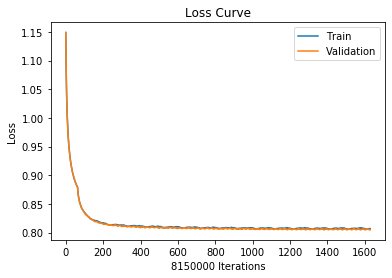

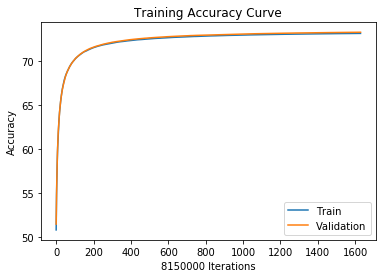

 59%|█████▉    | 290819/491198 [28:30<12:52, 259.38it/s]

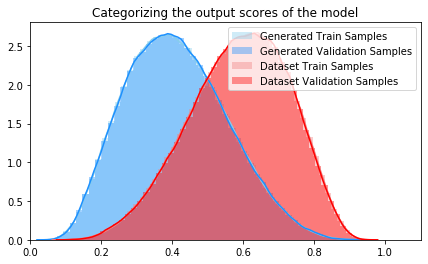

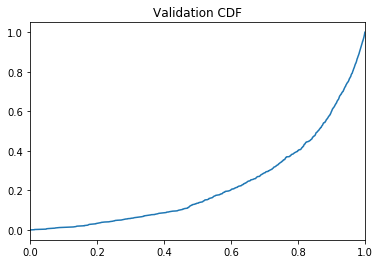

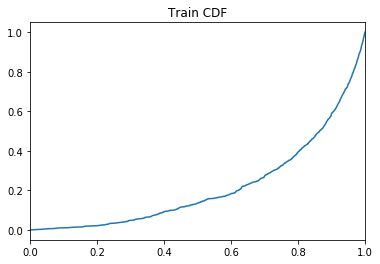

 59%|█████▉    | 290848/491198 [30:12<104:46:15,  1.88s/it]

Training Accuracy at epoch 16: 73.16338650306749
Validation Accuracy epoch 16: 73.29430674846625
Training AUC at epoch 16: 0.2178799090909091
Validation AUC epoch 16: 0.226212
Train: Sensitivity: 0.7322224331402207 Specificity: 0.7310445991809627
Val: Sensitivity: 0.7338516080082537 Specificity: 0.732038506884887


 60%|██████    | 294752/491198 [30:27<14:25, 227.07it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|█████████▉| 490802/491198 [49:10<00:01, 241.20it/s]

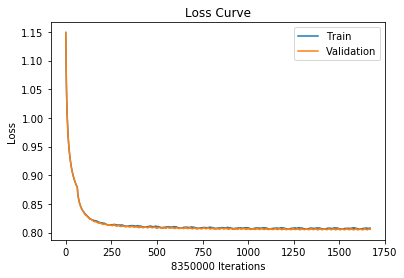

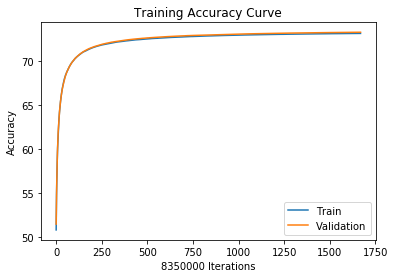

100%|█████████▉| 490802/491198 [49:21<00:01, 241.20it/s]

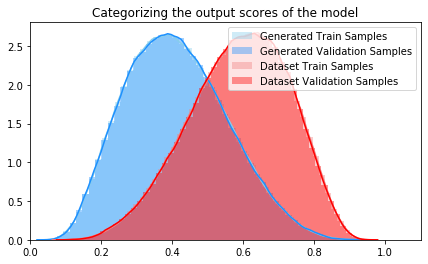

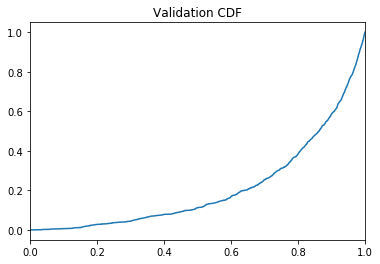

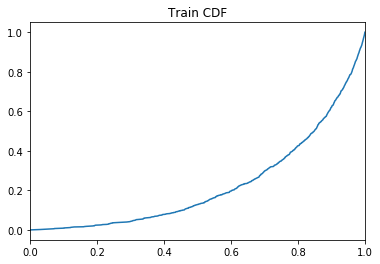

100%|█████████▉| 490848/491198 [51:08<04:49,  1.21it/s] 

Training Accuracy at epoch 16: 73.16917365269461
Validation Accuracy epoch 16: 73.30217964071856
Training AUC at epoch 16: 0.22645936363636365
Validation AUC epoch 16: 0.21018545454545456
Train: Sensitivity: 0.7322626546218504 Specificity: 0.7311201923353445
Val: Sensitivity: 0.7339199753801423 Specificity: 0.73212759158914


  0%|          | 34/491198 [00:00<32:21, 252.94it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 17  with learning rate:  [0.00063]


 10%|█         | 49618/491198 [03:06<22:03, 333.62it/s]

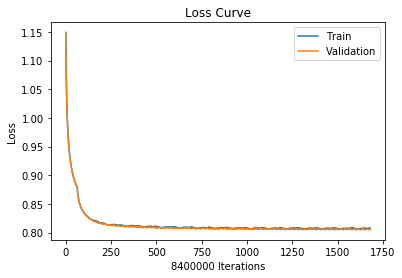

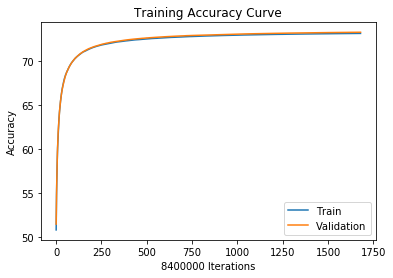

 10%|█         | 49618/491198 [03:20<22:03, 333.62it/s]

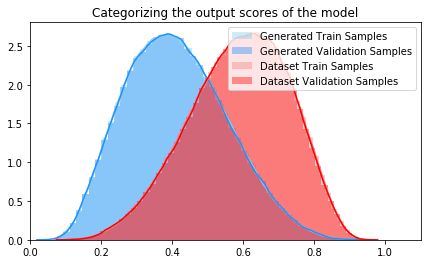

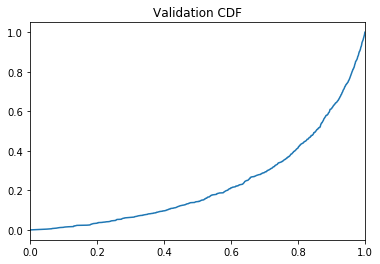

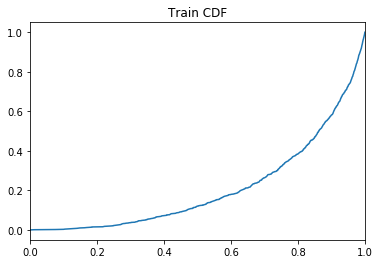

 10%|█         | 49669/491198 [05:15<206:59:38,  1.69s/it]

Training Accuracy at epoch 17: 73.17164285714286
Validation Accuracy epoch 17: 73.30385714285714
Training AUC at epoch 17: 0.20965345454545456
Validation AUC epoch 17: 0.23261654545454544
Train: Sensitivity: 0.7322853214401807 Specificity: 0.7311469106609486
Val: Sensitivity: 0.733948003653756 Specificity: 0.7321331336458519


 50%|████▉     | 243633/491198 [25:53<17:12, 239.88it/s]  

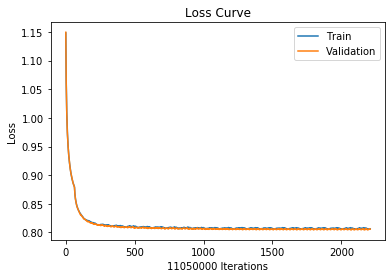

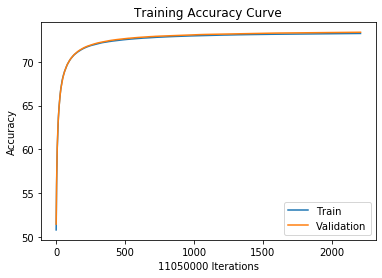

 50%|████▉     | 243633/491198 [26:10<17:12, 239.88it/s]

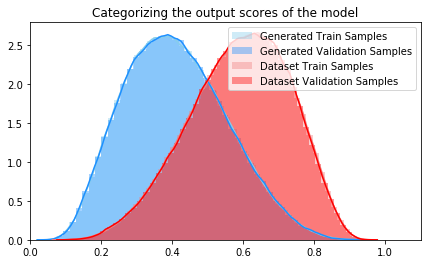

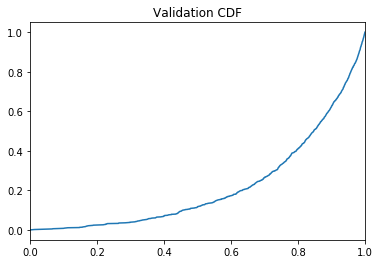

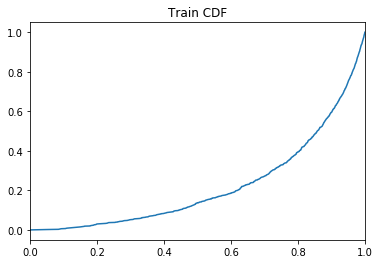

 50%|████▉     | 243679/491198 [28:30<205:19:35,  2.99s/it]

Training Accuracy at epoch 22: 73.24401809954752
Validation Accuracy epoch 22: 73.38234389140271
Training AUC at epoch 22: 0.2202180909090909
Validation AUC epoch 22: 0.21811090909090908
Train: Sensitivity: 0.7331089410734252 Specificity: 0.7317706659123346
Val: Sensitivity: 0.7347982254264243 Specificity: 0.7328529615571948


 60%|█████▉    | 293612/491198 [31:30<11:05, 296.71it/s]   

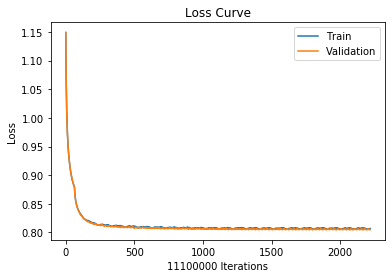

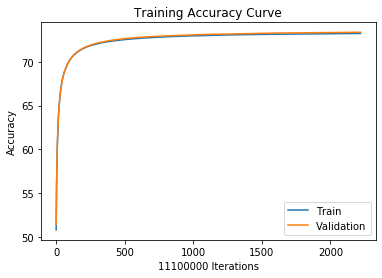

 60%|█████▉    | 293612/491198 [31:41<11:05, 296.71it/s]

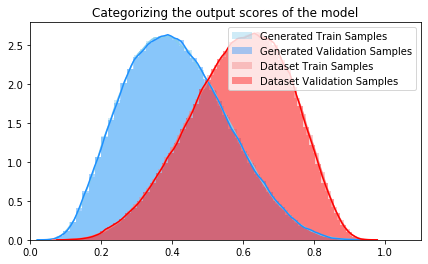

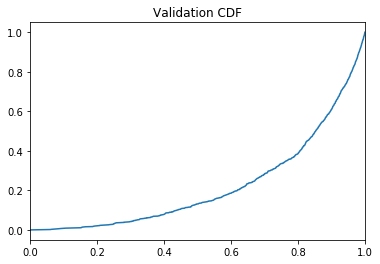

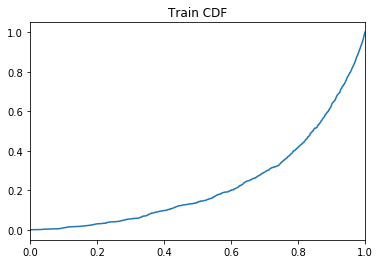

 60%|█████▉    | 293676/491198 [34:07<56:53:41,  1.04s/it]

Training Accuracy at epoch 22: 73.24448648648648
Validation Accuracy epoch 22: 73.3832072072072
Training AUC at epoch 22: 0.23248354545454547
Validation AUC epoch 22: 0.22071327272727273
Train: Sensitivity: 0.7331215031360353 Specificity: 0.7317674483171408
Val: Sensitivity: 0.7348074359549434 Specificity: 0.732861007166514


 65%|██████▌   | 320128/491198 [35:48<11:44, 242.97it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 11%|█         | 52438/491198 [06:03<27:47, 263.05it/s]

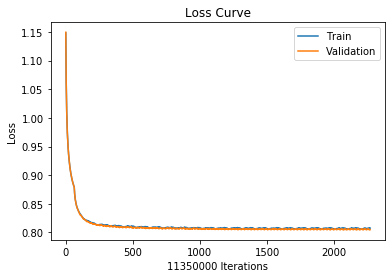

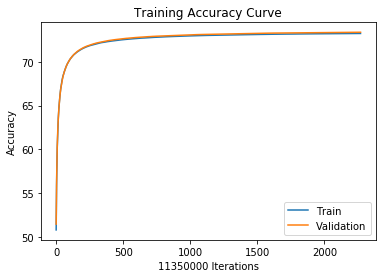

 11%|█         | 52438/491198 [06:20<27:47, 263.05it/s]

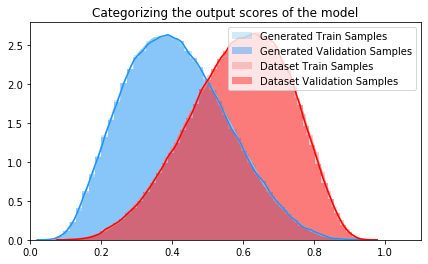

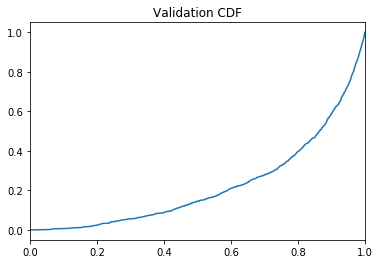

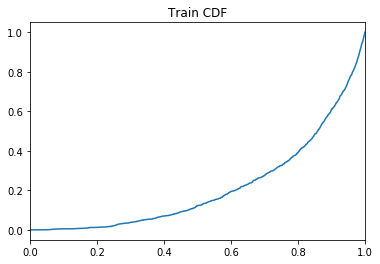

 11%|█         | 52462/491198 [08:42<510:11:01,  4.19s/it]

Training Accuracy at epoch 23: 73.24920704845815
Validation Accuracy epoch 23: 73.38864317180617
Training AUC at epoch 23: 0.21484545454545456
Validation AUC epoch 23: 0.22242145454545453
Train: Sensitivity: 0.7331560208745442 Specificity: 0.7318273915140778
Val: Sensitivity: 0.7348622101788591 Specificity: 0.7329149420509788


 21%|██        | 102427/491198 [11:54<24:19, 266.30it/s]  

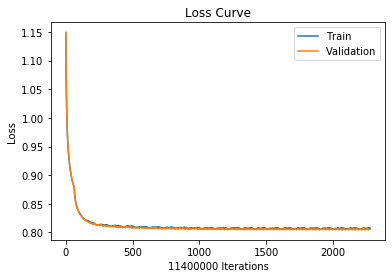

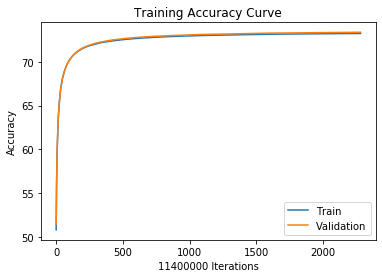

 21%|██        | 102427/491198 [12:10<24:19, 266.30it/s]

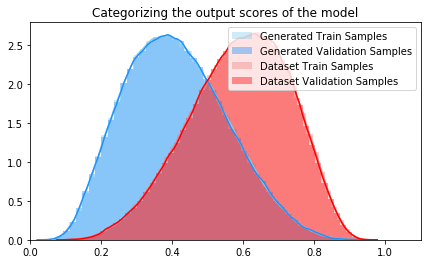

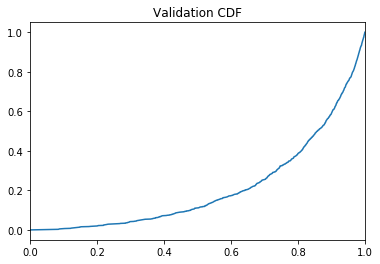

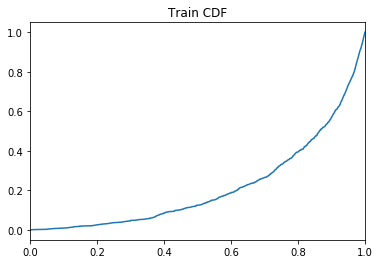

 21%|██        | 102477/491198 [14:34<190:54:25,  1.77s/it]

Training Accuracy at epoch 23: 73.25013157894738
Validation Accuracy epoch 23: 73.38914912280701
Training AUC at epoch 23: 0.215123
Validation AUC epoch 23: 0.2112431818181818
Train: Sensitivity: 0.7331687578761175 Specificity: 0.7318331334857335
Val: Sensitivity: 0.7348802403632456 Specificity: 0.7329071065264762


 82%|████████▏ | 402414/491198 [47:42<06:59, 211.43it/s]   

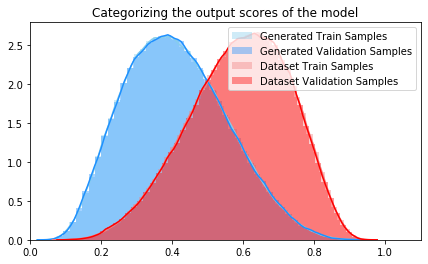

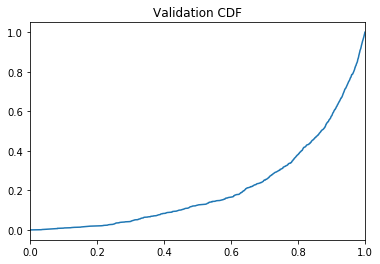

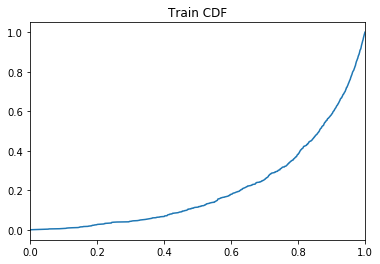

 82%|████████▏ | 402478/491198 [50:12<26:25:47,  1.07s/it]

Training Accuracy at epoch 23: 73.2561623931624
Validation Accuracy epoch 23: 73.3961452991453
Training AUC at epoch 23: 0.21168145454545456
Validation AUC epoch 23: 0.21042654545454548
Train: Sensitivity: 0.7332417834929419 Specificity: 0.7318807016991743
Val: Sensitivity: 0.7349423473753729 Specificity: 0.7329848700767625


 92%|█████████▏| 452413/491198 [53:33<02:47, 232.16it/s]  

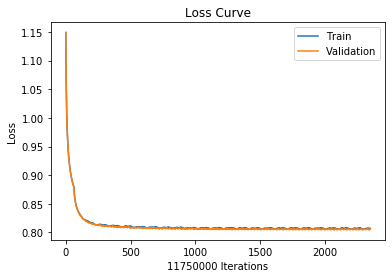

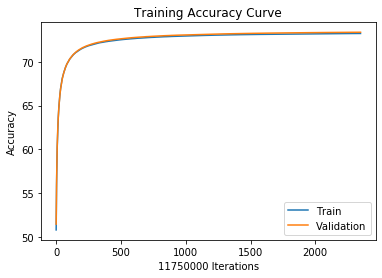

 92%|█████████▏| 452413/491198 [53:52<02:47, 232.16it/s]

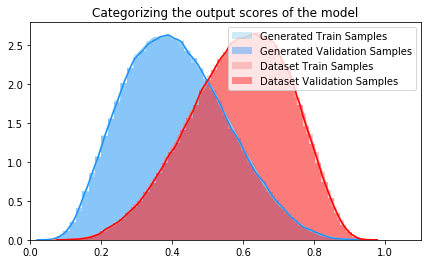

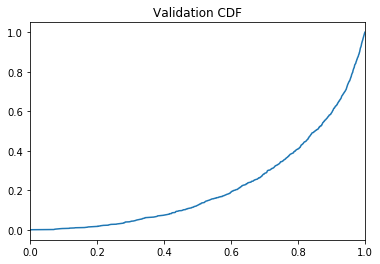

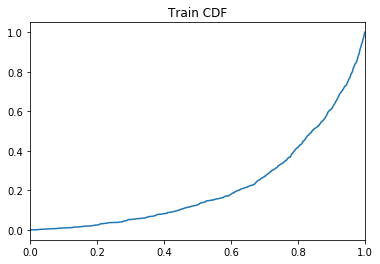

 92%|█████████▏| 452462/491198 [56:16<11:11:18,  1.04s/it]

Training Accuracy at epoch 23: 73.25690212765957
Validation Accuracy epoch 23: 73.39614468085107
Training AUC at epoch 23: 0.22282554545454544
Validation AUC epoch 23: 0.2200171818181818
Train: Sensitivity: 0.7332356040395077 Specificity: 0.7319017251438983
Val: Sensitivity: 0.7349296613183737 Specificity: 0.7329975093431477


  0%|          | 39/491198 [00:00<21:30, 380.54it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 24  with learning rate:  [0.000567]


  2%|▏         | 11211/491198 [00:44<34:27, 232.18it/s]

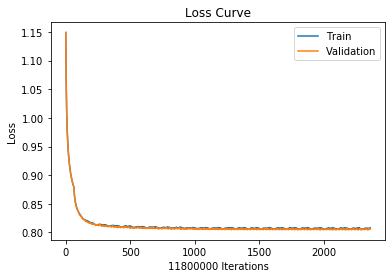

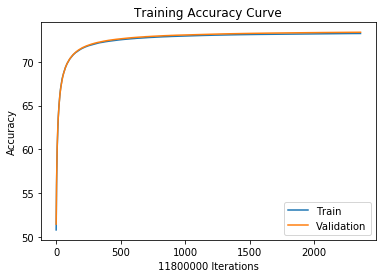

  2%|▏         | 11211/491198 [01:00<34:27, 232.18it/s]

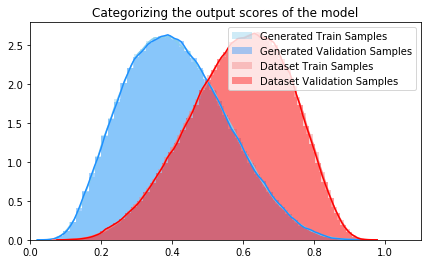

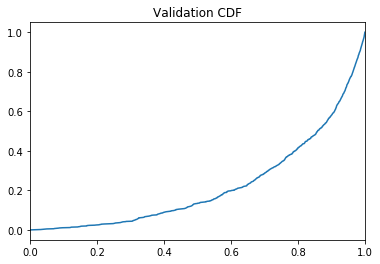

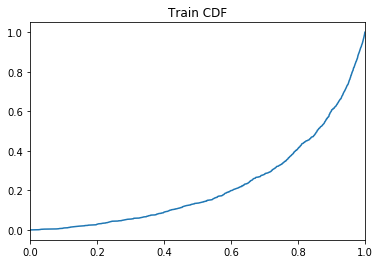

  2%|▏         | 11284/491198 [03:27<123:33:02,  1.08it/s]

Training Accuracy at epoch 24: 73.2573559322034
Validation Accuracy epoch 24: 73.3981779661017
Training AUC at epoch 24: 0.2243900909090909
Validation AUC epoch 24: 0.2221459090909091
Train: Sensitivity: 0.7332520226043826 Specificity: 0.7318943412609044
Val: Sensitivity: 0.7349661006094976 Specificity: 0.7330017938377016


  3%|▎         | 14472/491198 [03:40<36:26, 218.02it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



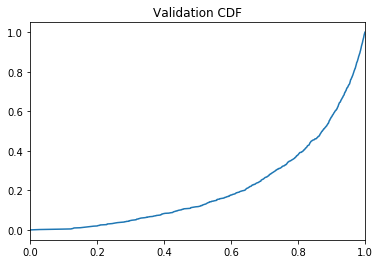

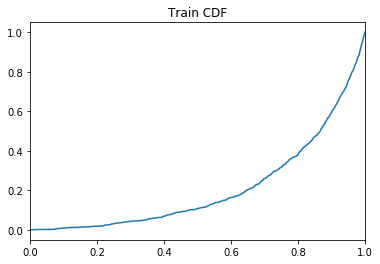

 43%|████▎     | 211280/491198 [27:56<129:30:16,  1.67s/it]

Training Accuracy at epoch 24: 73.26271666666666
Validation Accuracy epoch 24: 73.40091666666666
Training AUC at epoch 24: 0.20935499999999999
Validation AUC epoch 24: 0.21015945454545457
Train: Sensitivity: 0.7333130780906235 Specificity: 0.7319404810980059
Val: Sensitivity: 0.7350025907280998 Specificity: 0.7330201258351119


 53%|█████▎    | 261238/491198 [31:26<17:55, 213.87it/s]   

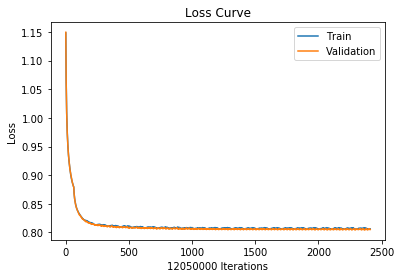

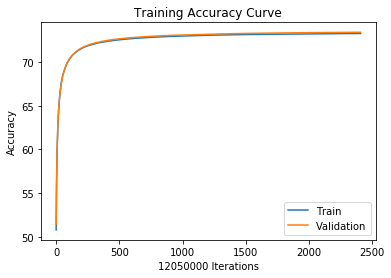

 53%|█████▎    | 261238/491198 [31:41<17:55, 213.87it/s]

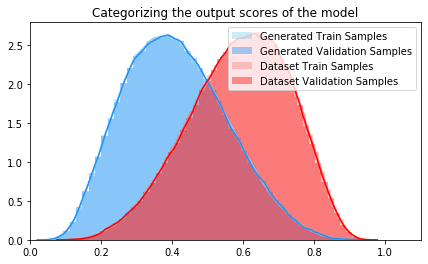

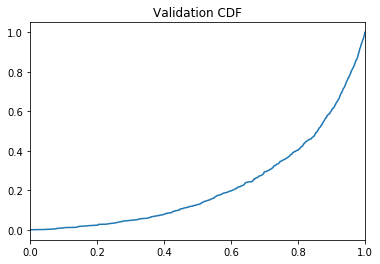

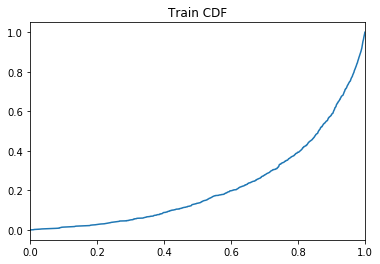

 53%|█████▎    | 261281/491198 [34:10<220:35:50,  3.45s/it]

Training Accuracy at epoch 24: 73.26358506224067
Validation Accuracy epoch 24: 73.4029377593361
Training AUC at epoch 24: 0.22072036363636363
Validation AUC epoch 24: 0.224302
Train: Sensitivity: 0.733325382118625 Specificity: 0.7319455338150127
Val: Sensitivity: 0.7350161868929915 Specificity: 0.7330469304011397


 63%|██████▎   | 311222/491198 [37:33<13:06, 228.74it/s]   

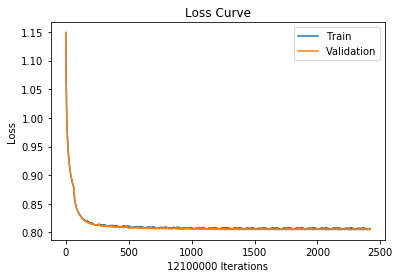

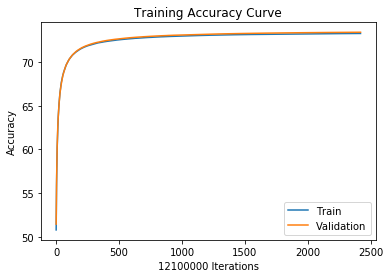

 63%|██████▎   | 311222/491198 [37:51<13:06, 228.74it/s]

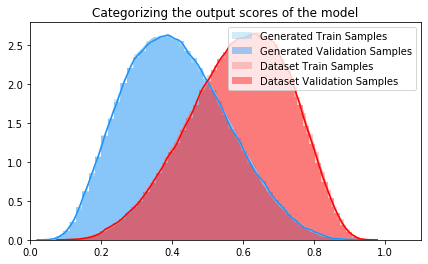

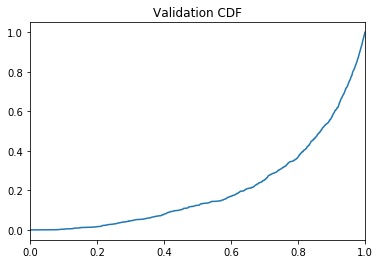

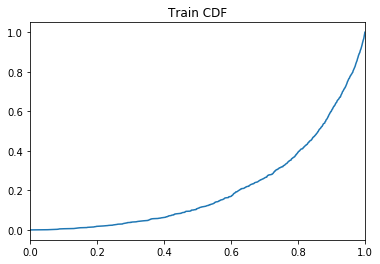

 63%|██████▎   | 311278/491198 [40:27<70:35:33,  1.41s/it] 

Training Accuracy at epoch 24: 73.2632479338843
Validation Accuracy epoch 24: 73.40319008264463
Training AUC at epoch 24: 0.210279
Validation AUC epoch 24: 0.20892581818181818
Train: Sensitivity: 0.7333256132318354 Specificity: 0.7319385519550936
Val: Sensitivity: 0.7350212055261259 Specificity: 0.7330469577459121


 74%|███████▎  | 361226/491198 [43:52<09:26, 229.28it/s]  

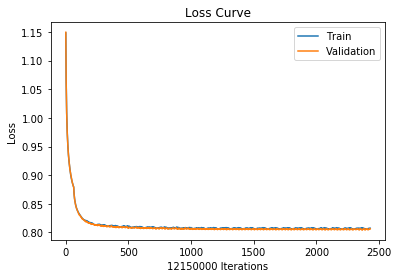

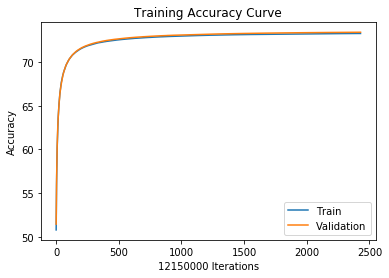

 74%|███████▎  | 361226/491198 [44:11<09:26, 229.28it/s]

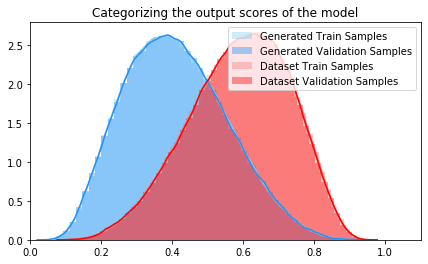

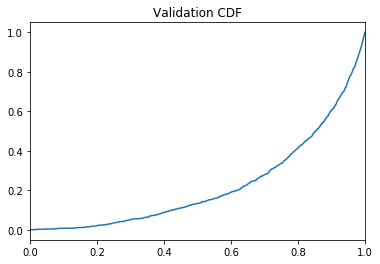

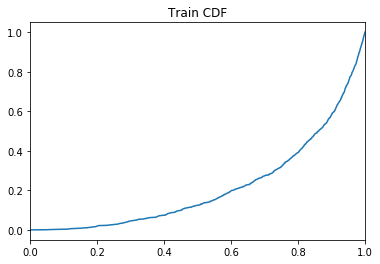

 74%|███████▎  | 361264/491198 [46:39<57:47:07,  1.60s/it]

Training Accuracy at epoch 24: 73.26410699588477
Validation Accuracy epoch 24: 73.40487242798353
Training AUC at epoch 24: 0.21558127272727273
Validation AUC epoch 24: 0.22316572727272727
Train: Sensitivity: 0.7333386745563221 Specificity: 0.7319426592343364
Val: Sensitivity: 0.735042843615031 Specificity: 0.7330589873891749


 84%|████████▎ | 411223/491198 [50:00<05:10, 257.76it/s]  

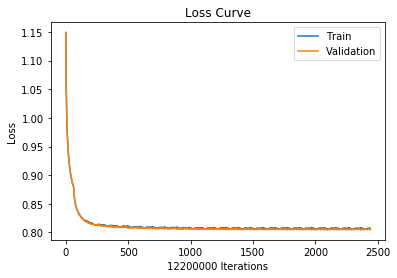

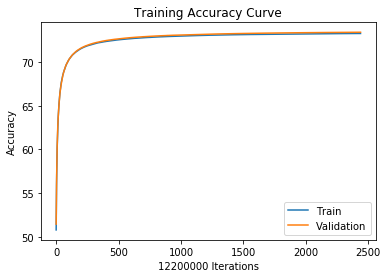

 84%|████████▎ | 411223/491198 [50:12<05:10, 257.76it/s]

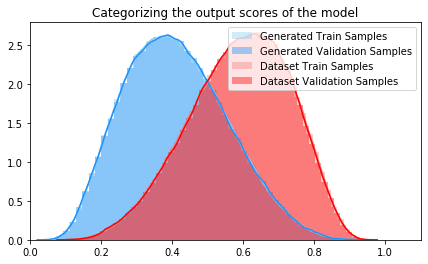

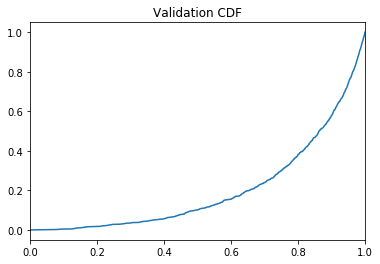

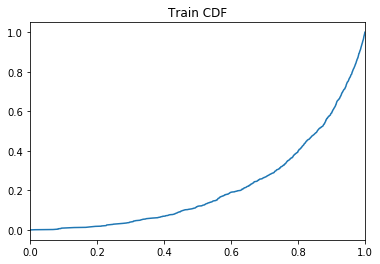

 84%|████████▎ | 411281/491198 [52:47<31:11:42,  1.41s/it]

Training Accuracy at epoch 24: 73.26534426229509
Validation Accuracy epoch 24: 73.40617213114754
Training AUC at epoch 24: 0.21454063636363635
Validation AUC epoch 24: 0.2018350909090909
Train: Sensitivity: 0.7333430982847273 Specificity: 0.7319630039273103
Val: Sensitivity: 0.7350546556585895 Specificity: 0.7330731524433302


 94%|█████████▍| 461240/491198 [56:12<02:07, 234.52it/s]  

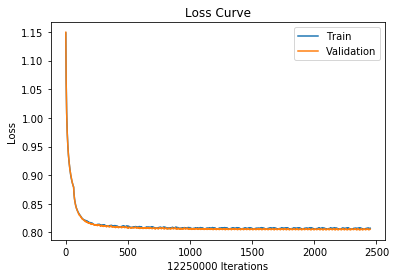

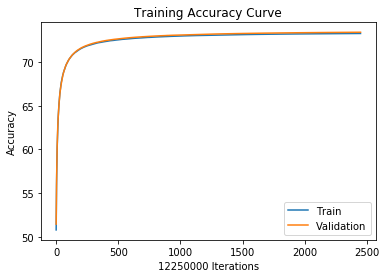

 94%|█████████▍| 461240/491198 [56:32<02:07, 234.52it/s]

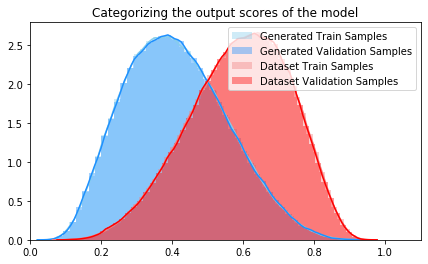

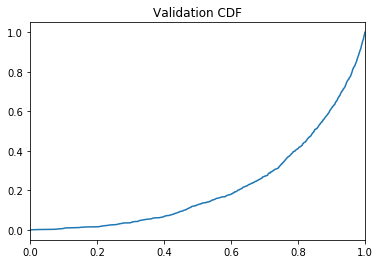

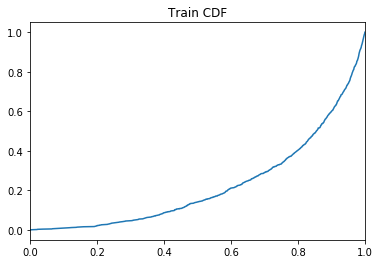

 94%|█████████▍| 461283/491198 [59:01<36:55:01,  4.44s/it]

Training Accuracy at epoch 24: 73.26569795918367
Validation Accuracy epoch 24: 73.40634285714286
Training AUC at epoch 24: 0.22467645454545454
Validation AUC epoch 24: 0.21840727272727273
Train: Sensitivity: 0.7333337358380221 Specificity: 0.7319794952616975
Val: Sensitivity: 0.7350410260555459 Specificity: 0.733090136739845


  0%|          | 39/491198 [00:00<21:02, 389.09it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 25  with learning rate:  [0.000567]


  4%|▍         | 20028/491198 [01:21<33:08, 236.96it/s]

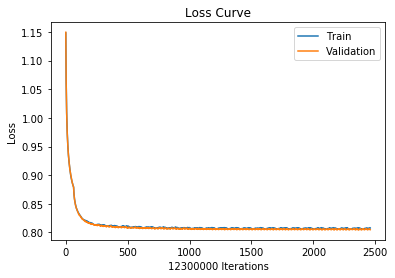

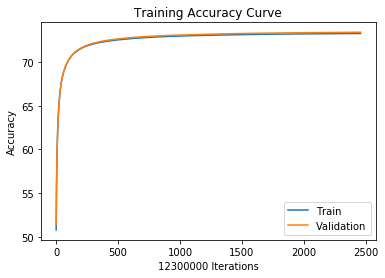

  4%|▍         | 20028/491198 [01:40<33:08, 236.96it/s]

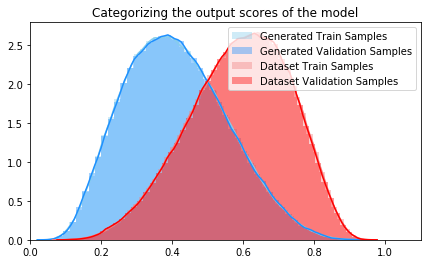

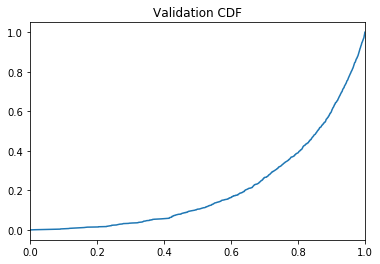

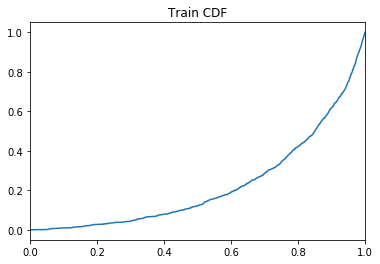

  4%|▍         | 20079/491198 [04:17<220:16:19,  1.68s/it]

Training Accuracy at epoch 25: 73.26634959349593
Validation Accuracy epoch 25: 73.40828455284553
Training AUC at epoch 25: 0.22409263636363635
Validation AUC epoch 25: 0.2094018181818182
Train: Sensitivity: 0.7333461501646172 Specificity: 0.7319800938172166
Val: Sensitivity: 0.7350661109254258 Specificity: 0.7331039100547394


 14%|█▍        | 70014/491198 [07:36<29:27, 238.27it/s]   

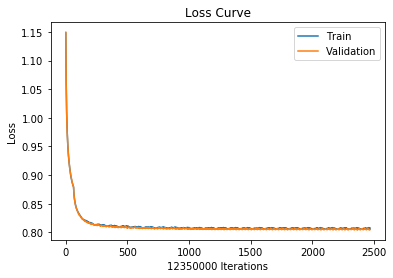

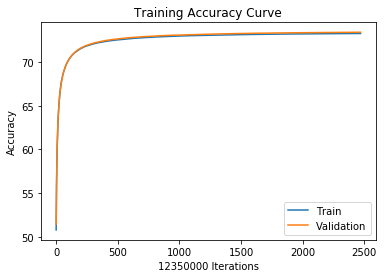

 14%|█▍        | 70014/491198 [07:50<29:27, 238.27it/s]

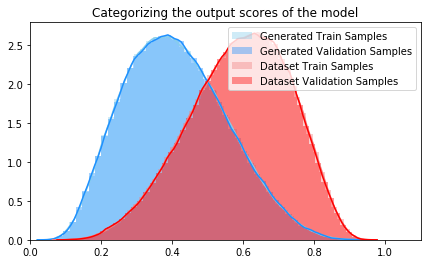

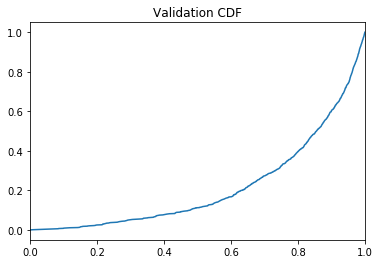

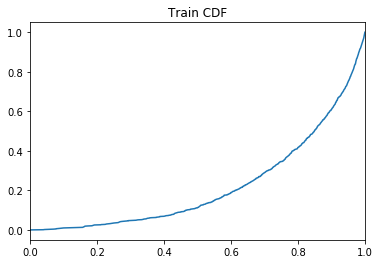

 14%|█▍        | 70066/491198 [10:33<121:28:03,  1.04s/it]

Training Accuracy at epoch 25: 73.2674089068826
Validation Accuracy epoch 25: 73.4083967611336
Training AUC at epoch 25: 0.2214279090909091
Validation AUC epoch 25: 0.21534527272727272
Train: Sensitivity: 0.7333531768961365 Specificity: 0.7319942693019754
Val: Sensitivity: 0.7350757684328033 Specificity: 0.7330965454401203


 24%|██▍       | 120029/491198 [13:47<21:17, 290.49it/s]  

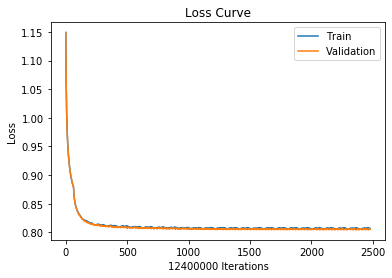

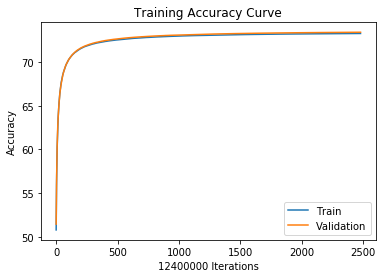

 24%|██▍       | 120029/491198 [14:00<21:17, 290.49it/s]

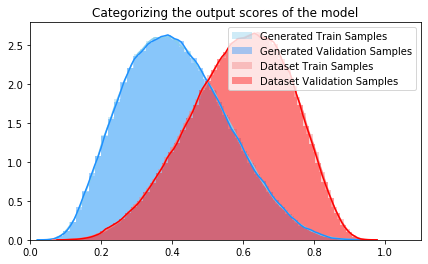

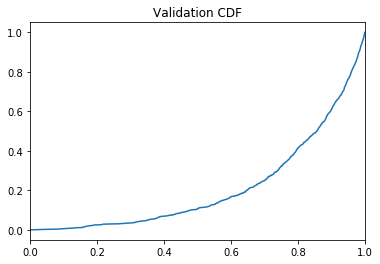

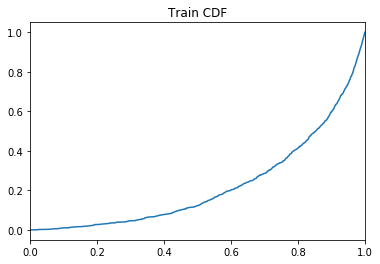

 24%|██▍       | 120081/491198 [16:36<173:56:08,  1.69s/it]

Training Accuracy at epoch 25: 73.2688064516129
Validation Accuracy epoch 25: 73.40970967741936
Training AUC at epoch 25: 0.22312627272727273
Validation AUC epoch 25: 0.212084
Train: Sensitivity: 0.733377663968946 Specificity: 0.7319977116538626
Val: Sensitivity: 0.7350965362059266 Specificity: 0.7331020709011671


 35%|███▍      | 170019/491198 [19:32<14:49, 360.91it/s]   

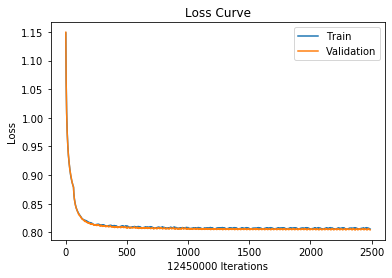

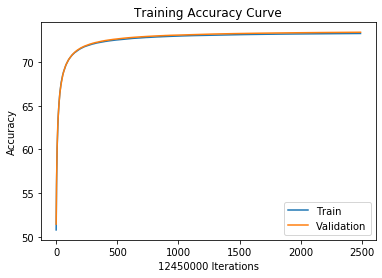

 35%|███▍      | 170019/491198 [19:50<14:49, 360.91it/s]

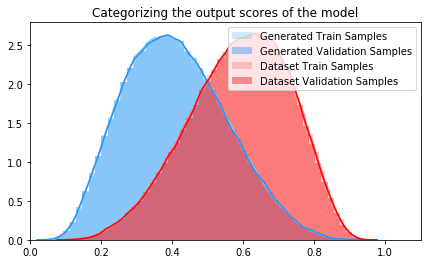

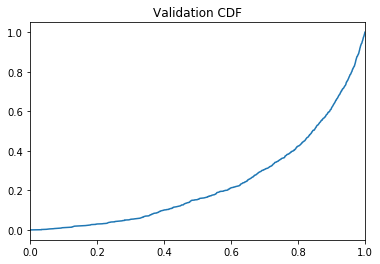

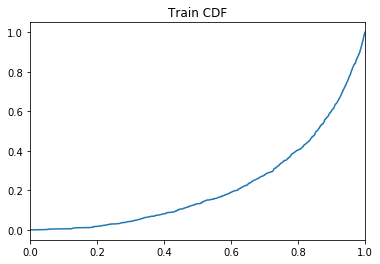

 35%|███▍      | 170077/491198 [22:27<105:47:00,  1.19s/it]

Training Accuracy at epoch 25: 73.27022489959839
Validation Accuracy epoch 25: 73.41081927710843
Training AUC at epoch 25: 0.2203590909090909
Validation AUC epoch 25: 0.23514272727272728
Train: Sensitivity: 0.7333966883287447 Specificity: 0.7320070515577655
Val: Sensitivity: 0.7351078194563649 Specificity: 0.7331129682177658


 45%|████▍     | 220035/491198 [26:17<22:25, 201.53it/s]   

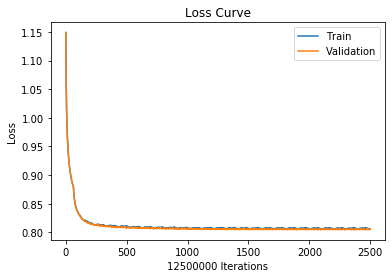

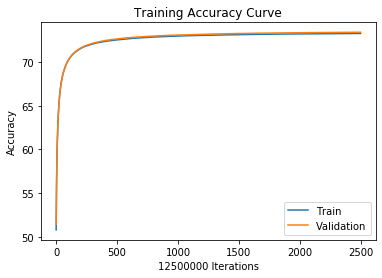

 45%|████▍     | 220035/491198 [26:30<22:25, 201.53it/s]

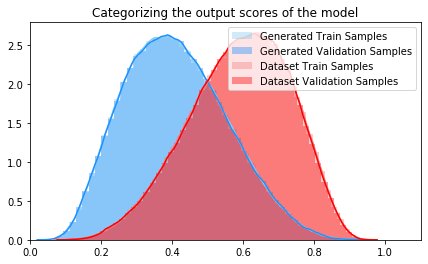

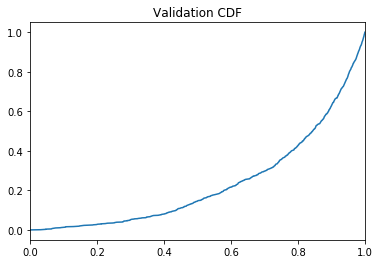

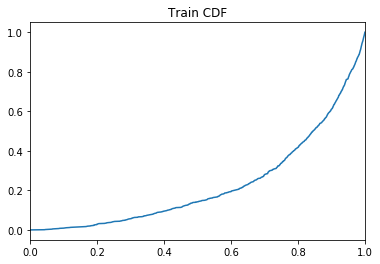

 45%|████▍     | 220079/491198 [29:09<181:50:25,  2.41s/it]

Training Accuracy at epoch 25: 73.271336
Validation Accuracy epoch 25: 73.410784
Training AUC at epoch 25: 0.22827309090909093
Validation AUC epoch 25: 0.23408772727272728
Train: Sensitivity: 0.7334103250940316 Specificity: 0.7320156176634115
Val: Sensitivity: 0.7351071971998409 Specificity: 0.7331128808261717


 55%|█████▍    | 270042/491198 [32:59<15:57, 230.98it/s]   

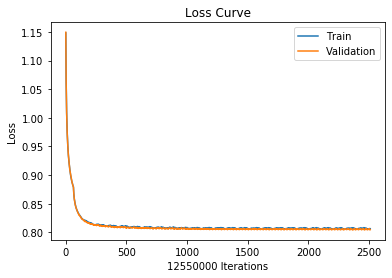

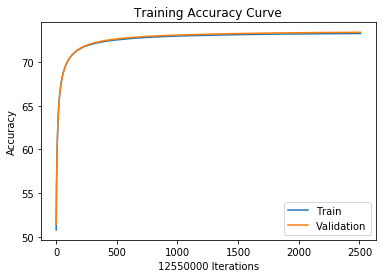

 55%|█████▍    | 270042/491198 [33:10<15:57, 230.98it/s]

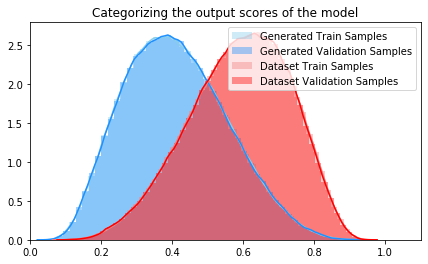

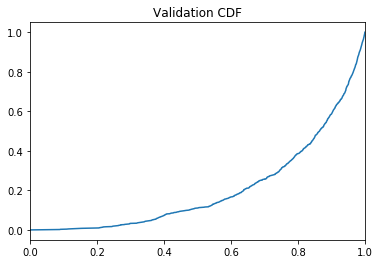

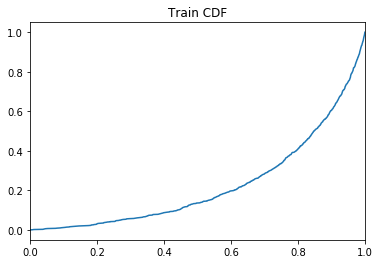

 55%|█████▍    | 270066/491198 [35:50<275:29:50,  4.49s/it]

Training Accuracy at epoch 25: 73.27172111553784
Validation Accuracy epoch 25: 73.41253386454183
Training AUC at epoch 25: 0.2263467272727273
Validation AUC epoch 25: 0.20595599999999997
Train: Sensitivity: 0.7334184902538063 Specificity: 0.7320151258212886
Val: Sensitivity: 0.7351198932472156 Specificity: 0.7331351504777139


 65%|██████▌   | 320030/491198 [39:16<10:34, 269.66it/s]   

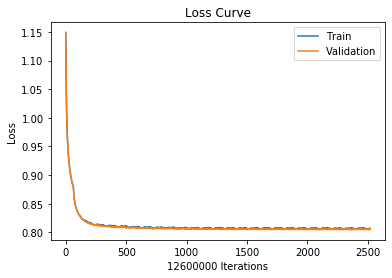

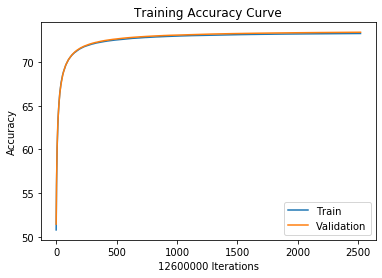

 65%|██████▌   | 320030/491198 [39:30<10:34, 269.66it/s]

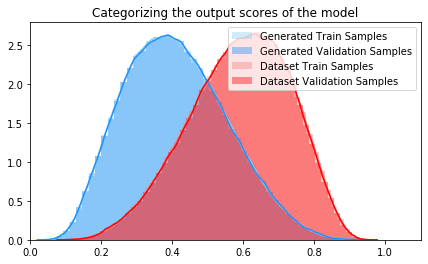

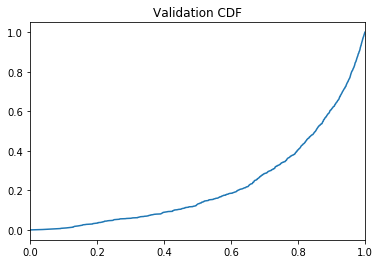

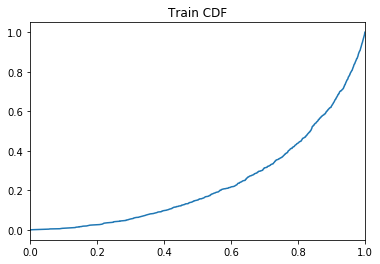

 65%|██████▌   | 320082/491198 [42:08<85:50:51,  1.81s/it] 

Training Accuracy at epoch 25: 73.27089682539683
Validation Accuracy epoch 25: 73.41268253968254
Training AUC at epoch 25: 0.23927227272727272
Validation AUC epoch 25: 0.22510581818181818
Train: Sensitivity: 0.7334114260767153 Specificity: 0.7320057035911406
Val: Sensitivity: 0.7351242391601247 Specificity: 0.7331338407439065


 75%|███████▌  | 370024/491198 [45:20<07:34, 266.48it/s]  

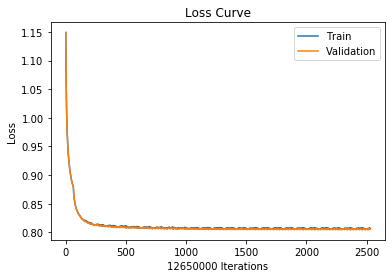

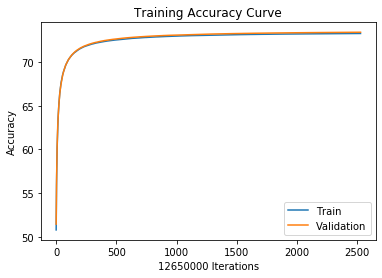

 75%|███████▌  | 370024/491198 [45:30<07:34, 266.48it/s]

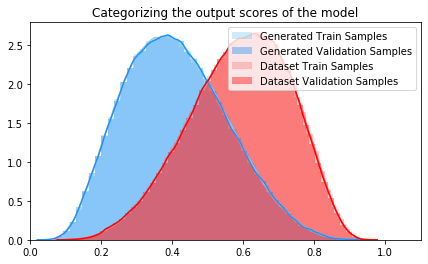

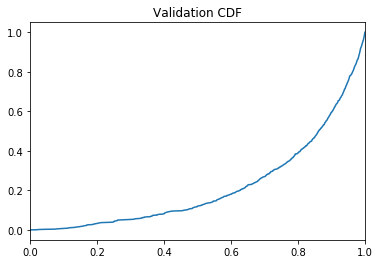

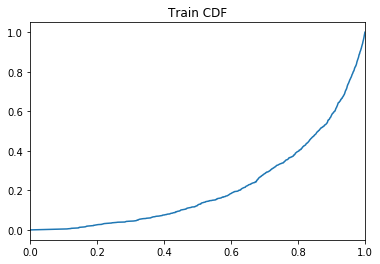

 75%|███████▌  | 370083/491198 [48:12<46:54:01,  1.39s/it]

Training Accuracy at epoch 25: 73.27282213438735
Validation Accuracy epoch 25: 73.41422924901185
Training AUC at epoch 25: 0.21607454545454546
Validation AUC epoch 25: 0.21709127272727274
Train: Sensitivity: 0.7334351456237043 Specificity: 0.7320204829340522
Val: Sensitivity: 0.735143121170981 Specificity: 0.7331458795289593


 86%|████████▌ | 420018/491198 [51:24<05:06, 232.22it/s]  

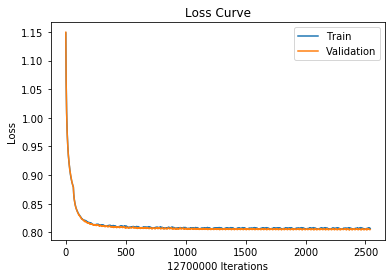

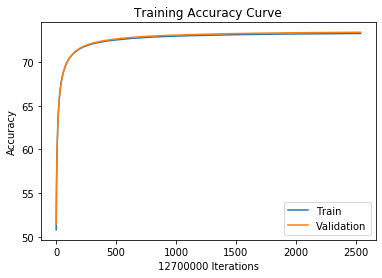

 86%|████████▌ | 420018/491198 [51:40<05:06, 232.22it/s]

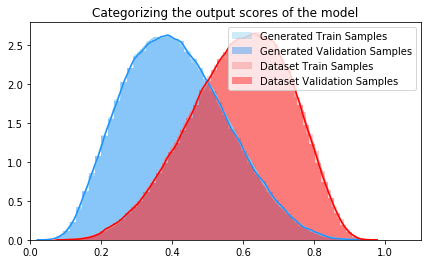

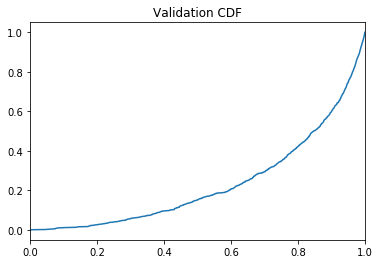

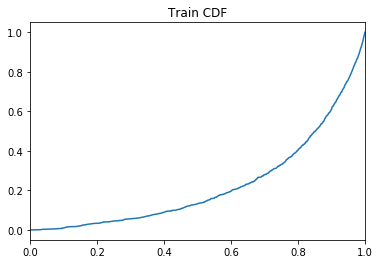

 86%|████████▌ | 420082/491198 [54:17<22:24:49,  1.13s/it]

Training Accuracy at epoch 25: 73.27355905511811
Validation Accuracy epoch 25: 73.41464566929133
Training AUC at epoch 25: 0.22588518181818182
Validation AUC epoch 25: 0.23070545454545455
Train: Sensitivity: 0.7334362574851901 Specificity: 0.7320341406397967
Val: Sensitivity: 0.7351436518743967 Specificity: 0.7331536451671499


 96%|█████████▌| 470037/491198 [57:37<01:24, 251.67it/s]  

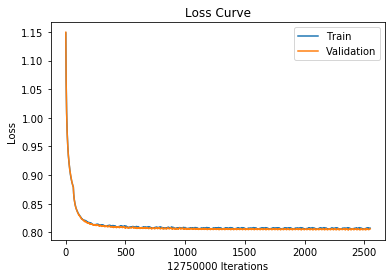

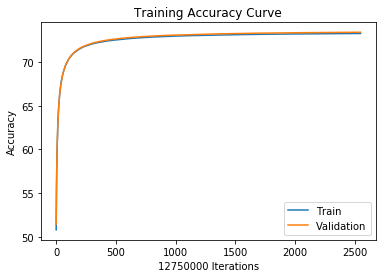

 96%|█████████▌| 470037/491198 [57:50<01:24, 251.67it/s]

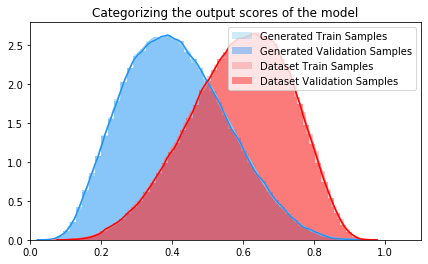

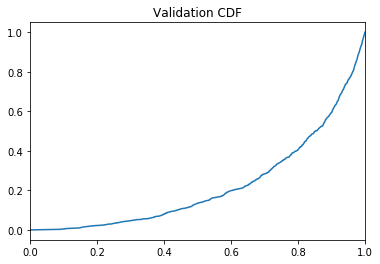

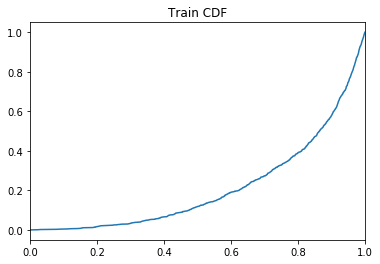

 96%|█████████▌| 470066/491198 [1:00:28<16:15:25,  2.77s/it]

Training Accuracy at epoch 25: 73.27389019607843
Validation Accuracy epoch 25: 73.41516862745098
Training AUC at epoch 25: 0.21228363636363637
Validation AUC epoch 25: 0.22198336363636365
Train: Sensitivity: 0.7334281001551628 Specificity: 0.7320489545929028
Val: Sensitivity: 0.7351414116228843 Specificity: 0.733166318832831


  0%|          | 50/491198 [00:00<16:41, 490.19it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 26  with learning rate:  [0.000567]


  6%|▌         | 28825/491198 [01:47<31:33, 244.24it/s]

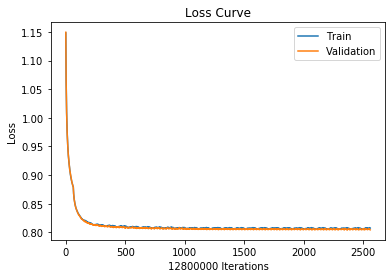

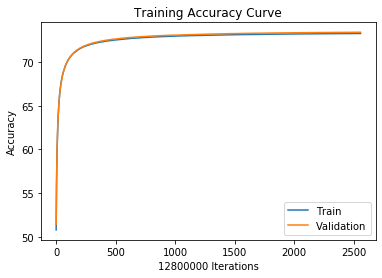

  6%|▌         | 28825/491198 [02:00<31:33, 244.24it/s]

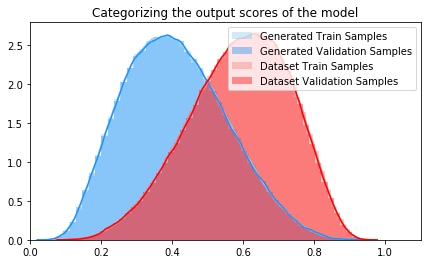

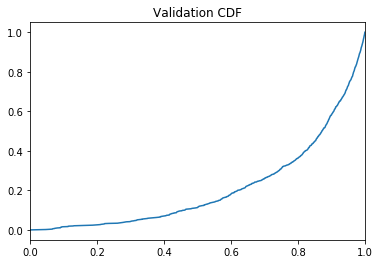

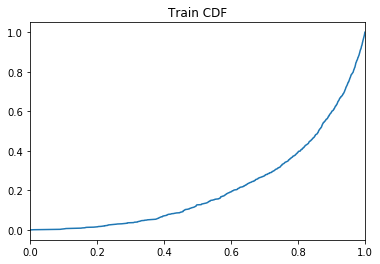

  6%|▌         | 28885/491198 [04:40<173:25:42,  1.35s/it]

Training Accuracy at epoch 26: 73.2745859375
Validation Accuracy epoch 26: 73.417203125
Training AUC at epoch 26: 0.2142510909090909
Validation AUC epoch 26: 0.20945563636363637
Train: Sensitivity: 0.7334340286903684 Specificity: 0.7320569427753529
Val: Sensitivity: 0.7351618909934134 Specificity: 0.7331865324192888


 15%|█▍        | 71565/491198 [07:40<29:51, 234.26it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 36%|███▋      | 178826/491198 [20:37<16:07, 322.93it/s]

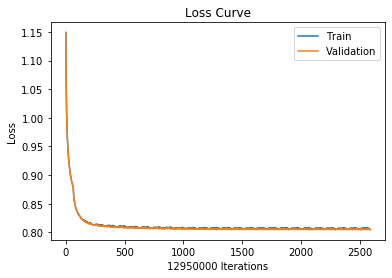

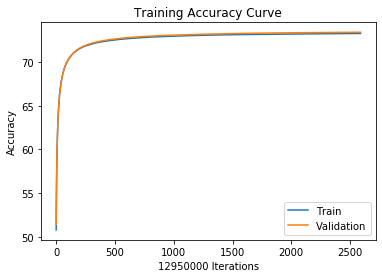

 36%|███▋      | 178826/491198 [20:50<16:07, 322.93it/s]

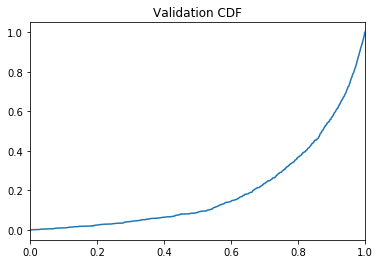

 47%|████▋     | 228838/491198 [26:58<15:58, 273.75it/s]

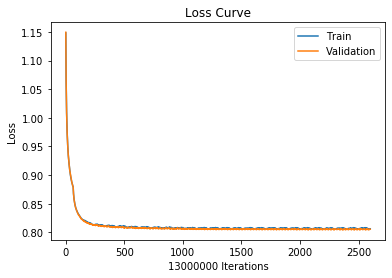

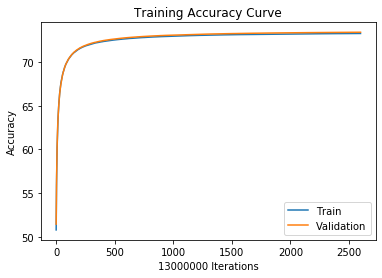

 47%|████▋     | 228838/491198 [27:10<15:58, 273.75it/s]

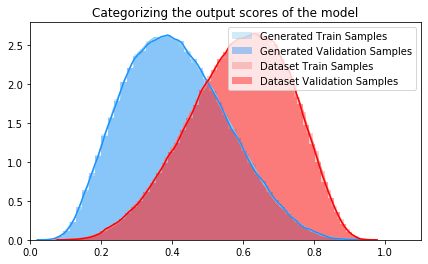

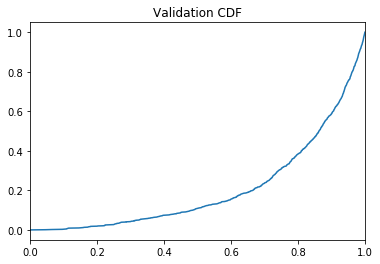

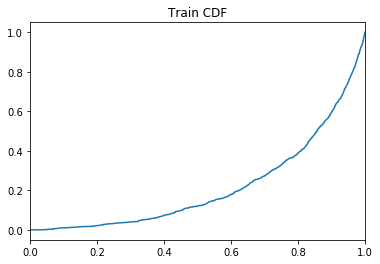

 47%|████▋     | 228885/491198 [29:53<191:29:32,  2.63s/it]

Training Accuracy at epoch 26: 73.27893076923077
Validation Accuracy epoch 26: 73.41972307692308
Training AUC at epoch 26: 0.21585963636363636
Validation AUC epoch 26: 0.20612199999999997
Train: Sensitivity: 0.7334945137265237 Specificity: 0.7320833013921433
Val: Sensitivity: 0.7352045975352637 Specificity: 0.7331943292729166


 57%|█████▋    | 278835/491198 [33:05<12:48, 276.29it/s]   

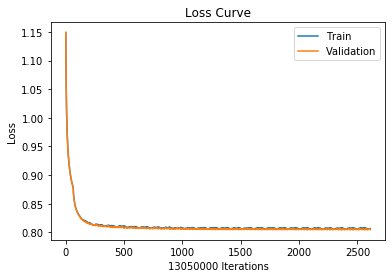

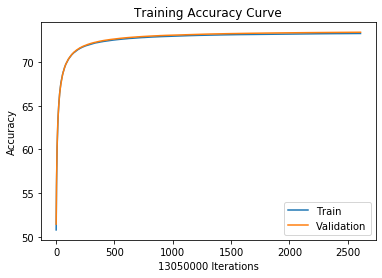

 57%|█████▋    | 278835/491198 [33:20<12:48, 276.29it/s]

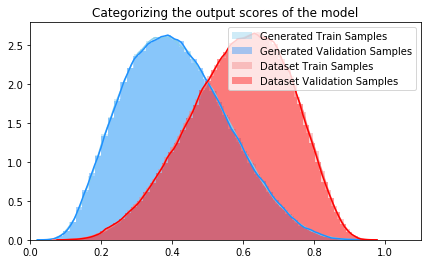

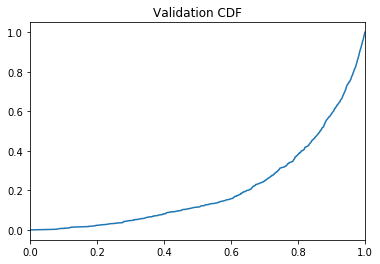

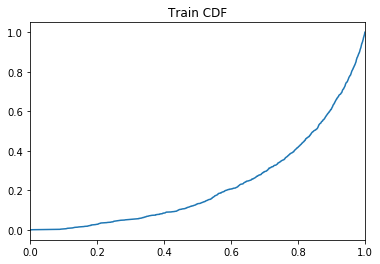

 57%|█████▋    | 278883/491198 [36:00<128:00:20,  2.17s/it]

Training Accuracy at epoch 26: 73.27901149425287
Validation Accuracy epoch 26: 73.42065900383142
Training AUC at epoch 26: 0.22862672727272726
Validation AUC epoch 26: 0.2089899090909091
Train: Sensitivity: 0.733499889488444 Specificity: 0.7320795286685678
Val: Sensitivity: 0.7352149166837669 Specificity: 0.7332026992144826


 67%|██████▋   | 328821/491198 [39:26<11:47, 229.54it/s]   

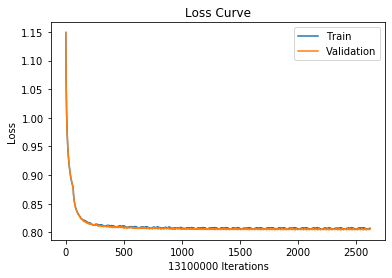

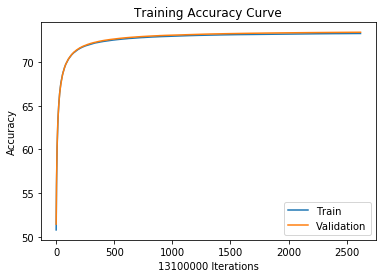

 67%|██████▋   | 328821/491198 [39:41<11:47, 229.54it/s]

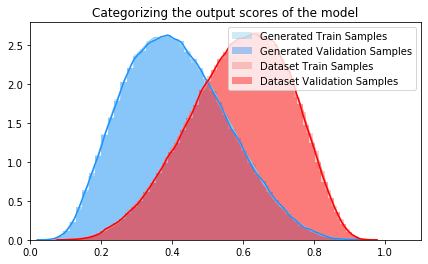

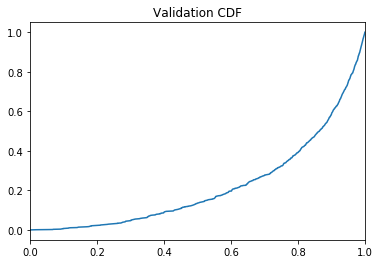

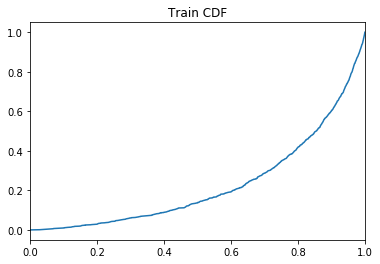

 67%|██████▋   | 328884/491198 [42:22<53:56:34,  1.20s/it]

Training Accuracy at epoch 26: 73.2788320610687
Validation Accuracy epoch 26: 73.42056488549618
Training AUC at epoch 26: 0.22757127272727273
Validation AUC epoch 26: 0.2195669090909091
Train: Sensitivity: 0.73349944764195 Specificity: 0.7320763853669565
Val: Sensitivity: 0.7352125809120911 Specificity: 0.7332031687960964


 77%|███████▋  | 378822/491198 [45:42<07:59, 234.13it/s]  

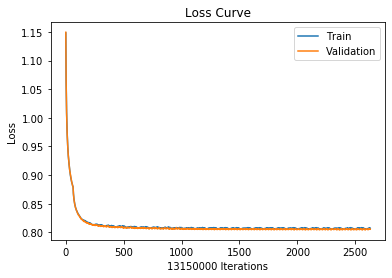

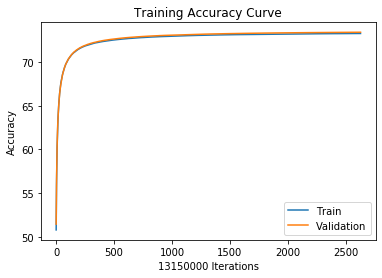

 77%|███████▋  | 378822/491198 [46:01<07:59, 234.13it/s]

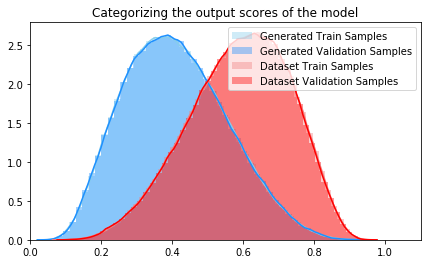

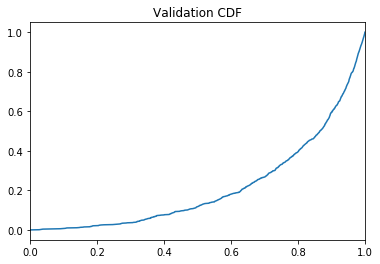

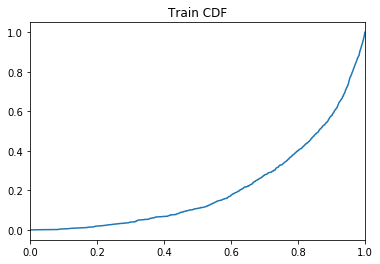

 77%|███████▋  | 378868/491198 [48:40<38:58:22,  1.25s/it]

Training Accuracy at epoch 26: 73.28006844106464
Validation Accuracy epoch 26: 73.42244866920151
Training AUC at epoch 26: 0.21141236363636365
Validation AUC epoch 26: 0.21418527272727272
Train: Sensitivity: 0.7335162058145362 Specificity: 0.7320843531116688
Val: Sensitivity: 0.7352298380151483 Specificity: 0.7332235629052843


 87%|████████▋ | 428832/491198 [52:06<03:56, 263.99it/s]  

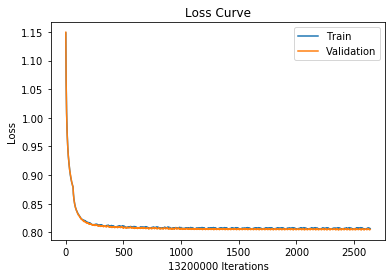

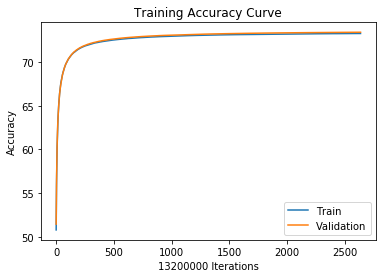

 87%|████████▋ | 428832/491198 [52:21<03:56, 263.99it/s]

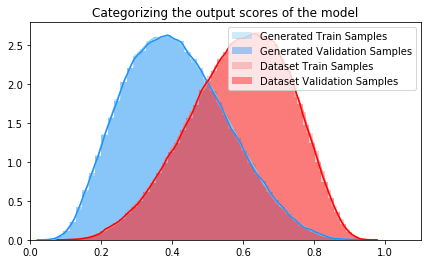

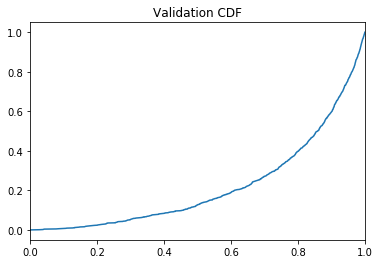

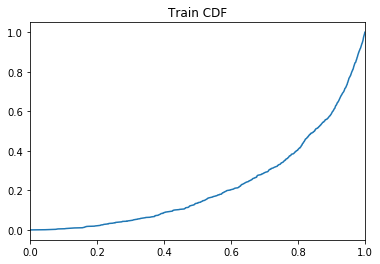

 87%|████████▋ | 428885/491198 [55:05<32:34:39,  1.88s/it]

Training Accuracy at epoch 26: 73.28102272727273
Validation Accuracy epoch 26: 73.4231590909091
Training AUC at epoch 26: 0.2246532727272727
Validation AUC epoch 26: 0.22006872727272725
Train: Sensitivity: 0.7335193003778652 Specificity: 0.7321003632176178
Val: Sensitivity: 0.7352374820532249 Specificity: 0.7332301265920383


 97%|█████████▋| 478838/491198 [58:27<00:53, 230.96it/s]  

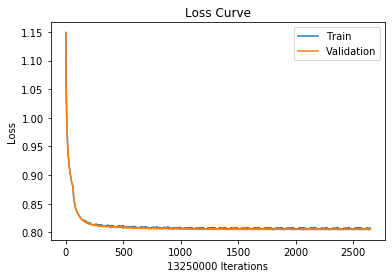

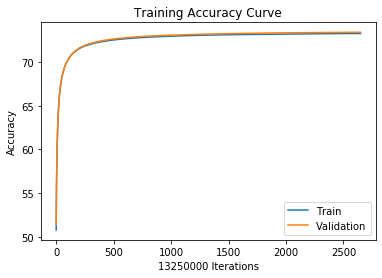

 97%|█████████▋| 478838/491198 [58:41<00:53, 230.96it/s]

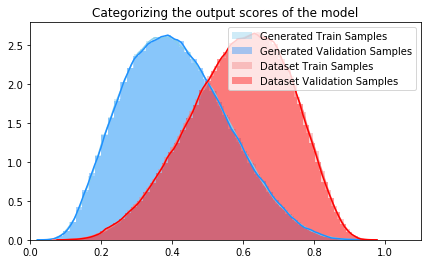

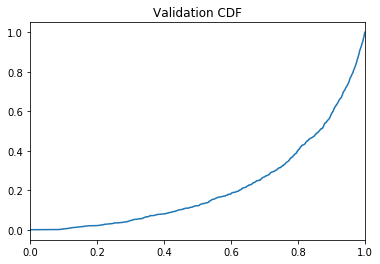

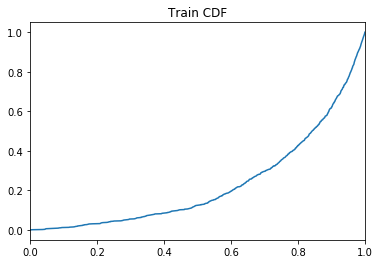

 97%|█████████▋| 478895/491198 [1:01:25<9:09:10,  2.68s/it] 

Training Accuracy at epoch 26: 73.28104150943396
Validation Accuracy epoch 26: 73.42415849056604
Training AUC at epoch 26: 0.23019672727272728
Validation AUC epoch 26: 0.2166030909090909
Train: Sensitivity: 0.7335125661072344 Specificity: 0.7321074954813017
Val: Sensitivity: 0.7352382113623124 Specificity: 0.73324936333461


  0%|          | 36/491198 [00:00<23:07, 353.98it/s]

Saving to:  model_checkpoints/binary/BlosumLinearNet/08122020.pth
Starting epoch: 27  with learning rate:  [0.000567]


  8%|▊         | 37652/491198 [02:57<34:34, 218.60it/s]

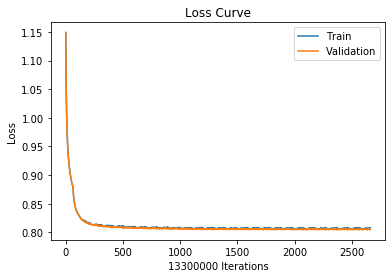

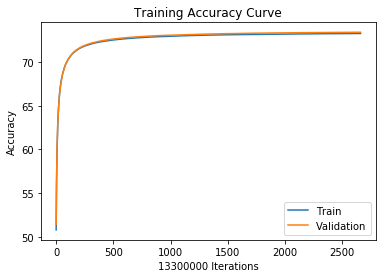

  8%|▊         | 37652/491198 [03:10<34:34, 218.60it/s]

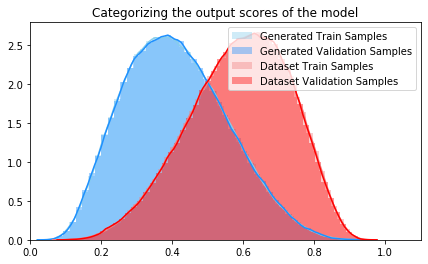

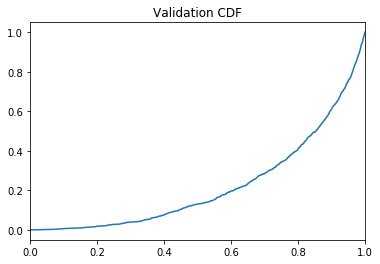

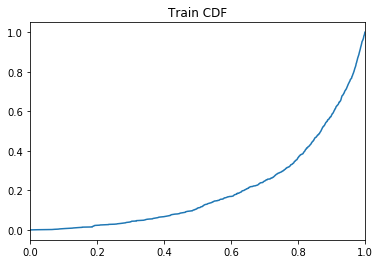

  8%|▊         | 37686/491198 [05:55<2356:48:13, 18.71s/it]

Training Accuracy at epoch 27: 73.28234586466165
Validation Accuracy epoch 27: 73.42504511278196
Training AUC at epoch 27: 0.20516436363636364
Validation AUC epoch 27: 0.22103627272727272
Train: Sensitivity: 0.733525558942173 Specificity: 0.7321205893150536
Val: Sensitivity: 0.7352583865596218 Specificity: 0.7332469472144904


 18%|█▊        | 87630/491198 [09:46<31:50, 211.21it/s]    

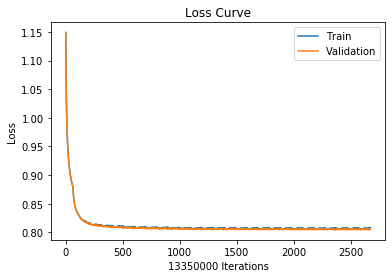

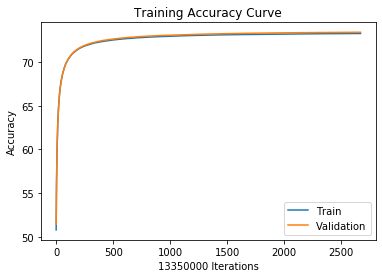

 18%|█▊        | 87630/491198 [10:00<31:50, 211.21it/s]

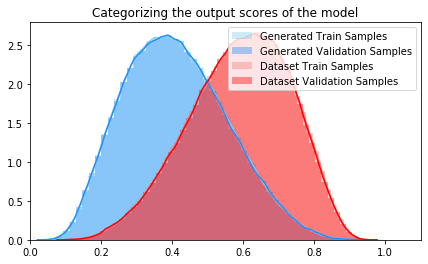

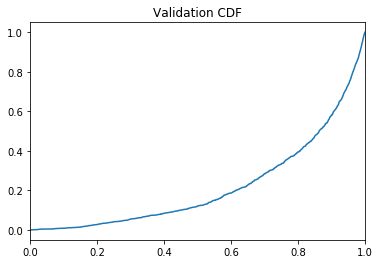

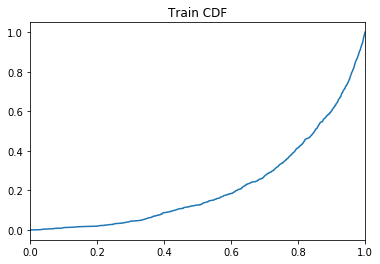

 18%|█▊        | 87670/491198 [12:47<177:17:56,  1.58s/it]

Training Accuracy at epoch 27: 73.28289887640449
Validation Accuracy epoch 27: 73.42486891385768
Training AUC at epoch 27: 0.22105590909090908
Validation AUC epoch 27: 0.21775072727272726
Train: Sensitivity: 0.7335316286821021 Specificity: 0.7321255926408361
Val: Sensitivity: 0.7352565680055098 Specificity: 0.7332452688773665


 28%|██▊       | 137641/491198 [16:29<25:49, 228.25it/s]  

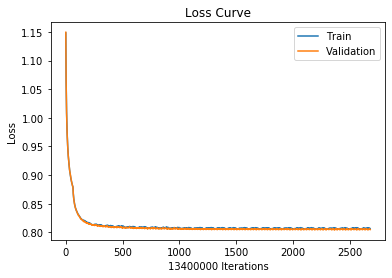

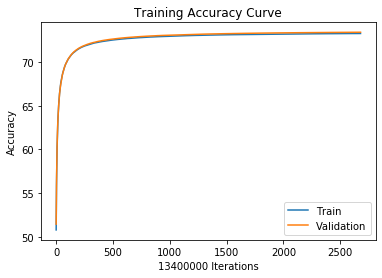

 28%|██▊       | 137641/491198 [16:40<25:49, 228.25it/s]

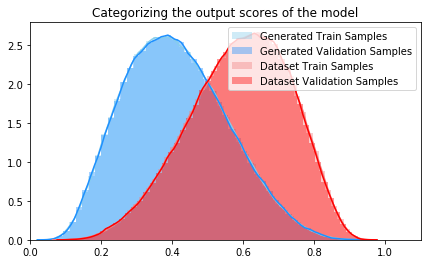

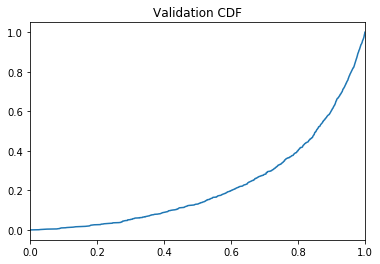

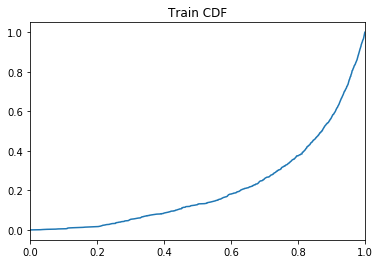

 28%|██▊       | 137683/491198 [19:27<282:56:45,  2.88s/it]

Training Accuracy at epoch 27: 73.28432835820895
Validation Accuracy epoch 27: 73.42672388059701
Training AUC at epoch 27: 0.21233963636363637
Validation AUC epoch 27: 0.22523163636363636
Train: Sensitivity: 0.7335587205971131 Specificity: 0.732127051456488
Val: Sensitivity: 0.7352787588439934 Specificity: 0.733260181631268


 38%|███▊      | 187629/491198 [22:59<21:37, 233.93it/s]   

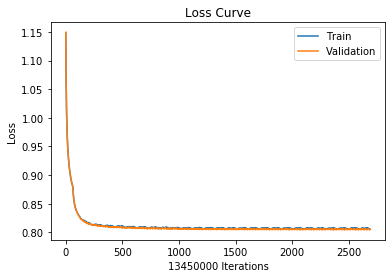

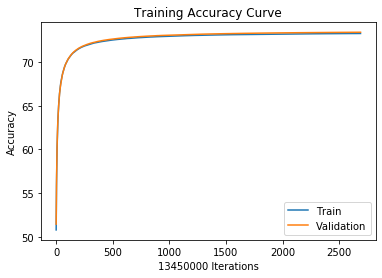

 38%|███▊      | 187629/491198 [23:11<21:37, 233.93it/s]

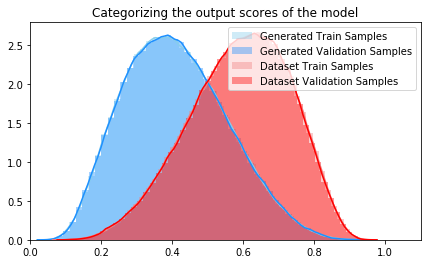

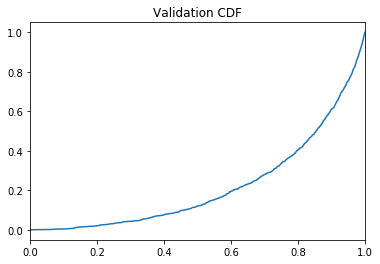

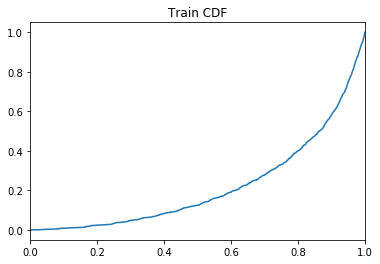

 38%|███▊      | 187682/491198 [26:01<129:07:06,  1.53s/it]

Training Accuracy at epoch 27: 73.28574721189591
Validation Accuracy epoch 27: 73.42664684014869
Training AUC at epoch 27: 0.2185089090909091
Validation AUC epoch 27: 0.219377
Train: Sensitivity: 0.7335760619762048 Specificity: 0.7321380748506522
Val: Sensitivity: 0.7352865347490204 Specificity: 0.7332508983132275


 48%|████▊     | 237649/491198 [29:28<17:54, 235.94it/s]   

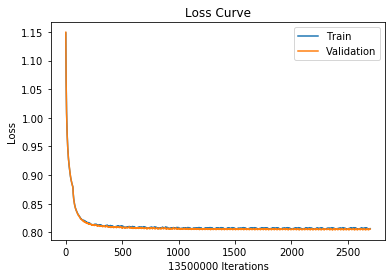

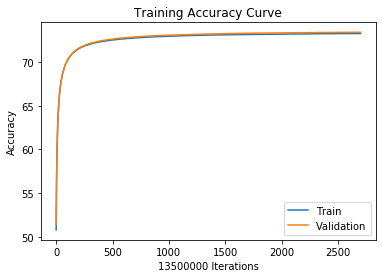

 48%|████▊     | 237649/491198 [29:41<17:54, 235.94it/s]

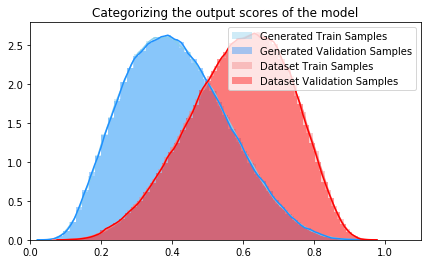

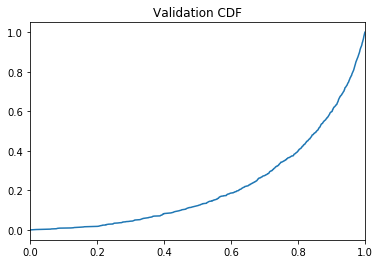

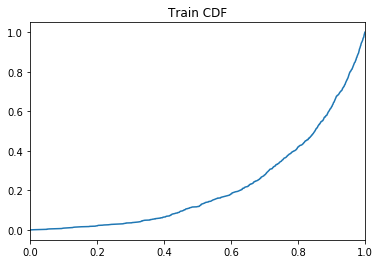

 48%|████▊     | 237686/491198 [32:30<535:49:57,  7.61s/it]

Training Accuracy at epoch 27: 73.28608148148147
Validation Accuracy epoch 27: 73.42805185185185
Training AUC at epoch 27: 0.22087772727272725
Validation AUC epoch 27: 0.2186220909090909
Train: Sensitivity: 0.7335782126867207 Specificity: 0.7321426083254597
Val: Sensitivity: 0.7352927245907067 Specificity: 0.7332727757850616


 59%|█████▊    | 287651/491198 [35:48<12:58, 261.44it/s]   

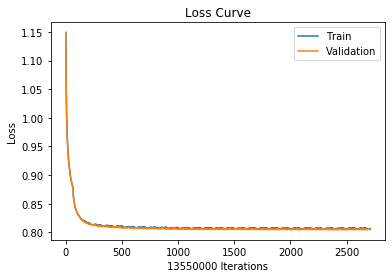

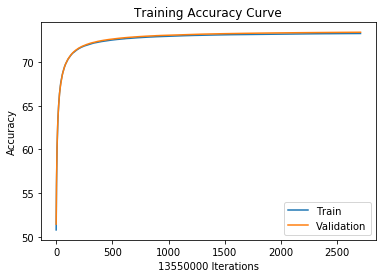

 59%|█████▊    | 287651/491198 [36:02<12:58, 261.44it/s]

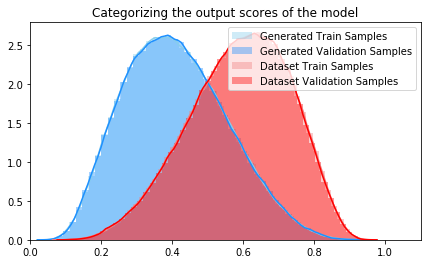

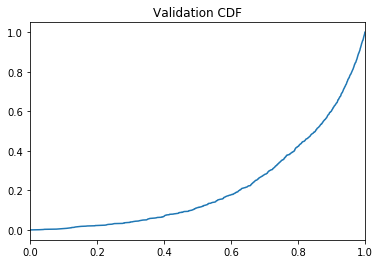

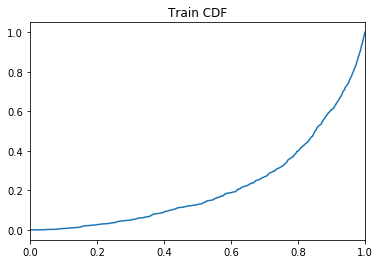

 59%|█████▊    | 287670/491198 [38:46<706:54:37, 12.50s/it] 

Training Accuracy at epoch 27: 73.28642804428044
Validation Accuracy epoch 27: 73.42880442804429
Training AUC at epoch 27: 0.22099127272727273
Validation AUC epoch 27: 0.21837181818181817
Train: Sensitivity: 0.7335895204236675 Specificity: 0.732138205018387
Val: Sensitivity: 0.7353045204513868 Specificity: 0.7332760427367232


 69%|██████▊   | 337639/491198 [41:41<07:37, 335.75it/s]   

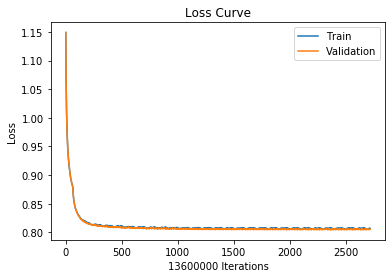

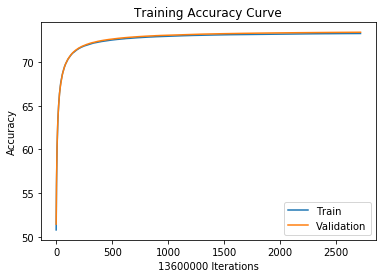

 69%|██████▊   | 337639/491198 [41:52<07:37, 335.75it/s]

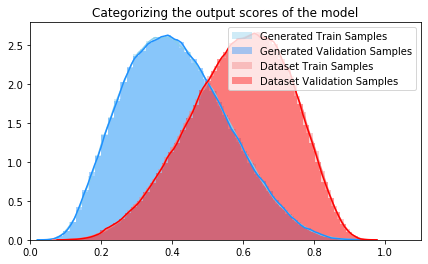

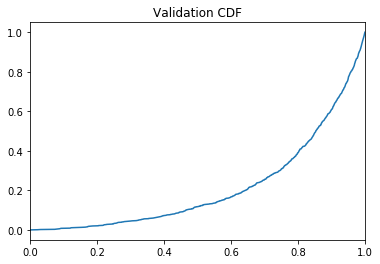

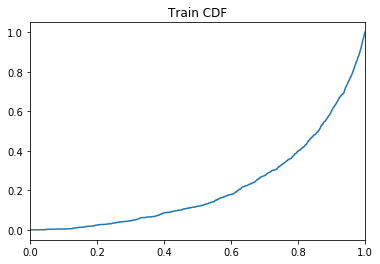

 69%|██████▊   | 337688/491198 [44:41<107:23:15,  2.52s/it]

Training Accuracy at epoch 27: 73.28630882352941
Validation Accuracy epoch 27: 73.42891176470589
Training AUC at epoch 27: 0.21736081818181818
Validation AUC epoch 27: 0.2130698181818182
Train: Sensitivity: 0.7335869916997628 Specificity: 0.7321383535081454
Val: Sensitivity: 0.7353048767187248 Specificity: 0.7332778383302314


 79%|███████▉  | 387636/491198 [47:52<06:16, 274.92it/s]   

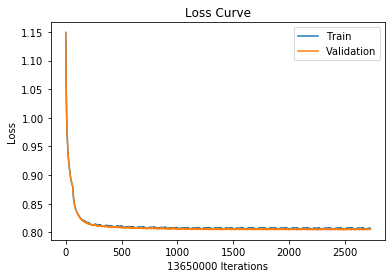

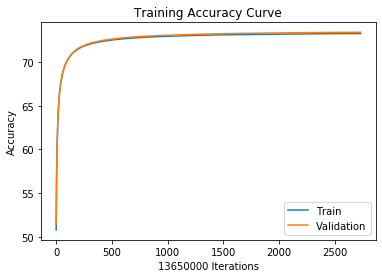

 79%|███████▉  | 387636/491198 [48:02<06:16, 274.92it/s]

In [ ]:
model = BlosumLinearNet()
model_name = model.name
model_id = "08122020"
model.to(device)
checkpoint = None
save_path = 'model_checkpoints/binary/%s/%s.pth' % (model_name, model_id)
NUM_EPOCHS = 200
BATCH_SIZE = 64
cdf=False
if cdf:
   # For the CDF functions, we need to generate a dataset of new examples
    S_new = GeneratedDataset(10*m) 
gamma = 7e-4
classifier(model, binary_train, binary_val, gamma, model_id, NUM_EPOCHS, BATCH_SIZE, model.single_alphabet, checkpoint, save_path, cdf=cdf)

## Evaluate the model

In [ ]:
def conv3x3(in_planes, out_planes, kernel_size=3, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv1d(in_planes, out_planes, kernel_size=kernel_size, stride=1,
                     padding=kernel_size//2, bias=True)

class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, kernel_size=3, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, kernel_size=kernel_size, stride=stride)
        self.bn1 = nn.BatchNorm1d(planes)
        self.relu = nn.LeakyReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes, kernel_size=kernel_size, stride=stride)
        self.bn2 = nn.BatchNorm1d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out

class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, kernel_size=3, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv1d(inplanes, planes, kernel_size=1, bias=True)
        self.bn1 = nn.BatchNorm1d(planes)
        self.conv2 = nn.Conv1d(planes, planes, kernel_size=kernel_size, stride=1,
                               padding=kernel_size//2, bias=True)
        self.bn2 = nn.BatchNorm1d(planes)
        self.conv3 = nn.Conv1d(planes, planes * 4, kernel_size=1, bias=True)
        self.bn3 = nn.BatchNorm1d(planes * 4)
        self.relu = nn.LeakyReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out

class VariableLengthPooling(nn.Module):
    def forward(self, x, **kwargs):
        bounds = kwargs.get("bounds")
        # print("--------x--------", x.size(), x)
        # print("--------bounds--------", bounds.size(), bounds)
        cnt = torch.sum(bounds, dim=1)
        # print("--------cnt--------", cnt.size(), cnt)
        # print("--------bmm--------", torch.bmm(x, bounds).size(), torch.bmm(x, bounds))
        out = torch.bmm(x, bounds) / cnt
        # print("--------out--------", out.size(), out)
        return out

class ResNet(nn.Module):

    def __init__(self, block, layers, num_classes=46):
        self.name = "Resnet"
        self.single_alphabet=True
        self.inplanes = 192
        super(ResNet, self).__init__()
        self.conv1 = nn.Conv1d(48, 192, kernel_size=3, stride=1, padding=1, bias=True)
        self.bn1 = nn.BatchNorm1d(192)
        self.relu = nn.LeakyReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer0 = self._make_layer(block, 256, layers[0])
        self.layer1 = self._make_layer(block, 256, layers[0], kernel_size=1, stride=1)
        self.layer2 = self._make_layer(block, 256, layers[1], kernel_size=5, stride=1)
        self.layer3 = self._make_layer(block, 256, layers[2], kernel_size=5, stride=1)
        self.layer4 = self._make_layer(block, 512, layers[3], kernel_size=1, stride=1)
        self.layer5 = self._make_layer(block, 512, layers[3], stride=1)
        
        self.fc1 = nn.Linear(48, 1)

        self.conv_merge = nn.Conv1d(256 * block.expansion, num_classes,
                                    kernel_size=3, stride=1, padding=1,
                                    bias=True)
        self.vlp = VariableLengthPooling()
        # self.avgpool = nn.AvgPool2d((5, 1), stride=1)
        # self.fc = nn.Linear(256 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                # n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                # m.weight.data.normal_(0, math.sqrt(2. / n))
                torch.nn.init.xavier_normal(m.weight.data)
            elif isinstance(m, nn.BatchNorm1d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, kernel_size=3, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv1d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=1, bias=False),
                nn.BatchNorm1d(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, kernel_size=kernel_size,
                            stride=stride, downsample=downsample))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes, kernel_size=kernel_size))

        return nn.Sequential(*layers)


    def forward(self, x, bounds=None):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        # x = self.maxpool(x)

        x = self.layer0(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)

        # x = self.avgpool(x)
        # x = x.view(x.size(0), -1)
        # x = self.fc(x)

        x = self.conv_merge(x)
        x = torch.squeeze(x, dim=2)
        x = x.view(1, -1)
        
        
        # I don't think I want variable length pooling
        #x = self.vlp(x, bounds=bounds)
        x = self.fc1(x)
        return torch.sigmoid(x)

class ResNetSeparated(nn.Module):

    def __init__(self, block, layers, num_classes=46):
        self.name = "ResnetSeparated"
        self.single_alphabet=False
        self.inplanes = 192
        super(ResNetSeparated, self).__init__()
        self.conv1_apt = nn.Conv1d(4, 192, kernel_size=3, stride=1, padding=1, bias=True)
        self.conv1_pep = nn.Conv1d(20, 192, kernel_size=3, stride=1, padding=1, bias=True)
        
        self.bn1 = nn.BatchNorm1d(192)
        self.relu = nn.LeakyReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer0 = self._make_layer(block, 256, layers[0])
        self.layer1 = self._make_layer(block, 256, layers[0], kernel_size=1, stride=1)
        self.layer2 = self._make_layer(block, 256, layers[1], kernel_size=5, stride=1)
        #self.layer3 = self._make_layer(block, 256, layers[2], kernel_size=5, stride=1)
        #self.layer4 = self._make_layer(block, 512, layers[3], kernel_size=1, stride=1)
        #self.layer5 = self._make_layer(block, 512, layers[3], stride=1)
        
        self.fc1 = nn.Linear(96, 1)
        
        self.apt_initial = nn.Sequential(self.conv1_apt, self.bn1, self.relu)
        self.pep_initial = nn.Sequential(self.conv1_pep, self.bn1, self.relu)
        
        

        self.conv_merge = nn.Conv1d(256 * block.expansion, num_classes,
                                    kernel_size=3, stride=1, padding=1,
                                    bias=True)
        
        self.conv_layers = nn.Sequential(self.layer0, self.layer1, self.layer2,
                                         self.conv_merge)
        self.vlp = VariableLengthPooling()
        # self.avgpool = nn.AvgPool2d((5, 1), stride=1)
        # self.fc = nn.Linear(256 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                # n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                # m.weight.data.normal_(0, math.sqrt(2. / n))
                torch.nn.init.xavier_normal(m.weight.data)
            elif isinstance(m, nn.BatchNorm1d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, kernel_size=3, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv1d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=1, bias=False),
                nn.BatchNorm1d(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, kernel_size=kernel_size,
                            stride=stride, downsample=downsample))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes, kernel_size=kernel_size))

        return nn.Sequential(*layers)


    def forward(self, apt, pep, bounds=None):
        apt = self.apt_initial(apt)
        pep = self.pep_initial(pep)
        
        apt = self.conv_layers(apt)
        pep = self.conv_layers(pep)
        
        apt = torch.squeeze(apt, dim=2)
        pep = torch.squeeze(pep, dim=2)
        
        apt = apt.view(1, -1)
        pep = pep.view(1, -1)
        
        x = torch.cat((apt, pep), 1)
        
        # I don't think I want variable length pooling
        #x = self.vlp(x, bounds=bounds)
        x = self.fc1(x)
        return torch.sigmoid(x)

In [ ]:
model = ResNetSeparated(BasicBlock, [1, 1], num_classes=2)
model_name = model.name
model.to(device)
checkpointed_model = 'model_checkpoints/binary/%s/%s.pth' % (model_name, "08102020")
checkpoint = torch.load(checkpointed_model)
optimizer = SGD(model.parameters(), lr=1e-2)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
init_epoch = checkpoint['epoch'] +1
print("Reloading model: ", model.name, " at epoch: ", init_epoch)
model.eval()

In [ ]:
# Evaluate only on the half dataset
# TP, TN, FP, FN
test_stats = [0, 0, 0, 0]
for i, (apt, pep, label) in enumerate(tqdm.tqdm(eval_ds)):
    a_val, p_val, l_val = convert(apt, pep, label)
    score = model(a_val, p_val)
    if l_val.item() == 0.0:
        # Score is non binding
        if score.item() < 0.5:
            test_stats[1] += 1
        # Score is binding
        else:
            test_stats[2] += 1
    # The original label is binding
    elif l_val.item() == 1.0:
        # The score is binding
        if score.item() >= 0.5:
            test_stats[0] += 1
        # The score is nonbinding
        else:
            test_stats[3] += 1

#print("Specificity: ", test_stats[1]/(test_stats[2] + test_stats[1]))
print("Sensitivity: ", test_stats[0]/(test_stats[0] + test_stats[3]))